In [139]:
## Environment phishingurldetection
## install all necessary libraries

#pip install numpy
#pip install pandas
#pip install seaborn
#pip install matplotlib
#pip install tldextract
#pip install sklearn
#pip install scorecardpy
#pip install xgboost
#pip install lightgbm
#pip install catboost
#pip install flask
#pip install pywebio


## Importing Libraries

In [2]:
# common libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

## Dataset
This is the dataset which we are using to fit model.

In [3]:
# loading dataset
data = pd.read_csv("Phishing_Legitimate_full.csv")

In [4]:
# first 10 rows of dataset
data.head(10)

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,...,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
0,1,3,1,5,72,0,0,0,0,0,...,0,0,1,1,0,1,1,-1,1,1
1,2,3,1,3,144,0,0,0,0,2,...,0,0,0,1,-1,1,1,1,1,1
2,3,3,1,2,58,0,0,0,0,0,...,0,0,0,1,0,-1,1,-1,0,1
3,4,3,1,6,79,1,0,0,0,0,...,0,0,0,1,-1,1,1,1,-1,1
4,5,3,0,4,46,0,0,0,0,0,...,1,0,0,1,1,-1,0,-1,-1,1
5,6,3,1,1,42,1,0,0,0,0,...,1,1,0,1,1,1,1,-1,1,1
6,7,2,0,5,60,0,0,0,0,0,...,0,0,0,1,0,1,1,-1,-1,1
7,8,1,0,3,30,0,0,0,0,0,...,0,0,0,1,1,1,1,1,1,1
8,9,8,7,2,76,1,1,0,0,0,...,0,0,0,-1,-1,1,1,1,-1,1
9,10,2,0,2,46,0,0,0,0,0,...,0,0,0,1,1,1,1,-1,-1,1


In [5]:
#dimention of dataset
data.shape

(10000, 50)

In [6]:
# show all columns
pd.set_option('display.max_columns' , 100)

In [7]:
# show first 5 (by deafult) rows along with all columns
data.head()

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
0,1,3,1,5,72,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,21,44,0,0,0,0,0.000,0.250000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,1,1,0,1,1,-1,1,1
1,2,3,1,3,144,0,0,0,0,2,0,2,1,0,41,1,0,0,0,0,0,17,16,103,0,1,0,0.000,0.000000,0,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,-1,1,1,1,1,1
2,3,3,1,2,58,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,27,24,0,0,0,0,0.375,1.000000,1,1,0,0,0,0.0,0,0,0,0,0,0,0,0,1,0,-1,1,-1,0,1
3,4,3,1,6,79,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,22,50,0,0,0,1,1.000,0.095238,1,1,0,0,0,0.0,1,0,0,0,1,0,0,0,1,-1,1,1,1,-1,1
4,5,3,0,4,46,0,0,0,0,0,0,0,0,0,2,1,1,0,0,1,0,10,29,0,0,0,0,1.000,1.000000,0,0,0,1,0,0.0,1,0,0,0,0,1,0,0,1,1,-1,0,-1,-1,1


In [8]:
# resetting default ma_columns option to avoid overload on notebook
pd.reset_option("display.max_columns")

Now before doing any EDA or checking any kind of characteristic of the dataset, first we will check which features we can extract from elements. Among all features we can use only those features to train model which we can extract from links.
<br>
<br>
We'll use ***urldata.csv*** dataset, which contains links and only result that link is malicious or not ***(all malicious links are not phishing links, but we are using this dataset to show how to extract elements and store in a same csv)*** as we have to use a csv file containing links to validate our model.

In [9]:
#dataset to show elements extraction
data_url = pd.read_csv("urldata.csv", index_col=0)

In [10]:
# showing first 10 rows
data_url

,url,label,result
0,https://www.google.com,benign,0
1,https://www.youtube.com,benign,0
2,https://www.facebook.com,benign,0
3,https://www.baidu.com,benign,0
4,https://www.wikipedia.org,benign,0
...,...,...,...
450171,http://ecct-it.com/docmmmnn/aptgd/index.php,malicious,1
450172,http://faboleena.com/js/infortis/jquery/plugin...,malicious,1
450173,http://faboleena.com/js/infortis/jquery/plugin...,malicious,1
450174,http://atualizapj.com/,malicious,1


- one quick check
- here it is clearly seen that the row contanning label 'benign' and 'malicious' in column 'label' has value 0 and 1 respectively in 'result' column
- to see if there is any column 'result' which has value mismatch with column 'label'



In [11]:
data_url.label.value_counts()

benign       345738
malicious    104438
Name: label, dtype: int64

In [12]:
data_url.result.value_counts()

0    345738
1    104438
Name: result, dtype: int64

In [13]:
flag = False

for i in range(len(data_url['label'])):
    if data_url.iloc[i,1]=='benign' and data_url.iloc[i,2]!=0:
        flag=True
    if data_url.iloc[i,1]=='malicious' and data_url.iloc[i,2]!=1:
        flag=True   
        
print(flag)        

False


**There is no mismatch in 'label' and 'result' columns.**<br><br>
We can **drop 'label'** column to show csv with extracted elements.

In [14]:
#drop 'label' column
data_url.drop('label', axis=1, inplace=True)

In [15]:
#show first 5 and last 5 rows 
data_url

,url,result
0,https://www.google.com,0
1,https://www.youtube.com,0
2,https://www.facebook.com,0
3,https://www.baidu.com,0
4,https://www.wikipedia.org,0
...,...,...
450171,http://ecct-it.com/docmmmnn/aptgd/index.php,1
450172,http://faboleena.com/js/infortis/jquery/plugin...,1
450173,http://faboleena.com/js/infortis/jquery/plugin...,1
450174,http://atualizapj.com/,1


## Code to Extract Features from Given URL

In [16]:
# libraries for element extraction from urls
from urllib import parse
from urllib.parse import urlparse
import tldextract 

In [17]:
data_url['UrlLength'] = [len(i) for i in data_url['url']]
data_url['NumDash'] = [i.count('-') for i in data_url['url']]
data_url['NumDots'] = [i.count('.') for i in data_url['url']]
data_url['NumUnderscore'] = [i.count('_') for i in data_url['url']]
data_url['NumPercent'] = [i.count('%') for i in data_url['url']]
data_url['NumAmpersand'] = [i.count('&') for i in data_url['url']]
data_url['NumHash'] = [i.count('#') for i in data_url['url']]
data_url['NumDashInHostname'] = [(urlparse(i).netloc).count('-') for i in data_url['url']]
data_url['NumNumericChars'] = [sum(c.isdigit() for c in i) for i in data_url['url']]
data_url['AtSymbol'] = [0 if c[1].find('@')==-1 else 1 for c in data_url['url'].iteritems()]
data_url['TildeSymbol'] = [0 if c[1].find('~')==-1 else 1 for c in data_url['url'].iteritems()]
data_url['NoHttps'] = [0 if c[1].find('https')==-1 else 1 for c in data_url['url'].iteritems()]
data_url['IpAddress'] = np.where(data_url['url'].str.match('^(http|https)://\d+\.\d+\.\d+\.\d+\.*') == True, 1, 0)
data_url['SubdomainLevel'] = [len(tldextract.extract(i).subdomain.split('.')) for i in data_url['url']]
data_url['NumQueryComponents'] = [len(dict(parse.parse_qs(parse.urlsplit(i, allow_fragments=False).query))) for i in data_url['url']]
data_url['HostnameLength'] = [len(urlparse(i).netloc) for i in data_url['url']]
data_url['PathLength'] = [len(urlparse(i).path) for i in data_url['url']]
data_url['QueryLength'] = [len(urlparse(i).query) for i in data_url['url']]
data_url['DoubleSlashInPath'] = [0 if urlparse(c[1]).path.find('//')==-1 else 1 for c in data_url['url'].iteritems()]   

In [18]:
# first preview of data
data_url

,url,result,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,...,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath
0,https://www.google.com,0,22,0,2,0,0,0,0,0,...,0,0,1,0,1,0,14,0,0,0
1,https://www.youtube.com,0,23,0,2,0,0,0,0,0,...,0,0,1,0,1,0,15,0,0,0
2,https://www.facebook.com,0,24,0,2,0,0,0,0,0,...,0,0,1,0,1,0,16,0,0,0
3,https://www.baidu.com,0,21,0,2,0,0,0,0,0,...,0,0,1,0,1,0,13,0,0,0
4,https://www.wikipedia.org,0,25,0,2,0,0,0,0,0,...,0,0,1,0,1,0,17,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450171,http://ecct-it.com/docmmmnn/aptgd/index.php,1,43,1,2,0,0,0,0,1,...,0,0,0,0,1,0,11,25,0,0
450172,http://faboleena.com/js/infortis/jquery/plugin...,1,159,0,2,2,0,0,0,0,...,0,0,0,0,1,0,13,139,0,0
450173,http://faboleena.com/js/infortis/jquery/plugin...,1,147,0,1,1,0,0,0,0,...,0,0,0,0,1,0,13,127,0,0
450174,http://atualizapj.com/,1,22,0,1,0,0,0,0,0,...,0,0,0,0,1,0,14,1,0,0


This is our validation data. We'll leave it now in this form. We'll check accuracy of our model over this dataset after final model fitting.

In [19]:
# now setting options max_columns, max_rows, max_colwidth to see the results more clearly.
pd.set_option('display.max_columns' , None)
pd.set_option('display.max_rows' , None)
pd.set_option('display.max_colwidth' , None)

In [20]:
# let's see first 1000 rows
## part of benign urls
data_url.head(1000)

,url,result,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath
0,https://www.google.com,0,22,0,2,0,0,0,0,0,0,0,0,1,0,1,0,14,0,0,0
1,https://www.youtube.com,0,23,0,2,0,0,0,0,0,0,0,0,1,0,1,0,15,0,0,0
2,https://www.facebook.com,0,24,0,2,0,0,0,0,0,0,0,0,1,0,1,0,16,0,0,0
3,https://www.baidu.com,0,21,0,2,0,0,0,0,0,0,0,0,1,0,1,0,13,0,0,0
4,https://www.wikipedia.org,0,25,0,2,0,0,0,0,0,0,0,0,1,0,1,0,17,0,0,0
5,https://www.reddit.com,0,22,0,2,0,0,0,0,0,0,0,0,1,0,1,0,14,0,0,0
6,https://www.yahoo.com,0,21,0,2,0,0,0,0,0,0,0,0,1,0,1,0,13,0,0,0
7,https://www.google.co.in,0,24,0,3,0,0,0,0,0,0,0,0,1,0,1,0,16,0,0,0
8,https://www.qq.com,0,18,0,2,0,0,0,0,0,0,0,0,1,0,1,0,10,0,0,0
9,https://www.amazon.com,0,22,0,2,0,0,0,0,0,0,0,0,1,0,1,0,14,0,0,0


In [21]:
# let's see last 1000 rows
## part of malicious urls
data_url.tail(1000)

,url,result,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath
449176,http://sitesumo.com/Microsoft-drivers2017/main.html,1,51,1,2,0,0,0,0,0,4,0,0,0,0,1,0,12,32,0,0
449177,http://ictsupportwebmail.form2pay.com/HELPDESK.html,1,51,0,3,0,0,0,0,0,1,0,0,0,0,1,0,30,14,0,0
449178,http://compattabili.it/cli/js/webapps/Sing-in/Login.php,1,55,1,2,0,0,0,0,0,0,0,0,0,0,1,0,15,33,0,0
449179,http://bit.ly/2k9Z7I2,1,21,0,1,0,0,0,0,0,4,0,0,0,0,1,0,6,8,0,0
449180,http://www.trustedfoodindustry.com/Confirmation/signin.php,1,58,0,3,0,0,0,0,0,0,0,0,0,0,1,0,27,24,0,0
449181,http://decotechco.ir/act/,1,25,0,1,0,0,0,0,0,0,0,0,0,0,1,0,13,5,0,0
449182,http://outlook111.form2pay.com/195681.html,1,42,0,3,0,0,0,0,0,10,0,0,0,0,1,0,23,12,0,0
449183,http://sg1.cycom.asia/~sinovant/useruploads/images/jn.php,1,57,0,3,0,0,0,0,0,1,0,1,0,0,1,0,14,36,0,0
449184,http://sahilsaveranews.com/wp-includes/images/wp.signin.htm,1,59,1,3,0,0,0,0,0,0,0,0,0,0,1,0,19,33,0,0
449185,http://cooltest.com.cn/cert/,1,28,0,2,0,0,0,0,0,0,0,0,0,0,1,0,15,6,0,0


In [22]:
# resetting default max_columns option to avoid overload on notebook
pd.reset_option("display.max_columns")
pd.reset_option("display.max_rows")
pd.reset_option("display.max_colwidth")

### ***Datset for this to check***

In [23]:
# our dataset of use will be
# other than the elements which can't be extracted for now, we have also dropped 'id' column 
data_in_use = data[['UrlLength','NumDash','NumDots','NumUnderscore','NumPercent','NumAmpersand','NumHash','NumDashInHostname','NumNumericChars','AtSymbol','TildeSymbol','NoHttps','IpAddress','SubdomainLevel','NumQueryComponents','HostnameLength','PathLength','QueryLength','DoubleSlashInPath','CLASS_LABEL']]

In [24]:
# base dataset preview
data_in_use

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,CLASS_LABEL
0,72,0,3,0,0,0,0,0,0,0,0,1,0,1,0,21,44,0,0,1
1,144,0,3,2,0,1,0,0,41,0,0,1,0,1,2,17,16,103,0,1
2,58,0,3,0,0,0,0,0,0,0,0,1,0,1,0,27,24,0,0,1
3,79,1,3,0,0,0,0,0,0,0,0,1,0,1,0,22,50,0,0,1
4,46,0,3,0,0,0,0,0,2,0,0,1,0,0,0,10,29,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,50,0,3,0,0,1,0,0,9,0,0,1,0,1,2,15,10,17,0,0
9996,59,1,2,0,0,0,0,0,0,0,0,1,0,1,0,19,33,0,0,0
9997,57,0,2,0,0,0,0,0,6,0,0,1,0,1,0,16,34,0,0,0
9998,49,0,3,0,0,0,0,0,3,0,0,1,0,1,1,15,13,13,0,0


In [25]:
# dimention of base dataset
data_in_use.shape

(10000, 20)

It has **19 features of url** and one column **"CLASS_LABEL"** contains its label as **'Phishing Url' or 'Non-Phishing Url' (values 0 or 1 respectively).**

### ***About Dataset***

In [26]:
data_in_use.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   UrlLength           10000 non-null  int64
 1   NumDash             10000 non-null  int64
 2   NumDots             10000 non-null  int64
 3   NumUnderscore       10000 non-null  int64
 4   NumPercent          10000 non-null  int64
 5   NumAmpersand        10000 non-null  int64
 6   NumHash             10000 non-null  int64
 7   NumDashInHostname   10000 non-null  int64
 8   NumNumericChars     10000 non-null  int64
 9   AtSymbol            10000 non-null  int64
 10  TildeSymbol         10000 non-null  int64
 11  NoHttps             10000 non-null  int64
 12  IpAddress           10000 non-null  int64
 13  SubdomainLevel      10000 non-null  int64
 14  NumQueryComponents  10000 non-null  int64
 15  HostnameLength      10000 non-null  int64
 16  PathLength          10000 non-null  int64

All columns are in numeric (int64) datatype and there is **no missing value in any column**.

In [27]:
# summary
data_in_use.describe(percentiles=[0.01,0.05,0.25,0.5,0.75,0.9,0.95,0.99])

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,CLASS_LABEL
count,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000
mean,70.264100,1.818000,2.445100,0.32320,0.073800,0.277200,0.002300,0.138900,5.810300,0.000300,0.013100,0.988800,0.017200,0.586800,0.458600,18.82430,35.564900,8.606500,0.000900,0.500000
std,33.369877,3.106258,1.346836,1.11466,0.622248,1.117356,0.047906,0.545744,9.617877,0.017319,0.113709,0.105241,0.130023,0.751214,1.344793,8.11654,24.588502,24.313053,0.029988,0.500025
min,12.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.00000,0.000000,0.000000,0.000000,0.000000
1%,24.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.00000,1.000000,0.000000,0.000000,0.000000
5%,33.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,10.00000,6.000000,0.000000,0.000000,0.000000
25%,48.000000,0.000000,2.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,14.00000,18.000000,0.000000,0.000000,0.000000
50%,62.000000,0.000000,2.000000,0.00000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,18.00000,30.000000,0.000000,0.000000,0.500000
75%,84.000000,2.000000,3.000000,0.00000,0.000000,0.000000,0.000000,0.000000,8.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,22.00000,48.000000,0.000000,0.000000,1.000000
90%,111.000000,6.000000,4.000000,1.00000,0.000000,1.000000,0.000000,0.000000,17.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2.000000,26.00000,69.000000,31.000000,0.000000,1.000000


Now check total number of unique values in column.

In [28]:
#checking for number of unique values in each column
for col in data_in_use:
    print(col,'------>',len(data_in_use[col].unique()))

UrlLength ------> 226
NumDash ------> 25
NumDots ------> 17
NumUnderscore ------> 16
NumPercent ------> 14
NumAmpersand ------> 16
NumHash ------> 2
NumDashInHostname ------> 10
NumNumericChars ------> 82
AtSymbol ------> 2
TildeSymbol ------> 2
NoHttps ------> 2
IpAddress ------> 2
SubdomainLevel ------> 13
NumQueryComponents ------> 19
HostnameLength ------> 74
PathLength ------> 147
QueryLength ------> 164
DoubleSlashInPath ------> 2
CLASS_LABEL ------> 2


Now here we can see that all the columns contains discrete values. So to check total number of unique values, max present value in a class we can convert each column into category type and check summary.

In [29]:
data_in_use=data_in_use.astype(str) # all columns will convert to object datatype

In [30]:
data_in_use.describe()

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,CLASS_LABEL
count,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000,10000
unique,226,25,17,16,14,16,2,10,82,2,2,2,2,13,19,74,147,164,2,2
top,48,0,2,0,0,0,0,0,0,0,0,1,0,0,0,17,1,0,0,1
freq,192,5001,4053,8617,9727,8975,9977,9066,4266,9997,9869,9888,9828,4835,8134,755,326,8013,9991,5000


From here (the last column **CLASS_LABEL**) we can also conclude that there are **5000 phishing** url among 10000 urls with no missing value. So **dataset is completely balanced**.

Change all columns to numeric for further analysis.

In [31]:
data_in_use=data_in_use.astype(int)  # all columns will convert to int32 datatype

- So here data contains **NO MISSING VALUE** 
- Dataset is **BALANCED**

Now we proceed to fit our baseline model which is **Logistic Regression** with default parameters.

## Baseline Model (Default Logistic Model)
Now we will create logistic regression model with dafault hyperparameters...with all features present in our base dataset. This will be our baseline model. As the dataset is balanced, we will use **Accuracy** as measure of model.
<br><br>
As we are applying logistic regression, not going to apply scaling here, as scaling with not have any impact on results of logistic regression.

In [32]:
# import libraries for model fitting
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [33]:
# divide data into base independent(X) and dependent(y) features

X = data_in_use.iloc[:,0:19]
y = data_in_use['CLASS_LABEL']

In [34]:
# show base independent and dependent data

print("data_in_use")
print('\n')

# Independent Features
print('Independent Features:')
print('Dimention:',X.shape)
print('Column Names:')
print(X.columns)
print('First few rows:')
pd.set_option('display.max_columns' , 20)
print(X.head())
pd.reset_option('display.max_columns')

print('\n')

# Dependent Features
print('Dependent Feature: CLASS_LABEL')
print('Dimention:',y.shape)
print('First few values:')
print(y.head())

data_in_use


Independent Features:
Dimention: (10000, 19)
Column Names:
Index(['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumHash', 'NumDashInHostname', 'NumNumericChars',
       'AtSymbol', 'TildeSymbol', 'NoHttps', 'IpAddress', 'SubdomainLevel',
       'NumQueryComponents', 'HostnameLength', 'PathLength', 'QueryLength',
       'DoubleSlashInPath'],
      dtype='object')
First few rows:
   UrlLength  NumDash  NumDots  NumUnderscore  NumPercent  NumAmpersand  \
0         72        0        3              0           0             0   
1        144        0        3              2           0             1   
2         58        0        3              0           0             0   
3         79        1        3              0           0             0   
4         46        0        3              0           0             0   

   NumHash  NumDashInHostname  NumNumericChars  AtSymbol  TildeSymbol  \
0        0                  0        

In [35]:
# divide data into base training and testing set
## we will use 20% as test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)
print("data_in_use")
print('Training split : X_train_shape =', X_train.shape, ',   y_train_shape =', y_train.shape)
print('Testing split : X_test_shape =', X_test.shape, ',   y_test_shape =', y_test.shape)

data_in_use
Training split : X_train_shape = (8000, 19) ,   y_train_shape = (8000,)
Testing split : X_test_shape = (2000, 19) ,   y_test_shape = (2000,)


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stab

Confusion Matrix : 
 [[794 194]
 [171 841]]
              precision    recall  f1-score   support

           0       0.82      0.80      0.81       988
           1       0.81      0.83      0.82      1012

    accuracy                           0.82      2000
   macro avg       0.82      0.82      0.82      2000
weighted avg       0.82      0.82      0.82      2000

Logistic Model (baseline) ROC AUC =  0.88


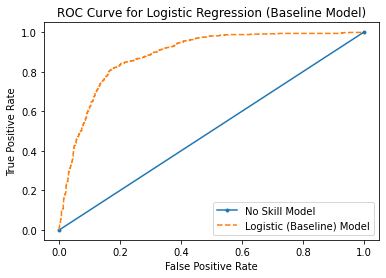

Training accuracy of Logistic Regression:  0.82
Testing accuracy of Logistic Regression:  0.82


In [36]:
# fit logistic model with default hyperparameters

## model training
classifier = LogisticRegression(random_state=0)
logistic_model = classifier.fit(X_train, y_train)


## prediction
predictions_training = logistic_model.predict(X_train)
score=cross_val_score(LogisticRegression(random_state=0),X_train_new, y_train, cv=ssplit)
predictions_training_CV=score.mean()     
predictions_testing = logistic_model.predict(X_test)

## Confusion Matrix
cm = confusion_matrix(y_test, predictions_testing)
print("Confusion Matrix : \n", cm)

## Classification Report
print(classification_report(y_test, predictions_testing))

## probability of falling into a particular class from each observation
probs = logistic_model.predict_proba(X_test)
probs = probs[:,1]

## AUC (Area Under Curve) Score
auc_score = roc_auc_score(y_test, probs)
print("Logistic Model (baseline) ROC AUC = ",format(auc_score,"0.2f"))


## no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
ns_auc = roc_auc_score(y_test, ns_probs)
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
plt.plot(ns_fpr, ns_tpr, marker='.', label='No Skill Model')

## ROC Curve
fpr, tpr, _ = roc_curve(y_test, probs)
plt.plot(fpr, tpr, linestyle='--', label='Logistic (Baseline) Model')
plt.title("ROC Curve for Logistic Regression (Baseline Model)")

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show legend
plt.legend()
# show the plot
plt.show()

In [197]:
## Training and Tesing Accuracy
print("Training accuracy of Logistic Regression: ", format(accuracy_score(y_train,predictions_training),"0.2f"))
print("Training accuracy of Logistic Regression from Cross Validation: ", format(predictions_training_CV,"0.2f"))
print("Testing accuracy of Logistic Regression: ", format(accuracy_score(y_test, predictions_testing),"0.2f")) 

Training accuracy of Logistic Regression:  0.82
Training accuracy of Logistic Regression from Cross Validation:  0.83
Testing accuracy of Logistic Regression:  0.82


- **Quite good training and testing accuracy**. Here **seems no such overfitting issue**.
- Next we will do feature scaling which we skipped in baseline model. But now we are going to use some algorithms which will require feature scaling.
- Next we will perform some **new feature creation** from **EDA, Weight of Evidence** techniques and **score** of being anomalous of an observation from **Isolation Forest**.
- Then we'll **fit some different models, perform hyperparameter tuning**.
- Finally apply **Voting Classifier** Algorithm **to get final result**.
- We'll **apply all told process over base training data *X_train***.

# Feature Creation

## ***From EDA of Extracted Features***

In [37]:
X_train.describe()

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath
count,8000.000000,8000.00000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000
mean,70.017875,1.82125,2.441750,0.319000,0.073125,0.266375,0.002250,0.140875,5.775875,0.000375,0.013250,0.988625,0.017625,0.586125,0.447125,18.828500,35.574125,8.348375,0.000875
std,33.082898,3.13740,1.346322,1.101654,0.628154,1.100146,0.047384,0.552329,9.557487,0.019362,0.114351,0.106052,0.131592,0.727941,1.332264,8.101623,24.652190,23.891575,0.029569
min,12.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000
25%,48.000000,0.00000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,14.000000,18.000000,0.000000,0.000000
50%,62.000000,0.00000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,18.000000,30.000000,0.000000,0.000000
75%,83.000000,2.00000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,22.000000,48.000000,0.000000,0.000000
max,253.000000,55.00000,21.000000,16.000000,19.000000,22.000000,1.000000,9.000000,111.000000,1.000000,1.000000,1.000000,1.000000,14.000000,23.000000,137.000000,161.000000,188.000000,1.000000


In [38]:
# Combine scaled training and testing data
X_tr_y_tr = pd.concat([X_train,y_train], axis=1)

#### ***Stacked Bar Plot from Crosstab***

UrlLength,12,13,14,15,17,18,19,20,21,22,...,241,242,244,245,247,248,249,251,252,253
CLASS_LABEL,,,,,,,,,,,,,,,,,,,,,
0,0.024925,0.024925,0.024925,0.04985,0.04985,0.074776,0.174477,0.074776,0.523430,0.199402,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.050150,0.025075,0.125376,...,0.025075,0.025075,0.025075,0.025075,0.025075,0.05015,0.025075,0.025075,0.075226,0.025075


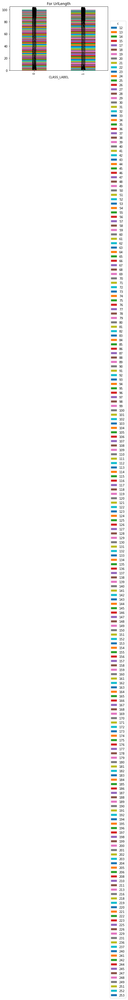

NumDash,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,23,24,26,55
CLASS_LABEL,,,,,,,,,,,,,,,,,,,,,
0,40.952144,12.288136,7.627119,5.882353,5.259222,5.009970,5.333998,4.012961,3.564307,2.617149,...,0.373878,0.274177,0.174477,0.224327,0.04985,0.074776,0.124626,0.024925,0.024925,0.024925
1,59.528586,28.861585,6.143430,2.081244,1.078235,1.730191,0.150451,0.100301,0.025075,0.025075,...,0.075226,0.000000,0.000000,0.000000,0.00000,0.025075,0.000000,0.000000,0.000000,0.000000


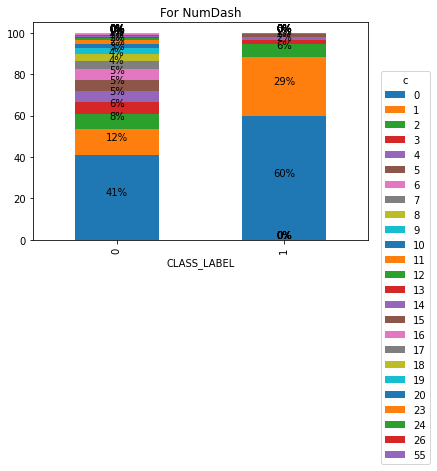

NumDots,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,21
CLASS_LABEL,,,,,,,,,,,,,,,,,
0,30.757727,41.076770,23.255234,3.489531,0.897308,0.174477,0.249252,0.074776,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.024925
1,8.224674,40.270812,31.143430,12.763290,3.711133,1.730191,0.651956,0.401204,0.200602,0.100301,0.125376,0.150451,0.075226,0.175527,0.250752,0.025075,0.000000


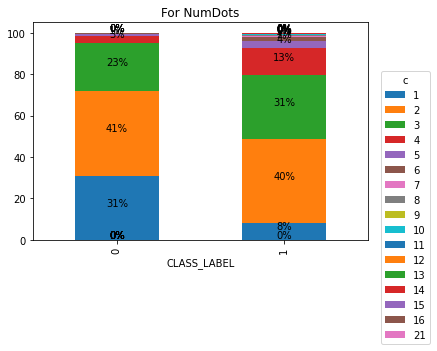

NumUnderscore,0,1,2,3,4,5,6,7,8,9,10,11,12,14,16
CLASS_LABEL,,,,,,,,,,,,,,,
0,82.801595,7.328016,4.835494,1.769691,0.972084,0.797607,0.398804,0.299103,0.249252,0.149551,0.149551,0.124626,0.074776,0.024925,0.024925
1,89.819458,6.043129,1.529589,0.977934,0.476429,0.351053,0.150451,0.601805,0.050150,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


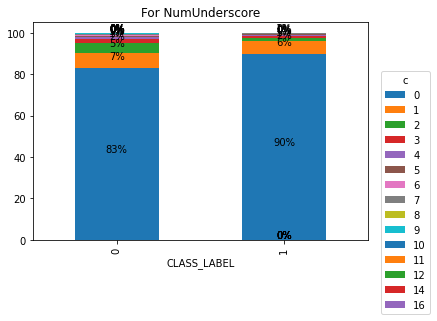

NumPercent,0,1,2,3,4,5,6,7,8,13,15,16,19
CLASS_LABEL,,,,,,,,,,,,,
0,96.410768,1.121635,1.196411,0.398804,0.174477,0.099701,0.074776,0.224327,0.174477,0.024925,0.04985,0.024925,0.024925
1,98.244734,1.003009,0.351053,0.125376,0.150451,0.100301,0.025075,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000


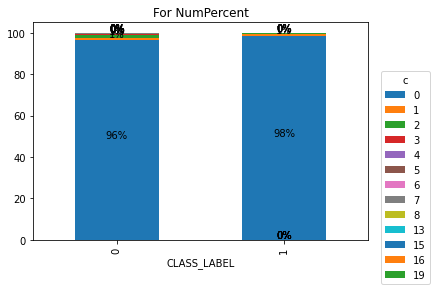

NumAmpersand,0,1,2,3,4,5,6,7,8,9,10,11,12,14,22
CLASS_LABEL,,,,,,,,,,,,,,,
0,84.845464,6.181456,4.511466,1.595214,1.246261,0.623131,0.747757,0.149551,0.024925,0.024925,0.024925,0.00000,0.000000,0.000000,0.024925
1,95.185557,1.529589,1.178536,0.401204,0.351053,0.150451,0.250752,0.175527,0.100301,0.125376,0.075226,0.05015,0.401204,0.025075,0.000000


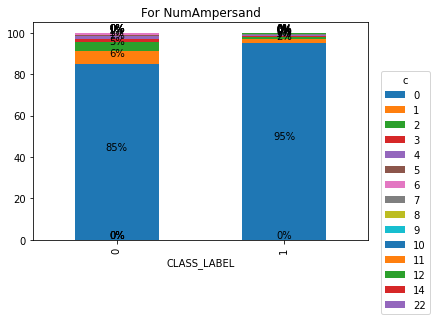

NumHash,0,1
CLASS_LABEL,,
0,100.000000,0.000000
1,99.548646,0.451354


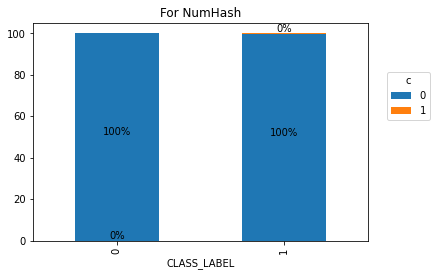

NumDashInHostname,0,1,2,3,4,5,6,7,9
CLASS_LABEL,,,,,,,,,
0,94.940179,4.536391,0.398804,0.099701,0.000000,0.024925,0.00000,0.000000,0.000000
1,86.233701,10.205617,1.078235,0.300903,2.006018,0.025075,0.05015,0.075226,0.025075


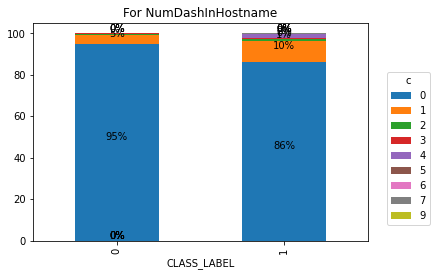

NumNumericChars,0,1,2,3,4,5,6,7,8,9,...,73,74,75,76,77,78,82,87,88,111
CLASS_LABEL,,,,,,,,,,,,,,,,,,,,,
0,28.015952,3.489531,3.863410,4.636092,7.577268,6.854437,9.995015,5.358923,10.294118,3.389831,...,0.000000,0.000000,0.000000,0.024925,0.000000,0.000000,0.000000,0.000000,0.024925,0.000000
1,57.698094,6.243731,3.134403,2.532598,4.137412,1.203611,1.354062,1.003009,0.451354,1.579739,...,0.025075,0.300903,0.025075,0.025075,0.100301,0.025075,0.025075,0.025075,0.000000,0.025075


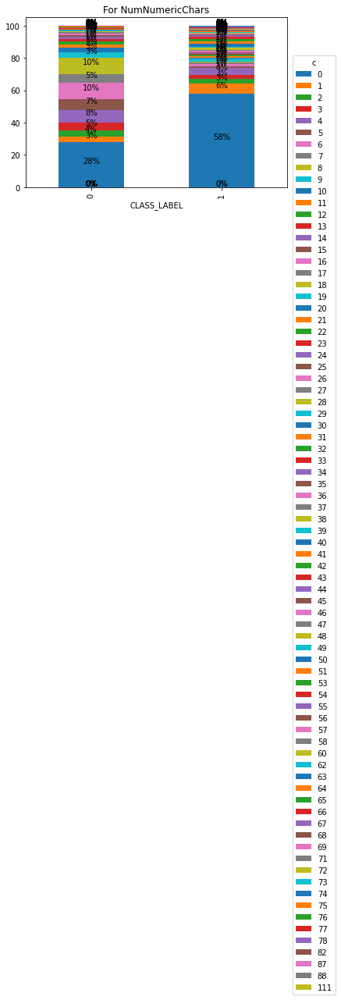

AtSymbol,0,1
CLASS_LABEL,,
0,99.925224,0.074776
1,100.000000,0.000000


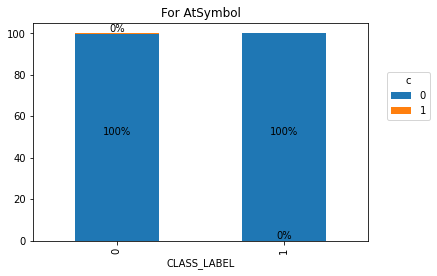

TildeSymbol,0,1
CLASS_LABEL,,
0,99.725823,0.274177
1,97.617854,2.382146


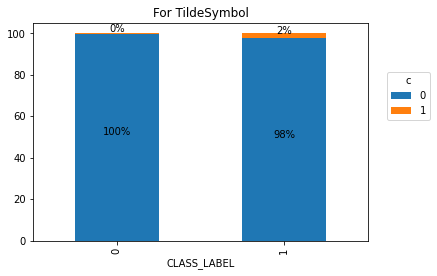

NoHttps,0,1
CLASS_LABEL,,
0,0.348953,99.651047
1,1.930792,98.069208


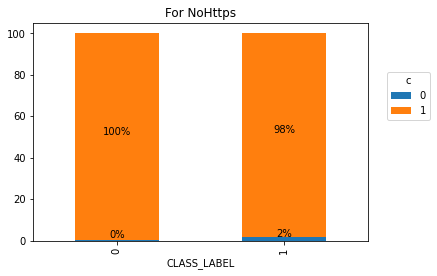

IpAddress,0,1
CLASS_LABEL,,
0,100.000000,0.000000
1,96.464393,3.535607


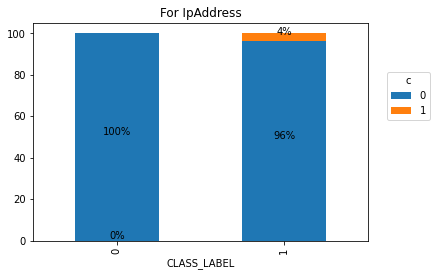

SubdomainLevel,0,1,2,3,4,5,6,7,8,9,10,11,14
CLASS_LABEL,,,,,,,,,,,,,
0,46.510469,50.947159,2.367896,0.124626,0.049850,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
1,49.523571,45.561685,3.134403,0.351053,0.551655,0.100301,0.501505,0.125376,0.05015,0.025075,0.025075,0.025075,0.025075


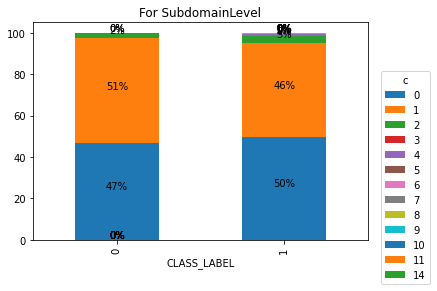

NumQueryComponents,0,1,2,3,4,5,6,7,8,9,10,11,13,16,17,19,23
CLASS_LABEL,,,,,,,,,,,,,,,,,
0,72.582253,12.113659,6.106680,4.511466,1.694915,1.271186,0.648056,0.722832,0.224327,0.04985,0.024925,0.024925,0.000000,0.00000,0.00000,0.00000,0.024925
1,90.747242,4.488465,2.006018,0.626881,0.501505,0.325978,0.476429,0.175527,0.025075,0.05015,0.225677,0.100301,0.100301,0.05015,0.05015,0.05015,0.000000


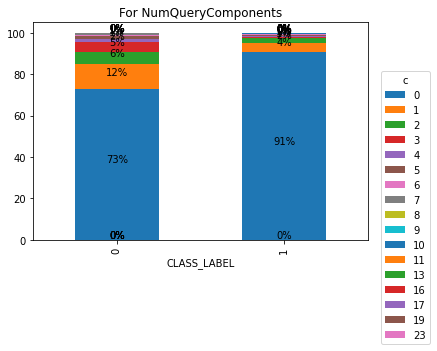

HostnameLength,4,5,6,7,8,9,10,11,12,13,...,73,75,76,83,84,86,94,109,115,137
CLASS_LABEL,,,,,,,,,,,,,,,,,,,,,
0,0.024925,0.04985,0.274177,0.772682,2.766700,1.620140,2.916251,4.162512,5.209372,6.904287,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
1,0.000000,0.00000,0.325978,0.300903,0.501505,0.827482,2.206620,3.084253,5.792377,6.594784,...,0.025075,0.025075,0.05015,0.025075,0.025075,0.025075,0.05015,0.025075,0.025075,0.025075


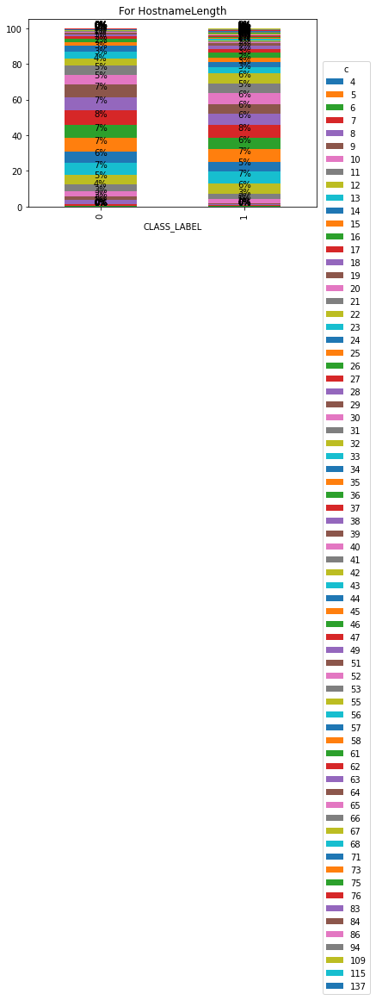

PathLength,0,1,2,3,4,5,6,7,8,9,...,141,143,145,146,148,152,154,156,159,161
CLASS_LABEL,,,,,,,,,,,,,,,,,,,,,
0,0.174477,6.106680,0.024925,0.099701,0.049850,0.299103,0.897308,0.997009,0.897308,1.121635,...,0.000000,0.024925,0.024925,0.024925,0.024925,0.024925,0.024925,0.024925,0.04985,0.024925
1,0.025075,0.351053,0.000000,0.075226,0.802407,0.877633,1.078235,0.401204,1.153460,1.680040,...,0.025075,0.000000,0.000000,0.000000,0.050150,0.000000,0.000000,0.000000,0.00000,0.000000


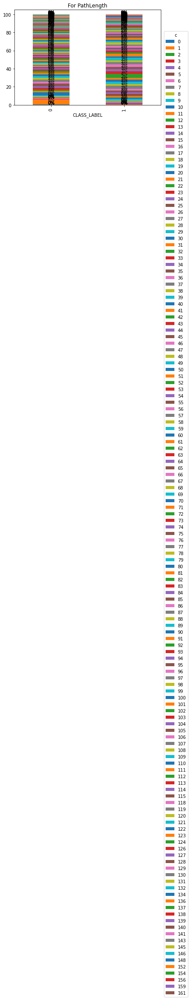

QueryLength,0,1,2,3,4,5,6,7,8,9,...,162,163,165,166,169,174,179,180,183,188
CLASS_LABEL,,,,,,,,,,,,,,,,,,,,,
0,71.535394,0.000000,0.000000,0.074776,0.024925,0.348953,1.121635,0.972084,1.046859,0.648056,...,0.024925,0.000000,0.024925,0.024925,0.024925,0.024925,0.000000,0.000000,0.000000,0.024925
1,89.267803,0.025075,0.025075,0.200602,0.275827,0.100301,0.150451,0.401204,0.025075,0.175527,...,0.000000,0.075226,0.000000,0.000000,0.000000,0.426279,0.025075,0.025075,0.025075,0.000000


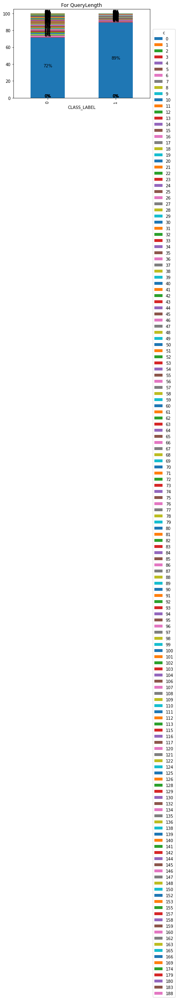

DoubleSlashInPath,0,1
CLASS_LABEL,,
0,99.975075,0.024925
1,99.849549,0.150451


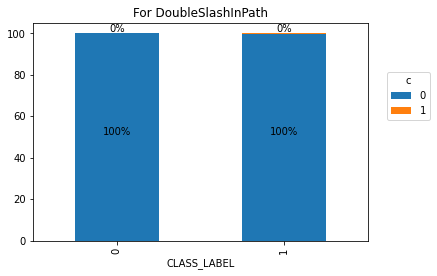

CLASS_LABEL,0,1
CLASS_LABEL,,
0,100.0,0.0
1,0.0,100.0


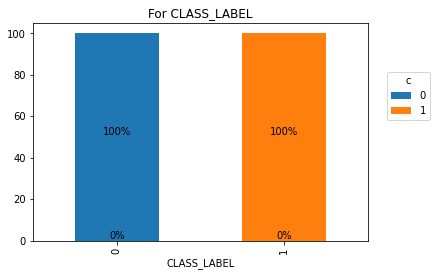

In [39]:
for col in X_tr_y_tr:
    pal = ['royalblue','lightblue']
    crstb_2 = pd.crosstab(X_tr_y_tr['CLASS_LABEL'], X_tr_y_tr[col]).apply(lambda r: r/r.sum()*100, axis=1)
    ax_1=crstb_2.plot.bar(stacked = True)
    display(crstb_2)

    plt.legend(bbox_to_anchor=(1.2,0.8),title='c')
    plt.title('For {}'.format(col))

    for rec in ax_1.patches:
        height=rec.get_height()
        ax_1.text(rec.get_x()+rec.get_width() / 2,
             rec.get_y()+height / 2,
             "{:.0f}%".format(height),
             ha='center',
             va='bottom')
    
    plt.show() 

#### ***Countplot for All Features as well as Target Variable***

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


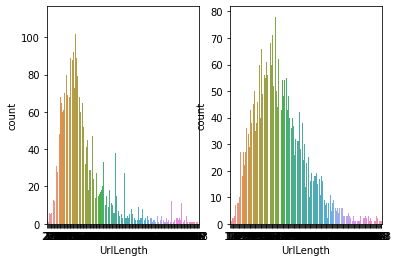

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


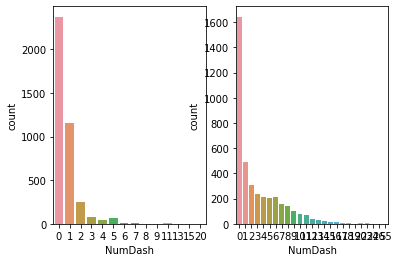

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


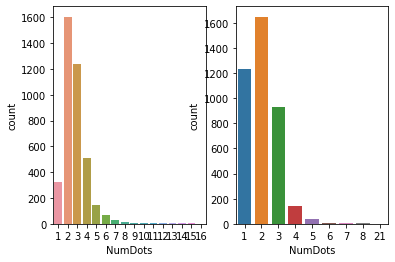

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


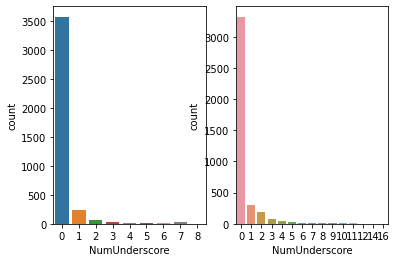

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


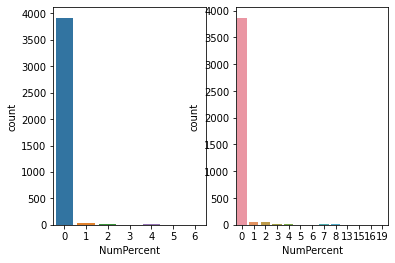

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


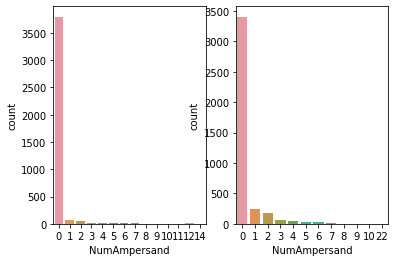

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


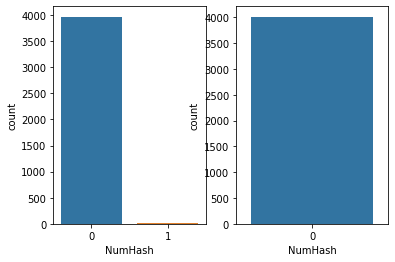

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


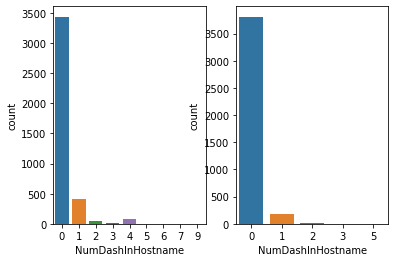

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


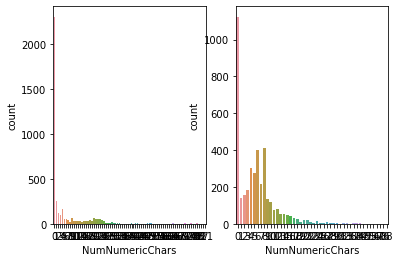

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


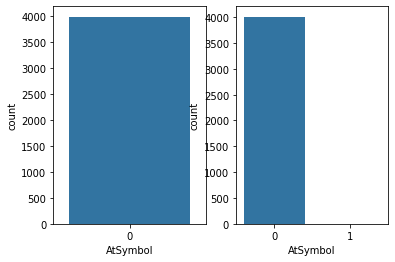

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


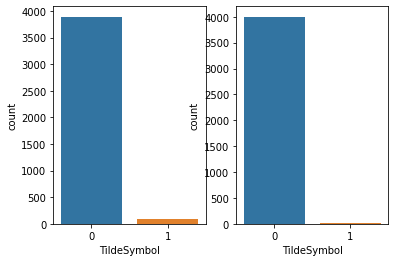

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


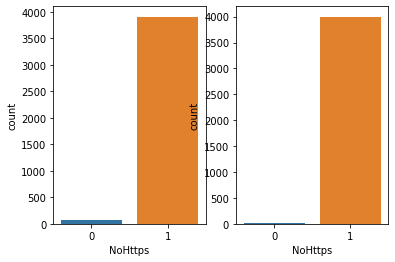

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


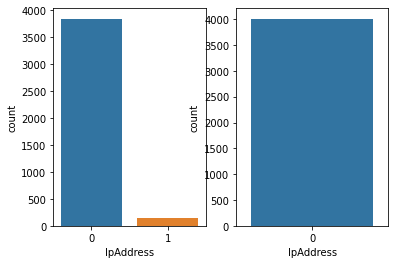

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


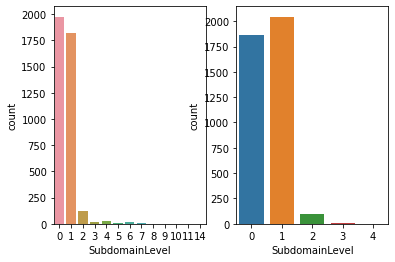

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


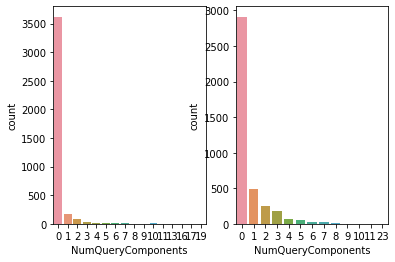

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


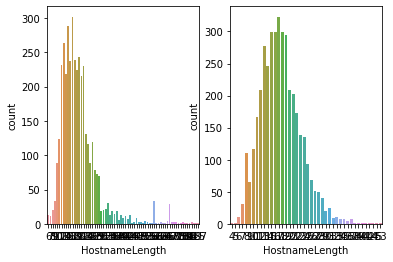

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


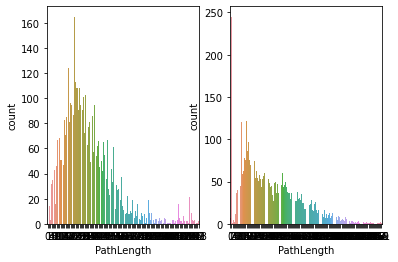

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


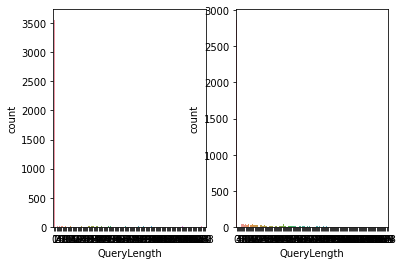

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


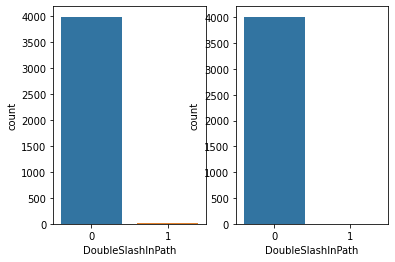

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


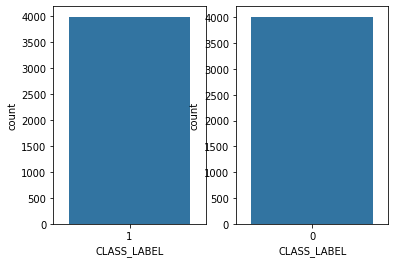

In [40]:
for col in X_tr_y_tr:
    
    fig, ax=plt.subplots(1,2)
    sns.countplot(X_tr_y_tr[X_tr_y_tr['CLASS_LABEL']==1][col],orient="v", ax=ax[0])
    sns.countplot(X_tr_y_tr[X_tr_y_tr['CLASS_LABEL']==0][col],orient="v", ax=ax[1])
    plt.show()

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


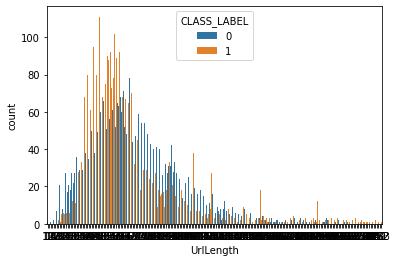

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


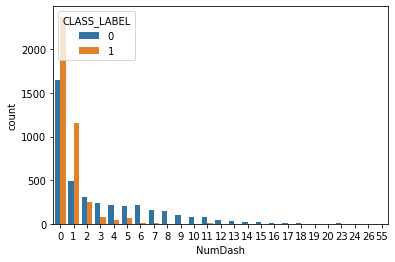

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


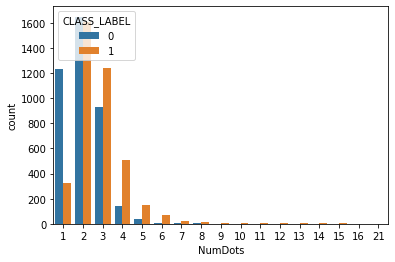

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


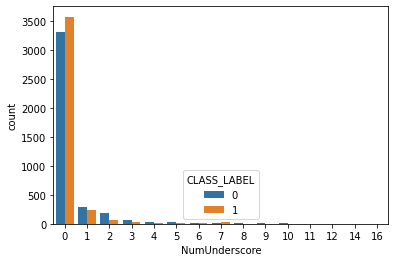

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


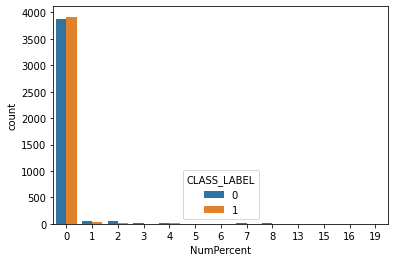

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


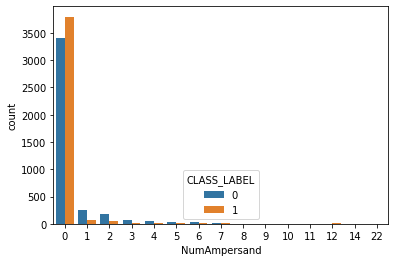

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


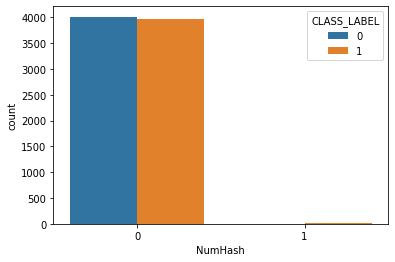

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


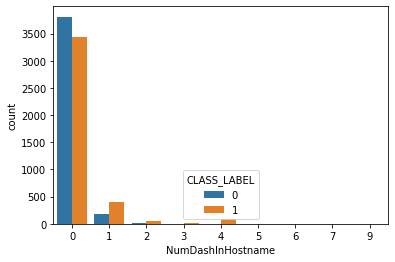

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


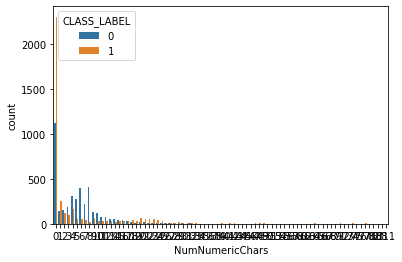

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


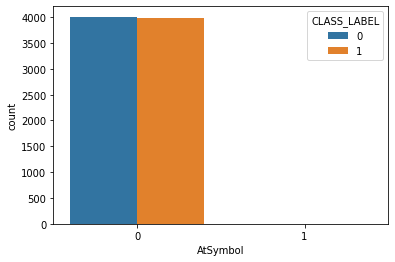

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


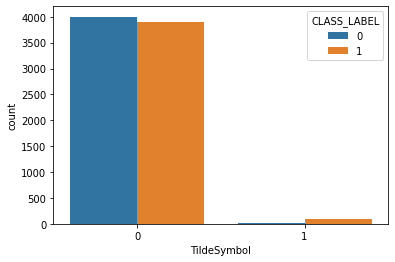

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


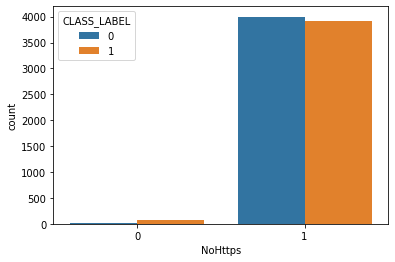

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


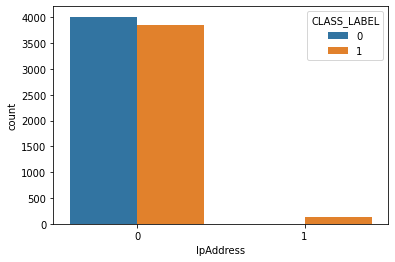

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


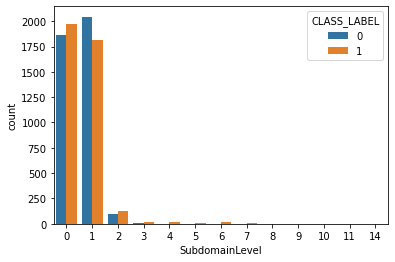

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


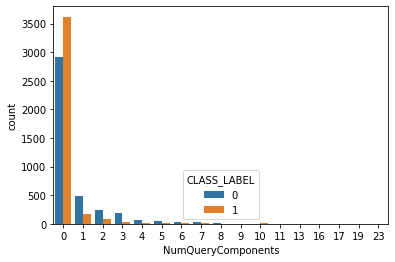

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


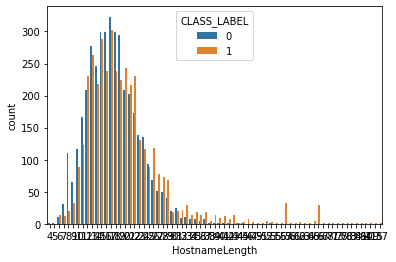

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


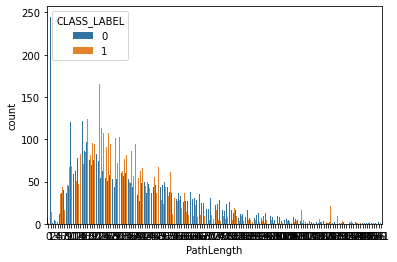

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


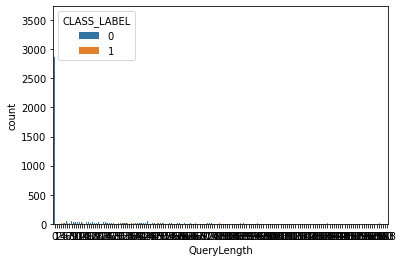

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


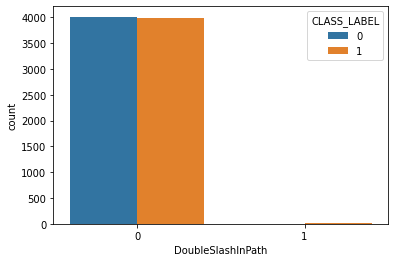

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


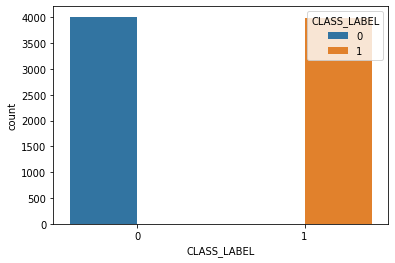

In [41]:
for col in X_tr_y_tr:
    sns.countplot(col,hue='CLASS_LABEL',data=X_tr_y_tr)
    plt.show()

#### ***Boxplot***

In [42]:
X_tr_y_tr['CLASS_LABEL']=X_tr_y_tr['CLASS_LABEL'].astype(int)

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


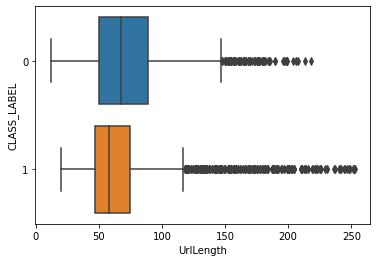

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


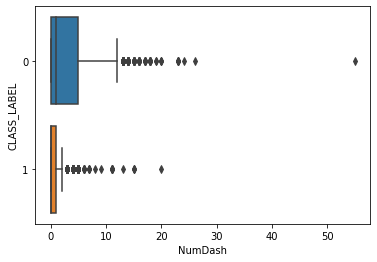

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


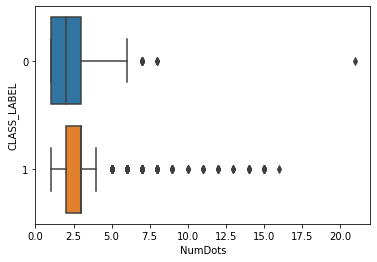

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


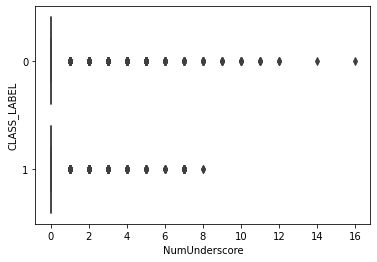

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


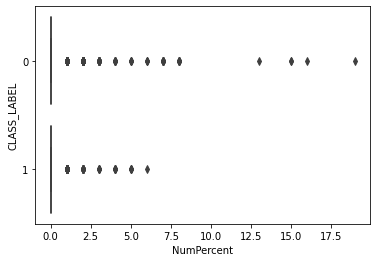

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


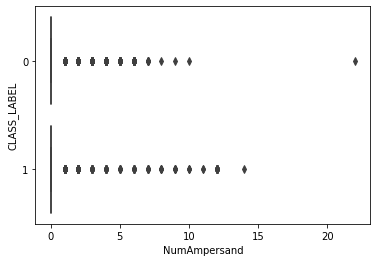

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


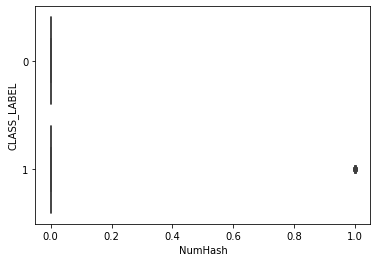

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


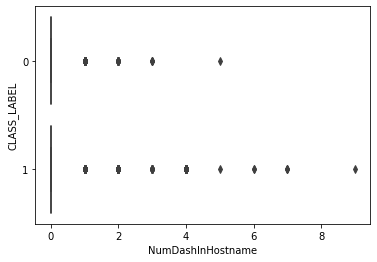

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


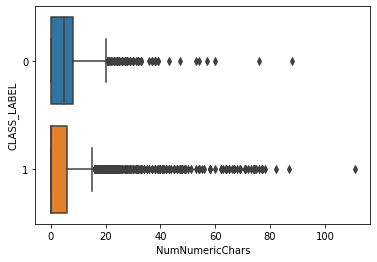

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


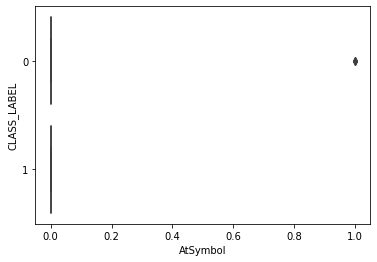

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


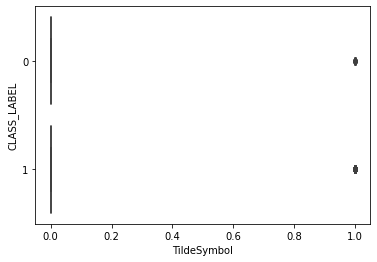

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


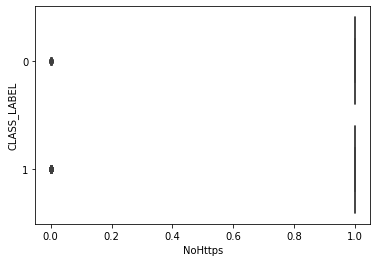

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


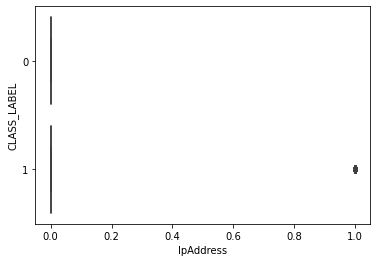

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


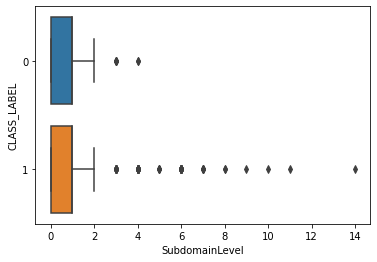

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


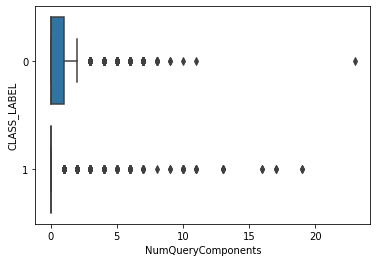

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


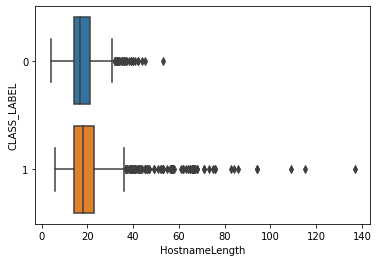

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


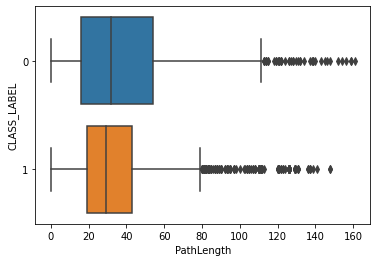

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


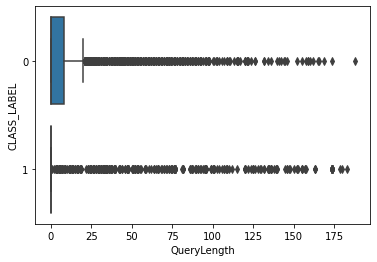

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


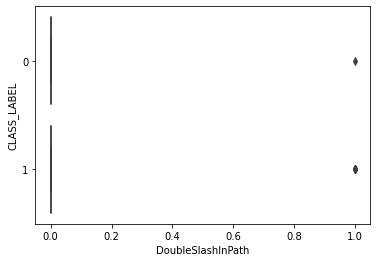

In [43]:
for col in X_train:
    sns.boxplot(X_train[col], X_tr_y_tr['CLASS_LABEL'], orient='h')
    plt.show()

#### ***Pairplot***

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


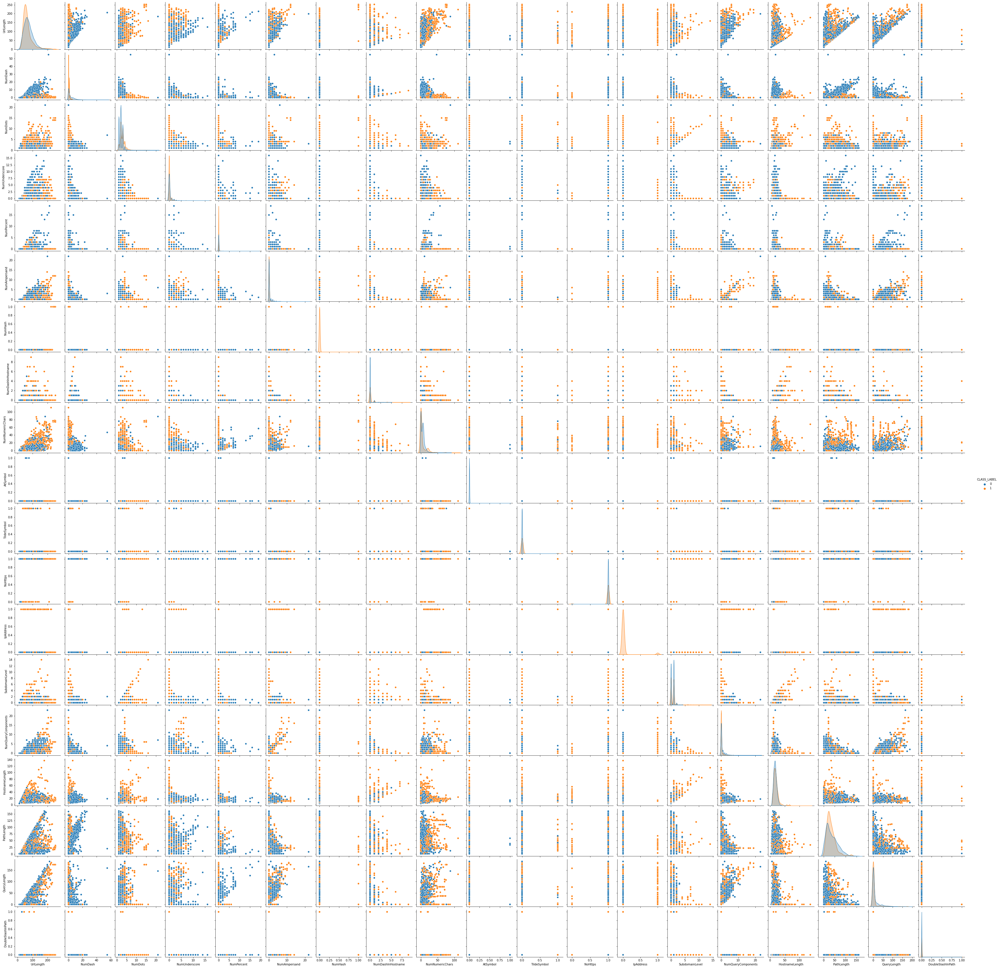

In [44]:
sns.pairplot(hue='CLASS_LABEL',data=X_tr_y_tr)

#### ***Newly Created Features from EDA***

In [45]:
# Newly created features from EDA. We'll add them as new columns in base scaled training data
c1 = np.where(X_train['NumDots']>=4,1,0)
c2 = np.where(X_train['SubdomainLevel']>=3,1,0)
c3 = np.where(X_train['NumDash']<=1,1,0)
c4 = np.where(X_train['NumQueryComponents']==0,1,0)
c5 = np.where(X_train['NumNumericChars']==0,1,0)

In [46]:
# create new dataframe for new features
new_features = pd.concat([pd.DataFrame(c1,columns=["NumDots_GrtrEql_4_EDA"]),pd.DataFrame(c2,columns=["SubdomainLevel_GrtrEql_3_EDA"]),pd.DataFrame(c3,columns=["NumDash_LsEql_1_EDA"]),pd.DataFrame(c4,columns=["NumQueryComponents==0_EDA"]),pd.DataFrame(c5,columns=["NumNumericChars==0_EDA"])], axis=1)

In [47]:
new_features

,NumDots_GrtrEql_4_EDA,SubdomainLevel_GrtrEql_3_EDA,NumDash_LsEql_1_EDA,NumQueryComponents==0_EDA,NumNumericChars==0_EDA
0,0,0,1,1,0
1,0,0,1,1,0
2,0,0,1,1,0
3,0,0,0,1,0
4,0,0,0,0,0
...,...,...,...,...,...
7995,0,0,1,0,0
7996,0,0,1,0,0
7997,0,0,1,1,0
7998,0,0,1,1,1


## ***From Weight of Imbalanced Method***

In [51]:
import scorecardpy as sc

In [52]:
# we are using here following combined X_train and y_train
X_tr_y_tr

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,CLASS_LABEL
9254,41,0,2,0,0,0,0,0,4,0,0,1,0,1,0,24,10,0,0,0
1561,40,0,3,0,1,0,0,0,3,0,0,1,0,1,0,13,20,0,0,1
1670,53,0,3,0,0,0,0,0,6,0,0,1,0,0,0,17,29,0,0,1
6087,89,12,3,0,0,0,0,0,14,0,0,1,0,1,0,16,66,0,0,0
6669,101,6,1,3,0,0,0,0,6,0,0,1,0,0,1,11,49,33,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,60,0,2,0,0,1,0,0,6,0,0,1,0,0,2,23,13,16,0,0
5191,116,1,3,2,1,6,0,0,5,0,0,1,0,1,7,16,14,78,0,0
5390,60,1,1,0,0,0,0,0,6,0,0,1,0,0,0,18,35,0,0,0
860,50,0,2,1,0,0,0,0,0,0,0,1,0,0,0,19,24,0,0,1


In [53]:
y = 'CLASS_LABEL'

In [54]:
bins = sc.woebin(X_tr_y_tr,y)

[INFO] creating woe binning ...
Binning on 8000 rows and 20 columns in 00:00:14


In [55]:
bins

{'HostnameLength':          variable          bin  count  count_distr  good   bad   badprob  \
 0  HostnameLength  [-inf,11.0)    504     0.063000   338   166  0.329365   
 1  HostnameLength  [11.0,20.0)   4540     0.567500  2413  2127  0.468502   
 2  HostnameLength  [20.0,26.0)   1976     0.247000   951  1025  0.518725   
 3  HostnameLength  [26.0,30.0)    549     0.068625   210   339  0.617486   
 4  HostnameLength   [30.0,inf)    431     0.053875   100   331  0.767981   
 
         woe    bin_iv  total_iv breaks  is_special_values  
 0 -0.705058  0.030051  0.125548   11.0              False  
 1 -0.120158  0.008182  0.125548   20.0              False  
 2  0.080934  0.001617  0.125548   26.0              False  
 3  0.484893  0.015838  0.125548   30.0              False  
 4  1.202948  0.069860  0.125548    inf              False  ,
 'QueryLength':       variable         bin  count  count_distr  good   bad   badprob  \
 0  QueryLength  [-inf,6.0)   6473     0.809125  2888  3585  0.

{'HostnameLength': <Figure size 432x288 with 2 Axes>,
 'QueryLength': <Figure size 432x288 with 2 Axes>,
 'NumHash': <Figure size 432x288 with 2 Axes>,
 'SubdomainLevel': <Figure size 432x288 with 2 Axes>,
 'NumNumericChars': <Figure size 432x288 with 2 Axes>,
 'NumQueryComponents': <Figure size 432x288 with 2 Axes>,
 'TildeSymbol': <Figure size 432x288 with 2 Axes>,
 'NumPercent': <Figure size 432x288 with 2 Axes>,
 'DoubleSlashInPath': <Figure size 432x288 with 2 Axes>,
 'NumDashInHostname': <Figure size 432x288 with 2 Axes>,
 'NumDots': <Figure size 432x288 with 2 Axes>,
 'AtSymbol': <Figure size 432x288 with 2 Axes>,
 'NumUnderscore': <Figure size 432x288 with 2 Axes>,
 'NumAmpersand': <Figure size 432x288 with 2 Axes>,
 'IpAddress': <Figure size 432x288 with 2 Axes>,
 'NoHttps': <Figure size 432x288 with 2 Axes>,
 'PathLength': <Figure size 432x288 with 2 Axes>,
 'NumDash': <Figure size 432x288 with 2 Axes>,
 'UrlLength': <Figure size 432x288 with 2 Axes>}

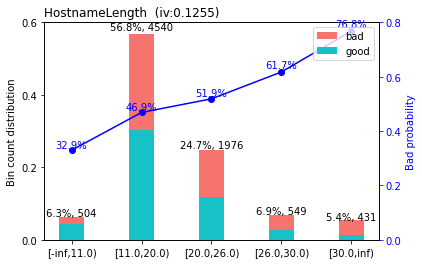

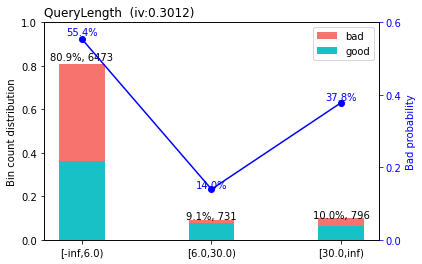

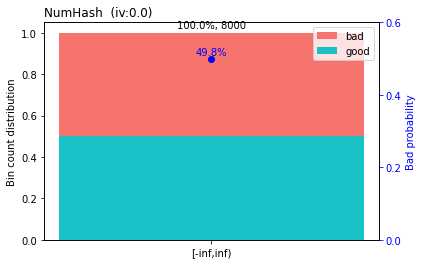

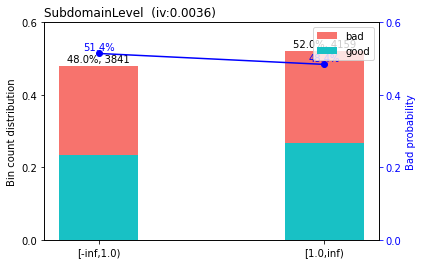

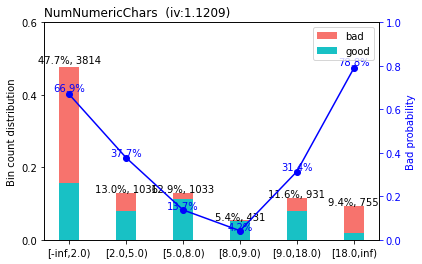

...

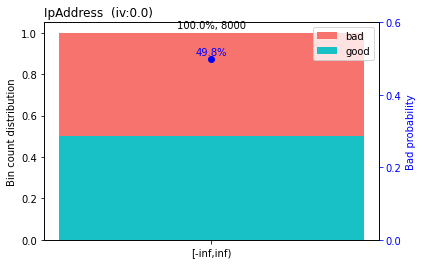

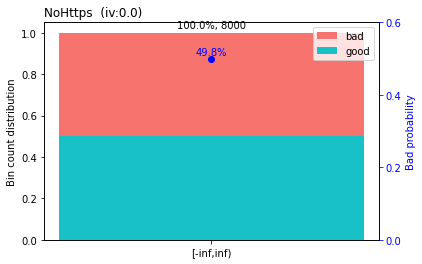

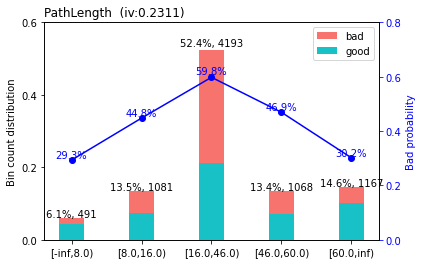

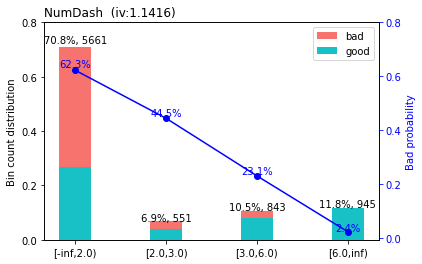

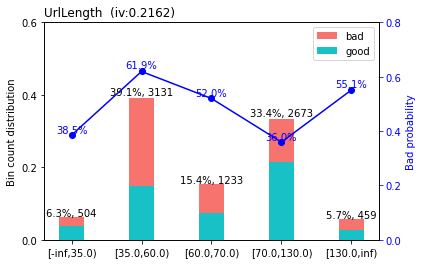

In [56]:
sc.woebin_plot(bins)

In [57]:
X_tr_y_tr.columns

Index(['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumHash', 'NumDashInHostname', 'NumNumericChars',
       'AtSymbol', 'TildeSymbol', 'NoHttps', 'IpAddress', 'SubdomainLevel',
       'NumQueryComponents', 'HostnameLength', 'PathLength', 'QueryLength',
       'DoubleSlashInPath', 'CLASS_LABEL'],
      dtype='object')

In [58]:
woe_data = bins['UrlLength'].append(bins['NumDash']).append(bins['NumDots']).append(bins['NumUnderscore']).append(bins['NumPercent']).append(bins['NumAmpersand']).append(bins['NumHash']).append(bins['NumDashInHostname']).append(bins['NumNumericChars']).append(bins['AtSymbol']).append(bins['TildeSymbol']).append(bins['NoHttps']).append(bins['IpAddress']).append(bins['SubdomainLevel']).append(bins['NumQueryComponents']).append(bins['HostnameLength']).append(bins['PathLength']).append(bins['QueryLength']).append(bins['DoubleSlashInPath'])

In [59]:
woe_data

,variable,bin,count,count_distr,good,bad,badprob,woe,bin_iv,total_iv,breaks,is_special_values
0,UrlLength,"[-inf,35.0)",504,0.063000,310,194,0.384921,-0.462714,0.013244,0.216212,35.0,False
1,UrlLength,"[35.0,60.0)",3131,0.391375,1192,1939,0.619291,0.492540,0.093139,0.216212,60.0,False
2,UrlLength,"[60.0,70.0)",1233,0.154125,592,641,0.519870,0.085523,0.001127,0.216212,70.0,False
3,UrlLength,"[70.0,130.0)",2673,0.334125,1712,961,0.359521,-0.571443,0.106144,0.216212,130.0,False
4,UrlLength,"[130.0,inf)",459,0.057375,206,253,0.551198,0.211513,0.002558,0.216212,inf,False
0,NumDash,"[-inf,2.0)",5661,0.707625,2136,3525,0.622682,0.506946,0.178191,1.141578,2.0,False
1,NumDash,"[2.0,3.0)",551,0.068875,306,245,0.444646,-0.216327,0.003210,1.141578,3.0,False
2,NumDash,"[3.0,6.0)",843,0.105375,648,195,0.231317,-1.194891,0.134567,1.141578,6.0,False
3,NumDash,"[6.0,inf)",945,0.118125,922,23,0.024339,-3.685051,0.825611,1.141578,inf,False
0,NumDots,"[-inf,2.0)",1562,0.195250,1234,328,0.209987,-1.319003,0.297212,0.540167,2.0,False


Now we will create new features taking weights of each intervals as new feature.

In [60]:
new_features['UrlLength_WOE'] = [-0.462714 if i<35 else 0.492540 if 35<=i<60 else 0.085523 if 60<=i<70 else -0.571443 if 70<=i<130 else 0.211513 for i in X_train['UrlLength']]
new_features['NumDash_WOE'] = [0.506946 if i<2 else -0.216327 if 2<=i<3 else -1.194891 if 3<=i<6 else -3.685051 for i in X_train['NumDash']]
new_features['NumDots_WOE'] = [-1.319003 if i<2 else -0.019816 if 2<=i<3 else 0.292073 if 3<=i<4 else 1.422297 for i in X_train['NumDots']]
new_features['NumUnderscore_WOE'] = [0.081354 if i<1 else -0.192783 if 1<=i<2 else -0.869469 for i in X_train['NumUnderscore']]
new_features['NumPercent_WOE'] = [0.00000 for i in X_train['NumPercent']]
new_features['NumAmpersand_WOE'] = [0.114997 if i<1 else -1.146679 for i in X_train['NumAmpersand']]
new_features['NumHash_WOE'] = [0.000000 for i in X_train['NumHash']]
new_features['NumDashInHostname_WOE'] = [-0.096186 if i<1 else 1.000892 for i in X_train['NumDashInHostname']]
new_features['NumNumericChars_WOE'] = [0.707812 if i<2 else -0.494543 if 2<=i<5 else -1.830517 if 5<=i<8 else -3.127076 if 8<=i<9 else -0.777151 if 9<=i<18 else 1.319388 for i in X_train['NumNumericChars']]
new_features['AtSymbol_WOE'] = [0.000000 for i in X_train['AtSymbol']]
new_features['TildeSymbol_WOE'] = [0.000000 for i in X_train['TildeSymbol']]
new_features['NoHttps_WOE'] = [0.000000 for i in X_train['NoHttps']]
new_features['IpAddress_WOE'] = [0.000000 for i in X_train['IpAddress']]
new_features['SubdomainLevel_WOE'] = [0.062771 if i<1 else -0.057979 for i in X_train['SubdomainLevel']]
new_features['NumQueryComponents_WOE'] = [0.223358 if i<1 else -0.992823 if 1<=i<2 else -1.166971 for i in X_train['NumQueryComponents']]
new_features['HostnameLength_WOE'] = [-0.705058 if i<11 else -0.120158 if 11<=i<20 else 0.080934 if 20<=i<26 else 0.484893 if 26<=i<30 else 1.202948 for i in X_train['HostnameLength']]
new_features['PathLength_WOE'] = [-0.873511 if i<8 else -0.203832 if 8<=i<16 else 0.402728 if 16<=i<46 else -0.117753 if 46<=i<60 else -0.833557 for i in X_train['PathLength']]
new_features['QueryLength_WOE'] = [0.222194 if i<6 else -1.813158 if 6<=i<30 else -0.491447 for i in X_train['QueryLength']]
new_features['DoubleSlashInPath_WOE'] = [0.000000 for i in X_train['DoubleSlashInPath']]

In [61]:
new_features.head()

,NumDots_GrtrEql_4_EDA,SubdomainLevel_GrtrEql_3_EDA,NumDash_LsEql_1_EDA,NumQueryComponents==0_EDA,NumNumericChars==0_EDA,UrlLength_WOE,NumDash_WOE,NumDots_WOE,NumUnderscore_WOE,NumPercent_WOE,...,AtSymbol_WOE,TildeSymbol_WOE,NoHttps_WOE,IpAddress_WOE,SubdomainLevel_WOE,NumQueryComponents_WOE,HostnameLength_WOE,PathLength_WOE,QueryLength_WOE,DoubleSlashInPath_WOE
0,0,0,1,1,0,0.492540,0.506946,-0.019816,0.081354,0.0,...,0.0,0.0,0.0,0.0,-0.057979,0.223358,0.080934,-0.203832,0.222194,0.0
1,0,0,1,1,0,0.492540,0.506946,0.292073,0.081354,0.0,...,0.0,0.0,0.0,0.0,-0.057979,0.223358,-0.120158,0.402728,0.222194,0.0
2,0,0,1,1,0,0.492540,0.506946,0.292073,0.081354,0.0,...,0.0,0.0,0.0,0.0,0.062771,0.223358,-0.120158,0.402728,0.222194,0.0
3,0,0,0,1,0,-0.571443,-3.685051,0.292073,0.081354,0.0,...,0.0,0.0,0.0,0.0,-0.057979,0.223358,-0.120158,-0.833557,0.222194,0.0
4,0,0,0,0,0,-0.571443,-3.685051,-1.319003,-0.869469,0.0,...,0.0,0.0,0.0,0.0,0.062771,-0.992823,-0.120158,-0.117753,-0.491447,0.0


## ***Score from Isolation Forest***

In [62]:
from sklearn.ensemble import IsolationForest

# we will use all 19 base features
x = X_train.values

clf = IsolationForest(contamination= 0.5, random_state=0)
predictions = clf.fit_predict(x)
print(predictions)
dec_fun = clf.decision_function(x)
dec_fun

[ 1 -1  1 ...  1  1 -1]


array([ 0.01084061, -0.0153454 ,  0.02005838, ...,  0.01214691,
        0.01542345, -0.01463725])

In [63]:
# dec_fun is numpy array, coverting it to dataframe to add with X_train_new
df = pd.DataFrame(dec_fun, columns = ["ISF_Score"])

In [64]:
df

,ISF_Score
0,0.010841
1,-0.015345
2,0.020058
3,-0.061994
4,-0.085792
...,...
7995,-0.038894
7996,-0.217670
7997,0.012147
7998,0.015423


In [65]:
new_features=pd.concat([new_features,df],axis=1)

In [66]:
# All Newly Created Features
new_features

,NumDots_GrtrEql_4_EDA,SubdomainLevel_GrtrEql_3_EDA,NumDash_LsEql_1_EDA,NumQueryComponents==0_EDA,NumNumericChars==0_EDA,UrlLength_WOE,NumDash_WOE,NumDots_WOE,NumUnderscore_WOE,NumPercent_WOE,...,TildeSymbol_WOE,NoHttps_WOE,IpAddress_WOE,SubdomainLevel_WOE,NumQueryComponents_WOE,HostnameLength_WOE,PathLength_WOE,QueryLength_WOE,DoubleSlashInPath_WOE,ISF_Score
0,0,0,1,1,0,0.492540,0.506946,-0.019816,0.081354,0.0,...,0.0,0.0,0.0,-0.057979,0.223358,0.080934,-0.203832,0.222194,0.0,0.010841
1,0,0,1,1,0,0.492540,0.506946,0.292073,0.081354,0.0,...,0.0,0.0,0.0,-0.057979,0.223358,-0.120158,0.402728,0.222194,0.0,-0.015345
2,0,0,1,1,0,0.492540,0.506946,0.292073,0.081354,0.0,...,0.0,0.0,0.0,0.062771,0.223358,-0.120158,0.402728,0.222194,0.0,0.020058
3,0,0,0,1,0,-0.571443,-3.685051,0.292073,0.081354,0.0,...,0.0,0.0,0.0,-0.057979,0.223358,-0.120158,-0.833557,0.222194,0.0,-0.061994
4,0,0,0,0,0,-0.571443,-3.685051,-1.319003,-0.869469,0.0,...,0.0,0.0,0.0,0.062771,-0.992823,-0.120158,-0.117753,-0.491447,0.0,-0.085792
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,0,0,1,0,0,0.085523,0.506946,-0.019816,0.081354,0.0,...,0.0,0.0,0.0,0.062771,-1.166971,0.080934,-0.203832,-1.813158,0.0,-0.038894
7996,0,0,1,0,0,-0.571443,0.506946,0.292073,-0.869469,0.0,...,0.0,0.0,0.0,-0.057979,-1.166971,-0.120158,-0.203832,-0.491447,0.0,-0.217670
7997,0,0,1,1,0,0.085523,0.506946,-1.319003,0.081354,0.0,...,0.0,0.0,0.0,0.062771,0.223358,-0.120158,0.402728,0.222194,0.0,0.012147
7998,0,0,1,1,1,0.492540,0.506946,-0.019816,-0.192783,0.0,...,0.0,0.0,0.0,0.062771,0.223358,-0.120158,0.402728,0.222194,0.0,0.015423


**Here, till now all new features are created based on base 19 features only.** Lets add this **new_features** dataframe with **X_train** dataframe.

In [67]:
## to avoid creating NaN values after concatenating
X_train.reset_index(drop=True,inplace=True)
new_features.reset_index(drop=True,inplace=True)

In [68]:
X_train_new =pd.concat([X_train, new_features], axis=1)

In [69]:
X_train_new

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,...,TildeSymbol_WOE,NoHttps_WOE,IpAddress_WOE,SubdomainLevel_WOE,NumQueryComponents_WOE,HostnameLength_WOE,PathLength_WOE,QueryLength_WOE,DoubleSlashInPath_WOE,ISF_Score
0,41,0,2,0,0,0,0,0,4,0,...,0.0,0.0,0.0,-0.057979,0.223358,0.080934,-0.203832,0.222194,0.0,0.010841
1,40,0,3,0,1,0,0,0,3,0,...,0.0,0.0,0.0,-0.057979,0.223358,-0.120158,0.402728,0.222194,0.0,-0.015345
2,53,0,3,0,0,0,0,0,6,0,...,0.0,0.0,0.0,0.062771,0.223358,-0.120158,0.402728,0.222194,0.0,0.020058
3,89,12,3,0,0,0,0,0,14,0,...,0.0,0.0,0.0,-0.057979,0.223358,-0.120158,-0.833557,0.222194,0.0,-0.061994
4,101,6,1,3,0,0,0,0,6,0,...,0.0,0.0,0.0,0.062771,-0.992823,-0.120158,-0.117753,-0.491447,0.0,-0.085792
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,60,0,2,0,0,1,0,0,6,0,...,0.0,0.0,0.0,0.062771,-1.166971,0.080934,-0.203832,-1.813158,0.0,-0.038894
7996,116,1,3,2,1,6,0,0,5,0,...,0.0,0.0,0.0,-0.057979,-1.166971,-0.120158,-0.203832,-0.491447,0.0,-0.217670
7997,60,1,1,0,0,0,0,0,6,0,...,0.0,0.0,0.0,0.062771,0.223358,-0.120158,0.402728,0.222194,0.0,0.012147
7998,50,0,2,1,0,0,0,0,0,0,...,0.0,0.0,0.0,0.062771,0.223358,-0.120158,0.402728,0.222194,0.0,0.015423


# Feature Selection

## ***Variance Threshold***

In [70]:
# import necessary library
from sklearn.feature_selection import VarianceThreshold

# we're setting variance threshold at 0
var_thres=VarianceThreshold(threshold=0)

# fitting this variance threshold in all columns of Newly Created  training data
var_thres.fit(X_train_new)

VarianceThreshold(threshold=0)

In [71]:
# get the number of constant columns (whoose variance is 0)

constant_columns = [column for column in X_train_new.columns if column not in X_train_new.columns[var_thres.get_support()]]
print(len(constant_columns))

7


In [72]:
# get boolean value 'False' for columns having constant nature
var_thres.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True, False,  True,  True, False, False, False,
       False,  True,  True,  True,  True,  True, False,  True])

In [73]:
# get the column names which remain in the Newly Created  training data
X_train_new.columns[var_thres.get_support()]

Index(['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumHash', 'NumDashInHostname', 'NumNumericChars',
       'AtSymbol', 'TildeSymbol', 'NoHttps', 'IpAddress', 'SubdomainLevel',
       'NumQueryComponents', 'HostnameLength', 'PathLength', 'QueryLength',
       'DoubleSlashInPath', 'NumDots_GrtrEql_4_EDA',
       'SubdomainLevel_GrtrEql_3_EDA', 'NumDash_LsEql_1_EDA',
       'NumQueryComponents==0_EDA', 'NumNumericChars==0_EDA', 'UrlLength_WOE',
       'NumDash_WOE', 'NumDots_WOE', 'NumUnderscore_WOE', 'NumAmpersand_WOE',
       'NumDashInHostname_WOE', 'NumNumericChars_WOE', 'SubdomainLevel_WOE',
       'NumQueryComponents_WOE', 'HostnameLength_WOE', 'PathLength_WOE',
       'QueryLength_WOE', 'ISF_Score'],
      dtype='object')

In [74]:
# columns with constant nature
for feature in constant_columns:
    print(feature)

NumPercent_WOE
NumHash_WOE
AtSymbol_WOE
TildeSymbol_WOE
NoHttps_WOE
IpAddress_WOE
DoubleSlashInPath_WOE


In [75]:
# dropping constant columns
X_train_new.drop(constant_columns, axis=1, inplace=True)

In [76]:
# all the columns in the training data
X_train_new.columns

Index(['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumHash', 'NumDashInHostname', 'NumNumericChars',
       'AtSymbol', 'TildeSymbol', 'NoHttps', 'IpAddress', 'SubdomainLevel',
       'NumQueryComponents', 'HostnameLength', 'PathLength', 'QueryLength',
       'DoubleSlashInPath', 'NumDots_GrtrEql_4_EDA',
       'SubdomainLevel_GrtrEql_3_EDA', 'NumDash_LsEql_1_EDA',
       'NumQueryComponents==0_EDA', 'NumNumericChars==0_EDA', 'UrlLength_WOE',
       'NumDash_WOE', 'NumDots_WOE', 'NumUnderscore_WOE', 'NumAmpersand_WOE',
       'NumDashInHostname_WOE', 'NumNumericChars_WOE', 'SubdomainLevel_WOE',
       'NumQueryComponents_WOE', 'HostnameLength_WOE', 'PathLength_WOE',
       'QueryLength_WOE', 'ISF_Score'],
      dtype='object')

In [77]:
len(X_train_new.columns)

37

**37 features are going for next Feature Selection Method.**

## ***Correlation Method***

In [78]:
X_train_new.corr()

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,...,NumUnderscore_WOE,NumAmpersand_WOE,NumDashInHostname_WOE,NumNumericChars_WOE,SubdomainLevel_WOE,NumQueryComponents_WOE,HostnameLength_WOE,PathLength_WOE,QueryLength_WOE,ISF_Score
UrlLength,1.000000,0.449442,0.273247,0.346157,0.178126,0.463062,0.234918,0.114159,0.641817,-0.003719,...,-0.352147,-0.379685,0.066405,-0.087521,-0.015268,-0.394118,0.121293,-0.301668,-0.174992,-0.758850
NumDash,0.449442,1.000000,-0.195466,-0.047738,-0.013729,-0.053355,-0.023363,0.116544,0.129872,-0.011244,...,0.036124,0.049274,0.072830,-0.281742,0.077724,0.054199,-0.011923,-0.400378,0.051298,-0.242623
NumDots,0.273247,-0.195466,1.000000,0.031073,0.015755,0.266011,0.386153,0.082908,0.216912,0.012827,...,-0.044907,-0.105727,0.045754,0.109346,-0.375000,-0.109129,0.230281,0.105408,-0.051834,-0.326808
NumUnderscore,0.346157,-0.047738,0.031073,1.000000,0.062577,0.277392,-0.006567,-0.037293,0.128589,-0.005609,...,-0.847461,-0.299871,-0.034951,-0.049261,0.031053,-0.279267,-0.053523,-0.083124,-0.128481,-0.404169
NumPercent,0.178126,-0.013729,0.015755,0.062577,1.000000,0.076011,-0.001328,-0.021048,0.131795,0.008024,...,-0.091579,-0.113766,-0.021133,-0.031799,0.010407,-0.168871,-0.040008,-0.041911,-0.060158,-0.244171
NumAmpersand,0.463062,-0.053355,0.266011,0.277392,0.076011,1.000000,0.465742,-0.033783,0.352513,-0.004690,...,-0.323729,-0.726426,-0.030493,-0.055526,0.064104,-0.535445,-0.065324,0.023264,-0.256476,-0.593374
NumHash,0.234918,-0.023363,0.386153,-0.006567,-0.001328,0.465742,1.000000,-0.007336,0.310016,-0.000920,...,0.006178,-0.133669,-0.006256,0.051806,0.023011,-0.100011,-0.010309,0.029793,-0.032860,-0.222694
NumDashInHostname,0.114159,0.116544,0.082908,-0.037293,-0.021048,-0.033783,-0.007336,1.000000,0.129437,-0.004940,...,0.038779,0.032969,0.791887,0.095549,-0.107863,0.040315,0.424298,0.009140,0.041120,-0.346176
NumNumericChars,0.641817,0.129872,0.216912,0.128589,0.131795,0.352513,0.310016,0.129437,1.000000,0.005183,...,-0.157343,-0.261517,0.084016,0.011772,-0.017623,-0.294990,0.036997,-0.173089,-0.156452,-0.595648
AtSymbol,-0.003719,-0.011244,0.012827,-0.005609,0.008024,-0.004690,-0.000920,-0.004940,0.005183,1.000000,...,0.006656,0.006456,-0.006239,-0.022191,0.007232,0.009161,-0.016888,0.009343,0.008260,0.005798


<AxesSubplot:>

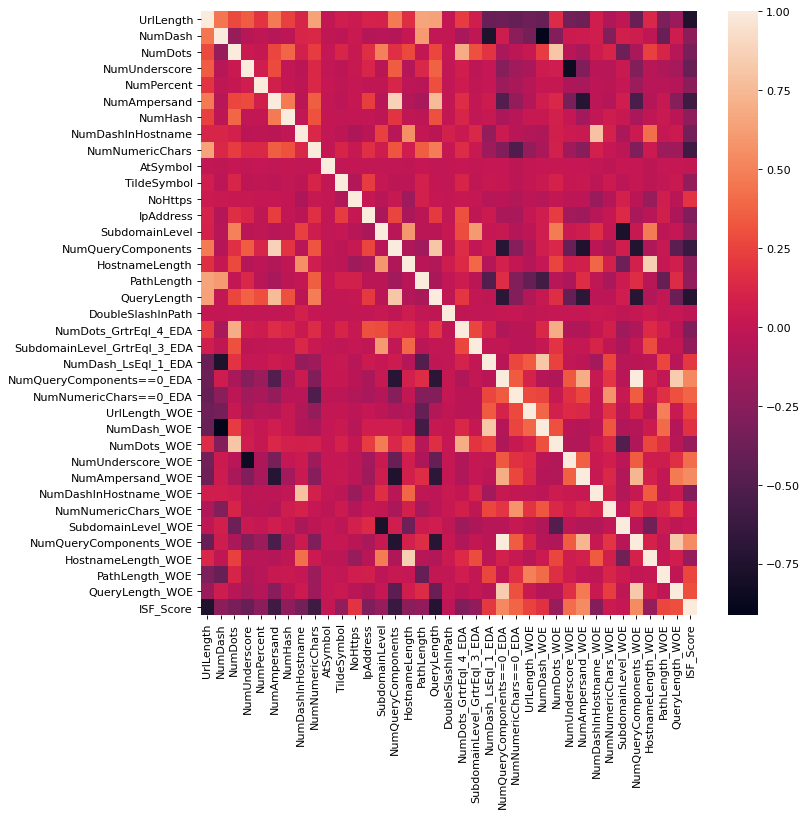

In [79]:
# adjust the figure size
from matplotlib.pyplot import figure
figure(figsize=(10,10), dpi=80)

#better visual for correlation
sns.heatmap(X_train_new.corr())

Clearly, we can see that some boxes have completely white and back colours that means correlation is Perfect Positive (in case of white coloured boxes) or Perfect Negative (in case of black coloured boxes). We can remove them.

In [80]:
# function to get all features highly correlated (both positive and negative) with another for a given threshold

def correlation(dataset, threshold):
    col_corr = set()  #set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i,j]) > threshold:  # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  #getting the name of the column
                col_corr.add(colname)
    return col_corr                        

In [81]:
corr_features = correlation(X_train_new, 0.95)
len(set(corr_features))

1

There are 1 feature which are highly correlated (can be explained by another feature) by amount of more than 95%. We will remove it to avoid complexity in model.

In [82]:
# corresponding correlated features
corr_features

{'NumQueryComponents_WOE'}

In [83]:
# dropping highly correlated features
X_train_new.drop(corr_features, axis=1, inplace=True)

In [84]:
# remaining columns
X_train_new.columns

Index(['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumHash', 'NumDashInHostname', 'NumNumericChars',
       'AtSymbol', 'TildeSymbol', 'NoHttps', 'IpAddress', 'SubdomainLevel',
       'NumQueryComponents', 'HostnameLength', 'PathLength', 'QueryLength',
       'DoubleSlashInPath', 'NumDots_GrtrEql_4_EDA',
       'SubdomainLevel_GrtrEql_3_EDA', 'NumDash_LsEql_1_EDA',
       'NumQueryComponents==0_EDA', 'NumNumericChars==0_EDA', 'UrlLength_WOE',
       'NumDash_WOE', 'NumDots_WOE', 'NumUnderscore_WOE', 'NumAmpersand_WOE',
       'NumDashInHostname_WOE', 'NumNumericChars_WOE', 'SubdomainLevel_WOE',
       'HostnameLength_WOE', 'PathLength_WOE', 'QueryLength_WOE', 'ISF_Score'],
      dtype='object')

In [85]:
len(X_train_new.columns)

36

**36 features are going for next criteria of feature selection.**

## ***Mutual Information***
It internally uses KNN classifier. So I am using scaled version of X_train_new dataset.

In [86]:
## Importing Libraries
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import MinMaxScaler

## Copy data in another dataframe to retrieve latter
d=X_train_new.copy()


## Apply scaling
scaling = MinMaxScaler()
d_scaled=scaling.fit_transform(d)
d_scaled=pd.DataFrame(d_scaled)

## Calculate mutual information
mutual_info = mutual_info_classif(d_scaled, y_train, random_state=0)
mutual_info


array([0.03774084, 0.11618346, 0.06739673, 0.01121938, 0.0026041 ,
       0.03103797, 0.00500508, 0.01590873, 0.12479375, 0.00409637,
       0.        , 0.00112564, 0.00026442, 0.        , 0.03698343,
       0.02599606, 0.0577901 , 0.04784694, 0.        , 0.0318292 ,
       0.01056974, 0.08452825, 0.02901025, 0.04641532, 0.02546603,
       0.12050146, 0.06111437, 0.0016909 , 0.02219928, 0.0076975 ,
       0.13073055, 0.00069231, 0.01681492, 0.02786951, 0.04176116,
       0.09497976])

In [87]:
## Storing original data into X_train_new
X_train_new = d.copy()

In [88]:
X_train_new.columns

Index(['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumHash', 'NumDashInHostname', 'NumNumericChars',
       'AtSymbol', 'TildeSymbol', 'NoHttps', 'IpAddress', 'SubdomainLevel',
       'NumQueryComponents', 'HostnameLength', 'PathLength', 'QueryLength',
       'DoubleSlashInPath', 'NumDots_GrtrEql_4_EDA',
       'SubdomainLevel_GrtrEql_3_EDA', 'NumDash_LsEql_1_EDA',
       'NumQueryComponents==0_EDA', 'NumNumericChars==0_EDA', 'UrlLength_WOE',
       'NumDash_WOE', 'NumDots_WOE', 'NumUnderscore_WOE', 'NumAmpersand_WOE',
       'NumDashInHostname_WOE', 'NumNumericChars_WOE', 'SubdomainLevel_WOE',
       'HostnameLength_WOE', 'PathLength_WOE', 'QueryLength_WOE', 'ISF_Score'],
      dtype='object')

In [89]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train_new.columns
mutual_info.sort_values(ascending = False)

NumNumericChars_WOE             0.130731
NumNumericChars                 0.124794
NumDash_WOE                     0.120501
NumDash                         0.116183
ISF_Score                       0.094980
NumDash_LsEql_1_EDA             0.084528
NumDots                         0.067397
NumDots_WOE                     0.061114
PathLength                      0.057790
QueryLength                     0.047847
NumNumericChars==0_EDA          0.046415
QueryLength_WOE                 0.041761
UrlLength                       0.037741
NumQueryComponents              0.036983
NumDots_GrtrEql_4_EDA           0.031829
NumAmpersand                    0.031038
NumQueryComponents==0_EDA       0.029010
PathLength_WOE                  0.027870
HostnameLength                  0.025996
UrlLength_WOE                   0.025466
NumAmpersand_WOE                0.022199
HostnameLength_WOE              0.016815
NumDashInHostname               0.015909
NumUnderscore                   0.011219
SubdomainLevel_G

<AxesSubplot:>

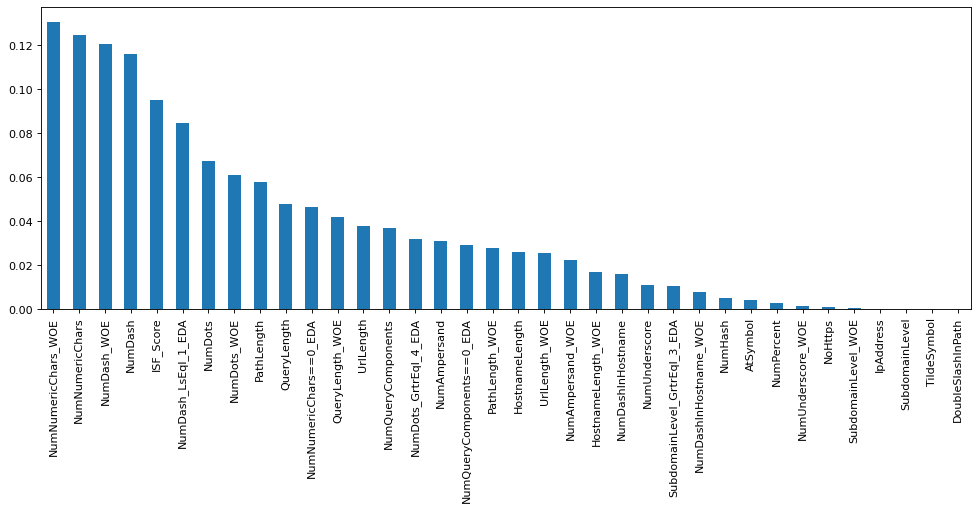

In [90]:
# adjust the figure size
from matplotlib.pyplot import figure
figure(figsize=(10,10), dpi=80)
mutual_info.sort_values(ascending = False).plot.bar(figsize=(15,5))

In [91]:
X_train_new.drop(["TildeSymbol","SubdomainLevel","DoubleSlashInPath"], axis=1, inplace=True)

In [92]:
X_train_new.columns

Index(['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumHash', 'NumDashInHostname', 'NumNumericChars',
       'AtSymbol', 'NoHttps', 'IpAddress', 'NumQueryComponents',
       'HostnameLength', 'PathLength', 'QueryLength', 'NumDots_GrtrEql_4_EDA',
       'SubdomainLevel_GrtrEql_3_EDA', 'NumDash_LsEql_1_EDA',
       'NumQueryComponents==0_EDA', 'NumNumericChars==0_EDA', 'UrlLength_WOE',
       'NumDash_WOE', 'NumDots_WOE', 'NumUnderscore_WOE', 'NumAmpersand_WOE',
       'NumDashInHostname_WOE', 'NumNumericChars_WOE', 'SubdomainLevel_WOE',
       'HostnameLength_WOE', 'PathLength_WOE', 'QueryLength_WOE', 'ISF_Score'],
      dtype='object')

In [93]:
X_train_new.head()

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,...,NumDots_WOE,NumUnderscore_WOE,NumAmpersand_WOE,NumDashInHostname_WOE,NumNumericChars_WOE,SubdomainLevel_WOE,HostnameLength_WOE,PathLength_WOE,QueryLength_WOE,ISF_Score
0,41,0,2,0,0,0,0,0,4,0,...,-0.019816,0.081354,0.114997,-0.096186,-0.494543,-0.057979,0.080934,-0.203832,0.222194,0.010841
1,40,0,3,0,1,0,0,0,3,0,...,0.292073,0.081354,0.114997,-0.096186,-0.494543,-0.057979,-0.120158,0.402728,0.222194,-0.015345
2,53,0,3,0,0,0,0,0,6,0,...,0.292073,0.081354,0.114997,-0.096186,-1.830517,0.062771,-0.120158,0.402728,0.222194,0.020058
3,89,12,3,0,0,0,0,0,14,0,...,0.292073,0.081354,0.114997,-0.096186,-0.777151,-0.057979,-0.120158,-0.833557,0.222194,-0.061994
4,101,6,1,3,0,0,0,0,6,0,...,-1.319003,-0.869469,0.114997,-0.096186,-1.830517,0.062771,-0.120158,-0.117753,-0.491447,-0.085792


In [94]:
len(X_train_new.columns)

33

Dropping "TildeSymbol","SubdomainLevel","DoubleSlashInPath" for having very low mutual information.

## ***ExtraTreesClassifier***
It internally uses Decision Tree Classifier. So instead of using scaled features, we will use original variables. Because scaling leads to some amount of information loose.

In [95]:
## Import Libraries
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

model.feature_importances_:

[2.32118775e-02 3.72760628e-02 3.32431892e-02 1.23392156e-02
 4.97735257e-03 4.68227129e-03 1.07368120e-03 1.53694468e-02
 3.24374037e-02 2.69310056e-05 1.86643560e-03 1.29021106e-02
 6.46319191e-03 1.57127778e-02 3.38238729e-02 8.24482223e-03
 3.28915517e-02 1.40315091e-03 9.13036660e-02 4.44946351e-02
 2.90951875e-02 2.61616608e-02 1.29358474e-01 7.18623082e-02
 2.24695731e-02 1.92551456e-02 2.52921611e-02 1.18902162e-01
 3.96827355e-02 1.28774829e-02 3.22089933e-02 3.71462217e-02
 2.19442480e-02]


X_train_new.columns:

Index(['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumHash', 'NumDashInHostname', 'NumNumericChars',
       'AtSymbol', 'NoHttps', 'IpAddress', 'NumQueryComponents',
       'HostnameLength', 'PathLength', 'QueryLength', 'NumDots_GrtrEql_4_EDA',
       'SubdomainLevel_GrtrEql_3_EDA', 'NumDash_LsEql_1_EDA',
       'NumQueryComponents==0_EDA', 'NumNumericChars==0_EDA', 'UrlLength_WOE',
       'Nu

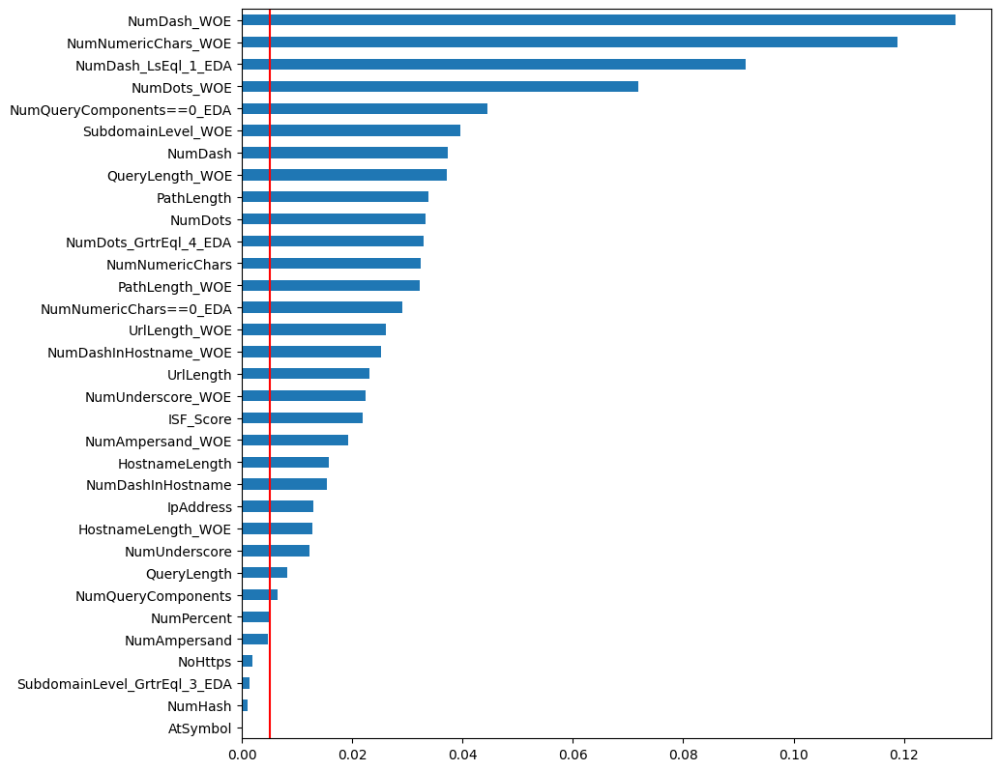

In [96]:
## Fit ExtraTreesClassifier with best set of parameters
model = ExtraTreesClassifier(n_estimators=50, min_samples_split=2, min_samples_leaf=3, criterion='gini',random_state=0)
model.fit(X_train_new,y_train)
print("model.feature_importances_:\n")
print(model.feature_importances_)
print("\n")
print("X_train_new.columns:\n")
print(X_train_new.columns)
ranked_features = pd.Series(model.feature_importances_, index = X_train_new.columns)

print("\n")
print("Visual Representation of Feature Importance from Model (Red line indicates value=0.005):")

## Visual Representaion
figure(figsize=(10,10), dpi=100)
ranked_features.sort_values().plot(kind='barh')
plt.axvline(x=0.005,c='r')
plt.show()

Clearly "NoHttps","SubdomainLevel_GrtrEql_3_EDA", "NumHash" and "AtSymbol" have very less importance (setting cutoff at 0.005). So, we'll drop them.

In [97]:
X_train_new.drop(["NoHttps","SubdomainLevel_GrtrEql_3_EDA", "NumHash", "AtSymbol" ] , axis=1, inplace=True)

In [98]:
X_train_new.head()

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumDashInHostname,NumNumericChars,IpAddress,NumQueryComponents,...,NumDots_WOE,NumUnderscore_WOE,NumAmpersand_WOE,NumDashInHostname_WOE,NumNumericChars_WOE,SubdomainLevel_WOE,HostnameLength_WOE,PathLength_WOE,QueryLength_WOE,ISF_Score
0,41,0,2,0,0,0,0,4,0,0,...,-0.019816,0.081354,0.114997,-0.096186,-0.494543,-0.057979,0.080934,-0.203832,0.222194,0.010841
1,40,0,3,0,1,0,0,3,0,0,...,0.292073,0.081354,0.114997,-0.096186,-0.494543,-0.057979,-0.120158,0.402728,0.222194,-0.015345
2,53,0,3,0,0,0,0,6,0,0,...,0.292073,0.081354,0.114997,-0.096186,-1.830517,0.062771,-0.120158,0.402728,0.222194,0.020058
3,89,12,3,0,0,0,0,14,0,0,...,0.292073,0.081354,0.114997,-0.096186,-0.777151,-0.057979,-0.120158,-0.833557,0.222194,-0.061994
4,101,6,1,3,0,0,0,6,0,1,...,-1.319003,-0.869469,0.114997,-0.096186,-1.830517,0.062771,-0.120158,-0.117753,-0.491447,-0.085792


## Final Training data

In [99]:
# setting options to see all columns
pd.set_option("display.max_columns",None)

In [100]:
X_train_new

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumDashInHostname,NumNumericChars,IpAddress,NumQueryComponents,HostnameLength,PathLength,QueryLength,NumDots_GrtrEql_4_EDA,NumDash_LsEql_1_EDA,NumQueryComponents==0_EDA,NumNumericChars==0_EDA,UrlLength_WOE,NumDash_WOE,NumDots_WOE,NumUnderscore_WOE,NumAmpersand_WOE,NumDashInHostname_WOE,NumNumericChars_WOE,SubdomainLevel_WOE,HostnameLength_WOE,PathLength_WOE,QueryLength_WOE,ISF_Score
0,41,0,2,0,0,0,0,4,0,0,24,10,0,0,1,1,0,0.492540,0.506946,-0.019816,0.081354,0.114997,-0.096186,-0.494543,-0.057979,0.080934,-0.203832,0.222194,0.010841
1,40,0,3,0,1,0,0,3,0,0,13,20,0,0,1,1,0,0.492540,0.506946,0.292073,0.081354,0.114997,-0.096186,-0.494543,-0.057979,-0.120158,0.402728,0.222194,-0.015345
2,53,0,3,0,0,0,0,6,0,0,17,29,0,0,1,1,0,0.492540,0.506946,0.292073,0.081354,0.114997,-0.096186,-1.830517,0.062771,-0.120158,0.402728,0.222194,0.020058
3,89,12,3,0,0,0,0,14,0,0,16,66,0,0,0,1,0,-0.571443,-3.685051,0.292073,0.081354,0.114997,-0.096186,-0.777151,-0.057979,-0.120158,-0.833557,0.222194,-0.061994
4,101,6,1,3,0,0,0,6,0,1,11,49,33,0,0,0,0,-0.571443,-3.685051,-1.319003,-0.869469,0.114997,-0.096186,-1.830517,0.062771,-0.120158,-0.117753,-0.491447,-0.085792
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,60,0,2,0,0,1,0,6,0,2,23,13,16,0,1,0,0,0.085523,0.506946,-0.019816,0.081354,-1.146679,-0.096186,-1.830517,0.062771,0.080934,-0.203832,-1.813158,-0.038894
7996,116,1,3,2,1,6,0,5,0,7,16,14,78,0,1,0,0,-0.571443,0.506946,0.292073,-0.869469,-1.146679,-0.096186,-1.830517,-0.057979,-0.120158,-0.203832,-0.491447,-0.217670
7997,60,1,1,0,0,0,0,6,0,0,18,35,0,0,1,1,0,0.085523,0.506946,-1.319003,0.081354,0.114997,-0.096186,-1.830517,0.062771,-0.120158,0.402728,0.222194,0.012147
7998,50,0,2,1,0,0,0,0,0,0,19,24,0,0,1,1,1,0.492540,0.506946,-0.019816,-0.192783,0.114997,-0.096186,0.707812,0.062771,-0.120158,0.402728,0.222194,0.015423


In [101]:
# finally training data has following columns
X_train_new.columns

Index(['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumDashInHostname', 'NumNumericChars', 'IpAddress',
       'NumQueryComponents', 'HostnameLength', 'PathLength', 'QueryLength',
       'NumDots_GrtrEql_4_EDA', 'NumDash_LsEql_1_EDA',
       'NumQueryComponents==0_EDA', 'NumNumericChars==0_EDA', 'UrlLength_WOE',
       'NumDash_WOE', 'NumDots_WOE', 'NumUnderscore_WOE', 'NumAmpersand_WOE',
       'NumDashInHostname_WOE', 'NumNumericChars_WOE', 'SubdomainLevel_WOE',
       'HostnameLength_WOE', 'PathLength_WOE', 'QueryLength_WOE', 'ISF_Score'],
      dtype='object')

In [102]:
# resetting options 
pd.reset_option("display.max_columns")

## Preparing Test Data

In [103]:
# setting options to see all columns, full column width
pd.set_option("display.max_columns",None)

In [104]:
X_test.head()

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath
6252,60,5,1,0,0,0,0,0,8,0,0,1,0,0,0,10,43,0,0
4684,75,0,3,0,0,0,0,0,0,0,0,1,0,1,1,15,48,4,0
1731,64,0,1,0,0,0,0,0,20,0,0,1,0,0,0,19,38,0,0
4742,71,0,3,0,0,0,0,0,4,0,0,1,0,0,1,10,29,24,0
4521,52,0,3,0,0,0,0,0,1,0,0,1,0,1,0,12,33,0,0


In [105]:
X_test.shape

(2000, 19)

In [106]:
# resetting options 
pd.reset_option("display.max_columns")

In [107]:
# We will work on X_test_new to keep base test dataset unchanged 
X_test_new = X_test.copy()

In [108]:
X_test_new.head()

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,NumNumericChars,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath
6252,60,5,1,0,0,0,0,0,8,0,0,1,0,0,0,10,43,0,0
4684,75,0,3,0,0,0,0,0,0,0,0,1,0,1,1,15,48,4,0
1731,64,0,1,0,0,0,0,0,20,0,0,1,0,0,0,19,38,0,0
4742,71,0,3,0,0,0,0,0,4,0,0,1,0,0,1,10,29,24,0
4521,52,0,3,0,0,0,0,0,1,0,0,1,0,1,0,12,33,0,0


In [109]:
X_test_new.shape

(2000, 19)

## Creating New Features

In [110]:
X_train_new.columns

Index(['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumDashInHostname', 'NumNumericChars', 'IpAddress',
       'NumQueryComponents', 'HostnameLength', 'PathLength', 'QueryLength',
       'NumDots_GrtrEql_4_EDA', 'NumDash_LsEql_1_EDA',
       'NumQueryComponents==0_EDA', 'NumNumericChars==0_EDA', 'UrlLength_WOE',
       'NumDash_WOE', 'NumDots_WOE', 'NumUnderscore_WOE', 'NumAmpersand_WOE',
       'NumDashInHostname_WOE', 'NumNumericChars_WOE', 'SubdomainLevel_WOE',
       'HostnameLength_WOE', 'PathLength_WOE', 'QueryLength_WOE', 'ISF_Score'],
      dtype='object')

In [111]:
X_test_new = X_test_new[['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumDashInHostname', 'NumNumericChars', 'IpAddress',
       'NumQueryComponents', 'HostnameLength', 'PathLength', 'QueryLength']]

In [112]:
X_test_new['NumDots_GrtrEql_4_EDA'] = np.where(X_test['NumDots']>=4,1,0)
X_test_new['NumDash_LsEql_1_EDA'] = np.where(X_test['NumDash']<=1,1,0)
X_test_new['NumQueryComponents==0_EDA'] = np.where(X_test['NumQueryComponents']==0,1,0)
X_test_new['NumNumericChars==0_EDA'] = np.where(X_test['NumNumericChars']==0,1,0)
X_test_new['UrlLength_WOE'] = [-0.462714 if i<35 else 0.492540 if 35<=i<60 else 0.085523 if 60<=i<70 else -0.571443 if 70<=i<130 else 0.211513 for i in X_test['UrlLength']]
X_test_new['NumDash_WOE'] = [0.506946 if i<2 else -0.216327 if 2<=i<3 else -1.194891 if 3<=i<6 else -3.685051 for i in X_test['NumDash']]
X_test_new['NumDots_WOE'] = [-1.319003 if i<2 else -0.019816 if 2<=i<3 else 0.292073 if 3<=i<4 else 1.422297 for i in X_test['NumDots']]
X_test_new['NumUnderscore_WOE'] = [0.081354 if i<1 else -0.192783 if 1<=i<2 else -0.869469 for i in X_test['NumUnderscore']]
X_test_new['NumAmpersand_WOE'] = [0.114997 if i<1 else -1.146679 for i in X_test['NumAmpersand']]
X_test_new['NumDashInHostname_WOE'] = [-0.096186 if i<1 else 1.000892 for i in X_test['NumDashInHostname']]
X_test_new['NumNumericChars_WOE'] = [0.707812 if i<2 else -0.494543 if 2<=i<5 else -1.830517 if 5<=i<8 else -3.127076 if 8<=i<9 else -0.777151 if 9<=i<18 else 1.319388 for i in X_test['NumNumericChars']]
X_test_new['SubdomainLevel_WOE'] = [0.062771 if i<1 else -0.057979 for i in X_test['SubdomainLevel']]
X_test_new['HostnameLength_WOE'] = [-0.705058 if i<11 else -0.120158 if 11<=i<20 else 0.080934 if 20<=i<26 else 0.484893 if 26<=i<30 else 1.202948 for i in X_test['HostnameLength']]
X_test_new['PathLength_WOE'] = [-0.873511 if i<8 else -0.203832 if 8<=i<16 else 0.402728 if 16<=i<46 else -0.117753 if 46<=i<60 else -0.833557 for i in X_test['PathLength']]
X_test_new['QueryLength_WOE'] = [0.222194 if i<6 else -1.813158 if 6<=i<30 else -0.491447 for i in X_test['QueryLength']]

In [113]:
x = X_test.values
predictions=clf.predict(x)

df_test = pd.DataFrame(clf.decision_function(x), columns = ["ISF_Score"])
df_test

,ISF_Score
0,-0.005112
1,0.002770
2,-0.001053
3,-0.020507
4,0.024632
...,...
1995,-0.041348
1996,-0.009367
1997,0.011394
1998,-0.024808


In [114]:
clf.decision_function(x)

array([-0.00511214,  0.00276988, -0.00105314, ...,  0.01139381,
       -0.02480821, -0.09293824])

In [116]:
## to avoid 'id' mismatch
X_test_new.reset_index(drop=True,inplace=True)
df_test.reset_index(drop=True,inplace=True)

In [117]:
X_test_new=pd.concat([X_test_new,df_test],axis=1)

In [212]:
X_validation.head()

,url,result,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumHash,NumDashInHostname,...,AtSymbol,TildeSymbol,NoHttps,IpAddress,SubdomainLevel,NumQueryComponents,HostnameLength,PathLength,QueryLength,DoubleSlashInPath
0,https://www.google.com,0,22,0,2,0,0,0,0,0,...,0,0,1,0,1,0,14,0,0,0
1,https://www.youtube.com,0,23,0,2,0,0,0,0,0,...,0,0,1,0,1,0,15,0,0,0
2,https://www.facebook.com,0,24,0,2,0,0,0,0,0,...,0,0,1,0,1,0,16,0,0,0
3,https://www.baidu.com,0,21,0,2,0,0,0,0,0,...,0,0,1,0,1,0,13,0,0,0
4,https://www.wikipedia.org,0,25,0,2,0,0,0,0,0,...,0,0,1,0,1,0,17,0,0,0


In [118]:
## to see all columns
pd.set_option("display.max_columns", None)

In [119]:
X_test_new

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumDashInHostname,NumNumericChars,IpAddress,NumQueryComponents,HostnameLength,PathLength,QueryLength,NumDots_GrtrEql_4_EDA,NumDash_LsEql_1_EDA,NumQueryComponents==0_EDA,NumNumericChars==0_EDA,UrlLength_WOE,NumDash_WOE,NumDots_WOE,NumUnderscore_WOE,NumAmpersand_WOE,NumDashInHostname_WOE,NumNumericChars_WOE,SubdomainLevel_WOE,HostnameLength_WOE,PathLength_WOE,QueryLength_WOE,ISF_Score
0,60,5,1,0,0,0,0,8,0,0,10,43,0,0,0,1,0,0.085523,-1.194891,-1.319003,0.081354,0.114997,-0.096186,-3.127076,0.062771,-0.705058,0.402728,0.222194,-0.005112
1,75,0,3,0,0,0,0,0,0,1,15,48,4,0,1,0,1,-0.571443,0.506946,0.292073,0.081354,0.114997,-0.096186,0.707812,-0.057979,-0.120158,-0.117753,0.222194,0.002770
2,64,0,1,0,0,0,0,20,0,0,19,38,0,0,1,1,0,0.085523,0.506946,-1.319003,0.081354,0.114997,-0.096186,1.319388,0.062771,-0.120158,0.402728,0.222194,-0.001053
3,71,0,3,0,0,0,0,4,0,1,10,29,24,0,1,0,0,-0.571443,0.506946,0.292073,0.081354,0.114997,-0.096186,-0.494543,0.062771,-0.705058,0.402728,-1.813158,-0.020507
4,52,0,3,0,0,0,0,1,0,0,12,33,0,0,1,1,0,0.492540,0.506946,0.292073,0.081354,0.114997,-0.096186,0.707812,-0.057979,-0.120158,0.402728,0.222194,0.024632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,99,7,3,2,0,0,0,2,0,0,25,67,0,0,0,1,0,-0.571443,-3.685051,0.292073,-0.869469,0.114997,-0.096186,-0.494543,-0.057979,0.080934,-0.833557,0.222194,-0.041348
1996,59,0,2,3,0,0,0,0,0,0,8,44,0,0,1,1,1,0.492540,0.506946,-0.019816,-0.869469,0.114997,-0.096186,0.707812,0.062771,-0.705058,0.402728,0.222194,-0.009367
1997,67,4,1,0,0,0,0,0,0,0,21,39,0,0,0,1,1,0.085523,-1.194891,-1.319003,0.081354,0.114997,-0.096186,0.707812,0.062771,0.080934,0.402728,0.222194,0.011394
1998,79,1,1,0,0,0,0,28,0,0,13,59,0,0,1,1,0,-0.571443,0.506946,-1.319003,0.081354,0.114997,-0.096186,1.319388,0.062771,-0.120158,-0.117753,0.222194,-0.024808


In [120]:
## resetting to default
pd.reset_option("display.max_columns")

# Model Fit with Optimized Hyperparameter
As this is **balanced dataset**, we will use **Repeated Randon Train-Test Split** every step.

In [121]:
# import library for RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [184]:
# We'll also check cross validation score from training set
# Import library for Repeated Random Cross Validation
from sklearn.model_selection import ShuffleSplit
ssplit = ShuffleSplit(n_splits=10,test_size=0.30)

In [ ]:
# Import library to calculate cross validation score
from sklearn.model_selection import cross_val_score

## Decision Tree Classifier

In [122]:
# import library for DecisionTree
from sklearn.tree import DecisionTreeClassifier

In [123]:
# make parameter Randomized for DecisionTree
params_DTC = {'max_leaf_nodes':list(range(2, 100)), 'min_samples_split':[2,3,4], 'criterion': ['entropy','gini']}
print(params_DTC)

# fitting Randomized_search on DecisionTree and getting the best hyperparameters
Randomized_search_DTC = RandomizedSearchCV(DecisionTreeClassifier(random_state=0), params_DTC, verbose=1, cv=5)

best_params_DTC = Randomized_search_DTC.fit(X_train_new, y_train)

print(best_params_DTC.best_params_)

print(best_params_DTC.best_estimator_)

{'max_leaf_nodes': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99], 'min_samples_split': [2, 3, 4], 'criterion': ['entropy', 'gini']}
Fitting 5 folds for each of 10 candidates, totalling 50 fits
{'min_samples_split': 4, 'max_leaf_nodes': 93, 'criterion': 'gini'}
DecisionTreeClassifier(max_leaf_nodes=93, min_samples_split=4, random_state=0)
Training accuracy of DecisionTree:  0.89
Testing accuracy of DecisionTree:  0.86


In [188]:
predictions_training_DTC = Randomized_search_DTC.predict(X_train_new)
score=cross_val_score(DecisionTreeClassifier(max_leaf_nodes=93, min_samples_split=4, random_state=0),X_train_new, y_train, cv=ssplit)
predictions_training_DTC_CV=score.mean()
predictions_testing_DTC = Randomized_search_DTC.predict(X_test_new)

print("Training accuracy of DecisionTree: ", format(accuracy_score(y_train,predictions_training_DTC),"0.2f"))
print("Training accuracy of DecisionTree after Cross Validation: ", format(predictions_training_DTC_CV,"0.2f"))
print("Testing accuracy of DecisionTree: ", format(accuracy_score(y_test,predictions_testing_DTC),"0.2f"))

Training accuracy of DecisionTree:  0.89
Training accuracy of DecisionTree after Cross Validation:  0.85
Testing accuracy of DecisionTree:  0.86


Confusion Matrix : 
 [[829 159]
 [115 897]]
              precision    recall  f1-score   support

           0       0.88      0.84      0.86       988
           1       0.85      0.89      0.87      1012

    accuracy                           0.86      2000
   macro avg       0.86      0.86      0.86      2000
weighted avg       0.86      0.86      0.86      2000

Decision Tree Model ROC AUC =  0.92


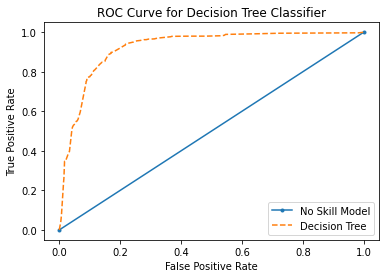

In [124]:
## Confusion Matrix
cm_DTC = confusion_matrix(y_test, predictions_testing_DTC)
print("Confusion Matrix : \n", cm_DTC)

## Classification Report
print(classification_report(y_test, predictions_testing_DTC))

## probability of falling into a particular class from each observation
probs_DTC = best_params_DTC.predict_proba(X_test_new)
probs_DTC = probs_DTC[:,1]

## AUC (Area Under Curve) Score
auc_score_DTC = roc_auc_score(y_test, probs_DTC)
print("Decision Tree Model ROC AUC = ",format(auc_score_DTC,"0.2f"))

## no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
ns_auc = roc_auc_score(y_test, ns_probs)
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
plt.plot(ns_fpr, ns_tpr, marker='.', label='No Skill Model')

## ROC Curve of Decision Tree
fpr_DTC, tpr_DTC, __DTC = roc_curve(y_test, probs_DTC)

plt.plot(fpr_DTC, tpr_DTC, linestyle='--', label='Decision Tree')
plt.title("ROC Curve for Decision Tree Classifier")
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show legend
plt.legend()
# show the plot
plt.show()

# Random Forest Classifier

In [125]:
# import library for RandomForest
from sklearn.ensemble import RandomForestClassifier

In [126]:
# make parameter Randomized for DecisionTree
params_RFC = {
    'criterion': ['entropy','gini'],
    
    'max_depth': [int(x) for x in np.linspace(10,100,5)],
    
    'max_features': ['auto','sqrt','log2'],
    
    'min_samples_leaf': [2,5,8],
    
    'min_samples_split': [2,5,10],
    
    'n_estimators': [int(x) for x in np.linspace(start=100, stop=500, num=5)]
}
print(params_RFC)

# fitting Randomized_search on RandomForestClassifier and getting the best hyperparameters
Randomized_search_RFC = RandomizedSearchCV(RandomForestClassifier(random_state=0), params_RFC, verbose=1, cv=5)

best_params_RFC = Randomized_search_RFC.fit(X_train_new, y_train)

print(best_params_RFC.best_params_)

print(best_params_RFC.best_estimator_)

{'criterion': ['entropy', 'gini'], 'max_depth': [10, 32, 55, 77, 100], 'max_features': ['auto', 'sqrt', 'log2'], 'min_samples_leaf': [2, 5, 8], 'min_samples_split': [2, 5, 10], 'n_estimators': [100, 200, 300, 400, 500]}
Fitting 5 folds for each of 10 candidates, totalling 50 fits
{'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 32, 'criterion': 'gini'}
RandomForestClassifier(max_depth=32, max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=5, n_estimators=300, random_state=0)
Training accuracy of Random Forest Classifier:  0.95
Testing accuracy of Random Forest Classifier:  0.89


In [189]:
predictions_training_RFC = Randomized_search_RFC.predict(X_train_new)
score=cross_val_score(RandomForestClassifier(max_depth=32, max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=5, n_estimators=300, random_state=0),X_train_new, y_train, cv=ssplit)
predictions_training_RFC_CV=score.mean()
predictions_testing_RFC = Randomized_search_RFC.predict(X_test_new)

print("Training accuracy of Random Forest Classifier: ", format(accuracy_score(y_train,predictions_training_RFC),"0.2f"))
print("Training accuracy of Random Forest Classifier after Cross Validation: ", format(predictions_training_RFC_CV,"0.2f"))
print("Testing accuracy of Random Forest Classifier: ", format(accuracy_score(y_test,predictions_testing_RFC),"0.2f"))

Training accuracy of Random Forest Classifier:  0.95
Training accuracy of Random Forest Classifier after Cross Validation:  0.88
Testing accuracy of Random Forest Classifier:  0.89


Confusion Matrix : 
 [[858 130]
 [ 87 925]]
              precision    recall  f1-score   support

           0       0.91      0.87      0.89       988
           1       0.88      0.91      0.90      1012

    accuracy                           0.89      2000
   macro avg       0.89      0.89      0.89      2000
weighted avg       0.89      0.89      0.89      2000

Random Forest Classifier ROC AUC =  0.96


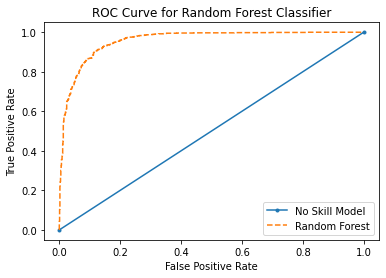

In [127]:
## Confusion Matrix
cm_RFC = confusion_matrix(y_test, predictions_testing_RFC)
print("Confusion Matrix : \n", cm_RFC)

## Classification Report
print(classification_report(y_test, predictions_testing_RFC))

## probability of falling into a particular class from each observation
probs_RFC = best_params_RFC.predict_proba(X_test_new)
probs_RFC = probs_RFC[:,1]

## AUC (Area Under Curve) Score
auc_score_RFC = roc_auc_score(y_test, probs_RFC)
print("Random Forest Classifier ROC AUC = ",format(auc_score_RFC,"0.2f"))

## no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
ns_auc = roc_auc_score(y_test, ns_probs)
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
plt.plot(ns_fpr, ns_tpr, marker='.', label='No Skill Model')


## ROC Curve from Random Forest
fpr_RFC, tpr_RFC, __RFC = roc_curve(y_test, probs_RFC)
plt.plot(fpr_RFC, tpr_RFC, linestyle='--', label='Random Forest')
plt.title("ROC Curve for Random Forest Classifier")

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show legend
plt.legend()
# show the plot
plt.show()

# SVM

In [128]:
# import library for DecisionTree
from sklearn.svm import SVC

In [129]:
## we have to apply scaled data here
from sklearn.preprocessing import MinMaxScaler
scaling = MinMaxScaler()

print("Scaled Training Data:\n")
## Scaling for Training Data
X_train_new_scaled = scaling.fit_transform(X_train_new)
X_train_new_scaled = pd.DataFrame(X_train_new_scaled, columns=X_train_new.columns)
print(X_train_new_scaled)

print("\n")

print("Scaled Testing Data:\n")
## Scaling for Testing Data
X_test_new_scaled = scaling.transform(X_test_new)
X_test_new_scaled = pd.DataFrame(X_test_new_scaled, columns=X_test_new.columns)
print(X_test_new_scaled)

Scaled Training Data:

      UrlLength   NumDash  NumDots  NumUnderscore  NumPercent  NumAmpersand  \
0      0.120332  0.000000     0.05         0.0000    0.000000      0.000000   
1      0.116183  0.000000     0.10         0.0000    0.052632      0.000000   
2      0.170124  0.000000     0.10         0.0000    0.000000      0.000000   
3      0.319502  0.218182     0.10         0.0000    0.000000      0.000000   
4      0.369295  0.109091     0.00         0.1875    0.000000      0.000000   
...         ...       ...      ...            ...         ...           ...   
7995   0.199170  0.000000     0.05         0.0000    0.000000      0.045455   
7996   0.431535  0.018182     0.10         0.1250    0.052632      0.272727   
7997   0.199170  0.018182     0.00         0.0000    0.000000      0.000000   
7998   0.157676  0.000000     0.05         0.0625    0.000000      0.000000   
7999   0.207469  0.000000     0.10         0.1250    0.000000      0.000000   

      NumDashInHostname  Num

In [130]:
# make parameter Randomized for Support Vector Machine
params_SVM = {
    'C':[0.1, 1, 10, 100, 1000],
    'gamma':[1, 0.1, 0.01, 0.001, 0.0001],
    'kernel':['rbf']
}
print(params_SVM)

# fitting Randomized_search on RandomizedForestClassifier and getting the best hyperparameters
Randomized_search_SVM = RandomizedSearchCV(SVC(probability=True, random_state=0), params_SVM, verbose=1, cv=5)

best_params_SVM = Randomized_search_SVM.fit(X_train_new_scaled, y_train)

print(best_params_SVM.best_params_)

print(best_params_SVM.best_estimator_)

{'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 'kernel': ['rbf']}
Fitting 5 folds for each of 10 candidates, totalling 50 fits
{'kernel': 'rbf', 'gamma': 0.1, 'C': 1000}
SVC(C=1000, gamma=0.1, probability=True, random_state=0)
Training accuracy of Support Vector Machine:  0.89
Testing accuracy of Support Vector Machine:  0.86


In [191]:
predictions_training_SVM = Randomized_search_SVM.predict(X_train_new_scaled)
score=cross_val_score(SVC(C=1000, gamma=0.1, probability=True, random_state=0),X_train_new, y_train, cv=ssplit)
predictions_training_SVM_CV=score.mean()     
predictions_testing_SVM = Randomized_search_SVM.predict(X_test_new_scaled)


print("Training accuracy of Support Vector Machine: ", format(accuracy_score(y_train,predictions_training_SVM),"0.2f"))
print("Training accuracy of Support Vector Machine after Cross Validation: ", format(predictions_training_SVM_CV,"0.2f"))
print("Testing accuracy of Support Vector Machine: ", format(accuracy_score(y_test,predictions_testing_SVM),"0.2f"))

Training accuracy of Support Vector Machine:  0.89
Training accuracy of Support Vector Machine after Cross Validation:  0.80
Testing accuracy of Support Vector Machine:  0.86


Confusion Matrix : 
 [[794 194]
 [ 83 929]]
              precision    recall  f1-score   support

           0       0.91      0.80      0.85       988
           1       0.83      0.92      0.87      1012

    accuracy                           0.86      2000
   macro avg       0.87      0.86      0.86      2000
weighted avg       0.87      0.86      0.86      2000

Support Vector Machine ROC AUC =  0.50


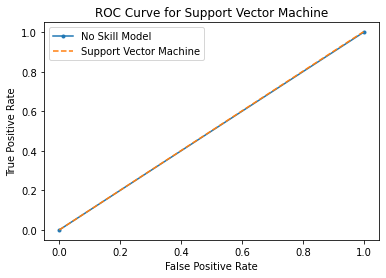

In [131]:
## Confusion Matrix
cm_SVM = confusion_matrix(y_test, predictions_testing_SVM)
print("Confusion Matrix : \n", cm_SVM)

## Classification Report
print(classification_report(y_test, predictions_testing_SVM))

## probability of falling into a particular class from each observation
probs_SVM = best_params_SVM.predict_proba(X_test_new)
probs_SVM = probs_SVM[:,1]

## AUC (Area Under Curve) Score
auc_score_SVM = roc_auc_score(y_test, probs_SVM)
print("Support Vector Machine ROC AUC = ",format(auc_score_SVM,"0.2f"))

## no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
ns_auc = roc_auc_score(y_test, ns_probs)
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
plt.plot(ns_fpr, ns_tpr, marker='.', label='No Skill Model')

## ROC Curve of Support Vector Machine
fpr_SVM, tpr_SVM, __SVM = roc_curve(y_test, probs_SVM)
plt.plot(fpr_SVM, tpr_SVM, linestyle='--', label='Support Vector Machine')
plt.title("ROC Curve for Support Vector Machine")

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show legend
plt.legend()
# show the plot
plt.show()

# XgBoost

In [140]:
# import library for XgBoost
from xgboost import XGBClassifier

In [141]:
# make parameter Randomized for XgBoost
params_XGB = {
    
    'max_depth': [i for i in range(2,10,1)],
    'n_estimators': [i for i in range(60,220,40)],
    'learning_rate':[0.1,0.01,0.05]
}
print(params_XGB)

# fitting Randomized_search on RandomForestClassifier and getting the best hyperparameters
Randomized_search_XGB = RandomizedSearchCV(XGBClassifier(objective = 'binary:logistic', nthread=4, use_label_encoder=False, seed=42), params_XGB, verbose=1, cv=5)

best_params_XGB = Randomized_search_XGB.fit(X_train_new, y_train)

print(best_params_XGB.best_params_)

print(best_params_XGB.best_estimator_)

{'max_depth': [2, 3, 4, 5, 6, 7, 8, 9], 'n_estimators': [60, 100, 140, 180], 'learning_rate': [0.1, 0.01, 0.05]}
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[20:36:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:36:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was c

[20:36:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:36:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:36:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:36:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [200]:
predictions_training_XGB = Randomized_search_XGB.predict(X_train_new)
score=cross_val_score(XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=1, monotone_constraints='()',
              n_estimators=140, n_jobs=4, nthread=4, num_parallel_tree=1,
              random_state=42, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=42, subsample=1, tree_method='exact',
              use_label_encoder=False, validate_parameters=1, verbosity=None),X_train_new, y_train, cv=ssplit)
predictions_training_XGB_CV=score.mean()      
predictions_testing_XGB = Randomized_search_XGB.predict(X_test_new)

print("Training accuracy of XgBoost: ", format(accuracy_score(y_train,predictions_training_XGB),"0.2f"))
print("Training accuracy of XgBoost after Cross Validation: ", format(predictions_training_XGB_CV,"0.2f"))
print("Testing accuracy of XgBoost: ", format(accuracy_score(y_test,predictions_testing_XGB),"0.2f"))

[00:33:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:33:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:33:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[00:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

Confusion Matrix : 
 [[850 138]
 [ 82 930]]
              precision    recall  f1-score   support

           0       0.91      0.86      0.89       988
           1       0.87      0.92      0.89      1012

    accuracy                           0.89      2000
   macro avg       0.89      0.89      0.89      2000
weighted avg       0.89      0.89      0.89      2000

XgBoost Model ROC AUC =  0.96


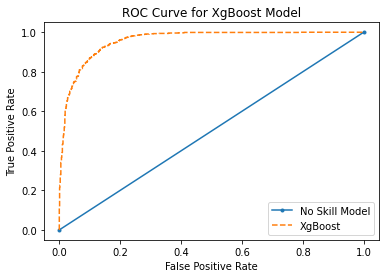

In [142]:
## Confusion Matrix
cm_XGB = confusion_matrix(y_test, predictions_testing_XGB)
print("Confusion Matrix : \n", cm_XGB)

## Classification Report
print(classification_report(y_test, predictions_testing_XGB))

## probability of falling into a particular class from each observation
probs_XGB = best_params_XGB.predict_proba(X_test_new)
probs_XGB = probs_XGB[:,1]

## AUC (Area Under Curve) Score
auc_score_XGB = roc_auc_score(y_test, probs_XGB)
print("XgBoost Model ROC AUC = ",format(auc_score_XGB,"0.2f"))

## no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
ns_auc = roc_auc_score(y_test, ns_probs)
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
plt.plot(ns_fpr, ns_tpr, marker='.', label='No Skill Model')


## ROC Curve of XgBoost Model
fpr_XGB, tpr_XGB, __XGB = roc_curve(y_test, probs_XGB)
plt.plot(fpr_XGB, tpr_XGB, linestyle='--', label='XgBoost')
plt.title("ROC Curve for XgBoost Model")

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show legend
plt.legend()
# show the plot
plt.show()

# lightgbm

In [143]:
# import library for lightgbm
import lightgbm as lgb

In [144]:
# make parameter Randomized for lightgbm
params_LGB = {
    'num_leaves': [31, 127],
    
    'reg_alpha': [0.1, 0.5],
    
    'min_data_in_leaf': [30, 50, 100, 300, 400],
    
    'lambda_l1': [0, 1, 1.5],
    
    'lambda_l2': [0, 1]
}
print(params_LGB)

# fitting Randomized_search on RandomForestClassifier and getting the best hyperparameters
Randomized_search_LGB = RandomizedSearchCV(lgb.LGBMClassifier(boosting_type='gbdt',objective='binary',num_boost_round=2000,learning_rate=0.01,random_state=0), params_LGB, verbose=1, cv=5)

best_params_LGB = Randomized_search_LGB.fit(X_train_new, y_train)

print(best_params_LGB.best_params_)

print(best_params_LGB.best_estimator_)

{'num_leaves': [31, 127], 'reg_alpha': [0.1, 0.5], 'min_data_in_leaf': [30, 50, 100, 300, 400], 'lambda_l1': [0, 1, 1.5], 'lambda_l2': [0, 1]}
Fitting 5 folds for each of 10 candidates, totalling 50 fits


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
{'reg_alpha': 0.1, 'num_leaves': 31, 'min_data_in_leaf': 50, 'lambda_l2': 0, 'lambda_l1': 0}
LGBMClassifier(lambda_l1=0, lambda_l2=0, learning_rate=0.01,
               min_data_in_leaf=50, num_boost_round=2000, objective='binary',
               random_state=0, reg_alpha=0.1)
Training accuracy of lightgbm:  0.94
Testing accuracy of lightgbm:  0.89


In [199]:
predictions_training_LGB = Randomized_search_LGB.predict(X_train_new)
score=cross_val_score(lgb.LGBMClassifier(lambda_l1=0, lambda_l2=0, learning_rate=0.01,
               min_data_in_leaf=50, num_boost_round=2000, objective='binary',
               random_state=0, reg_alpha=0.1),X_train_new, y_train, cv=5)
predictions_training_LGB_CV=score.mean()
predictions_testing_LGB = Randomized_search_LGB.predict(X_test_new)

print("Training accuracy of lightgbm: ", format(accuracy_score(y_train,predictions_training_LGB),"0.2f"))
print("Training accuracy of lightgbm after Cross Validation: ", format(predictions_training_LGB_CV,"0.2f"))
print("Testing accuracy of lightgbm: ", format(accuracy_score(y_test,predictions_testing_LGB),"0.2f"))

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
Training accuracy of lightgbm:  0.94
Training accuracy of lightgbm after Cross Validation:  0.88
Testing accuracy of lightgbm:  0.89


Confusion Matrix : 
 [[854 134]
 [ 91 921]]
              precision    recall  f1-score   support

           0       0.90      0.86      0.88       988
           1       0.87      0.91      0.89      1012

    accuracy                           0.89      2000
   macro avg       0.89      0.89      0.89      2000
weighted avg       0.89      0.89      0.89      2000

LightGBM Model ROC AUC = %.3f 0.96


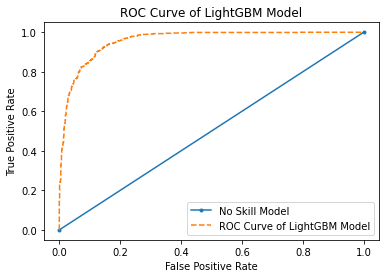

In [146]:
## Confusion Matrix
cm_LGB = confusion_matrix(y_test, predictions_testing_LGB)
print("Confusion Matrix : \n", cm_LGB)

## Classification Report
print(classification_report(y_test, predictions_testing_LGB))

## probability of falling into a particular class from each observation
probs_LGB = best_params_LGB.predict_proba(X_test_new)
probs_LGB = probs_LGB[:,1]

## AUC (Area Under Curve) Score
auc_score_LGB = roc_auc_score(y_test, probs_LGB)
print("LightGBM Model ROC AUC = %.3f",format(auc_score_LGB,"0.2f"))

## no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
ns_auc = roc_auc_score(y_test, ns_probs)
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
plt.plot(ns_fpr, ns_tpr, marker='.', label='No Skill Model')


## ROC Curve
fpr_LGB, tpr_LGB, __LGB = roc_curve(y_test, probs_LGB)
plt.plot(fpr_LGB, tpr_LGB, linestyle='--', label='ROC Curve of LightGBM Model')
plt.title("ROC Curve of LightGBM Model")

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show legend
plt.legend()
# show the plot
plt.show()

# catboost

In [147]:
# import library for CatBoost
import catboost as cb

In [148]:
# make parameter Randomized for CatBoost
params_CTB = {
    'depth':[3,1,2,6,4,5,7,8,9,10],
    'iterations':[250,100,500,1000],
    'learning_rate':[0.03,0.001,0.01,0.1,0.2,0.3],
    'l2_leaf_reg':[3,1,5,10,100],
    'border_count':[32,5,10,20,100,200],
    'thread_count':[4]
}
print(params_CTB)

# fitting Randomized_search on RandomForestClassifier and getting the best hyperparameters
Randomized_search_CTB = RandomizedSearchCV(cb.CatBoostClassifier(random_state=0), params_CTB, verbose=1, cv=5)

best_params_CTB = Randomized_search_CTB.fit(X_train_new, y_train)

print(best_params_CTB.best_params_)

print(best_params_CTB.best_estimator_)

{'depth': [3, 1, 2, 6, 4, 5, 7, 8, 9, 10], 'iterations': [250, 100, 500, 1000], 'learning_rate': [0.03, 0.001, 0.01, 0.1, 0.2, 0.3], 'l2_leaf_reg': [3, 1, 5, 10, 100], 'border_count': [32, 5, 10, 20, 100, 200], 'thread_count': [4]}
Fitting 5 folds for each of 10 candidates, totalling 50 fits
0:	learn: 0.6691132	total: 89.1ms	remaining: 8.82s
1:	learn: 0.6460824	total: 116ms	remaining: 5.68s
2:	learn: 0.6262758	total: 144ms	remaining: 4.66s
3:	learn: 0.6076095	total: 170ms	remaining: 4.09s
4:	learn: 0.5854354	total: 199ms	remaining: 3.79s
5:	learn: 0.5671577	total: 242ms	remaining: 3.79s
6:	learn: 0.5483969	total: 284ms	remaining: 3.77s
7:	learn: 0.5323552	total: 327ms	remaining: 3.76s
8:	learn: 0.5174941	total: 368ms	remaining: 3.72s
9:	learn: 0.5016032	total: 403ms	remaining: 3.62s
10:	learn: 0.4865392	total: 433ms	remaining: 3.5s
11:	learn: 0.4740875	total: 467ms	remaining: 3.43s
12:	learn: 0.4625188	total: 503ms	remaining: 3.36s
13:	learn: 0.4535266	total: 547ms	remaining: 3.36s
14:

60:	learn: 0.2781686	total: 2.2s	remaining: 1.41s
61:	learn: 0.2767604	total: 2.24s	remaining: 1.37s
62:	learn: 0.2752723	total: 2.28s	remaining: 1.34s
63:	learn: 0.2737785	total: 2.33s	remaining: 1.31s
64:	learn: 0.2728668	total: 2.37s	remaining: 1.28s
65:	learn: 0.2715036	total: 2.41s	remaining: 1.24s
66:	learn: 0.2704919	total: 2.46s	remaining: 1.21s
67:	learn: 0.2688098	total: 2.5s	remaining: 1.18s
68:	learn: 0.2675705	total: 2.55s	remaining: 1.15s
69:	learn: 0.2659529	total: 2.6s	remaining: 1.11s
70:	learn: 0.2648447	total: 2.67s	remaining: 1.09s
71:	learn: 0.2635630	total: 2.72s	remaining: 1.06s
72:	learn: 0.2625932	total: 2.77s	remaining: 1.02s
73:	learn: 0.2612411	total: 2.82s	remaining: 989ms
74:	learn: 0.2598711	total: 2.85s	remaining: 951ms
75:	learn: 0.2590122	total: 2.89s	remaining: 913ms
76:	learn: 0.2578772	total: 2.92s	remaining: 873ms
77:	learn: 0.2569227	total: 2.96s	remaining: 834ms
78:	learn: 0.2555700	total: 2.99s	remaining: 795ms
79:	learn: 0.2547992	total: 3.02s	

24:	learn: 0.3755965	total: 818ms	remaining: 2.45s
25:	learn: 0.3693748	total: 854ms	remaining: 2.43s
26:	learn: 0.3648242	total: 884ms	remaining: 2.39s
27:	learn: 0.3604552	total: 911ms	remaining: 2.34s
28:	learn: 0.3563745	total: 939ms	remaining: 2.3s
29:	learn: 0.3521678	total: 966ms	remaining: 2.25s
30:	learn: 0.3485826	total: 999ms	remaining: 2.22s
31:	learn: 0.3457173	total: 1.04s	remaining: 2.21s
32:	learn: 0.3408938	total: 1.07s	remaining: 2.18s
33:	learn: 0.3370408	total: 1.1s	remaining: 2.14s
34:	learn: 0.3343796	total: 1.13s	remaining: 2.1s
35:	learn: 0.3307784	total: 1.16s	remaining: 2.06s
36:	learn: 0.3283847	total: 1.19s	remaining: 2.03s
37:	learn: 0.3246997	total: 1.23s	remaining: 2s
38:	learn: 0.3216313	total: 1.26s	remaining: 1.96s
39:	learn: 0.3180041	total: 1.29s	remaining: 1.93s
40:	learn: 0.3156198	total: 1.31s	remaining: 1.89s
41:	learn: 0.3137432	total: 1.34s	remaining: 1.85s
42:	learn: 0.3114750	total: 1.38s	remaining: 1.82s
43:	learn: 0.3088607	total: 1.4s	rema

86:	learn: 0.2546204	total: 3s	remaining: 448ms
87:	learn: 0.2533623	total: 3.03s	remaining: 414ms
88:	learn: 0.2525289	total: 3.08s	remaining: 380ms
89:	learn: 0.2514894	total: 3.12s	remaining: 347ms
90:	learn: 0.2510081	total: 3.16s	remaining: 313ms
91:	learn: 0.2500746	total: 3.2s	remaining: 278ms
92:	learn: 0.2494939	total: 3.24s	remaining: 244ms
93:	learn: 0.2486496	total: 3.28s	remaining: 209ms
94:	learn: 0.2481566	total: 3.32s	remaining: 175ms
95:	learn: 0.2467996	total: 3.36s	remaining: 140ms
96:	learn: 0.2459187	total: 3.4s	remaining: 105ms
97:	learn: 0.2452547	total: 3.43s	remaining: 70.1ms
98:	learn: 0.2448608	total: 3.47s	remaining: 35.1ms
99:	learn: 0.2441455	total: 3.51s	remaining: 0us
0:	learn: 0.5405452	total: 9.25ms	remaining: 916ms
1:	learn: 0.4741796	total: 19.3ms	remaining: 944ms
2:	learn: 0.4282674	total: 29.8ms	remaining: 963ms
3:	learn: 0.3997297	total: 39.2ms	remaining: 942ms
4:	learn: 0.3797729	total: 47.4ms	remaining: 901ms
5:	learn: 0.3603157	total: 55.8ms	re

55:	learn: 0.2311940	total: 535ms	remaining: 420ms
56:	learn: 0.2303244	total: 544ms	remaining: 411ms
57:	learn: 0.2294411	total: 553ms	remaining: 400ms
58:	learn: 0.2288703	total: 563ms	remaining: 391ms
59:	learn: 0.2288285	total: 573ms	remaining: 382ms
60:	learn: 0.2286788	total: 585ms	remaining: 374ms
61:	learn: 0.2284702	total: 595ms	remaining: 365ms
62:	learn: 0.2284314	total: 604ms	remaining: 355ms
63:	learn: 0.2283873	total: 613ms	remaining: 345ms
64:	learn: 0.2265558	total: 622ms	remaining: 335ms
65:	learn: 0.2251655	total: 630ms	remaining: 324ms
66:	learn: 0.2249118	total: 638ms	remaining: 314ms
67:	learn: 0.2231600	total: 646ms	remaining: 304ms
68:	learn: 0.2221651	total: 654ms	remaining: 294ms
69:	learn: 0.2211533	total: 662ms	remaining: 284ms
70:	learn: 0.2199766	total: 671ms	remaining: 274ms
71:	learn: 0.2190456	total: 680ms	remaining: 265ms
72:	learn: 0.2190120	total: 689ms	remaining: 255ms
73:	learn: 0.2181145	total: 698ms	remaining: 245ms
74:	learn: 0.2175802	total: 710

29:	learn: 0.2674160	total: 366ms	remaining: 854ms
30:	learn: 0.2673915	total: 379ms	remaining: 843ms
31:	learn: 0.2646354	total: 389ms	remaining: 828ms
32:	learn: 0.2646174	total: 399ms	remaining: 810ms
33:	learn: 0.2623530	total: 412ms	remaining: 799ms
34:	learn: 0.2604700	total: 421ms	remaining: 781ms
35:	learn: 0.2597048	total: 431ms	remaining: 766ms
36:	learn: 0.2572901	total: 440ms	remaining: 749ms
37:	learn: 0.2556385	total: 449ms	remaining: 732ms
38:	learn: 0.2556270	total: 462ms	remaining: 722ms
39:	learn: 0.2539627	total: 476ms	remaining: 714ms
40:	learn: 0.2521064	total: 489ms	remaining: 704ms
41:	learn: 0.2519951	total: 499ms	remaining: 689ms
42:	learn: 0.2501431	total: 512ms	remaining: 679ms
43:	learn: 0.2491474	total: 527ms	remaining: 670ms
44:	learn: 0.2475683	total: 540ms	remaining: 660ms
45:	learn: 0.2456179	total: 553ms	remaining: 649ms
46:	learn: 0.2445595	total: 567ms	remaining: 639ms
47:	learn: 0.2435710	total: 581ms	remaining: 629ms
48:	learn: 0.2421114	total: 593

95:	learn: 0.2094558	total: 1.06s	remaining: 44ms
96:	learn: 0.2094530	total: 1.06s	remaining: 32.9ms
97:	learn: 0.2092451	total: 1.07s	remaining: 21.9ms
98:	learn: 0.2092422	total: 1.08s	remaining: 11ms
99:	learn: 0.2092207	total: 1.09s	remaining: 0us
0:	learn: 0.5772715	total: 6.59ms	remaining: 6.59s
1:	learn: 0.5086477	total: 14ms	remaining: 6.97s
2:	learn: 0.4743571	total: 20.3ms	remaining: 6.74s
3:	learn: 0.4394202	total: 26.9ms	remaining: 6.69s
4:	learn: 0.4212003	total: 35.1ms	remaining: 6.99s
5:	learn: 0.4099351	total: 41.7ms	remaining: 6.91s
6:	learn: 0.3927670	total: 49.5ms	remaining: 7.02s
7:	learn: 0.3785797	total: 56.6ms	remaining: 7.02s
8:	learn: 0.3680648	total: 64.9ms	remaining: 7.14s
9:	learn: 0.3601473	total: 71.9ms	remaining: 7.12s
10:	learn: 0.3520338	total: 80.2ms	remaining: 7.21s
11:	learn: 0.3451728	total: 87.1ms	remaining: 7.17s
12:	learn: 0.3410893	total: 94.7ms	remaining: 7.19s
13:	learn: 0.3367185	total: 101ms	remaining: 7.14s
14:	learn: 0.3327168	total: 109m

165:	learn: 0.2133668	total: 1.21s	remaining: 6.08s
166:	learn: 0.2130896	total: 1.22s	remaining: 6.07s
167:	learn: 0.2124139	total: 1.22s	remaining: 6.07s
168:	learn: 0.2120576	total: 1.23s	remaining: 6.07s
169:	learn: 0.2118221	total: 1.24s	remaining: 6.07s
170:	learn: 0.2118144	total: 1.25s	remaining: 6.06s
171:	learn: 0.2115201	total: 1.26s	remaining: 6.06s
172:	learn: 0.2112926	total: 1.26s	remaining: 6.04s
173:	learn: 0.2110357	total: 1.27s	remaining: 6.04s
174:	learn: 0.2106494	total: 1.28s	remaining: 6.03s
175:	learn: 0.2103688	total: 1.29s	remaining: 6.02s
176:	learn: 0.2100706	total: 1.29s	remaining: 6.02s
177:	learn: 0.2099945	total: 1.3s	remaining: 6.01s
178:	learn: 0.2099027	total: 1.31s	remaining: 6s
179:	learn: 0.2098962	total: 1.32s	remaining: 6s
180:	learn: 0.2097287	total: 1.32s	remaining: 5.99s
181:	learn: 0.2095012	total: 1.33s	remaining: 5.98s
182:	learn: 0.2090577	total: 1.34s	remaining: 5.97s
183:	learn: 0.2088479	total: 1.34s	remaining: 5.96s
184:	learn: 0.20852

329:	learn: 0.1804038	total: 2.39s	remaining: 4.86s
330:	learn: 0.1799299	total: 2.4s	remaining: 4.85s
331:	learn: 0.1798141	total: 2.41s	remaining: 4.84s
332:	learn: 0.1796640	total: 2.41s	remaining: 4.83s
333:	learn: 0.1796018	total: 2.42s	remaining: 4.83s
334:	learn: 0.1796015	total: 2.42s	remaining: 4.82s
335:	learn: 0.1795253	total: 2.43s	remaining: 4.81s
336:	learn: 0.1795247	total: 2.44s	remaining: 4.8s
337:	learn: 0.1793494	total: 2.44s	remaining: 4.79s
338:	learn: 0.1791852	total: 2.45s	remaining: 4.78s
339:	learn: 0.1790800	total: 2.46s	remaining: 4.77s
340:	learn: 0.1789880	total: 2.46s	remaining: 4.76s
341:	learn: 0.1786509	total: 2.47s	remaining: 4.75s
342:	learn: 0.1784551	total: 2.48s	remaining: 4.75s
343:	learn: 0.1781110	total: 2.48s	remaining: 4.74s
344:	learn: 0.1777853	total: 2.49s	remaining: 4.73s
345:	learn: 0.1775068	total: 2.5s	remaining: 4.72s
346:	learn: 0.1771992	total: 2.51s	remaining: 4.72s
347:	learn: 0.1771234	total: 2.52s	remaining: 4.71s
348:	learn: 0.1

489:	learn: 0.1534293	total: 3.76s	remaining: 3.91s
490:	learn: 0.1531740	total: 3.77s	remaining: 3.91s
491:	learn: 0.1530556	total: 3.78s	remaining: 3.9s
492:	learn: 0.1529468	total: 3.79s	remaining: 3.9s
493:	learn: 0.1529213	total: 3.79s	remaining: 3.89s
494:	learn: 0.1527791	total: 3.8s	remaining: 3.88s
495:	learn: 0.1523664	total: 3.81s	remaining: 3.87s
496:	learn: 0.1523045	total: 3.82s	remaining: 3.87s
497:	learn: 0.1522506	total: 3.83s	remaining: 3.86s
498:	learn: 0.1520958	total: 3.83s	remaining: 3.85s
499:	learn: 0.1519836	total: 3.85s	remaining: 3.85s
500:	learn: 0.1518847	total: 3.85s	remaining: 3.84s
501:	learn: 0.1516769	total: 3.86s	remaining: 3.83s
502:	learn: 0.1516767	total: 3.87s	remaining: 3.82s
503:	learn: 0.1516122	total: 3.88s	remaining: 3.81s
504:	learn: 0.1515251	total: 3.88s	remaining: 3.81s
505:	learn: 0.1513639	total: 3.89s	remaining: 3.8s
506:	learn: 0.1513051	total: 3.9s	remaining: 3.79s
507:	learn: 0.1510727	total: 3.91s	remaining: 3.79s
508:	learn: 0.150

659:	learn: 0.1344901	total: 4.98s	remaining: 2.56s
660:	learn: 0.1344243	total: 4.98s	remaining: 2.56s
661:	learn: 0.1343892	total: 4.99s	remaining: 2.55s
662:	learn: 0.1342575	total: 5s	remaining: 2.54s
663:	learn: 0.1342125	total: 5s	remaining: 2.53s
664:	learn: 0.1340747	total: 5.01s	remaining: 2.52s
665:	learn: 0.1338618	total: 5.01s	remaining: 2.52s
666:	learn: 0.1337998	total: 5.02s	remaining: 2.51s
667:	learn: 0.1337505	total: 5.03s	remaining: 2.5s
668:	learn: 0.1337098	total: 5.03s	remaining: 2.49s
669:	learn: 0.1335637	total: 5.04s	remaining: 2.48s
670:	learn: 0.1335120	total: 5.05s	remaining: 2.48s
671:	learn: 0.1334413	total: 5.06s	remaining: 2.47s
672:	learn: 0.1334336	total: 5.06s	remaining: 2.46s
673:	learn: 0.1334336	total: 5.07s	remaining: 2.45s
674:	learn: 0.1333560	total: 5.07s	remaining: 2.44s
675:	learn: 0.1332842	total: 5.08s	remaining: 2.44s
676:	learn: 0.1332484	total: 5.09s	remaining: 2.43s
677:	learn: 0.1331210	total: 5.09s	remaining: 2.42s
678:	learn: 0.13301

837:	learn: 0.1177298	total: 6.17s	remaining: 1.19s
838:	learn: 0.1176617	total: 6.17s	remaining: 1.18s
839:	learn: 0.1176094	total: 6.18s	remaining: 1.18s
840:	learn: 0.1175498	total: 6.19s	remaining: 1.17s
841:	learn: 0.1174693	total: 6.19s	remaining: 1.16s
842:	learn: 0.1174300	total: 6.2s	remaining: 1.15s
843:	learn: 0.1172880	total: 6.21s	remaining: 1.15s
844:	learn: 0.1172519	total: 6.21s	remaining: 1.14s
845:	learn: 0.1172078	total: 6.22s	remaining: 1.13s
846:	learn: 0.1171357	total: 6.23s	remaining: 1.12s
847:	learn: 0.1170590	total: 6.23s	remaining: 1.12s
848:	learn: 0.1169530	total: 6.24s	remaining: 1.11s
849:	learn: 0.1169077	total: 6.25s	remaining: 1.1s
850:	learn: 0.1168917	total: 6.26s	remaining: 1.09s
851:	learn: 0.1168144	total: 6.26s	remaining: 1.09s
852:	learn: 0.1167510	total: 6.27s	remaining: 1.08s
853:	learn: 0.1166062	total: 6.28s	remaining: 1.07s
854:	learn: 0.1165744	total: 6.28s	remaining: 1.06s
855:	learn: 0.1164589	total: 6.29s	remaining: 1.06s
856:	learn: 0.

0:	learn: 0.5776829	total: 6.38ms	remaining: 6.37s
1:	learn: 0.5116031	total: 12.3ms	remaining: 6.16s
2:	learn: 0.4695908	total: 18.4ms	remaining: 6.11s
3:	learn: 0.4389158	total: 24.4ms	remaining: 6.08s
4:	learn: 0.4207925	total: 31.2ms	remaining: 6.2s
5:	learn: 0.4029466	total: 37.1ms	remaining: 6.15s
6:	learn: 0.3868988	total: 43.9ms	remaining: 6.23s
7:	learn: 0.3778083	total: 49.9ms	remaining: 6.18s
8:	learn: 0.3706240	total: 55.8ms	remaining: 6.14s
9:	learn: 0.3628799	total: 62ms	remaining: 6.14s
10:	learn: 0.3578890	total: 68.6ms	remaining: 6.16s
11:	learn: 0.3520766	total: 75.4ms	remaining: 6.2s
12:	learn: 0.3459344	total: 82.1ms	remaining: 6.23s
13:	learn: 0.3409568	total: 89.4ms	remaining: 6.3s
14:	learn: 0.3389656	total: 96.4ms	remaining: 6.33s
15:	learn: 0.3356158	total: 103ms	remaining: 6.34s
16:	learn: 0.3335625	total: 109ms	remaining: 6.3s
17:	learn: 0.3309133	total: 116ms	remaining: 6.34s
18:	learn: 0.3274578	total: 122ms	remaining: 6.32s
19:	learn: 0.3254637	total: 129m

181:	learn: 0.2056423	total: 1.2s	remaining: 5.39s
182:	learn: 0.2055334	total: 1.21s	remaining: 5.38s
183:	learn: 0.2053180	total: 1.21s	remaining: 5.38s
184:	learn: 0.2050235	total: 1.22s	remaining: 5.38s
185:	learn: 0.2044955	total: 1.23s	remaining: 5.37s
186:	learn: 0.2041251	total: 1.23s	remaining: 5.36s
187:	learn: 0.2040755	total: 1.24s	remaining: 5.36s
188:	learn: 0.2038329	total: 1.25s	remaining: 5.35s
189:	learn: 0.2035219	total: 1.25s	remaining: 5.35s
190:	learn: 0.2031951	total: 1.26s	remaining: 5.34s
191:	learn: 0.2025800	total: 1.27s	remaining: 5.33s
192:	learn: 0.2022602	total: 1.27s	remaining: 5.33s
193:	learn: 0.2018533	total: 1.28s	remaining: 5.32s
194:	learn: 0.2016237	total: 1.29s	remaining: 5.31s
195:	learn: 0.2014416	total: 1.29s	remaining: 5.31s
196:	learn: 0.2010843	total: 1.3s	remaining: 5.3s
197:	learn: 0.2007526	total: 1.31s	remaining: 5.3s
198:	learn: 0.2002864	total: 1.31s	remaining: 5.29s
199:	learn: 0.2000117	total: 1.32s	remaining: 5.28s
200:	learn: 0.19

365:	learn: 0.1640307	total: 2.44s	remaining: 4.22s
366:	learn: 0.1637642	total: 2.44s	remaining: 4.21s
367:	learn: 0.1635875	total: 2.45s	remaining: 4.21s
368:	learn: 0.1634806	total: 2.46s	remaining: 4.2s
369:	learn: 0.1633836	total: 2.46s	remaining: 4.19s
370:	learn: 0.1632793	total: 2.47s	remaining: 4.19s
371:	learn: 0.1632084	total: 2.48s	remaining: 4.18s
372:	learn: 0.1630564	total: 2.48s	remaining: 4.17s
373:	learn: 0.1629272	total: 2.49s	remaining: 4.17s
374:	learn: 0.1627985	total: 2.5s	remaining: 4.16s
375:	learn: 0.1626735	total: 2.5s	remaining: 4.15s
376:	learn: 0.1625833	total: 2.51s	remaining: 4.15s
377:	learn: 0.1623320	total: 2.52s	remaining: 4.14s
378:	learn: 0.1621762	total: 2.52s	remaining: 4.14s
379:	learn: 0.1620846	total: 2.53s	remaining: 4.13s
380:	learn: 0.1619125	total: 2.54s	remaining: 4.12s
381:	learn: 0.1616297	total: 2.54s	remaining: 4.12s
382:	learn: 0.1615207	total: 2.55s	remaining: 4.11s
383:	learn: 0.1614335	total: 2.56s	remaining: 4.1s
384:	learn: 0.16

541:	learn: 0.1409308	total: 3.61s	remaining: 3.05s
542:	learn: 0.1408873	total: 3.62s	remaining: 3.05s
543:	learn: 0.1406510	total: 3.63s	remaining: 3.04s
544:	learn: 0.1405837	total: 3.63s	remaining: 3.03s
545:	learn: 0.1404770	total: 3.64s	remaining: 3.02s
546:	learn: 0.1404027	total: 3.65s	remaining: 3.02s
547:	learn: 0.1402910	total: 3.65s	remaining: 3.01s
548:	learn: 0.1402476	total: 3.66s	remaining: 3s
549:	learn: 0.1401677	total: 3.66s	remaining: 3s
550:	learn: 0.1399907	total: 3.67s	remaining: 2.99s
551:	learn: 0.1397877	total: 3.68s	remaining: 2.98s
552:	learn: 0.1397723	total: 3.68s	remaining: 2.98s
553:	learn: 0.1396923	total: 3.69s	remaining: 2.97s
554:	learn: 0.1395452	total: 3.7s	remaining: 2.96s
555:	learn: 0.1394266	total: 3.7s	remaining: 2.96s
556:	learn: 0.1393015	total: 3.71s	remaining: 2.95s
557:	learn: 0.1391550	total: 3.72s	remaining: 2.94s
558:	learn: 0.1389946	total: 3.72s	remaining: 2.94s
559:	learn: 0.1389131	total: 3.73s	remaining: 2.93s
560:	learn: 0.138815

721:	learn: 0.1225328	total: 4.81s	remaining: 1.85s
722:	learn: 0.1222706	total: 4.82s	remaining: 1.84s
723:	learn: 0.1221495	total: 4.82s	remaining: 1.84s
724:	learn: 0.1220864	total: 4.83s	remaining: 1.83s
725:	learn: 0.1220214	total: 4.84s	remaining: 1.82s
726:	learn: 0.1220034	total: 4.84s	remaining: 1.82s
727:	learn: 0.1219813	total: 4.85s	remaining: 1.81s
728:	learn: 0.1218445	total: 4.86s	remaining: 1.8s
729:	learn: 0.1217876	total: 4.86s	remaining: 1.8s
730:	learn: 0.1217152	total: 4.87s	remaining: 1.79s
731:	learn: 0.1216834	total: 4.88s	remaining: 1.78s
732:	learn: 0.1216137	total: 4.88s	remaining: 1.78s
733:	learn: 0.1214624	total: 4.89s	remaining: 1.77s
734:	learn: 0.1214392	total: 4.9s	remaining: 1.77s
735:	learn: 0.1213686	total: 4.91s	remaining: 1.76s
736:	learn: 0.1213485	total: 4.91s	remaining: 1.75s
737:	learn: 0.1213483	total: 4.92s	remaining: 1.75s
738:	learn: 0.1213143	total: 4.92s	remaining: 1.74s
739:	learn: 0.1212717	total: 4.93s	remaining: 1.73s
740:	learn: 0.1

891:	learn: 0.1101767	total: 6s	remaining: 726ms
892:	learn: 0.1101501	total: 6s	remaining: 720ms
893:	learn: 0.1099712	total: 6.01s	remaining: 713ms
894:	learn: 0.1098872	total: 6.02s	remaining: 706ms
895:	learn: 0.1098643	total: 6.03s	remaining: 699ms
896:	learn: 0.1097245	total: 6.03s	remaining: 693ms
897:	learn: 0.1097160	total: 6.04s	remaining: 686ms
898:	learn: 0.1096667	total: 6.05s	remaining: 679ms
899:	learn: 0.1096034	total: 6.05s	remaining: 673ms
900:	learn: 0.1095492	total: 6.06s	remaining: 666ms
901:	learn: 0.1095118	total: 6.07s	remaining: 659ms
902:	learn: 0.1094071	total: 6.07s	remaining: 653ms
903:	learn: 0.1093615	total: 6.08s	remaining: 646ms
904:	learn: 0.1093164	total: 6.09s	remaining: 639ms
905:	learn: 0.1092370	total: 6.09s	remaining: 632ms
906:	learn: 0.1091133	total: 6.1s	remaining: 626ms
907:	learn: 0.1090898	total: 6.11s	remaining: 619ms
908:	learn: 0.1090527	total: 6.12s	remaining: 612ms
909:	learn: 0.1090413	total: 6.12s	remaining: 606ms
910:	learn: 0.10901

73:	learn: 0.2518307	total: 515ms	remaining: 6.44s
74:	learn: 0.2513343	total: 523ms	remaining: 6.45s
75:	learn: 0.2506722	total: 531ms	remaining: 6.45s
76:	learn: 0.2500448	total: 537ms	remaining: 6.44s
77:	learn: 0.2492895	total: 544ms	remaining: 6.42s
78:	learn: 0.2486277	total: 551ms	remaining: 6.42s
79:	learn: 0.2475189	total: 558ms	remaining: 6.42s
80:	learn: 0.2475014	total: 565ms	remaining: 6.41s
81:	learn: 0.2468008	total: 572ms	remaining: 6.4s
82:	learn: 0.2463542	total: 579ms	remaining: 6.39s
83:	learn: 0.2459047	total: 585ms	remaining: 6.38s
84:	learn: 0.2454247	total: 592ms	remaining: 6.37s
85:	learn: 0.2449680	total: 598ms	remaining: 6.35s
86:	learn: 0.2444501	total: 605ms	remaining: 6.35s
87:	learn: 0.2442217	total: 611ms	remaining: 6.33s
88:	learn: 0.2429890	total: 618ms	remaining: 6.33s
89:	learn: 0.2422499	total: 625ms	remaining: 6.32s
90:	learn: 0.2418148	total: 632ms	remaining: 6.31s
91:	learn: 0.2412209	total: 638ms	remaining: 6.3s
92:	learn: 0.2408323	total: 645ms

233:	learn: 0.1908108	total: 1.6s	remaining: 5.25s
234:	learn: 0.1903797	total: 1.61s	remaining: 5.25s
235:	learn: 0.1900395	total: 1.62s	remaining: 5.24s
236:	learn: 0.1897591	total: 1.63s	remaining: 5.24s
237:	learn: 0.1895263	total: 1.63s	remaining: 5.23s
238:	learn: 0.1891073	total: 1.64s	remaining: 5.22s
239:	learn: 0.1887545	total: 1.65s	remaining: 5.22s
240:	learn: 0.1885067	total: 1.66s	remaining: 5.22s
241:	learn: 0.1882891	total: 1.67s	remaining: 5.22s
242:	learn: 0.1881980	total: 1.67s	remaining: 5.21s
243:	learn: 0.1880707	total: 1.68s	remaining: 5.21s
244:	learn: 0.1877264	total: 1.69s	remaining: 5.2s
245:	learn: 0.1872987	total: 1.69s	remaining: 5.19s
246:	learn: 0.1870559	total: 1.7s	remaining: 5.18s
247:	learn: 0.1864245	total: 1.71s	remaining: 5.18s
248:	learn: 0.1859518	total: 1.72s	remaining: 5.17s
249:	learn: 0.1857496	total: 1.72s	remaining: 5.17s
250:	learn: 0.1853011	total: 1.73s	remaining: 5.16s
251:	learn: 0.1850044	total: 1.74s	remaining: 5.15s
252:	learn: 0.1

405:	learn: 0.1556655	total: 2.79s	remaining: 4.09s
406:	learn: 0.1555112	total: 2.8s	remaining: 4.08s
407:	learn: 0.1554095	total: 2.81s	remaining: 4.08s
408:	learn: 0.1551300	total: 2.82s	remaining: 4.07s
409:	learn: 0.1547953	total: 2.83s	remaining: 4.07s
410:	learn: 0.1546929	total: 2.83s	remaining: 4.06s
411:	learn: 0.1545469	total: 2.84s	remaining: 4.05s
412:	learn: 0.1542783	total: 2.85s	remaining: 4.05s
413:	learn: 0.1541118	total: 2.86s	remaining: 4.04s
414:	learn: 0.1538841	total: 2.86s	remaining: 4.04s
415:	learn: 0.1538218	total: 2.87s	remaining: 4.03s
416:	learn: 0.1536294	total: 2.88s	remaining: 4.02s
417:	learn: 0.1534218	total: 2.88s	remaining: 4.02s
418:	learn: 0.1530806	total: 2.89s	remaining: 4.01s
419:	learn: 0.1528007	total: 2.9s	remaining: 4s
420:	learn: 0.1527200	total: 2.9s	remaining: 4s
421:	learn: 0.1526918	total: 2.91s	remaining: 3.99s
422:	learn: 0.1525610	total: 2.92s	remaining: 3.98s
423:	learn: 0.1524850	total: 2.92s	remaining: 3.97s
424:	learn: 0.1524587

583:	learn: 0.1331104	total: 3.99s	remaining: 2.84s
584:	learn: 0.1328305	total: 4s	remaining: 2.84s
585:	learn: 0.1328304	total: 4s	remaining: 2.83s
586:	learn: 0.1328025	total: 4.01s	remaining: 2.82s
587:	learn: 0.1328023	total: 4.02s	remaining: 2.81s
588:	learn: 0.1327561	total: 4.02s	remaining: 2.81s
589:	learn: 0.1327208	total: 4.03s	remaining: 2.8s
590:	learn: 0.1327208	total: 4.04s	remaining: 2.79s
591:	learn: 0.1327206	total: 4.04s	remaining: 2.79s
592:	learn: 0.1327205	total: 4.05s	remaining: 2.78s
593:	learn: 0.1327010	total: 4.05s	remaining: 2.77s
594:	learn: 0.1327010	total: 4.06s	remaining: 2.76s
595:	learn: 0.1326801	total: 4.07s	remaining: 2.76s
596:	learn: 0.1325146	total: 4.07s	remaining: 2.75s
597:	learn: 0.1325145	total: 4.08s	remaining: 2.74s
598:	learn: 0.1325145	total: 4.08s	remaining: 2.73s
599:	learn: 0.1325033	total: 4.09s	remaining: 2.73s
600:	learn: 0.1323276	total: 4.1s	remaining: 2.72s
601:	learn: 0.1322725	total: 4.1s	remaining: 2.71s
602:	learn: 0.1321841

753:	learn: 0.1199266	total: 5.13s	remaining: 1.67s
754:	learn: 0.1198464	total: 5.14s	remaining: 1.67s
755:	learn: 0.1197937	total: 5.14s	remaining: 1.66s
756:	learn: 0.1197823	total: 5.15s	remaining: 1.65s
757:	learn: 0.1196754	total: 5.15s	remaining: 1.65s
758:	learn: 0.1196646	total: 5.16s	remaining: 1.64s
759:	learn: 0.1195038	total: 5.17s	remaining: 1.63s
760:	learn: 0.1193508	total: 5.17s	remaining: 1.63s
761:	learn: 0.1189918	total: 5.18s	remaining: 1.62s
762:	learn: 0.1189724	total: 5.19s	remaining: 1.61s
763:	learn: 0.1189176	total: 5.19s	remaining: 1.6s
764:	learn: 0.1187500	total: 5.2s	remaining: 1.6s
765:	learn: 0.1186890	total: 5.21s	remaining: 1.59s
766:	learn: 0.1185708	total: 5.21s	remaining: 1.58s
767:	learn: 0.1184605	total: 5.22s	remaining: 1.58s
768:	learn: 0.1184045	total: 5.22s	remaining: 1.57s
769:	learn: 0.1182599	total: 5.23s	remaining: 1.56s
770:	learn: 0.1182368	total: 5.24s	remaining: 1.55s
771:	learn: 0.1180973	total: 5.25s	remaining: 1.55s
772:	learn: 0.1

928:	learn: 0.1060224	total: 6.32s	remaining: 483ms
929:	learn: 0.1058773	total: 6.33s	remaining: 476ms
930:	learn: 0.1057746	total: 6.33s	remaining: 469ms
931:	learn: 0.1056828	total: 6.34s	remaining: 463ms
932:	learn: 0.1055751	total: 6.35s	remaining: 456ms
933:	learn: 0.1054290	total: 6.36s	remaining: 449ms
934:	learn: 0.1053372	total: 6.36s	remaining: 442ms
935:	learn: 0.1052784	total: 6.37s	remaining: 436ms
936:	learn: 0.1052397	total: 6.38s	remaining: 429ms
937:	learn: 0.1052163	total: 6.38s	remaining: 422ms
938:	learn: 0.1051556	total: 6.39s	remaining: 415ms
939:	learn: 0.1049321	total: 6.4s	remaining: 408ms
940:	learn: 0.1048894	total: 6.4s	remaining: 401ms
941:	learn: 0.1048784	total: 6.41s	remaining: 395ms
942:	learn: 0.1048440	total: 6.42s	remaining: 388ms
943:	learn: 0.1047990	total: 6.42s	remaining: 381ms
944:	learn: 0.1047013	total: 6.43s	remaining: 374ms
945:	learn: 0.1046325	total: 6.44s	remaining: 368ms
946:	learn: 0.1045662	total: 6.45s	remaining: 361ms
947:	learn: 0.

94:	learn: 0.2490936	total: 698ms	remaining: 6.65s
95:	learn: 0.2488442	total: 705ms	remaining: 6.64s
96:	learn: 0.2478748	total: 712ms	remaining: 6.63s
97:	learn: 0.2474427	total: 718ms	remaining: 6.6s
98:	learn: 0.2467444	total: 724ms	remaining: 6.59s
99:	learn: 0.2460182	total: 730ms	remaining: 6.57s
100:	learn: 0.2455386	total: 737ms	remaining: 6.56s
101:	learn: 0.2454646	total: 743ms	remaining: 6.54s
102:	learn: 0.2450530	total: 749ms	remaining: 6.53s
103:	learn: 0.2444169	total: 756ms	remaining: 6.51s
104:	learn: 0.2436293	total: 764ms	remaining: 6.51s
105:	learn: 0.2436151	total: 770ms	remaining: 6.49s
106:	learn: 0.2433667	total: 777ms	remaining: 6.48s
107:	learn: 0.2430277	total: 782ms	remaining: 6.46s
108:	learn: 0.2424474	total: 789ms	remaining: 6.45s
109:	learn: 0.2418213	total: 795ms	remaining: 6.43s
110:	learn: 0.2409310	total: 801ms	remaining: 6.41s
111:	learn: 0.2399625	total: 807ms	remaining: 6.4s
112:	learn: 0.2395038	total: 814ms	remaining: 6.39s
113:	learn: 0.238988

271:	learn: 0.1908719	total: 1.89s	remaining: 5.06s
272:	learn: 0.1907338	total: 1.9s	remaining: 5.05s
273:	learn: 0.1903614	total: 1.9s	remaining: 5.04s
274:	learn: 0.1901191	total: 1.91s	remaining: 5.04s
275:	learn: 0.1898601	total: 1.92s	remaining: 5.03s
276:	learn: 0.1896454	total: 1.92s	remaining: 5.02s
277:	learn: 0.1893969	total: 1.93s	remaining: 5.01s
278:	learn: 0.1890620	total: 1.94s	remaining: 5.01s
279:	learn: 0.1890414	total: 1.94s	remaining: 5s
280:	learn: 0.1887665	total: 1.95s	remaining: 4.99s
281:	learn: 0.1885525	total: 1.96s	remaining: 4.98s
282:	learn: 0.1884914	total: 1.96s	remaining: 4.97s
283:	learn: 0.1884276	total: 1.97s	remaining: 4.97s
284:	learn: 0.1882351	total: 1.98s	remaining: 4.96s
285:	learn: 0.1879457	total: 1.98s	remaining: 4.95s
286:	learn: 0.1876358	total: 1.99s	remaining: 4.95s
287:	learn: 0.1871272	total: 2s	remaining: 4.94s
288:	learn: 0.1867840	total: 2.01s	remaining: 4.93s
289:	learn: 0.1866920	total: 2.01s	remaining: 4.93s
290:	learn: 0.186387

433:	learn: 0.1622613	total: 2.97s	remaining: 3.88s
434:	learn: 0.1621153	total: 2.98s	remaining: 3.87s
435:	learn: 0.1619565	total: 2.98s	remaining: 3.86s
436:	learn: 0.1618741	total: 2.99s	remaining: 3.85s
437:	learn: 0.1617618	total: 3s	remaining: 3.85s
438:	learn: 0.1615659	total: 3s	remaining: 3.84s
439:	learn: 0.1614876	total: 3.01s	remaining: 3.83s
440:	learn: 0.1613848	total: 3.02s	remaining: 3.82s
441:	learn: 0.1613074	total: 3.02s	remaining: 3.82s
442:	learn: 0.1611643	total: 3.03s	remaining: 3.81s
443:	learn: 0.1611558	total: 3.04s	remaining: 3.8s
444:	learn: 0.1611241	total: 3.04s	remaining: 3.79s
445:	learn: 0.1611239	total: 3.05s	remaining: 3.79s
446:	learn: 0.1610714	total: 3.06s	remaining: 3.78s
447:	learn: 0.1608629	total: 3.06s	remaining: 3.77s
448:	learn: 0.1608601	total: 3.07s	remaining: 3.77s
449:	learn: 0.1607716	total: 3.08s	remaining: 3.76s
450:	learn: 0.1607699	total: 3.08s	remaining: 3.75s
451:	learn: 0.1606425	total: 3.09s	remaining: 3.74s
452:	learn: 0.16052

615:	learn: 0.1436579	total: 4.16s	remaining: 2.59s
616:	learn: 0.1436578	total: 4.16s	remaining: 2.58s
617:	learn: 0.1436570	total: 4.17s	remaining: 2.58s
618:	learn: 0.1436568	total: 4.17s	remaining: 2.57s
619:	learn: 0.1436411	total: 4.18s	remaining: 2.56s
620:	learn: 0.1436350	total: 4.19s	remaining: 2.56s
621:	learn: 0.1435308	total: 4.19s	remaining: 2.55s
622:	learn: 0.1433534	total: 4.2s	remaining: 2.54s
623:	learn: 0.1430492	total: 4.21s	remaining: 2.54s
624:	learn: 0.1430041	total: 4.21s	remaining: 2.53s
625:	learn: 0.1427562	total: 4.22s	remaining: 2.52s
626:	learn: 0.1426585	total: 4.23s	remaining: 2.51s
627:	learn: 0.1424877	total: 4.23s	remaining: 2.51s
628:	learn: 0.1423470	total: 4.24s	remaining: 2.5s
629:	learn: 0.1423467	total: 4.24s	remaining: 2.49s
630:	learn: 0.1422850	total: 4.25s	remaining: 2.48s
631:	learn: 0.1421683	total: 4.26s	remaining: 2.48s
632:	learn: 0.1421320	total: 4.26s	remaining: 2.47s
633:	learn: 0.1421120	total: 4.27s	remaining: 2.46s
634:	learn: 0.

774:	learn: 0.1311148	total: 5.18s	remaining: 1.5s
775:	learn: 0.1311146	total: 5.18s	remaining: 1.5s
776:	learn: 0.1311144	total: 5.19s	remaining: 1.49s
777:	learn: 0.1311130	total: 5.19s	remaining: 1.48s
778:	learn: 0.1311031	total: 5.2s	remaining: 1.47s
779:	learn: 0.1311020	total: 5.21s	remaining: 1.47s
780:	learn: 0.1310979	total: 5.21s	remaining: 1.46s
781:	learn: 0.1309665	total: 5.22s	remaining: 1.45s
782:	learn: 0.1307888	total: 5.22s	remaining: 1.45s
783:	learn: 0.1307375	total: 5.23s	remaining: 1.44s
784:	learn: 0.1306757	total: 5.24s	remaining: 1.43s
785:	learn: 0.1305044	total: 5.24s	remaining: 1.43s
786:	learn: 0.1305044	total: 5.25s	remaining: 1.42s
787:	learn: 0.1305041	total: 5.25s	remaining: 1.41s
788:	learn: 0.1305038	total: 5.26s	remaining: 1.41s
789:	learn: 0.1304904	total: 5.26s	remaining: 1.4s
790:	learn: 0.1304904	total: 5.27s	remaining: 1.39s
791:	learn: 0.1304903	total: 5.27s	remaining: 1.39s
792:	learn: 0.1304903	total: 5.28s	remaining: 1.38s
793:	learn: 0.13

935:	learn: 0.1220061	total: 6.2s	remaining: 424ms
936:	learn: 0.1219451	total: 6.2s	remaining: 417ms
937:	learn: 0.1219451	total: 6.21s	remaining: 410ms
938:	learn: 0.1218140	total: 6.21s	remaining: 404ms
939:	learn: 0.1217035	total: 6.22s	remaining: 397ms
940:	learn: 0.1215634	total: 6.23s	remaining: 390ms
941:	learn: 0.1215225	total: 6.23s	remaining: 384ms
942:	learn: 0.1213958	total: 6.24s	remaining: 377ms
943:	learn: 0.1211997	total: 6.25s	remaining: 371ms
944:	learn: 0.1211503	total: 6.25s	remaining: 364ms
945:	learn: 0.1211338	total: 6.26s	remaining: 357ms
946:	learn: 0.1210729	total: 6.27s	remaining: 351ms
947:	learn: 0.1210626	total: 6.27s	remaining: 344ms
948:	learn: 0.1210195	total: 6.28s	remaining: 338ms
949:	learn: 0.1209873	total: 6.29s	remaining: 331ms
950:	learn: 0.1209451	total: 6.29s	remaining: 324ms
951:	learn: 0.1208835	total: 6.3s	remaining: 318ms
952:	learn: 0.1207797	total: 6.31s	remaining: 311ms
953:	learn: 0.1206945	total: 6.31s	remaining: 304ms
954:	learn: 0.1

104:	learn: 0.2422585	total: 693ms	remaining: 5.91s
105:	learn: 0.2417497	total: 700ms	remaining: 5.9s
106:	learn: 0.2414218	total: 706ms	remaining: 5.89s
107:	learn: 0.2410848	total: 712ms	remaining: 5.88s
108:	learn: 0.2410540	total: 719ms	remaining: 5.88s
109:	learn: 0.2403453	total: 725ms	remaining: 5.86s
110:	learn: 0.2400982	total: 731ms	remaining: 5.85s
111:	learn: 0.2396546	total: 738ms	remaining: 5.85s
112:	learn: 0.2391766	total: 745ms	remaining: 5.84s
113:	learn: 0.2387042	total: 751ms	remaining: 5.84s
114:	learn: 0.2381972	total: 757ms	remaining: 5.83s
115:	learn: 0.2377575	total: 764ms	remaining: 5.82s
116:	learn: 0.2372146	total: 771ms	remaining: 5.82s
117:	learn: 0.2370419	total: 777ms	remaining: 5.81s
118:	learn: 0.2364502	total: 784ms	remaining: 5.8s
119:	learn: 0.2357906	total: 791ms	remaining: 5.8s
120:	learn: 0.2353335	total: 798ms	remaining: 5.79s
121:	learn: 0.2350968	total: 805ms	remaining: 5.79s
122:	learn: 0.2348304	total: 812ms	remaining: 5.79s
123:	learn: 0.2

283:	learn: 0.1879984	total: 1.89s	remaining: 4.75s
284:	learn: 0.1876470	total: 1.89s	remaining: 4.75s
285:	learn: 0.1875763	total: 1.9s	remaining: 4.74s
286:	learn: 0.1875376	total: 1.91s	remaining: 4.74s
287:	learn: 0.1874306	total: 1.91s	remaining: 4.73s
288:	learn: 0.1873186	total: 1.92s	remaining: 4.72s
289:	learn: 0.1872331	total: 1.93s	remaining: 4.72s
290:	learn: 0.1868535	total: 1.93s	remaining: 4.71s
291:	learn: 0.1865666	total: 1.94s	remaining: 4.71s
292:	learn: 0.1864341	total: 1.95s	remaining: 4.7s
293:	learn: 0.1860279	total: 1.95s	remaining: 4.69s
294:	learn: 0.1858953	total: 1.96s	remaining: 4.68s
295:	learn: 0.1856542	total: 1.97s	remaining: 4.68s
296:	learn: 0.1852448	total: 1.98s	remaining: 4.68s
297:	learn: 0.1850836	total: 1.98s	remaining: 4.67s
298:	learn: 0.1850029	total: 1.99s	remaining: 4.66s
299:	learn: 0.1847173	total: 2s	remaining: 4.66s
300:	learn: 0.1845115	total: 2s	remaining: 4.65s
301:	learn: 0.1843387	total: 2.01s	remaining: 4.64s
302:	learn: 0.184114

460:	learn: 0.1569504	total: 3.08s	remaining: 3.6s
461:	learn: 0.1568931	total: 3.08s	remaining: 3.59s
462:	learn: 0.1566042	total: 3.09s	remaining: 3.58s
463:	learn: 0.1565456	total: 3.1s	remaining: 3.58s
464:	learn: 0.1564173	total: 3.1s	remaining: 3.57s
465:	learn: 0.1561813	total: 3.11s	remaining: 3.56s
466:	learn: 0.1561454	total: 3.12s	remaining: 3.56s
467:	learn: 0.1560608	total: 3.12s	remaining: 3.55s
468:	learn: 0.1559478	total: 3.13s	remaining: 3.54s
469:	learn: 0.1558149	total: 3.14s	remaining: 3.54s
470:	learn: 0.1556833	total: 3.14s	remaining: 3.53s
471:	learn: 0.1556331	total: 3.15s	remaining: 3.52s
472:	learn: 0.1554817	total: 3.16s	remaining: 3.52s
473:	learn: 0.1554538	total: 3.16s	remaining: 3.51s
474:	learn: 0.1552705	total: 3.17s	remaining: 3.5s
475:	learn: 0.1550722	total: 3.18s	remaining: 3.5s
476:	learn: 0.1549037	total: 3.19s	remaining: 3.49s
477:	learn: 0.1548228	total: 3.19s	remaining: 3.48s
478:	learn: 0.1546993	total: 3.2s	remaining: 3.48s
479:	learn: 0.1545

639:	learn: 0.1356696	total: 4.27s	remaining: 2.4s
640:	learn: 0.1355420	total: 4.28s	remaining: 2.4s
641:	learn: 0.1354510	total: 4.29s	remaining: 2.39s
642:	learn: 0.1352689	total: 4.29s	remaining: 2.38s
643:	learn: 0.1352024	total: 4.3s	remaining: 2.38s
644:	learn: 0.1350623	total: 4.31s	remaining: 2.37s
645:	learn: 0.1349747	total: 4.32s	remaining: 2.36s
646:	learn: 0.1347840	total: 4.32s	remaining: 2.36s
647:	learn: 0.1346285	total: 4.33s	remaining: 2.35s
648:	learn: 0.1345258	total: 4.33s	remaining: 2.34s
649:	learn: 0.1343832	total: 4.34s	remaining: 2.34s
650:	learn: 0.1342653	total: 4.35s	remaining: 2.33s
651:	learn: 0.1342049	total: 4.35s	remaining: 2.32s
652:	learn: 0.1340894	total: 4.36s	remaining: 2.32s
653:	learn: 0.1339580	total: 4.37s	remaining: 2.31s
654:	learn: 0.1338651	total: 4.37s	remaining: 2.3s
655:	learn: 0.1337594	total: 4.38s	remaining: 2.3s
656:	learn: 0.1336906	total: 4.38s	remaining: 2.29s
657:	learn: 0.1335879	total: 4.39s	remaining: 2.28s
658:	learn: 0.133

821:	learn: 0.1219449	total: 5.46s	remaining: 1.18s
822:	learn: 0.1219448	total: 5.46s	remaining: 1.18s
823:	learn: 0.1217689	total: 5.47s	remaining: 1.17s
824:	learn: 0.1216966	total: 5.48s	remaining: 1.16s
825:	learn: 0.1216315	total: 5.48s	remaining: 1.16s
826:	learn: 0.1216101	total: 5.49s	remaining: 1.15s
827:	learn: 0.1215653	total: 5.5s	remaining: 1.14s
828:	learn: 0.1215462	total: 5.5s	remaining: 1.13s
829:	learn: 0.1214691	total: 5.51s	remaining: 1.13s
830:	learn: 0.1214294	total: 5.51s	remaining: 1.12s
831:	learn: 0.1213065	total: 5.52s	remaining: 1.11s
832:	learn: 0.1212356	total: 5.53s	remaining: 1.11s
833:	learn: 0.1210931	total: 5.53s	remaining: 1.1s
834:	learn: 0.1209182	total: 5.54s	remaining: 1.09s
835:	learn: 0.1208332	total: 5.54s	remaining: 1.09s
836:	learn: 0.1207084	total: 5.55s	remaining: 1.08s
837:	learn: 0.1205715	total: 5.56s	remaining: 1.07s
838:	learn: 0.1204712	total: 5.57s	remaining: 1.07s
839:	learn: 0.1204560	total: 5.57s	remaining: 1.06s
840:	learn: 0.1

0:	learn: 0.5291042	total: 8.7ms	remaining: 2.17s
1:	learn: 0.4470235	total: 16.8ms	remaining: 2.09s
2:	learn: 0.4026790	total: 24.6ms	remaining: 2.03s
3:	learn: 0.3807437	total: 32.9ms	remaining: 2.02s
4:	learn: 0.3624136	total: 41.7ms	remaining: 2.04s
5:	learn: 0.3417700	total: 50.9ms	remaining: 2.07s
6:	learn: 0.3339966	total: 58.6ms	remaining: 2.04s
7:	learn: 0.3222827	total: 66.6ms	remaining: 2.02s
8:	learn: 0.3177375	total: 74.4ms	remaining: 1.99s
9:	learn: 0.3102904	total: 82.8ms	remaining: 1.99s
10:	learn: 0.3033768	total: 90.6ms	remaining: 1.97s
11:	learn: 0.3008957	total: 98.4ms	remaining: 1.95s
12:	learn: 0.2954496	total: 107ms	remaining: 1.95s
13:	learn: 0.2925232	total: 115ms	remaining: 1.94s
14:	learn: 0.2904011	total: 124ms	remaining: 1.94s
15:	learn: 0.2879884	total: 132ms	remaining: 1.93s
16:	learn: 0.2849197	total: 140ms	remaining: 1.92s
17:	learn: 0.2803573	total: 148ms	remaining: 1.91s
18:	learn: 0.2761342	total: 156ms	remaining: 1.9s
19:	learn: 0.2733773	total: 164

165:	learn: 0.1294039	total: 1.4s	remaining: 707ms
166:	learn: 0.1293267	total: 1.4s	remaining: 698ms
167:	learn: 0.1290646	total: 1.41s	remaining: 689ms
168:	learn: 0.1283683	total: 1.42s	remaining: 680ms
169:	learn: 0.1273746	total: 1.43s	remaining: 672ms
170:	learn: 0.1269782	total: 1.44s	remaining: 664ms
171:	learn: 0.1265789	total: 1.44s	remaining: 655ms
172:	learn: 0.1258788	total: 1.45s	remaining: 648ms
173:	learn: 0.1255387	total: 1.46s	remaining: 639ms
174:	learn: 0.1250481	total: 1.47s	remaining: 631ms
175:	learn: 0.1249437	total: 1.48s	remaining: 622ms
176:	learn: 0.1240171	total: 1.49s	remaining: 614ms
177:	learn: 0.1236825	total: 1.5s	remaining: 606ms
178:	learn: 0.1229405	total: 1.5s	remaining: 597ms
179:	learn: 0.1224962	total: 1.51s	remaining: 588ms
180:	learn: 0.1215216	total: 1.52s	remaining: 580ms
181:	learn: 0.1212362	total: 1.53s	remaining: 572ms
182:	learn: 0.1208352	total: 1.54s	remaining: 564ms
183:	learn: 0.1207462	total: 1.55s	remaining: 555ms
184:	learn: 0.12

82:	learn: 0.1806948	total: 707ms	remaining: 1.42s
83:	learn: 0.1798787	total: 715ms	remaining: 1.41s
84:	learn: 0.1794755	total: 724ms	remaining: 1.4s
85:	learn: 0.1780761	total: 732ms	remaining: 1.4s
86:	learn: 0.1771631	total: 742ms	remaining: 1.39s
87:	learn: 0.1762879	total: 750ms	remaining: 1.38s
88:	learn: 0.1748888	total: 758ms	remaining: 1.37s
89:	learn: 0.1744743	total: 767ms	remaining: 1.36s
90:	learn: 0.1730997	total: 775ms	remaining: 1.35s
91:	learn: 0.1723533	total: 784ms	remaining: 1.35s
92:	learn: 0.1710097	total: 792ms	remaining: 1.34s
93:	learn: 0.1700909	total: 800ms	remaining: 1.33s
94:	learn: 0.1692215	total: 808ms	remaining: 1.32s
95:	learn: 0.1685302	total: 816ms	remaining: 1.31s
96:	learn: 0.1679918	total: 824ms	remaining: 1.3s
97:	learn: 0.1675442	total: 832ms	remaining: 1.29s
98:	learn: 0.1669780	total: 841ms	remaining: 1.28s
99:	learn: 0.1665394	total: 850ms	remaining: 1.27s
100:	learn: 0.1653658	total: 859ms	remaining: 1.27s
101:	learn: 0.1641895	total: 868m

244:	learn: 0.0985659	total: 2.09s	remaining: 42.7ms
245:	learn: 0.0981629	total: 2.1s	remaining: 34.2ms
246:	learn: 0.0980509	total: 2.11s	remaining: 25.7ms
247:	learn: 0.0978414	total: 2.12s	remaining: 17.1ms
248:	learn: 0.0975770	total: 2.13s	remaining: 8.55ms
249:	learn: 0.0972332	total: 2.14s	remaining: 0us
0:	learn: 0.5354082	total: 8.57ms	remaining: 2.13s
1:	learn: 0.4463206	total: 16.8ms	remaining: 2.09s
2:	learn: 0.4017260	total: 24.8ms	remaining: 2.04s
3:	learn: 0.3667003	total: 33.5ms	remaining: 2.06s
4:	learn: 0.3530376	total: 41.7ms	remaining: 2.04s
5:	learn: 0.3380932	total: 50.9ms	remaining: 2.07s
6:	learn: 0.3255237	total: 59.3ms	remaining: 2.06s
7:	learn: 0.3187997	total: 69.7ms	remaining: 2.11s
8:	learn: 0.3125847	total: 79ms	remaining: 2.11s
9:	learn: 0.3056035	total: 88.1ms	remaining: 2.11s
10:	learn: 0.3036506	total: 94.6ms	remaining: 2.05s
11:	learn: 0.2981581	total: 102ms	remaining: 2.03s
12:	learn: 0.2942734	total: 112ms	remaining: 2.04s
13:	learn: 0.2894086	tot

162:	learn: 0.1252985	total: 1.41s	remaining: 752ms
163:	learn: 0.1245205	total: 1.42s	remaining: 744ms
164:	learn: 0.1238160	total: 1.43s	remaining: 736ms
165:	learn: 0.1230553	total: 1.44s	remaining: 728ms
166:	learn: 0.1222075	total: 1.45s	remaining: 720ms
167:	learn: 0.1218072	total: 1.46s	remaining: 712ms
168:	learn: 0.1216030	total: 1.47s	remaining: 703ms
169:	learn: 0.1213175	total: 1.48s	remaining: 695ms
170:	learn: 0.1213128	total: 1.48s	remaining: 686ms
171:	learn: 0.1210398	total: 1.49s	remaining: 677ms
172:	learn: 0.1202797	total: 1.5s	remaining: 669ms
173:	learn: 0.1201279	total: 1.51s	remaining: 661ms
174:	learn: 0.1196825	total: 1.52s	remaining: 653ms
175:	learn: 0.1195671	total: 1.53s	remaining: 645ms
176:	learn: 0.1195668	total: 1.54s	remaining: 636ms
177:	learn: 0.1194215	total: 1.55s	remaining: 628ms
178:	learn: 0.1186869	total: 1.56s	remaining: 620ms
179:	learn: 0.1183904	total: 1.57s	remaining: 612ms
180:	learn: 0.1178953	total: 1.58s	remaining: 604ms
181:	learn: 0

86:	learn: 0.1780683	total: 874ms	remaining: 1.64s
87:	learn: 0.1772184	total: 883ms	remaining: 1.63s
88:	learn: 0.1761383	total: 891ms	remaining: 1.61s
89:	learn: 0.1761142	total: 899ms	remaining: 1.6s
90:	learn: 0.1744418	total: 910ms	remaining: 1.59s
91:	learn: 0.1740396	total: 920ms	remaining: 1.58s
92:	learn: 0.1736697	total: 931ms	remaining: 1.57s
93:	learn: 0.1730456	total: 940ms	remaining: 1.56s
94:	learn: 0.1724006	total: 950ms	remaining: 1.55s
95:	learn: 0.1723894	total: 959ms	remaining: 1.54s
96:	learn: 0.1723857	total: 968ms	remaining: 1.53s
97:	learn: 0.1721719	total: 978ms	remaining: 1.52s
98:	learn: 0.1717341	total: 988ms	remaining: 1.51s
99:	learn: 0.1703131	total: 1000ms	remaining: 1.5s
100:	learn: 0.1699112	total: 1.01s	remaining: 1.49s
101:	learn: 0.1693670	total: 1.02s	remaining: 1.48s
102:	learn: 0.1686730	total: 1.03s	remaining: 1.47s
103:	learn: 0.1680806	total: 1.04s	remaining: 1.45s
104:	learn: 0.1674908	total: 1.04s	remaining: 1.44s
105:	learn: 0.1662613	total

0:	learn: 0.5384694	total: 9.56ms	remaining: 2.38s
1:	learn: 0.4482035	total: 18.2ms	remaining: 2.25s
2:	learn: 0.4076818	total: 27.2ms	remaining: 2.24s
3:	learn: 0.3830809	total: 35.6ms	remaining: 2.19s
4:	learn: 0.3622595	total: 44.6ms	remaining: 2.18s
5:	learn: 0.3461563	total: 53.9ms	remaining: 2.19s
6:	learn: 0.3352826	total: 62.1ms	remaining: 2.15s
7:	learn: 0.3260247	total: 71.1ms	remaining: 2.15s
8:	learn: 0.3199828	total: 80.1ms	remaining: 2.15s
9:	learn: 0.3131567	total: 88.8ms	remaining: 2.13s
10:	learn: 0.3082681	total: 96.6ms	remaining: 2.1s
11:	learn: 0.3064282	total: 105ms	remaining: 2.09s
12:	learn: 0.3011186	total: 113ms	remaining: 2.07s
13:	learn: 0.2972277	total: 122ms	remaining: 2.06s
14:	learn: 0.2934208	total: 130ms	remaining: 2.04s
15:	learn: 0.2912940	total: 138ms	remaining: 2.01s
16:	learn: 0.2864295	total: 146ms	remaining: 2s
17:	learn: 0.2845783	total: 153ms	remaining: 1.98s
18:	learn: 0.2809212	total: 161ms	remaining: 1.96s
19:	learn: 0.2778510	total: 170ms	

164:	learn: 0.1309243	total: 1.4s	remaining: 720ms
165:	learn: 0.1308297	total: 1.41s	remaining: 712ms
166:	learn: 0.1307022	total: 1.41s	remaining: 703ms
167:	learn: 0.1305131	total: 1.42s	remaining: 694ms
168:	learn: 0.1303725	total: 1.43s	remaining: 686ms
169:	learn: 0.1303190	total: 1.44s	remaining: 677ms
170:	learn: 0.1301820	total: 1.45s	remaining: 668ms
171:	learn: 0.1301819	total: 1.45s	remaining: 659ms
172:	learn: 0.1300842	total: 1.46s	remaining: 651ms
173:	learn: 0.1300066	total: 1.47s	remaining: 642ms
174:	learn: 0.1295891	total: 1.48s	remaining: 633ms
175:	learn: 0.1293028	total: 1.49s	remaining: 625ms
176:	learn: 0.1287381	total: 1.5s	remaining: 617ms
177:	learn: 0.1284344	total: 1.5s	remaining: 608ms
178:	learn: 0.1282506	total: 1.51s	remaining: 600ms
179:	learn: 0.1279527	total: 1.52s	remaining: 592ms
180:	learn: 0.1275173	total: 1.53s	remaining: 583ms
181:	learn: 0.1271174	total: 1.54s	remaining: 575ms
182:	learn: 0.1267929	total: 1.55s	remaining: 567ms
183:	learn: 0.1

77:	learn: 0.6543802	total: 517ms	remaining: 6.11s
78:	learn: 0.6539591	total: 523ms	remaining: 6.1s
79:	learn: 0.6535725	total: 531ms	remaining: 6.1s
80:	learn: 0.6530893	total: 537ms	remaining: 6.09s
81:	learn: 0.6526665	total: 543ms	remaining: 6.08s
82:	learn: 0.6522020	total: 549ms	remaining: 6.06s
83:	learn: 0.6517442	total: 555ms	remaining: 6.06s
84:	learn: 0.6512864	total: 562ms	remaining: 6.05s
85:	learn: 0.6508415	total: 569ms	remaining: 6.05s
86:	learn: 0.6504121	total: 576ms	remaining: 6.04s
87:	learn: 0.6499340	total: 582ms	remaining: 6.03s
88:	learn: 0.6495048	total: 589ms	remaining: 6.03s
89:	learn: 0.6490404	total: 594ms	remaining: 6.01s
90:	learn: 0.6485795	total: 601ms	remaining: 6s
91:	learn: 0.6481194	total: 606ms	remaining: 5.99s
92:	learn: 0.6476808	total: 614ms	remaining: 5.98s
93:	learn: 0.6472124	total: 621ms	remaining: 5.98s
94:	learn: 0.6467789	total: 627ms	remaining: 5.97s
95:	learn: 0.6463787	total: 634ms	remaining: 5.97s
96:	learn: 0.6459135	total: 641ms	re

258:	learn: 0.5873190	total: 1.71s	remaining: 4.88s
259:	learn: 0.5870020	total: 1.71s	remaining: 4.88s
260:	learn: 0.5867334	total: 1.72s	remaining: 4.87s
261:	learn: 0.5864122	total: 1.73s	remaining: 4.86s
262:	learn: 0.5861287	total: 1.73s	remaining: 4.86s
263:	learn: 0.5858312	total: 1.74s	remaining: 4.85s
264:	learn: 0.5855180	total: 1.75s	remaining: 4.84s
265:	learn: 0.5852011	total: 1.75s	remaining: 4.83s
266:	learn: 0.5849012	total: 1.76s	remaining: 4.83s
267:	learn: 0.5845844	total: 1.76s	remaining: 4.82s
268:	learn: 0.5843146	total: 1.77s	remaining: 4.81s
269:	learn: 0.5840175	total: 1.77s	remaining: 4.8s
270:	learn: 0.5837243	total: 1.78s	remaining: 4.79s
271:	learn: 0.5834640	total: 1.79s	remaining: 4.79s
272:	learn: 0.5832044	total: 1.79s	remaining: 4.78s
273:	learn: 0.5828925	total: 1.8s	remaining: 4.77s
274:	learn: 0.5826305	total: 1.8s	remaining: 4.76s
275:	learn: 0.5823397	total: 1.81s	remaining: 4.75s
276:	learn: 0.5820341	total: 1.82s	remaining: 4.74s
277:	learn: 0.5

436:	learn: 0.5431112	total: 2.9s	remaining: 3.73s
437:	learn: 0.5428976	total: 2.9s	remaining: 3.73s
438:	learn: 0.5427099	total: 2.91s	remaining: 3.72s
439:	learn: 0.5425077	total: 2.92s	remaining: 3.71s
440:	learn: 0.5422897	total: 2.92s	remaining: 3.71s
441:	learn: 0.5420722	total: 2.93s	remaining: 3.7s
442:	learn: 0.5418710	total: 2.94s	remaining: 3.69s
443:	learn: 0.5416256	total: 2.94s	remaining: 3.68s
444:	learn: 0.5414634	total: 2.95s	remaining: 3.68s
445:	learn: 0.5412474	total: 2.95s	remaining: 3.67s
446:	learn: 0.5410282	total: 2.96s	remaining: 3.66s
447:	learn: 0.5408275	total: 2.96s	remaining: 3.65s
448:	learn: 0.5406045	total: 2.97s	remaining: 3.65s
449:	learn: 0.5403948	total: 2.98s	remaining: 3.64s
450:	learn: 0.5401839	total: 2.98s	remaining: 3.63s
451:	learn: 0.5399735	total: 2.99s	remaining: 3.63s
452:	learn: 0.5397756	total: 3s	remaining: 3.62s
453:	learn: 0.5395413	total: 3s	remaining: 3.61s
454:	learn: 0.5393836	total: 3.01s	remaining: 3.6s
455:	learn: 0.5392093	

596:	learn: 0.5138770	total: 3.92s	remaining: 2.64s
597:	learn: 0.5137166	total: 3.92s	remaining: 2.64s
598:	learn: 0.5135559	total: 3.93s	remaining: 2.63s
599:	learn: 0.5134037	total: 3.94s	remaining: 2.63s
600:	learn: 0.5132355	total: 3.95s	remaining: 2.62s
601:	learn: 0.5130746	total: 3.95s	remaining: 2.61s
602:	learn: 0.5129097	total: 3.96s	remaining: 2.61s
603:	learn: 0.5127588	total: 3.97s	remaining: 2.6s
604:	learn: 0.5125999	total: 3.97s	remaining: 2.59s
605:	learn: 0.5124434	total: 3.98s	remaining: 2.59s
606:	learn: 0.5122816	total: 3.99s	remaining: 2.58s
607:	learn: 0.5121152	total: 3.99s	remaining: 2.57s
608:	learn: 0.5119517	total: 4s	remaining: 2.57s
609:	learn: 0.5118211	total: 4s	remaining: 2.56s
610:	learn: 0.5116507	total: 4.01s	remaining: 2.55s
611:	learn: 0.5115122	total: 4.02s	remaining: 2.55s
612:	learn: 0.5113495	total: 4.02s	remaining: 2.54s
613:	learn: 0.5111694	total: 4.03s	remaining: 2.53s
614:	learn: 0.5110458	total: 4.04s	remaining: 2.53s
615:	learn: 0.51091

780:	learn: 0.4882147	total: 5.1s	remaining: 1.43s
781:	learn: 0.4880964	total: 5.11s	remaining: 1.42s
782:	learn: 0.4879623	total: 5.12s	remaining: 1.42s
783:	learn: 0.4878443	total: 5.12s	remaining: 1.41s
784:	learn: 0.4877135	total: 5.13s	remaining: 1.41s
785:	learn: 0.4875891	total: 5.14s	remaining: 1.4s
786:	learn: 0.4874620	total: 5.14s	remaining: 1.39s
787:	learn: 0.4873292	total: 5.15s	remaining: 1.39s
788:	learn: 0.4872337	total: 5.16s	remaining: 1.38s
789:	learn: 0.4871021	total: 5.16s	remaining: 1.37s
790:	learn: 0.4869670	total: 5.17s	remaining: 1.36s
791:	learn: 0.4868648	total: 5.17s	remaining: 1.36s
792:	learn: 0.4867422	total: 5.18s	remaining: 1.35s
793:	learn: 0.4866230	total: 5.19s	remaining: 1.35s
794:	learn: 0.4864936	total: 5.2s	remaining: 1.34s
795:	learn: 0.4863827	total: 5.2s	remaining: 1.33s
796:	learn: 0.4862606	total: 5.21s	remaining: 1.33s
797:	learn: 0.4861426	total: 5.21s	remaining: 1.32s
798:	learn: 0.4860200	total: 5.22s	remaining: 1.31s
799:	learn: 0.48

939:	learn: 0.4703112	total: 6.12s	remaining: 391ms
940:	learn: 0.4701899	total: 6.13s	remaining: 384ms
941:	learn: 0.4700751	total: 6.13s	remaining: 378ms
942:	learn: 0.4699880	total: 6.14s	remaining: 371ms
943:	learn: 0.4698813	total: 6.14s	remaining: 365ms
944:	learn: 0.4697618	total: 6.15s	remaining: 358ms
945:	learn: 0.4696546	total: 6.16s	remaining: 352ms
946:	learn: 0.4695522	total: 6.16s	remaining: 345ms
947:	learn: 0.4694535	total: 6.17s	remaining: 338ms
948:	learn: 0.4693497	total: 6.18s	remaining: 332ms
949:	learn: 0.4692363	total: 6.18s	remaining: 325ms
950:	learn: 0.4691298	total: 6.19s	remaining: 319ms
951:	learn: 0.4690270	total: 6.2s	remaining: 312ms
952:	learn: 0.4689158	total: 6.2s	remaining: 306ms
953:	learn: 0.4688252	total: 6.21s	remaining: 299ms
954:	learn: 0.4687344	total: 6.21s	remaining: 293ms
955:	learn: 0.4686309	total: 6.22s	remaining: 286ms
956:	learn: 0.4685323	total: 6.23s	remaining: 280ms
957:	learn: 0.4684444	total: 6.23s	remaining: 273ms
958:	learn: 0.

101:	learn: 0.6441090	total: 695ms	remaining: 6.12s
102:	learn: 0.6437457	total: 701ms	remaining: 6.1s
103:	learn: 0.6433421	total: 708ms	remaining: 6.1s
104:	learn: 0.6429574	total: 714ms	remaining: 6.08s
105:	learn: 0.6425541	total: 720ms	remaining: 6.07s
106:	learn: 0.6421219	total: 726ms	remaining: 6.06s
107:	learn: 0.6416786	total: 733ms	remaining: 6.05s
108:	learn: 0.6412782	total: 740ms	remaining: 6.04s
109:	learn: 0.6408499	total: 746ms	remaining: 6.04s
110:	learn: 0.6403782	total: 752ms	remaining: 6.02s
111:	learn: 0.6399682	total: 758ms	remaining: 6.01s
112:	learn: 0.6395143	total: 765ms	remaining: 6s
113:	learn: 0.6390968	total: 771ms	remaining: 5.99s
114:	learn: 0.6386953	total: 777ms	remaining: 5.98s
115:	learn: 0.6382624	total: 783ms	remaining: 5.97s
116:	learn: 0.6378702	total: 789ms	remaining: 5.95s
117:	learn: 0.6375069	total: 796ms	remaining: 5.95s
118:	learn: 0.6371500	total: 803ms	remaining: 5.94s
119:	learn: 0.6367445	total: 810ms	remaining: 5.94s
120:	learn: 0.636

273:	learn: 0.5836112	total: 1.82s	remaining: 4.83s
274:	learn: 0.5833559	total: 1.83s	remaining: 4.83s
275:	learn: 0.5830653	total: 1.84s	remaining: 4.82s
276:	learn: 0.5827534	total: 1.84s	remaining: 4.82s
277:	learn: 0.5824980	total: 1.85s	remaining: 4.81s
278:	learn: 0.5821945	total: 1.86s	remaining: 4.8s
279:	learn: 0.5819302	total: 1.87s	remaining: 4.8s
280:	learn: 0.5817027	total: 1.87s	remaining: 4.79s
281:	learn: 0.5814804	total: 1.88s	remaining: 4.78s
282:	learn: 0.5811686	total: 1.89s	remaining: 4.78s
283:	learn: 0.5808387	total: 1.89s	remaining: 4.77s
284:	learn: 0.5805625	total: 1.9s	remaining: 4.76s
285:	learn: 0.5803360	total: 1.91s	remaining: 4.76s
286:	learn: 0.5800870	total: 1.91s	remaining: 4.75s
287:	learn: 0.5797899	total: 1.92s	remaining: 4.74s
288:	learn: 0.5795154	total: 1.92s	remaining: 4.73s
289:	learn: 0.5792440	total: 1.93s	remaining: 4.73s
290:	learn: 0.5790274	total: 1.94s	remaining: 4.72s
291:	learn: 0.5787587	total: 1.94s	remaining: 4.71s
292:	learn: 0.5

457:	learn: 0.5398442	total: 3.01s	remaining: 3.56s
458:	learn: 0.5396448	total: 3.01s	remaining: 3.55s
459:	learn: 0.5394504	total: 3.02s	remaining: 3.54s
460:	learn: 0.5392558	total: 3.03s	remaining: 3.54s
461:	learn: 0.5390666	total: 3.03s	remaining: 3.53s
462:	learn: 0.5388632	total: 3.04s	remaining: 3.52s
463:	learn: 0.5386414	total: 3.04s	remaining: 3.52s
464:	learn: 0.5384275	total: 3.05s	remaining: 3.51s
465:	learn: 0.5382239	total: 3.06s	remaining: 3.5s
466:	learn: 0.5380472	total: 3.06s	remaining: 3.5s
467:	learn: 0.5378218	total: 3.07s	remaining: 3.49s
468:	learn: 0.5376452	total: 3.08s	remaining: 3.48s
469:	learn: 0.5374502	total: 3.08s	remaining: 3.48s
470:	learn: 0.5372478	total: 3.09s	remaining: 3.47s
471:	learn: 0.5370516	total: 3.1s	remaining: 3.46s
472:	learn: 0.5368363	total: 3.1s	remaining: 3.46s
473:	learn: 0.5366387	total: 3.11s	remaining: 3.45s
474:	learn: 0.5364354	total: 3.11s	remaining: 3.44s
475:	learn: 0.5362542	total: 3.12s	remaining: 3.44s
476:	learn: 0.53

642:	learn: 0.5076905	total: 4.2s	remaining: 2.33s
643:	learn: 0.5075280	total: 4.2s	remaining: 2.32s
644:	learn: 0.5073780	total: 4.21s	remaining: 2.32s
645:	learn: 0.5072431	total: 4.22s	remaining: 2.31s
646:	learn: 0.5070999	total: 4.22s	remaining: 2.3s
647:	learn: 0.5069809	total: 4.23s	remaining: 2.3s
648:	learn: 0.5068288	total: 4.24s	remaining: 2.29s
649:	learn: 0.5066837	total: 4.24s	remaining: 2.28s
650:	learn: 0.5065126	total: 4.25s	remaining: 2.28s
651:	learn: 0.5063347	total: 4.25s	remaining: 2.27s
652:	learn: 0.5061785	total: 4.26s	remaining: 2.26s
653:	learn: 0.5060613	total: 4.27s	remaining: 2.26s
654:	learn: 0.5059452	total: 4.27s	remaining: 2.25s
655:	learn: 0.5058237	total: 4.28s	remaining: 2.24s
656:	learn: 0.5056736	total: 4.29s	remaining: 2.24s
657:	learn: 0.5055082	total: 4.29s	remaining: 2.23s
658:	learn: 0.5053644	total: 4.3s	remaining: 2.22s
659:	learn: 0.5052142	total: 4.31s	remaining: 2.22s
660:	learn: 0.5050666	total: 4.31s	remaining: 2.21s
661:	learn: 0.504

801:	learn: 0.4864208	total: 5.21s	remaining: 1.29s
802:	learn: 0.4863076	total: 5.22s	remaining: 1.28s
803:	learn: 0.4861809	total: 5.23s	remaining: 1.27s
804:	learn: 0.4860554	total: 5.24s	remaining: 1.27s
805:	learn: 0.4859271	total: 5.24s	remaining: 1.26s
806:	learn: 0.4858053	total: 5.25s	remaining: 1.25s
807:	learn: 0.4856654	total: 5.26s	remaining: 1.25s
808:	learn: 0.4855439	total: 5.26s	remaining: 1.24s
809:	learn: 0.4854331	total: 5.27s	remaining: 1.24s
810:	learn: 0.4853122	total: 5.28s	remaining: 1.23s
811:	learn: 0.4851873	total: 5.28s	remaining: 1.22s
812:	learn: 0.4850851	total: 5.29s	remaining: 1.22s
813:	learn: 0.4849555	total: 5.29s	remaining: 1.21s
814:	learn: 0.4848408	total: 5.3s	remaining: 1.2s
815:	learn: 0.4847348	total: 5.31s	remaining: 1.2s
816:	learn: 0.4846033	total: 5.31s	remaining: 1.19s
817:	learn: 0.4844787	total: 5.32s	remaining: 1.18s
818:	learn: 0.4843497	total: 5.33s	remaining: 1.18s
819:	learn: 0.4842256	total: 5.33s	remaining: 1.17s
820:	learn: 0.4

961:	learn: 0.4687667	total: 6.23s	remaining: 246ms
962:	learn: 0.4686844	total: 6.24s	remaining: 240ms
963:	learn: 0.4685867	total: 6.25s	remaining: 233ms
964:	learn: 0.4684893	total: 6.25s	remaining: 227ms
965:	learn: 0.4683973	total: 6.26s	remaining: 220ms
966:	learn: 0.4683064	total: 6.26s	remaining: 214ms
967:	learn: 0.4682178	total: 6.27s	remaining: 207ms
968:	learn: 0.4681183	total: 6.28s	remaining: 201ms
969:	learn: 0.4680118	total: 6.28s	remaining: 194ms
970:	learn: 0.4679293	total: 6.29s	remaining: 188ms
971:	learn: 0.4678324	total: 6.29s	remaining: 181ms
972:	learn: 0.4677356	total: 6.3s	remaining: 175ms
973:	learn: 0.4676250	total: 6.31s	remaining: 168ms
974:	learn: 0.4675247	total: 6.31s	remaining: 162ms
975:	learn: 0.4674199	total: 6.32s	remaining: 155ms
976:	learn: 0.4673229	total: 6.33s	remaining: 149ms
977:	learn: 0.4672093	total: 6.33s	remaining: 142ms
978:	learn: 0.4671338	total: 6.34s	remaining: 136ms
979:	learn: 0.4670501	total: 6.35s	remaining: 130ms
980:	learn: 0

129:	learn: 0.6343659	total: 828ms	remaining: 5.54s
130:	learn: 0.6340009	total: 835ms	remaining: 5.54s
131:	learn: 0.6335698	total: 841ms	remaining: 5.53s
132:	learn: 0.6331862	total: 847ms	remaining: 5.52s
133:	learn: 0.6328355	total: 854ms	remaining: 5.52s
134:	learn: 0.6324703	total: 861ms	remaining: 5.52s
135:	learn: 0.6321043	total: 867ms	remaining: 5.51s
136:	learn: 0.6317054	total: 873ms	remaining: 5.5s
137:	learn: 0.6312876	total: 879ms	remaining: 5.49s
138:	learn: 0.6309028	total: 886ms	remaining: 5.49s
139:	learn: 0.6305460	total: 892ms	remaining: 5.48s
140:	learn: 0.6301353	total: 898ms	remaining: 5.47s
141:	learn: 0.6297409	total: 905ms	remaining: 5.47s
142:	learn: 0.6293765	total: 911ms	remaining: 5.46s
143:	learn: 0.6289566	total: 917ms	remaining: 5.45s
144:	learn: 0.6285798	total: 923ms	remaining: 5.44s
145:	learn: 0.6281761	total: 929ms	remaining: 5.44s
146:	learn: 0.6278204	total: 936ms	remaining: 5.43s
147:	learn: 0.6274538	total: 942ms	remaining: 5.42s
148:	learn: 0

289:	learn: 0.5820165	total: 1.85s	remaining: 4.54s
290:	learn: 0.5817442	total: 1.86s	remaining: 4.53s
291:	learn: 0.5814453	total: 1.86s	remaining: 4.52s
292:	learn: 0.5811602	total: 1.87s	remaining: 4.51s
293:	learn: 0.5808660	total: 1.88s	remaining: 4.51s
294:	learn: 0.5806057	total: 1.88s	remaining: 4.5s
295:	learn: 0.5803488	total: 1.89s	remaining: 4.5s
296:	learn: 0.5800824	total: 1.9s	remaining: 4.49s
297:	learn: 0.5797813	total: 1.9s	remaining: 4.48s
298:	learn: 0.5795016	total: 1.91s	remaining: 4.47s
299:	learn: 0.5792184	total: 1.92s	remaining: 4.47s
300:	learn: 0.5789503	total: 1.92s	remaining: 4.46s
301:	learn: 0.5786882	total: 1.93s	remaining: 4.46s
302:	learn: 0.5784469	total: 1.93s	remaining: 4.45s
303:	learn: 0.5781835	total: 1.94s	remaining: 4.44s
304:	learn: 0.5778942	total: 1.95s	remaining: 4.44s
305:	learn: 0.5776361	total: 1.95s	remaining: 4.43s
306:	learn: 0.5773786	total: 1.96s	remaining: 4.42s
307:	learn: 0.5770924	total: 1.97s	remaining: 4.42s
308:	learn: 0.57

473:	learn: 0.5390176	total: 3.04s	remaining: 3.37s
474:	learn: 0.5388003	total: 3.04s	remaining: 3.36s
475:	learn: 0.5386200	total: 3.05s	remaining: 3.36s
476:	learn: 0.5384389	total: 3.06s	remaining: 3.35s
477:	learn: 0.5382296	total: 3.06s	remaining: 3.35s
478:	learn: 0.5380280	total: 3.07s	remaining: 3.34s
479:	learn: 0.5378286	total: 3.08s	remaining: 3.33s
480:	learn: 0.5376590	total: 3.08s	remaining: 3.33s
481:	learn: 0.5374744	total: 3.09s	remaining: 3.32s
482:	learn: 0.5373155	total: 3.1s	remaining: 3.31s
483:	learn: 0.5371091	total: 3.1s	remaining: 3.31s
484:	learn: 0.5369131	total: 3.11s	remaining: 3.3s
485:	learn: 0.5367137	total: 3.11s	remaining: 3.29s
486:	learn: 0.5365034	total: 3.12s	remaining: 3.29s
487:	learn: 0.5362879	total: 3.13s	remaining: 3.28s
488:	learn: 0.5360865	total: 3.13s	remaining: 3.27s
489:	learn: 0.5358542	total: 3.14s	remaining: 3.27s
490:	learn: 0.5356502	total: 3.14s	remaining: 3.26s
491:	learn: 0.5354420	total: 3.15s	remaining: 3.25s
492:	learn: 0.5

646:	learn: 0.5093837	total: 4.16s	remaining: 2.27s
647:	learn: 0.5092547	total: 4.16s	remaining: 2.26s
648:	learn: 0.5091055	total: 4.17s	remaining: 2.25s
649:	learn: 0.5089420	total: 4.18s	remaining: 2.25s
650:	learn: 0.5087845	total: 4.18s	remaining: 2.24s
651:	learn: 0.5086352	total: 4.19s	remaining: 2.24s
652:	learn: 0.5084785	total: 4.2s	remaining: 2.23s
653:	learn: 0.5083318	total: 4.2s	remaining: 2.22s
654:	learn: 0.5081766	total: 4.21s	remaining: 2.22s
655:	learn: 0.5080323	total: 4.21s	remaining: 2.21s
656:	learn: 0.5078500	total: 4.22s	remaining: 2.2s
657:	learn: 0.5077032	total: 4.23s	remaining: 2.2s
658:	learn: 0.5075435	total: 4.23s	remaining: 2.19s
659:	learn: 0.5073841	total: 4.24s	remaining: 2.18s
660:	learn: 0.5072351	total: 4.25s	remaining: 2.18s
661:	learn: 0.5070902	total: 4.25s	remaining: 2.17s
662:	learn: 0.5069661	total: 4.26s	remaining: 2.16s
663:	learn: 0.5068146	total: 4.26s	remaining: 2.16s
664:	learn: 0.5066562	total: 4.27s	remaining: 2.15s
665:	learn: 0.50

805:	learn: 0.4877897	total: 5.18s	remaining: 1.25s
806:	learn: 0.4876846	total: 5.19s	remaining: 1.24s
807:	learn: 0.4875628	total: 5.2s	remaining: 1.23s
808:	learn: 0.4874142	total: 5.2s	remaining: 1.23s
809:	learn: 0.4872890	total: 5.21s	remaining: 1.22s
810:	learn: 0.4871708	total: 5.21s	remaining: 1.22s
811:	learn: 0.4870755	total: 5.22s	remaining: 1.21s
812:	learn: 0.4869563	total: 5.23s	remaining: 1.2s
813:	learn: 0.4868237	total: 5.24s	remaining: 1.2s
814:	learn: 0.4866933	total: 5.24s	remaining: 1.19s
815:	learn: 0.4865592	total: 5.25s	remaining: 1.18s
816:	learn: 0.4864397	total: 5.25s	remaining: 1.18s
817:	learn: 0.4862899	total: 5.26s	remaining: 1.17s
818:	learn: 0.4861625	total: 5.27s	remaining: 1.16s
819:	learn: 0.4860251	total: 5.27s	remaining: 1.16s
820:	learn: 0.4859079	total: 5.28s	remaining: 1.15s
821:	learn: 0.4857924	total: 5.29s	remaining: 1.14s
822:	learn: 0.4856740	total: 5.29s	remaining: 1.14s
823:	learn: 0.4855589	total: 5.3s	remaining: 1.13s
824:	learn: 0.485

966:	learn: 0.4697922	total: 6.2s	remaining: 211ms
967:	learn: 0.4697027	total: 6.2s	remaining: 205ms
968:	learn: 0.4696045	total: 6.21s	remaining: 199ms
969:	learn: 0.4695014	total: 6.21s	remaining: 192ms
970:	learn: 0.4693823	total: 6.22s	remaining: 186ms
971:	learn: 0.4692959	total: 6.23s	remaining: 179ms
972:	learn: 0.4691917	total: 6.23s	remaining: 173ms
973:	learn: 0.4690851	total: 6.24s	remaining: 167ms
974:	learn: 0.4689757	total: 6.25s	remaining: 160ms
975:	learn: 0.4688602	total: 6.25s	remaining: 154ms
976:	learn: 0.4687518	total: 6.26s	remaining: 147ms
977:	learn: 0.4686378	total: 6.26s	remaining: 141ms
978:	learn: 0.4685571	total: 6.27s	remaining: 135ms
979:	learn: 0.4684555	total: 6.28s	remaining: 128ms
980:	learn: 0.4683594	total: 6.28s	remaining: 122ms
981:	learn: 0.4682445	total: 6.29s	remaining: 115ms
982:	learn: 0.4681373	total: 6.3s	remaining: 109ms
983:	learn: 0.4680379	total: 6.3s	remaining: 102ms
984:	learn: 0.4679515	total: 6.31s	remaining: 96.1ms
985:	learn: 0.4

130:	learn: 0.6328480	total: 855ms	remaining: 5.67s
131:	learn: 0.6325273	total: 862ms	remaining: 5.67s
132:	learn: 0.6321348	total: 869ms	remaining: 5.66s
133:	learn: 0.6317474	total: 876ms	remaining: 5.66s
134:	learn: 0.6313538	total: 883ms	remaining: 5.66s
135:	learn: 0.6309636	total: 889ms	remaining: 5.65s
136:	learn: 0.6305471	total: 895ms	remaining: 5.64s
137:	learn: 0.6301945	total: 902ms	remaining: 5.63s
138:	learn: 0.6297537	total: 908ms	remaining: 5.62s
139:	learn: 0.6293487	total: 914ms	remaining: 5.61s
140:	learn: 0.6289464	total: 920ms	remaining: 5.61s
141:	learn: 0.6285867	total: 927ms	remaining: 5.6s
142:	learn: 0.6281879	total: 933ms	remaining: 5.59s
143:	learn: 0.6278056	total: 939ms	remaining: 5.58s
144:	learn: 0.6274214	total: 946ms	remaining: 5.58s
145:	learn: 0.6270389	total: 952ms	remaining: 5.57s
146:	learn: 0.6266429	total: 958ms	remaining: 5.56s
147:	learn: 0.6262787	total: 965ms	remaining: 5.56s
148:	learn: 0.6259149	total: 971ms	remaining: 5.55s
149:	learn: 0

315:	learn: 0.5747580	total: 2.05s	remaining: 4.43s
316:	learn: 0.5745080	total: 2.05s	remaining: 4.42s
317:	learn: 0.5742585	total: 2.06s	remaining: 4.42s
318:	learn: 0.5739737	total: 2.06s	remaining: 4.41s
319:	learn: 0.5737240	total: 2.07s	remaining: 4.4s
320:	learn: 0.5734222	total: 2.08s	remaining: 4.4s
321:	learn: 0.5731370	total: 2.08s	remaining: 4.39s
322:	learn: 0.5728316	total: 2.09s	remaining: 4.38s
323:	learn: 0.5725676	total: 2.1s	remaining: 4.37s
324:	learn: 0.5722966	total: 2.1s	remaining: 4.37s
325:	learn: 0.5720547	total: 2.11s	remaining: 4.36s
326:	learn: 0.5717871	total: 2.12s	remaining: 4.35s
327:	learn: 0.5714850	total: 2.12s	remaining: 4.35s
328:	learn: 0.5712302	total: 2.13s	remaining: 4.34s
329:	learn: 0.5709592	total: 2.13s	remaining: 4.33s
330:	learn: 0.5707251	total: 2.14s	remaining: 4.33s
331:	learn: 0.5705135	total: 2.15s	remaining: 4.32s
332:	learn: 0.5702700	total: 2.15s	remaining: 4.32s
333:	learn: 0.5700321	total: 2.16s	remaining: 4.31s
334:	learn: 0.56

475:	learn: 0.5393292	total: 3.06s	remaining: 3.37s
476:	learn: 0.5391335	total: 3.07s	remaining: 3.37s
477:	learn: 0.5389388	total: 3.08s	remaining: 3.36s
478:	learn: 0.5387829	total: 3.09s	remaining: 3.36s
479:	learn: 0.5386123	total: 3.09s	remaining: 3.35s
480:	learn: 0.5383791	total: 3.1s	remaining: 3.34s
481:	learn: 0.5382263	total: 3.11s	remaining: 3.34s
482:	learn: 0.5380448	total: 3.11s	remaining: 3.33s
483:	learn: 0.5378405	total: 3.12s	remaining: 3.33s
484:	learn: 0.5376660	total: 3.13s	remaining: 3.32s
485:	learn: 0.5374749	total: 3.13s	remaining: 3.31s
486:	learn: 0.5372772	total: 3.14s	remaining: 3.31s
487:	learn: 0.5370777	total: 3.15s	remaining: 3.3s
488:	learn: 0.5368782	total: 3.15s	remaining: 3.29s
489:	learn: 0.5367178	total: 3.16s	remaining: 3.29s
490:	learn: 0.5365353	total: 3.16s	remaining: 3.28s
491:	learn: 0.5363806	total: 3.17s	remaining: 3.27s
492:	learn: 0.5362367	total: 3.18s	remaining: 3.27s
493:	learn: 0.5360548	total: 3.18s	remaining: 3.26s
494:	learn: 0.

658:	learn: 0.5093695	total: 4.25s	remaining: 2.2s
659:	learn: 0.5092358	total: 4.26s	remaining: 2.19s
660:	learn: 0.5090975	total: 4.27s	remaining: 2.19s
661:	learn: 0.5089613	total: 4.27s	remaining: 2.18s
662:	learn: 0.5088031	total: 4.28s	remaining: 2.17s
663:	learn: 0.5086558	total: 4.29s	remaining: 2.17s
664:	learn: 0.5085050	total: 4.29s	remaining: 2.16s
665:	learn: 0.5083547	total: 4.3s	remaining: 2.15s
666:	learn: 0.5082043	total: 4.3s	remaining: 2.15s
667:	learn: 0.5080608	total: 4.31s	remaining: 2.14s
668:	learn: 0.5079196	total: 4.32s	remaining: 2.14s
669:	learn: 0.5077801	total: 4.32s	remaining: 2.13s
670:	learn: 0.5076306	total: 4.33s	remaining: 2.12s
671:	learn: 0.5075080	total: 4.33s	remaining: 2.12s
672:	learn: 0.5073664	total: 4.34s	remaining: 2.11s
673:	learn: 0.5072204	total: 4.35s	remaining: 2.1s
674:	learn: 0.5070856	total: 4.36s	remaining: 2.1s
675:	learn: 0.5069552	total: 4.36s	remaining: 2.09s
676:	learn: 0.5068217	total: 4.37s	remaining: 2.08s
677:	learn: 0.506

843:	learn: 0.4858056	total: 5.44s	remaining: 1s
844:	learn: 0.4856897	total: 5.45s	remaining: 1000ms
845:	learn: 0.4855747	total: 5.46s	remaining: 993ms
846:	learn: 0.4854669	total: 5.46s	remaining: 987ms
847:	learn: 0.4853436	total: 5.47s	remaining: 980ms
848:	learn: 0.4852369	total: 5.47s	remaining: 974ms
849:	learn: 0.4851110	total: 5.48s	remaining: 967ms
850:	learn: 0.4849880	total: 5.49s	remaining: 961ms
851:	learn: 0.4848885	total: 5.49s	remaining: 954ms
852:	learn: 0.4847934	total: 5.5s	remaining: 948ms
853:	learn: 0.4846883	total: 5.51s	remaining: 941ms
854:	learn: 0.4845805	total: 5.51s	remaining: 935ms
855:	learn: 0.4844579	total: 5.52s	remaining: 928ms
856:	learn: 0.4843381	total: 5.53s	remaining: 922ms
857:	learn: 0.4842159	total: 5.53s	remaining: 916ms
858:	learn: 0.4840965	total: 5.54s	remaining: 909ms
859:	learn: 0.4839800	total: 5.54s	remaining: 903ms
860:	learn: 0.4838631	total: 5.55s	remaining: 896ms
861:	learn: 0.4837357	total: 5.56s	remaining: 890ms
862:	learn: 0.4

28:	learn: 0.6784977	total: 185ms	remaining: 6.19s
29:	learn: 0.6780019	total: 191ms	remaining: 6.17s
30:	learn: 0.6774793	total: 198ms	remaining: 6.18s
31:	learn: 0.6770018	total: 205ms	remaining: 6.19s
32:	learn: 0.6765149	total: 212ms	remaining: 6.21s
33:	learn: 0.6760844	total: 218ms	remaining: 6.2s
34:	learn: 0.6756754	total: 224ms	remaining: 6.18s
35:	learn: 0.6751813	total: 231ms	remaining: 6.17s
36:	learn: 0.6746745	total: 237ms	remaining: 6.17s
37:	learn: 0.6742356	total: 243ms	remaining: 6.16s
38:	learn: 0.6738325	total: 250ms	remaining: 6.15s
39:	learn: 0.6733685	total: 256ms	remaining: 6.15s
40:	learn: 0.6729134	total: 262ms	remaining: 6.13s
41:	learn: 0.6725000	total: 269ms	remaining: 6.12s
42:	learn: 0.6720430	total: 276ms	remaining: 6.13s
43:	learn: 0.6716459	total: 282ms	remaining: 6.13s
44:	learn: 0.6711727	total: 288ms	remaining: 6.12s
45:	learn: 0.6707224	total: 296ms	remaining: 6.13s
46:	learn: 0.6702394	total: 302ms	remaining: 6.12s
47:	learn: 0.6697703	total: 308m

211:	learn: 0.6064904	total: 1.37s	remaining: 5.1s
212:	learn: 0.6061672	total: 1.38s	remaining: 5.09s
213:	learn: 0.6059145	total: 1.39s	remaining: 5.09s
214:	learn: 0.6056015	total: 1.39s	remaining: 5.08s
215:	learn: 0.6052753	total: 1.4s	remaining: 5.07s
216:	learn: 0.6049475	total: 1.4s	remaining: 5.06s
217:	learn: 0.6046345	total: 1.41s	remaining: 5.05s
218:	learn: 0.6043105	total: 1.42s	remaining: 5.05s
219:	learn: 0.6039933	total: 1.42s	remaining: 5.04s
220:	learn: 0.6036845	total: 1.43s	remaining: 5.04s
221:	learn: 0.6033649	total: 1.44s	remaining: 5.03s
222:	learn: 0.6030414	total: 1.44s	remaining: 5.02s
223:	learn: 0.6027073	total: 1.45s	remaining: 5.02s
224:	learn: 0.6023905	total: 1.45s	remaining: 5.01s
225:	learn: 0.6020853	total: 1.46s	remaining: 5s
226:	learn: 0.6017716	total: 1.47s	remaining: 4.99s
227:	learn: 0.6014337	total: 1.47s	remaining: 4.99s
228:	learn: 0.6011744	total: 1.48s	remaining: 4.98s
229:	learn: 0.6008727	total: 1.49s	remaining: 4.97s
230:	learn: 0.6006

371:	learn: 0.5632153	total: 2.39s	remaining: 4.04s
372:	learn: 0.5629636	total: 2.4s	remaining: 4.03s
373:	learn: 0.5627278	total: 2.4s	remaining: 4.02s
374:	learn: 0.5624905	total: 2.41s	remaining: 4.02s
375:	learn: 0.5622682	total: 2.42s	remaining: 4.01s
376:	learn: 0.5620295	total: 2.42s	remaining: 4s
377:	learn: 0.5618006	total: 2.43s	remaining: 4s
378:	learn: 0.5615613	total: 2.44s	remaining: 3.99s
379:	learn: 0.5613346	total: 2.44s	remaining: 3.98s
380:	learn: 0.5610749	total: 2.45s	remaining: 3.98s
381:	learn: 0.5608282	total: 2.46s	remaining: 3.97s
382:	learn: 0.5605917	total: 2.46s	remaining: 3.97s
383:	learn: 0.5603662	total: 2.47s	remaining: 3.96s
384:	learn: 0.5601276	total: 2.47s	remaining: 3.95s
385:	learn: 0.5598869	total: 2.48s	remaining: 3.95s
386:	learn: 0.5596597	total: 2.49s	remaining: 3.94s
387:	learn: 0.5594263	total: 2.49s	remaining: 3.93s
388:	learn: 0.5591861	total: 2.5s	remaining: 3.93s
389:	learn: 0.5589578	total: 2.51s	remaining: 3.92s
390:	learn: 0.5587187

530:	learn: 0.5312550	total: 3.41s	remaining: 3.01s
531:	learn: 0.5310778	total: 3.42s	remaining: 3s
532:	learn: 0.5309194	total: 3.42s	remaining: 3s
533:	learn: 0.5307786	total: 3.43s	remaining: 2.99s
534:	learn: 0.5305962	total: 3.44s	remaining: 2.98s
535:	learn: 0.5304521	total: 3.44s	remaining: 2.98s
536:	learn: 0.5302626	total: 3.45s	remaining: 2.97s
537:	learn: 0.5301117	total: 3.45s	remaining: 2.96s
538:	learn: 0.5299190	total: 3.46s	remaining: 2.96s
539:	learn: 0.5297522	total: 3.47s	remaining: 2.95s
540:	learn: 0.5295686	total: 3.47s	remaining: 2.95s
541:	learn: 0.5294187	total: 3.48s	remaining: 2.94s
542:	learn: 0.5292773	total: 3.48s	remaining: 2.93s
543:	learn: 0.5290892	total: 3.49s	remaining: 2.93s
544:	learn: 0.5289597	total: 3.5s	remaining: 2.92s
545:	learn: 0.5287801	total: 3.5s	remaining: 2.91s
546:	learn: 0.5285984	total: 3.51s	remaining: 2.91s
547:	learn: 0.5284496	total: 3.52s	remaining: 2.9s
548:	learn: 0.5282859	total: 3.52s	remaining: 2.9s
549:	learn: 0.5281108	

689:	learn: 0.5065761	total: 4.42s	remaining: 1.99s
690:	learn: 0.5064335	total: 4.43s	remaining: 1.98s
691:	learn: 0.5063016	total: 4.44s	remaining: 1.98s
692:	learn: 0.5061710	total: 4.44s	remaining: 1.97s
693:	learn: 0.5060312	total: 4.45s	remaining: 1.96s
694:	learn: 0.5058892	total: 4.46s	remaining: 1.96s
695:	learn: 0.5057535	total: 4.46s	remaining: 1.95s
696:	learn: 0.5056343	total: 4.47s	remaining: 1.94s
697:	learn: 0.5055128	total: 4.48s	remaining: 1.94s
698:	learn: 0.5053707	total: 4.48s	remaining: 1.93s
699:	learn: 0.5052233	total: 4.49s	remaining: 1.92s
700:	learn: 0.5050829	total: 4.49s	remaining: 1.92s
701:	learn: 0.5049440	total: 4.5s	remaining: 1.91s
702:	learn: 0.5048150	total: 4.51s	remaining: 1.9s
703:	learn: 0.5046898	total: 4.51s	remaining: 1.9s
704:	learn: 0.5045343	total: 4.52s	remaining: 1.89s
705:	learn: 0.5043918	total: 4.53s	remaining: 1.88s
706:	learn: 0.5042774	total: 4.53s	remaining: 1.88s
707:	learn: 0.5041269	total: 4.54s	remaining: 1.87s
708:	learn: 0.5

862:	learn: 0.4848360	total: 5.56s	remaining: 883ms
863:	learn: 0.4847201	total: 5.57s	remaining: 877ms
864:	learn: 0.4846205	total: 5.58s	remaining: 871ms
865:	learn: 0.4845356	total: 5.58s	remaining: 864ms
866:	learn: 0.4844077	total: 5.59s	remaining: 858ms
867:	learn: 0.4842955	total: 5.6s	remaining: 852ms
868:	learn: 0.4841630	total: 5.61s	remaining: 846ms
869:	learn: 0.4840526	total: 5.62s	remaining: 839ms
870:	learn: 0.4839311	total: 5.62s	remaining: 833ms
871:	learn: 0.4838515	total: 5.63s	remaining: 827ms
872:	learn: 0.4837391	total: 5.64s	remaining: 820ms
873:	learn: 0.4836321	total: 5.65s	remaining: 814ms
874:	learn: 0.4835121	total: 5.65s	remaining: 808ms
875:	learn: 0.4833712	total: 5.66s	remaining: 801ms
876:	learn: 0.4832721	total: 5.67s	remaining: 795ms
877:	learn: 0.4831441	total: 5.67s	remaining: 789ms
878:	learn: 0.4830529	total: 5.68s	remaining: 782ms
879:	learn: 0.4829393	total: 5.69s	remaining: 776ms
880:	learn: 0.4828477	total: 5.7s	remaining: 770ms
881:	learn: 0.

28:	learn: 0.2341284	total: 396ms	remaining: 6.44s
29:	learn: 0.2325956	total: 410ms	remaining: 6.43s
30:	learn: 0.2313801	total: 423ms	remaining: 6.4s
31:	learn: 0.2306790	total: 436ms	remaining: 6.38s
32:	learn: 0.2285565	total: 450ms	remaining: 6.37s
33:	learn: 0.2262674	total: 465ms	remaining: 6.38s
34:	learn: 0.2255736	total: 481ms	remaining: 6.38s
35:	learn: 0.2238008	total: 496ms	remaining: 6.39s
36:	learn: 0.2220914	total: 511ms	remaining: 6.39s
37:	learn: 0.2208989	total: 524ms	remaining: 6.37s
38:	learn: 0.2195037	total: 538ms	remaining: 6.36s
39:	learn: 0.2185964	total: 551ms	remaining: 6.34s
40:	learn: 0.2179202	total: 566ms	remaining: 6.33s
41:	learn: 0.2178911	total: 572ms	remaining: 6.24s
42:	learn: 0.2147689	total: 586ms	remaining: 6.22s
43:	learn: 0.2141958	total: 599ms	remaining: 6.21s
44:	learn: 0.2126893	total: 612ms	remaining: 6.19s
45:	learn: 0.2113073	total: 627ms	remaining: 6.19s
46:	learn: 0.2091762	total: 644ms	remaining: 6.21s
47:	learn: 0.2066101	total: 658m

193:	learn: 0.0801142	total: 2.71s	remaining: 4.28s
194:	learn: 0.0797474	total: 2.73s	remaining: 4.26s
195:	learn: 0.0792721	total: 2.74s	remaining: 4.25s
196:	learn: 0.0789148	total: 2.75s	remaining: 4.23s
197:	learn: 0.0788038	total: 2.77s	remaining: 4.22s
198:	learn: 0.0786574	total: 2.78s	remaining: 4.2s
199:	learn: 0.0781012	total: 2.79s	remaining: 4.19s
200:	learn: 0.0776108	total: 2.81s	remaining: 4.17s
201:	learn: 0.0773443	total: 2.82s	remaining: 4.16s
202:	learn: 0.0770568	total: 2.83s	remaining: 4.14s
203:	learn: 0.0766393	total: 2.85s	remaining: 4.13s
204:	learn: 0.0760308	total: 2.86s	remaining: 4.11s
205:	learn: 0.0756203	total: 2.87s	remaining: 4.1s
206:	learn: 0.0752305	total: 2.88s	remaining: 4.08s
207:	learn: 0.0747560	total: 2.9s	remaining: 4.07s
208:	learn: 0.0744546	total: 2.91s	remaining: 4.05s
209:	learn: 0.0742511	total: 2.92s	remaining: 4.04s
210:	learn: 0.0737704	total: 2.94s	remaining: 4.02s
211:	learn: 0.0732207	total: 2.95s	remaining: 4.01s
212:	learn: 0.0

360:	learn: 0.0408164	total: 4.94s	remaining: 1.9s
361:	learn: 0.0407080	total: 4.96s	remaining: 1.89s
362:	learn: 0.0405853	total: 4.97s	remaining: 1.88s
363:	learn: 0.0405161	total: 4.98s	remaining: 1.86s
364:	learn: 0.0403203	total: 5s	remaining: 1.85s
365:	learn: 0.0402522	total: 5.01s	remaining: 1.83s
366:	learn: 0.0401620	total: 5.02s	remaining: 1.82s
367:	learn: 0.0400783	total: 5.04s	remaining: 1.81s
368:	learn: 0.0399513	total: 5.05s	remaining: 1.79s
369:	learn: 0.0399001	total: 5.06s	remaining: 1.78s
370:	learn: 0.0398050	total: 5.07s	remaining: 1.76s
371:	learn: 0.0396431	total: 5.09s	remaining: 1.75s
372:	learn: 0.0394934	total: 5.1s	remaining: 1.74s
373:	learn: 0.0393439	total: 5.12s	remaining: 1.72s
374:	learn: 0.0392243	total: 5.13s	remaining: 1.71s
375:	learn: 0.0390579	total: 5.14s	remaining: 1.7s
376:	learn: 0.0388677	total: 5.16s	remaining: 1.68s
377:	learn: 0.0387126	total: 5.17s	remaining: 1.67s
378:	learn: 0.0386194	total: 5.18s	remaining: 1.65s
379:	learn: 0.0385

28:	learn: 0.2388656	total: 382ms	remaining: 6.21s
29:	learn: 0.2373468	total: 396ms	remaining: 6.21s
30:	learn: 0.2333536	total: 411ms	remaining: 6.22s
31:	learn: 0.2321966	total: 424ms	remaining: 6.2s
32:	learn: 0.2286992	total: 437ms	remaining: 6.19s
33:	learn: 0.2274842	total: 450ms	remaining: 6.17s
34:	learn: 0.2259504	total: 464ms	remaining: 6.16s
35:	learn: 0.2241595	total: 477ms	remaining: 6.14s
36:	learn: 0.2232405	total: 490ms	remaining: 6.13s
37:	learn: 0.2209565	total: 504ms	remaining: 6.12s
38:	learn: 0.2192082	total: 516ms	remaining: 6.1s
39:	learn: 0.2176567	total: 529ms	remaining: 6.08s
40:	learn: 0.2169610	total: 542ms	remaining: 6.07s
41:	learn: 0.2162964	total: 555ms	remaining: 6.05s
42:	learn: 0.2150585	total: 569ms	remaining: 6.04s
43:	learn: 0.2142953	total: 582ms	remaining: 6.03s
44:	learn: 0.2118264	total: 594ms	remaining: 6.01s
45:	learn: 0.2096879	total: 607ms	remaining: 6s
46:	learn: 0.2075081	total: 620ms	remaining: 5.98s
47:	learn: 0.2050248	total: 634ms	re

188:	learn: 0.0848615	total: 2.53s	remaining: 4.17s
189:	learn: 0.0844427	total: 2.54s	remaining: 4.15s
190:	learn: 0.0841325	total: 2.56s	remaining: 4.14s
191:	learn: 0.0837126	total: 2.57s	remaining: 4.12s
192:	learn: 0.0832025	total: 2.58s	remaining: 4.11s
193:	learn: 0.0828908	total: 2.6s	remaining: 4.09s
194:	learn: 0.0823205	total: 2.61s	remaining: 4.08s
195:	learn: 0.0819147	total: 2.62s	remaining: 4.07s
196:	learn: 0.0816075	total: 2.64s	remaining: 4.05s
197:	learn: 0.0813365	total: 2.65s	remaining: 4.04s
198:	learn: 0.0807458	total: 2.66s	remaining: 4.03s
199:	learn: 0.0800846	total: 2.67s	remaining: 4.01s
200:	learn: 0.0797943	total: 2.69s	remaining: 4s
201:	learn: 0.0794643	total: 2.7s	remaining: 3.99s
202:	learn: 0.0791015	total: 2.72s	remaining: 3.98s
203:	learn: 0.0789398	total: 2.73s	remaining: 3.96s
204:	learn: 0.0787286	total: 2.74s	remaining: 3.95s
205:	learn: 0.0782557	total: 2.76s	remaining: 3.94s
206:	learn: 0.0779688	total: 2.77s	remaining: 3.92s
207:	learn: 0.077

348:	learn: 0.0451027	total: 4.68s	remaining: 2.03s
349:	learn: 0.0449044	total: 4.7s	remaining: 2.01s
350:	learn: 0.0446231	total: 4.71s	remaining: 2s
351:	learn: 0.0444645	total: 4.73s	remaining: 1.99s
352:	learn: 0.0443543	total: 4.74s	remaining: 1.98s
353:	learn: 0.0440903	total: 4.76s	remaining: 1.96s
354:	learn: 0.0439659	total: 4.77s	remaining: 1.95s
355:	learn: 0.0438976	total: 4.78s	remaining: 1.93s
356:	learn: 0.0438235	total: 4.79s	remaining: 1.92s
357:	learn: 0.0436338	total: 4.81s	remaining: 1.91s
358:	learn: 0.0434960	total: 4.82s	remaining: 1.89s
359:	learn: 0.0434310	total: 4.83s	remaining: 1.88s
360:	learn: 0.0432868	total: 4.85s	remaining: 1.87s
361:	learn: 0.0431269	total: 4.86s	remaining: 1.85s
362:	learn: 0.0430401	total: 4.88s	remaining: 1.84s
363:	learn: 0.0429095	total: 4.89s	remaining: 1.83s
364:	learn: 0.0427203	total: 4.91s	remaining: 1.81s
365:	learn: 0.0426074	total: 4.92s	remaining: 1.8s
366:	learn: 0.0425542	total: 4.93s	remaining: 1.79s
367:	learn: 0.042

14:	learn: 0.2707728	total: 204ms	remaining: 6.6s
15:	learn: 0.2651237	total: 218ms	remaining: 6.59s
16:	learn: 0.2631819	total: 232ms	remaining: 6.58s
17:	learn: 0.2604133	total: 245ms	remaining: 6.56s
18:	learn: 0.2563404	total: 259ms	remaining: 6.54s
19:	learn: 0.2537418	total: 271ms	remaining: 6.51s
20:	learn: 0.2498523	total: 284ms	remaining: 6.47s
21:	learn: 0.2480909	total: 296ms	remaining: 6.43s
22:	learn: 0.2465624	total: 309ms	remaining: 6.4s
23:	learn: 0.2441494	total: 321ms	remaining: 6.37s
24:	learn: 0.2425690	total: 333ms	remaining: 6.33s
25:	learn: 0.2401595	total: 347ms	remaining: 6.32s
26:	learn: 0.2383971	total: 360ms	remaining: 6.3s
27:	learn: 0.2362393	total: 373ms	remaining: 6.29s
28:	learn: 0.2357322	total: 387ms	remaining: 6.28s
29:	learn: 0.2341889	total: 399ms	remaining: 6.25s
30:	learn: 0.2324687	total: 412ms	remaining: 6.24s
31:	learn: 0.2315684	total: 425ms	remaining: 6.22s
32:	learn: 0.2291071	total: 438ms	remaining: 6.21s
33:	learn: 0.2274989	total: 452ms	

184:	learn: 0.0816632	total: 2.48s	remaining: 4.22s
185:	learn: 0.0812048	total: 2.49s	remaining: 4.21s
186:	learn: 0.0805982	total: 2.5s	remaining: 4.19s
187:	learn: 0.0801934	total: 2.52s	remaining: 4.18s
188:	learn: 0.0799013	total: 2.53s	remaining: 4.17s
189:	learn: 0.0798154	total: 2.54s	remaining: 4.15s
190:	learn: 0.0792235	total: 2.56s	remaining: 4.14s
191:	learn: 0.0787095	total: 2.58s	remaining: 4.13s
192:	learn: 0.0784687	total: 2.59s	remaining: 4.12s
193:	learn: 0.0781094	total: 2.6s	remaining: 4.1s
194:	learn: 0.0775259	total: 2.62s	remaining: 4.09s
195:	learn: 0.0772664	total: 2.63s	remaining: 4.08s
196:	learn: 0.0769012	total: 2.64s	remaining: 4.06s
197:	learn: 0.0762172	total: 2.66s	remaining: 4.05s
198:	learn: 0.0759590	total: 2.67s	remaining: 4.04s
199:	learn: 0.0757862	total: 2.69s	remaining: 4.03s
200:	learn: 0.0754051	total: 2.7s	remaining: 4.01s
201:	learn: 0.0748160	total: 2.71s	remaining: 4s
202:	learn: 0.0744625	total: 2.73s	remaining: 3.99s
203:	learn: 0.07402

354:	learn: 0.0411015	total: 4.79s	remaining: 1.96s
355:	learn: 0.0408504	total: 4.8s	remaining: 1.94s
356:	learn: 0.0407676	total: 4.81s	remaining: 1.93s
357:	learn: 0.0406572	total: 4.83s	remaining: 1.92s
358:	learn: 0.0404676	total: 4.84s	remaining: 1.9s
359:	learn: 0.0402944	total: 4.85s	remaining: 1.89s
360:	learn: 0.0401895	total: 4.87s	remaining: 1.87s
361:	learn: 0.0401096	total: 4.88s	remaining: 1.86s
362:	learn: 0.0399728	total: 4.89s	remaining: 1.85s
363:	learn: 0.0399227	total: 4.91s	remaining: 1.83s
364:	learn: 0.0398185	total: 4.92s	remaining: 1.82s
365:	learn: 0.0397457	total: 4.93s	remaining: 1.8s
366:	learn: 0.0396391	total: 4.94s	remaining: 1.79s
367:	learn: 0.0395219	total: 4.96s	remaining: 1.78s
368:	learn: 0.0394262	total: 4.97s	remaining: 1.76s
369:	learn: 0.0392256	total: 4.98s	remaining: 1.75s
370:	learn: 0.0391002	total: 5s	remaining: 1.74s
371:	learn: 0.0389445	total: 5.01s	remaining: 1.72s
372:	learn: 0.0388468	total: 5.02s	remaining: 1.71s
373:	learn: 0.0386

15:	learn: 0.2787313	total: 209ms	remaining: 6.32s
16:	learn: 0.2748788	total: 221ms	remaining: 6.29s
17:	learn: 0.2702307	total: 235ms	remaining: 6.3s
18:	learn: 0.2675149	total: 247ms	remaining: 6.26s
19:	learn: 0.2652064	total: 261ms	remaining: 6.28s
20:	learn: 0.2618981	total: 275ms	remaining: 6.27s
21:	learn: 0.2595809	total: 289ms	remaining: 6.27s
22:	learn: 0.2567233	total: 302ms	remaining: 6.26s
23:	learn: 0.2549046	total: 314ms	remaining: 6.23s
24:	learn: 0.2523567	total: 328ms	remaining: 6.23s
25:	learn: 0.2504182	total: 341ms	remaining: 6.22s
26:	learn: 0.2477360	total: 355ms	remaining: 6.22s
27:	learn: 0.2461373	total: 368ms	remaining: 6.21s
28:	learn: 0.2430496	total: 381ms	remaining: 6.19s
29:	learn: 0.2413980	total: 396ms	remaining: 6.21s
30:	learn: 0.2383814	total: 412ms	remaining: 6.23s
31:	learn: 0.2371165	total: 426ms	remaining: 6.24s
32:	learn: 0.2344746	total: 441ms	remaining: 6.25s
33:	learn: 0.2333314	total: 455ms	remaining: 6.24s
34:	learn: 0.2327215	total: 469m

186:	learn: 0.0853823	total: 2.52s	remaining: 4.22s
187:	learn: 0.0846530	total: 2.53s	remaining: 4.2s
188:	learn: 0.0841781	total: 2.55s	remaining: 4.19s
189:	learn: 0.0835591	total: 2.56s	remaining: 4.18s
190:	learn: 0.0832120	total: 2.57s	remaining: 4.16s
191:	learn: 0.0828425	total: 2.59s	remaining: 4.15s
192:	learn: 0.0823401	total: 2.6s	remaining: 4.14s
193:	learn: 0.0820120	total: 2.61s	remaining: 4.12s
194:	learn: 0.0816814	total: 2.63s	remaining: 4.11s
195:	learn: 0.0814146	total: 2.64s	remaining: 4.09s
196:	learn: 0.0809518	total: 2.65s	remaining: 4.08s
197:	learn: 0.0807039	total: 2.67s	remaining: 4.07s
198:	learn: 0.0801950	total: 2.68s	remaining: 4.05s
199:	learn: 0.0797091	total: 2.69s	remaining: 4.04s
200:	learn: 0.0794361	total: 2.71s	remaining: 4.03s
201:	learn: 0.0790859	total: 2.72s	remaining: 4.02s
202:	learn: 0.0786614	total: 2.74s	remaining: 4s
203:	learn: 0.0783885	total: 2.75s	remaining: 3.99s
204:	learn: 0.0778434	total: 2.76s	remaining: 3.97s
205:	learn: 0.077

346:	learn: 0.0447791	total: 4.65s	remaining: 2.05s
347:	learn: 0.0446110	total: 4.67s	remaining: 2.04s
348:	learn: 0.0445387	total: 4.68s	remaining: 2.02s
349:	learn: 0.0443928	total: 4.69s	remaining: 2.01s
350:	learn: 0.0442693	total: 4.71s	remaining: 2s
351:	learn: 0.0440251	total: 4.72s	remaining: 1.98s
352:	learn: 0.0439450	total: 4.73s	remaining: 1.97s
353:	learn: 0.0438896	total: 4.74s	remaining: 1.96s
354:	learn: 0.0437767	total: 4.76s	remaining: 1.94s
355:	learn: 0.0437030	total: 4.77s	remaining: 1.93s
356:	learn: 0.0436187	total: 4.78s	remaining: 1.92s
357:	learn: 0.0435663	total: 4.79s	remaining: 1.9s
358:	learn: 0.0434424	total: 4.81s	remaining: 1.89s
359:	learn: 0.0433797	total: 4.82s	remaining: 1.88s
360:	learn: 0.0433136	total: 4.84s	remaining: 1.86s
361:	learn: 0.0431633	total: 4.85s	remaining: 1.85s
362:	learn: 0.0429568	total: 4.86s	remaining: 1.83s
363:	learn: 0.0428752	total: 4.88s	remaining: 1.82s
364:	learn: 0.0428011	total: 4.89s	remaining: 1.81s
365:	learn: 0.04

14:	learn: 0.2844633	total: 208ms	remaining: 6.74s
15:	learn: 0.2801432	total: 222ms	remaining: 6.7s
16:	learn: 0.2778238	total: 236ms	remaining: 6.69s
17:	learn: 0.2709492	total: 250ms	remaining: 6.69s
18:	learn: 0.2689020	total: 264ms	remaining: 6.67s
19:	learn: 0.2666250	total: 276ms	remaining: 6.63s
20:	learn: 0.2608552	total: 291ms	remaining: 6.64s
21:	learn: 0.2569403	total: 305ms	remaining: 6.62s
22:	learn: 0.2550957	total: 318ms	remaining: 6.6s
23:	learn: 0.2511605	total: 331ms	remaining: 6.57s
24:	learn: 0.2482664	total: 345ms	remaining: 6.55s
25:	learn: 0.2448959	total: 359ms	remaining: 6.54s
26:	learn: 0.2434311	total: 373ms	remaining: 6.54s
27:	learn: 0.2421160	total: 388ms	remaining: 6.53s
28:	learn: 0.2405726	total: 402ms	remaining: 6.52s
29:	learn: 0.2389445	total: 415ms	remaining: 6.51s
30:	learn: 0.2367289	total: 430ms	remaining: 6.5s
31:	learn: 0.2356626	total: 443ms	remaining: 6.48s
32:	learn: 0.2329626	total: 457ms	remaining: 6.47s
33:	learn: 0.2308637	total: 471ms	

180:	learn: 0.0883071	total: 2.55s	remaining: 4.5s
181:	learn: 0.0878022	total: 2.57s	remaining: 4.49s
182:	learn: 0.0874728	total: 2.58s	remaining: 4.47s
183:	learn: 0.0870122	total: 2.6s	remaining: 4.46s
184:	learn: 0.0865494	total: 2.61s	remaining: 4.44s
185:	learn: 0.0858736	total: 2.62s	remaining: 4.43s
186:	learn: 0.0850896	total: 2.64s	remaining: 4.42s
187:	learn: 0.0847001	total: 2.65s	remaining: 4.4s
188:	learn: 0.0842418	total: 2.67s	remaining: 4.39s
189:	learn: 0.0838192	total: 2.68s	remaining: 4.37s
190:	learn: 0.0835736	total: 2.69s	remaining: 4.36s
191:	learn: 0.0831330	total: 2.71s	remaining: 4.34s
192:	learn: 0.0827270	total: 2.72s	remaining: 4.33s
193:	learn: 0.0821108	total: 2.74s	remaining: 4.32s
194:	learn: 0.0818641	total: 2.75s	remaining: 4.3s
195:	learn: 0.0814683	total: 2.77s	remaining: 4.29s
196:	learn: 0.0810401	total: 2.78s	remaining: 4.28s
197:	learn: 0.0805701	total: 2.8s	remaining: 4.26s
198:	learn: 0.0799952	total: 2.81s	remaining: 4.25s
199:	learn: 0.079

341:	learn: 0.0463048	total: 4.89s	remaining: 2.26s
342:	learn: 0.0461881	total: 4.9s	remaining: 2.24s
343:	learn: 0.0460245	total: 4.92s	remaining: 2.23s
344:	learn: 0.0459087	total: 4.93s	remaining: 2.21s
345:	learn: 0.0457386	total: 4.94s	remaining: 2.2s
346:	learn: 0.0456712	total: 4.96s	remaining: 2.19s
347:	learn: 0.0455638	total: 4.97s	remaining: 2.17s
348:	learn: 0.0453794	total: 4.98s	remaining: 2.16s
349:	learn: 0.0452350	total: 5s	remaining: 2.14s
350:	learn: 0.0451050	total: 5.01s	remaining: 2.13s
351:	learn: 0.0449729	total: 5.02s	remaining: 2.11s
352:	learn: 0.0448338	total: 5.04s	remaining: 2.1s
353:	learn: 0.0446333	total: 5.05s	remaining: 2.08s
354:	learn: 0.0444714	total: 5.06s	remaining: 2.07s
355:	learn: 0.0442515	total: 5.07s	remaining: 2.05s
356:	learn: 0.0440870	total: 5.09s	remaining: 2.04s
357:	learn: 0.0439231	total: 5.1s	remaining: 2.02s
358:	learn: 0.0437713	total: 5.11s	remaining: 2.01s
359:	learn: 0.0436490	total: 5.13s	remaining: 2s
360:	learn: 0.0435752	

0:	learn: 0.6546807	total: 4.2ms	remaining: 4.19s
1:	learn: 0.6230644	total: 9.25ms	remaining: 4.61s
2:	learn: 0.6018831	total: 13.8ms	remaining: 4.59s
3:	learn: 0.5845837	total: 18.6ms	remaining: 4.64s
4:	learn: 0.5693208	total: 23.7ms	remaining: 4.71s
5:	learn: 0.5582294	total: 28.7ms	remaining: 4.75s
6:	learn: 0.5493627	total: 32.9ms	remaining: 4.67s
7:	learn: 0.5404969	total: 37.7ms	remaining: 4.68s
8:	learn: 0.5333596	total: 42.4ms	remaining: 4.67s
9:	learn: 0.5255123	total: 47.4ms	remaining: 4.69s
10:	learn: 0.5188423	total: 51.9ms	remaining: 4.66s
11:	learn: 0.5128139	total: 56.4ms	remaining: 4.64s
12:	learn: 0.5038118	total: 61.5ms	remaining: 4.67s
13:	learn: 0.4986786	total: 66ms	remaining: 4.65s
14:	learn: 0.4940590	total: 70.6ms	remaining: 4.64s
15:	learn: 0.4898047	total: 75.4ms	remaining: 4.64s
16:	learn: 0.4847905	total: 80.2ms	remaining: 4.64s
17:	learn: 0.4811003	total: 84.8ms	remaining: 4.63s
18:	learn: 0.4768094	total: 89.5ms	remaining: 4.62s
19:	learn: 0.4728072	tota

164:	learn: 0.3348468	total: 828ms	remaining: 4.19s
165:	learn: 0.3342632	total: 833ms	remaining: 4.19s
166:	learn: 0.3340503	total: 839ms	remaining: 4.19s
167:	learn: 0.3338864	total: 845ms	remaining: 4.18s
168:	learn: 0.3337006	total: 850ms	remaining: 4.18s
169:	learn: 0.3333073	total: 857ms	remaining: 4.18s
170:	learn: 0.3331571	total: 863ms	remaining: 4.18s
171:	learn: 0.3331045	total: 869ms	remaining: 4.18s
172:	learn: 0.3329723	total: 874ms	remaining: 4.18s
173:	learn: 0.3327723	total: 880ms	remaining: 4.18s
174:	learn: 0.3327248	total: 886ms	remaining: 4.18s
175:	learn: 0.3325163	total: 892ms	remaining: 4.17s
176:	learn: 0.3323557	total: 897ms	remaining: 4.17s
177:	learn: 0.3321531	total: 904ms	remaining: 4.17s
178:	learn: 0.3319601	total: 909ms	remaining: 4.17s
179:	learn: 0.3318258	total: 915ms	remaining: 4.17s
180:	learn: 0.3316271	total: 920ms	remaining: 4.16s
181:	learn: 0.3314269	total: 926ms	remaining: 4.16s
182:	learn: 0.3312790	total: 932ms	remaining: 4.16s
183:	learn: 

352:	learn: 0.3148850	total: 1.81s	remaining: 3.33s
353:	learn: 0.3148237	total: 1.82s	remaining: 3.32s
354:	learn: 0.3147711	total: 1.82s	remaining: 3.32s
355:	learn: 0.3147397	total: 1.83s	remaining: 3.31s
356:	learn: 0.3146983	total: 1.84s	remaining: 3.31s
357:	learn: 0.3146630	total: 1.84s	remaining: 3.3s
358:	learn: 0.3146095	total: 1.85s	remaining: 3.3s
359:	learn: 0.3145453	total: 1.85s	remaining: 3.29s
360:	learn: 0.3144824	total: 1.86s	remaining: 3.29s
361:	learn: 0.3144343	total: 1.86s	remaining: 3.28s
362:	learn: 0.3143982	total: 1.87s	remaining: 3.27s
363:	learn: 0.3143622	total: 1.87s	remaining: 3.27s
364:	learn: 0.3143121	total: 1.88s	remaining: 3.26s
365:	learn: 0.3142827	total: 1.88s	remaining: 3.26s
366:	learn: 0.3142518	total: 1.89s	remaining: 3.25s
367:	learn: 0.3141185	total: 1.89s	remaining: 3.25s
368:	learn: 0.3140863	total: 1.89s	remaining: 3.24s
369:	learn: 0.3140378	total: 1.9s	remaining: 3.23s
370:	learn: 0.3139820	total: 1.9s	remaining: 3.23s
371:	learn: 0.31

523:	learn: 0.3089560	total: 2.64s	remaining: 2.4s
524:	learn: 0.3089385	total: 2.65s	remaining: 2.4s
525:	learn: 0.3089180	total: 2.65s	remaining: 2.39s
526:	learn: 0.3088856	total: 2.66s	remaining: 2.38s
527:	learn: 0.3088672	total: 2.66s	remaining: 2.38s
528:	learn: 0.3088295	total: 2.67s	remaining: 2.38s
529:	learn: 0.3088102	total: 2.67s	remaining: 2.37s
530:	learn: 0.3087908	total: 2.68s	remaining: 2.37s
531:	learn: 0.3087736	total: 2.68s	remaining: 2.36s
532:	learn: 0.3087433	total: 2.69s	remaining: 2.35s
533:	learn: 0.3087095	total: 2.69s	remaining: 2.35s
534:	learn: 0.3086713	total: 2.7s	remaining: 2.34s
535:	learn: 0.3086497	total: 2.7s	remaining: 2.34s
536:	learn: 0.3086324	total: 2.71s	remaining: 2.33s
537:	learn: 0.3086116	total: 2.71s	remaining: 2.33s
538:	learn: 0.3085826	total: 2.72s	remaining: 2.32s
539:	learn: 0.3085655	total: 2.72s	remaining: 2.32s
540:	learn: 0.3085496	total: 2.73s	remaining: 2.31s
541:	learn: 0.3085268	total: 2.73s	remaining: 2.31s
542:	learn: 0.30

696:	learn: 0.3051571	total: 3.47s	remaining: 1.51s
697:	learn: 0.3051408	total: 3.48s	remaining: 1.5s
698:	learn: 0.3051224	total: 3.48s	remaining: 1.5s
699:	learn: 0.3051151	total: 3.48s	remaining: 1.49s
700:	learn: 0.3050882	total: 3.49s	remaining: 1.49s
701:	learn: 0.3050759	total: 3.5s	remaining: 1.48s
702:	learn: 0.3050435	total: 3.5s	remaining: 1.48s
703:	learn: 0.3050348	total: 3.51s	remaining: 1.47s
704:	learn: 0.3050195	total: 3.51s	remaining: 1.47s
705:	learn: 0.3049980	total: 3.52s	remaining: 1.46s
706:	learn: 0.3049736	total: 3.52s	remaining: 1.46s
707:	learn: 0.3049695	total: 3.52s	remaining: 1.45s
708:	learn: 0.3049331	total: 3.53s	remaining: 1.45s
709:	learn: 0.3049227	total: 3.53s	remaining: 1.44s
710:	learn: 0.3049055	total: 3.54s	remaining: 1.44s
711:	learn: 0.3048917	total: 3.54s	remaining: 1.43s
712:	learn: 0.3048803	total: 3.55s	remaining: 1.43s
713:	learn: 0.3048689	total: 3.55s	remaining: 1.42s
714:	learn: 0.3048479	total: 3.56s	remaining: 1.42s
715:	learn: 0.30

860:	learn: 0.3023884	total: 4.3s	remaining: 694ms
861:	learn: 0.3023772	total: 4.3s	remaining: 689ms
862:	learn: 0.3023656	total: 4.31s	remaining: 684ms
863:	learn: 0.3023541	total: 4.32s	remaining: 679ms
864:	learn: 0.3023398	total: 4.32s	remaining: 674ms
865:	learn: 0.3023202	total: 4.33s	remaining: 669ms
866:	learn: 0.3023031	total: 4.33s	remaining: 665ms
867:	learn: 0.3022936	total: 4.34s	remaining: 660ms
868:	learn: 0.3022825	total: 4.34s	remaining: 655ms
869:	learn: 0.3022678	total: 4.35s	remaining: 650ms
870:	learn: 0.3022567	total: 4.35s	remaining: 645ms
871:	learn: 0.3022475	total: 4.36s	remaining: 640ms
872:	learn: 0.3022392	total: 4.36s	remaining: 635ms
873:	learn: 0.3022231	total: 4.37s	remaining: 630ms
874:	learn: 0.3022044	total: 4.37s	remaining: 625ms
875:	learn: 0.3021948	total: 4.38s	remaining: 620ms
876:	learn: 0.3021732	total: 4.38s	remaining: 615ms
877:	learn: 0.3021570	total: 4.39s	remaining: 610ms
878:	learn: 0.3021510	total: 4.39s	remaining: 605ms
879:	learn: 0.

33:	learn: 0.4305436	total: 173ms	remaining: 4.93s
34:	learn: 0.4283170	total: 179ms	remaining: 4.92s
35:	learn: 0.4264698	total: 184ms	remaining: 4.94s
36:	learn: 0.4218772	total: 190ms	remaining: 4.94s
37:	learn: 0.4205598	total: 195ms	remaining: 4.95s
38:	learn: 0.4186359	total: 200ms	remaining: 4.93s
39:	learn: 0.4170258	total: 205ms	remaining: 4.91s
40:	learn: 0.4154796	total: 211ms	remaining: 4.92s
41:	learn: 0.4133271	total: 215ms	remaining: 4.91s
42:	learn: 0.4111575	total: 220ms	remaining: 4.9s
43:	learn: 0.4095612	total: 225ms	remaining: 4.88s
44:	learn: 0.4081750	total: 231ms	remaining: 4.9s
45:	learn: 0.4066626	total: 237ms	remaining: 4.91s
46:	learn: 0.4050346	total: 242ms	remaining: 4.9s
47:	learn: 0.4035204	total: 246ms	remaining: 4.88s
48:	learn: 0.4020304	total: 253ms	remaining: 4.9s
49:	learn: 0.4006404	total: 258ms	remaining: 4.91s
50:	learn: 0.3992744	total: 264ms	remaining: 4.9s
51:	learn: 0.3981632	total: 269ms	remaining: 4.9s
52:	learn: 0.3970405	total: 274ms	rem

197:	learn: 0.3269897	total: 1s	remaining: 4.05s
198:	learn: 0.3268304	total: 1.01s	remaining: 4.05s
199:	learn: 0.3267076	total: 1.01s	remaining: 4.04s
200:	learn: 0.3265779	total: 1.01s	remaining: 4.04s
201:	learn: 0.3264477	total: 1.02s	remaining: 4.03s
202:	learn: 0.3263445	total: 1.02s	remaining: 4.03s
203:	learn: 0.3261915	total: 1.03s	remaining: 4.02s
204:	learn: 0.3259847	total: 1.03s	remaining: 4.01s
205:	learn: 0.3258578	total: 1.04s	remaining: 4.01s
206:	learn: 0.3256929	total: 1.04s	remaining: 4s
207:	learn: 0.3255384	total: 1.05s	remaining: 4s
208:	learn: 0.3254351	total: 1.05s	remaining: 3.99s
209:	learn: 0.3253101	total: 1.06s	remaining: 3.99s
210:	learn: 0.3252127	total: 1.06s	remaining: 3.98s
211:	learn: 0.3250728	total: 1.07s	remaining: 3.98s
212:	learn: 0.3249475	total: 1.07s	remaining: 3.97s
213:	learn: 0.3248477	total: 1.08s	remaining: 3.96s
214:	learn: 0.3243500	total: 1.08s	remaining: 3.96s
215:	learn: 0.3241660	total: 1.09s	remaining: 3.96s
216:	learn: 0.3240674

366:	learn: 0.3120370	total: 1.82s	remaining: 3.15s
367:	learn: 0.3119594	total: 1.83s	remaining: 3.14s
368:	learn: 0.3119043	total: 1.83s	remaining: 3.14s
369:	learn: 0.3118605	total: 1.84s	remaining: 3.13s
370:	learn: 0.3118211	total: 1.84s	remaining: 3.13s
371:	learn: 0.3117707	total: 1.85s	remaining: 3.12s
372:	learn: 0.3117232	total: 1.85s	remaining: 3.12s
373:	learn: 0.3116596	total: 1.86s	remaining: 3.11s
374:	learn: 0.3116271	total: 1.86s	remaining: 3.11s
375:	learn: 0.3115862	total: 1.87s	remaining: 3.1s
376:	learn: 0.3115541	total: 1.87s	remaining: 3.1s
377:	learn: 0.3115350	total: 1.88s	remaining: 3.09s
378:	learn: 0.3114919	total: 1.88s	remaining: 3.09s
379:	learn: 0.3114369	total: 1.89s	remaining: 3.08s
380:	learn: 0.3113977	total: 1.89s	remaining: 3.08s
381:	learn: 0.3113749	total: 1.9s	remaining: 3.07s
382:	learn: 0.3113388	total: 1.91s	remaining: 3.07s
383:	learn: 0.3112780	total: 1.91s	remaining: 3.06s
384:	learn: 0.3112455	total: 1.91s	remaining: 3.06s
385:	learn: 0.3

529:	learn: 0.3054028	total: 2.66s	remaining: 2.36s
530:	learn: 0.3053719	total: 2.66s	remaining: 2.35s
531:	learn: 0.3053517	total: 2.67s	remaining: 2.35s
532:	learn: 0.3053297	total: 2.67s	remaining: 2.34s
533:	learn: 0.3053022	total: 2.68s	remaining: 2.34s
534:	learn: 0.3052808	total: 2.68s	remaining: 2.33s
535:	learn: 0.3052630	total: 2.69s	remaining: 2.33s
536:	learn: 0.3052351	total: 2.69s	remaining: 2.32s
537:	learn: 0.3051970	total: 2.7s	remaining: 2.32s
538:	learn: 0.3051596	total: 2.7s	remaining: 2.31s
539:	learn: 0.3051203	total: 2.71s	remaining: 2.31s
540:	learn: 0.3050935	total: 2.71s	remaining: 2.3s
541:	learn: 0.3050741	total: 2.72s	remaining: 2.3s
542:	learn: 0.3050513	total: 2.72s	remaining: 2.29s
543:	learn: 0.3050308	total: 2.73s	remaining: 2.29s
544:	learn: 0.3050137	total: 2.73s	remaining: 2.28s
545:	learn: 0.3049924	total: 2.74s	remaining: 2.28s
546:	learn: 0.3049737	total: 2.74s	remaining: 2.27s
547:	learn: 0.3049404	total: 2.75s	remaining: 2.27s
548:	learn: 0.30

691:	learn: 0.3016261	total: 3.48s	remaining: 1.55s
692:	learn: 0.3016098	total: 3.49s	remaining: 1.54s
693:	learn: 0.3016052	total: 3.49s	remaining: 1.54s
694:	learn: 0.3015926	total: 3.5s	remaining: 1.53s
695:	learn: 0.3015680	total: 3.5s	remaining: 1.53s
696:	learn: 0.3015499	total: 3.51s	remaining: 1.53s
697:	learn: 0.3015182	total: 3.52s	remaining: 1.52s
698:	learn: 0.3014938	total: 3.52s	remaining: 1.51s
699:	learn: 0.3014714	total: 3.52s	remaining: 1.51s
700:	learn: 0.3014487	total: 3.53s	remaining: 1.5s
701:	learn: 0.3014315	total: 3.54s	remaining: 1.5s
702:	learn: 0.3014159	total: 3.54s	remaining: 1.5s
703:	learn: 0.3014017	total: 3.54s	remaining: 1.49s
704:	learn: 0.3013806	total: 3.55s	remaining: 1.49s
705:	learn: 0.3013517	total: 3.55s	remaining: 1.48s
706:	learn: 0.3013270	total: 3.56s	remaining: 1.48s
707:	learn: 0.3013060	total: 3.56s	remaining: 1.47s
708:	learn: 0.3012827	total: 3.57s	remaining: 1.47s
709:	learn: 0.3012710	total: 3.57s	remaining: 1.46s
710:	learn: 0.301

855:	learn: 0.2985119	total: 4.31s	remaining: 725ms
856:	learn: 0.2984897	total: 4.32s	remaining: 720ms
857:	learn: 0.2984757	total: 4.32s	remaining: 715ms
858:	learn: 0.2984646	total: 4.33s	remaining: 710ms
859:	learn: 0.2984441	total: 4.33s	remaining: 705ms
860:	learn: 0.2984302	total: 4.33s	remaining: 700ms
861:	learn: 0.2983951	total: 4.34s	remaining: 695ms
862:	learn: 0.2983846	total: 4.35s	remaining: 690ms
863:	learn: 0.2983729	total: 4.35s	remaining: 685ms
864:	learn: 0.2983644	total: 4.36s	remaining: 680ms
865:	learn: 0.2983554	total: 4.36s	remaining: 675ms
866:	learn: 0.2983369	total: 4.37s	remaining: 670ms
867:	learn: 0.2983235	total: 4.37s	remaining: 665ms
868:	learn: 0.2982993	total: 4.38s	remaining: 660ms
869:	learn: 0.2982967	total: 4.38s	remaining: 655ms
870:	learn: 0.2982793	total: 4.39s	remaining: 650ms
871:	learn: 0.2982573	total: 4.39s	remaining: 645ms
872:	learn: 0.2982406	total: 4.4s	remaining: 640ms
873:	learn: 0.2982194	total: 4.4s	remaining: 635ms
874:	learn: 0.

36:	learn: 0.4227967	total: 177ms	remaining: 4.6s
37:	learn: 0.4200114	total: 182ms	remaining: 4.61s
38:	learn: 0.4181423	total: 186ms	remaining: 4.59s
39:	learn: 0.4159591	total: 191ms	remaining: 4.59s
40:	learn: 0.4142126	total: 196ms	remaining: 4.58s
41:	learn: 0.4123985	total: 201ms	remaining: 4.59s
42:	learn: 0.4109133	total: 206ms	remaining: 4.59s
43:	learn: 0.4092052	total: 211ms	remaining: 4.58s
44:	learn: 0.4078290	total: 215ms	remaining: 4.57s
45:	learn: 0.4059234	total: 220ms	remaining: 4.57s
46:	learn: 0.4045330	total: 225ms	remaining: 4.57s
47:	learn: 0.4032467	total: 230ms	remaining: 4.56s
48:	learn: 0.4016286	total: 234ms	remaining: 4.54s
49:	learn: 0.4005675	total: 238ms	remaining: 4.53s
50:	learn: 0.3995077	total: 243ms	remaining: 4.52s
51:	learn: 0.3971599	total: 247ms	remaining: 4.51s
52:	learn: 0.3959406	total: 251ms	remaining: 4.49s
53:	learn: 0.3945684	total: 256ms	remaining: 4.48s
54:	learn: 0.3935884	total: 260ms	remaining: 4.47s
55:	learn: 0.3925999	total: 265m

200:	learn: 0.3289215	total: 1s	remaining: 3.99s
201:	learn: 0.3288147	total: 1.01s	remaining: 3.99s
202:	learn: 0.3282656	total: 1.01s	remaining: 3.99s
203:	learn: 0.3281578	total: 1.02s	remaining: 3.98s
204:	learn: 0.3280378	total: 1.02s	remaining: 3.97s
205:	learn: 0.3279202	total: 1.03s	remaining: 3.97s
206:	learn: 0.3277688	total: 1.03s	remaining: 3.96s
207:	learn: 0.3276573	total: 1.04s	remaining: 3.96s
208:	learn: 0.3275470	total: 1.04s	remaining: 3.95s
209:	learn: 0.3274899	total: 1.05s	remaining: 3.95s
210:	learn: 0.3273370	total: 1.06s	remaining: 3.95s
211:	learn: 0.3271519	total: 1.06s	remaining: 3.94s
212:	learn: 0.3270424	total: 1.07s	remaining: 3.94s
213:	learn: 0.3266585	total: 1.07s	remaining: 3.94s
214:	learn: 0.3265459	total: 1.08s	remaining: 3.93s
215:	learn: 0.3263921	total: 1.08s	remaining: 3.93s
216:	learn: 0.3262574	total: 1.09s	remaining: 3.92s
217:	learn: 0.3262281	total: 1.09s	remaining: 3.92s
218:	learn: 0.3261193	total: 1.1s	remaining: 3.92s
219:	learn: 0.32

390:	learn: 0.3135247	total: 1.97s	remaining: 3.06s
391:	learn: 0.3134884	total: 1.97s	remaining: 3.06s
392:	learn: 0.3134539	total: 1.98s	remaining: 3.05s
393:	learn: 0.3134125	total: 1.98s	remaining: 3.05s
394:	learn: 0.3133538	total: 1.99s	remaining: 3.04s
395:	learn: 0.3133135	total: 1.99s	remaining: 3.04s
396:	learn: 0.3132692	total: 2s	remaining: 3.03s
397:	learn: 0.3132391	total: 2s	remaining: 3.03s
398:	learn: 0.3131980	total: 2.01s	remaining: 3.02s
399:	learn: 0.3131527	total: 2.01s	remaining: 3.02s
400:	learn: 0.3131122	total: 2.02s	remaining: 3.01s
401:	learn: 0.3130488	total: 2.02s	remaining: 3.01s
402:	learn: 0.3130073	total: 2.03s	remaining: 3s
403:	learn: 0.3129726	total: 2.03s	remaining: 3s
404:	learn: 0.3128528	total: 2.04s	remaining: 2.99s
405:	learn: 0.3127997	total: 2.04s	remaining: 2.99s
406:	learn: 0.3127437	total: 2.05s	remaining: 2.98s
407:	learn: 0.3127117	total: 2.05s	remaining: 2.98s
408:	learn: 0.3126574	total: 2.06s	remaining: 2.97s
409:	learn: 0.3126056	to

556:	learn: 0.3073904	total: 2.82s	remaining: 2.25s
557:	learn: 0.3073515	total: 2.83s	remaining: 2.24s
558:	learn: 0.3073291	total: 2.83s	remaining: 2.23s
559:	learn: 0.3072756	total: 2.84s	remaining: 2.23s
560:	learn: 0.3072496	total: 2.84s	remaining: 2.23s
561:	learn: 0.3072213	total: 2.85s	remaining: 2.22s
562:	learn: 0.3071991	total: 2.85s	remaining: 2.21s
563:	learn: 0.3071774	total: 2.86s	remaining: 2.21s
564:	learn: 0.3071424	total: 2.86s	remaining: 2.2s
565:	learn: 0.3070942	total: 2.87s	remaining: 2.2s
566:	learn: 0.3070739	total: 2.87s	remaining: 2.19s
567:	learn: 0.3070541	total: 2.88s	remaining: 2.19s
568:	learn: 0.3070180	total: 2.88s	remaining: 2.18s
569:	learn: 0.3069972	total: 2.89s	remaining: 2.18s
570:	learn: 0.3069728	total: 2.89s	remaining: 2.17s
571:	learn: 0.3069452	total: 2.9s	remaining: 2.17s
572:	learn: 0.3069299	total: 2.9s	remaining: 2.16s
573:	learn: 0.3069075	total: 2.9s	remaining: 2.16s
574:	learn: 0.3068684	total: 2.91s	remaining: 2.15s
575:	learn: 0.306

739:	learn: 0.3032473	total: 3.75s	remaining: 1.32s
740:	learn: 0.3032337	total: 3.75s	remaining: 1.31s
741:	learn: 0.3031087	total: 3.76s	remaining: 1.31s
742:	learn: 0.3030953	total: 3.76s	remaining: 1.3s
743:	learn: 0.3030795	total: 3.77s	remaining: 1.3s
744:	learn: 0.3030621	total: 3.77s	remaining: 1.29s
745:	learn: 0.3030473	total: 3.78s	remaining: 1.29s
746:	learn: 0.3030280	total: 3.78s	remaining: 1.28s
747:	learn: 0.3030063	total: 3.79s	remaining: 1.27s
748:	learn: 0.3029968	total: 3.79s	remaining: 1.27s
749:	learn: 0.3029763	total: 3.8s	remaining: 1.26s
750:	learn: 0.3029526	total: 3.8s	remaining: 1.26s
751:	learn: 0.3029272	total: 3.81s	remaining: 1.25s
752:	learn: 0.3029157	total: 3.81s	remaining: 1.25s
753:	learn: 0.3028988	total: 3.82s	remaining: 1.25s
754:	learn: 0.3028703	total: 3.82s	remaining: 1.24s
755:	learn: 0.3028497	total: 3.83s	remaining: 1.24s
756:	learn: 0.3028224	total: 3.83s	remaining: 1.23s
757:	learn: 0.3027987	total: 3.84s	remaining: 1.23s
758:	learn: 0.30

903:	learn: 0.3001124	total: 4.58s	remaining: 486ms
904:	learn: 0.3001028	total: 4.58s	remaining: 481ms
905:	learn: 0.3000802	total: 4.59s	remaining: 476ms
906:	learn: 0.3000670	total: 4.59s	remaining: 471ms
907:	learn: 0.3000421	total: 4.6s	remaining: 466ms
908:	learn: 0.3000312	total: 4.6s	remaining: 461ms
909:	learn: 0.3000164	total: 4.61s	remaining: 456ms
910:	learn: 0.3000131	total: 4.62s	remaining: 451ms
911:	learn: 0.3000038	total: 4.62s	remaining: 446ms
912:	learn: 0.2999891	total: 4.63s	remaining: 441ms
913:	learn: 0.2999781	total: 4.63s	remaining: 436ms
914:	learn: 0.2999613	total: 4.63s	remaining: 431ms
915:	learn: 0.2999391	total: 4.64s	remaining: 425ms
916:	learn: 0.2999195	total: 4.64s	remaining: 420ms
917:	learn: 0.2999016	total: 4.65s	remaining: 415ms
918:	learn: 0.2998801	total: 4.65s	remaining: 410ms
919:	learn: 0.2998695	total: 4.66s	remaining: 405ms
920:	learn: 0.2998617	total: 4.66s	remaining: 400ms
921:	learn: 0.2998513	total: 4.67s	remaining: 395ms
922:	learn: 0.

66:	learn: 0.3873537	total: 344ms	remaining: 4.78s
67:	learn: 0.3865062	total: 349ms	remaining: 4.78s
68:	learn: 0.3856609	total: 354ms	remaining: 4.78s
69:	learn: 0.3845963	total: 359ms	remaining: 4.78s
70:	learn: 0.3838894	total: 364ms	remaining: 4.76s
71:	learn: 0.3831399	total: 369ms	remaining: 4.75s
72:	learn: 0.3823374	total: 374ms	remaining: 4.75s
73:	learn: 0.3816091	total: 379ms	remaining: 4.75s
74:	learn: 0.3808788	total: 384ms	remaining: 4.73s
75:	learn: 0.3799021	total: 388ms	remaining: 4.72s
76:	learn: 0.3792425	total: 393ms	remaining: 4.71s
77:	learn: 0.3773804	total: 398ms	remaining: 4.71s
78:	learn: 0.3767563	total: 403ms	remaining: 4.7s
79:	learn: 0.3760516	total: 408ms	remaining: 4.7s
80:	learn: 0.3753018	total: 414ms	remaining: 4.7s
81:	learn: 0.3745708	total: 420ms	remaining: 4.7s
82:	learn: 0.3739825	total: 424ms	remaining: 4.69s
83:	learn: 0.3732904	total: 430ms	remaining: 4.68s
84:	learn: 0.3724910	total: 435ms	remaining: 4.68s
85:	learn: 0.3717864	total: 440ms	r

228:	learn: 0.3310151	total: 1.16s	remaining: 3.9s
229:	learn: 0.3309287	total: 1.16s	remaining: 3.89s
230:	learn: 0.3306618	total: 1.17s	remaining: 3.89s
231:	learn: 0.3305651	total: 1.17s	remaining: 3.88s
232:	learn: 0.3301841	total: 1.18s	remaining: 3.88s
233:	learn: 0.3300826	total: 1.18s	remaining: 3.88s
234:	learn: 0.3299838	total: 1.19s	remaining: 3.87s
235:	learn: 0.3298884	total: 1.19s	remaining: 3.87s
236:	learn: 0.3298610	total: 1.2s	remaining: 3.86s
237:	learn: 0.3297732	total: 1.2s	remaining: 3.86s
238:	learn: 0.3296988	total: 1.21s	remaining: 3.85s
239:	learn: 0.3296059	total: 1.21s	remaining: 3.85s
240:	learn: 0.3294778	total: 1.22s	remaining: 3.84s
241:	learn: 0.3293872	total: 1.22s	remaining: 3.83s
242:	learn: 0.3292691	total: 1.23s	remaining: 3.83s
243:	learn: 0.3291682	total: 1.23s	remaining: 3.82s
244:	learn: 0.3290438	total: 1.24s	remaining: 3.82s
245:	learn: 0.3289543	total: 1.24s	remaining: 3.81s
246:	learn: 0.3288563	total: 1.25s	remaining: 3.81s
247:	learn: 0.3

396:	learn: 0.3184135	total: 1.99s	remaining: 3.02s
397:	learn: 0.3183657	total: 1.99s	remaining: 3.02s
398:	learn: 0.3183346	total: 2s	remaining: 3.01s
399:	learn: 0.3182246	total: 2s	remaining: 3s
400:	learn: 0.3181990	total: 2.01s	remaining: 3s
401:	learn: 0.3181553	total: 2.01s	remaining: 2.99s
402:	learn: 0.3181159	total: 2.02s	remaining: 2.99s
403:	learn: 0.3180690	total: 2.02s	remaining: 2.98s
404:	learn: 0.3180214	total: 2.03s	remaining: 2.98s
405:	learn: 0.3179806	total: 2.03s	remaining: 2.97s
406:	learn: 0.3179257	total: 2.03s	remaining: 2.96s
407:	learn: 0.3178701	total: 2.04s	remaining: 2.96s
408:	learn: 0.3178003	total: 2.04s	remaining: 2.95s
409:	learn: 0.3177650	total: 2.05s	remaining: 2.95s
410:	learn: 0.3177221	total: 2.05s	remaining: 2.94s
411:	learn: 0.3176890	total: 2.06s	remaining: 2.94s
412:	learn: 0.3176367	total: 2.06s	remaining: 2.93s
413:	learn: 0.3175829	total: 2.07s	remaining: 2.93s
414:	learn: 0.3175440	total: 2.07s	remaining: 2.92s
415:	learn: 0.3173842	to

584:	learn: 0.3113542	total: 2.98s	remaining: 2.11s
585:	learn: 0.3113309	total: 2.98s	remaining: 2.11s
586:	learn: 0.3112970	total: 2.99s	remaining: 2.1s
587:	learn: 0.3112661	total: 3s	remaining: 2.1s
588:	learn: 0.3112407	total: 3s	remaining: 2.09s
589:	learn: 0.3112218	total: 3s	remaining: 2.09s
590:	learn: 0.3112064	total: 3.01s	remaining: 2.08s
591:	learn: 0.3111863	total: 3.02s	remaining: 2.08s
592:	learn: 0.3110777	total: 3.02s	remaining: 2.07s
593:	learn: 0.3110520	total: 3.02s	remaining: 2.07s
594:	learn: 0.3110300	total: 3.03s	remaining: 2.06s
595:	learn: 0.3110239	total: 3.04s	remaining: 2.06s
596:	learn: 0.3109936	total: 3.04s	remaining: 2.05s
597:	learn: 0.3109644	total: 3.05s	remaining: 2.05s
598:	learn: 0.3109505	total: 3.05s	remaining: 2.04s
599:	learn: 0.3109171	total: 3.06s	remaining: 2.04s
600:	learn: 0.3108951	total: 3.06s	remaining: 2.03s
601:	learn: 0.3108641	total: 3.07s	remaining: 2.03s
602:	learn: 0.3108468	total: 3.07s	remaining: 2.02s
603:	learn: 0.3108253	t

751:	learn: 0.3074204	total: 3.81s	remaining: 1.26s
752:	learn: 0.3074058	total: 3.81s	remaining: 1.25s
753:	learn: 0.3073829	total: 3.82s	remaining: 1.25s
754:	learn: 0.3073638	total: 3.82s	remaining: 1.24s
755:	learn: 0.3073383	total: 3.83s	remaining: 1.24s
756:	learn: 0.3073320	total: 3.83s	remaining: 1.23s
757:	learn: 0.3073181	total: 3.84s	remaining: 1.23s
758:	learn: 0.3072810	total: 3.85s	remaining: 1.22s
759:	learn: 0.3072617	total: 3.85s	remaining: 1.22s
760:	learn: 0.3072328	total: 3.85s	remaining: 1.21s
761:	learn: 0.3072091	total: 3.86s	remaining: 1.21s
762:	learn: 0.3071947	total: 3.86s	remaining: 1.2s
763:	learn: 0.3071769	total: 3.87s	remaining: 1.2s
764:	learn: 0.3071541	total: 3.87s	remaining: 1.19s
765:	learn: 0.3071401	total: 3.88s	remaining: 1.18s
766:	learn: 0.3071157	total: 3.88s	remaining: 1.18s
767:	learn: 0.3071061	total: 3.89s	remaining: 1.17s
768:	learn: 0.3070844	total: 3.89s	remaining: 1.17s
769:	learn: 0.3070750	total: 3.9s	remaining: 1.16s
770:	learn: 0.3

912:	learn: 0.3045842	total: 4.63s	remaining: 441ms
913:	learn: 0.3045709	total: 4.64s	remaining: 436ms
914:	learn: 0.3045576	total: 4.64s	remaining: 431ms
915:	learn: 0.3045475	total: 4.64s	remaining: 426ms
916:	learn: 0.3045434	total: 4.65s	remaining: 421ms
917:	learn: 0.3045239	total: 4.66s	remaining: 416ms
918:	learn: 0.3045034	total: 4.66s	remaining: 411ms
919:	learn: 0.3044838	total: 4.67s	remaining: 406ms
920:	learn: 0.3044678	total: 4.67s	remaining: 401ms
921:	learn: 0.3044543	total: 4.68s	remaining: 396ms
922:	learn: 0.3044372	total: 4.69s	remaining: 391ms
923:	learn: 0.3044229	total: 4.69s	remaining: 386ms
924:	learn: 0.3044026	total: 4.7s	remaining: 381ms
925:	learn: 0.3043922	total: 4.7s	remaining: 376ms
926:	learn: 0.3043803	total: 4.71s	remaining: 371ms
927:	learn: 0.3043709	total: 4.72s	remaining: 366ms
928:	learn: 0.3043475	total: 4.72s	remaining: 361ms
929:	learn: 0.3043356	total: 4.73s	remaining: 356ms
930:	learn: 0.3043233	total: 4.73s	remaining: 351ms
931:	learn: 0.

101:	learn: 0.3611333	total: 507ms	remaining: 4.46s
102:	learn: 0.3606175	total: 512ms	remaining: 4.46s
103:	learn: 0.3601090	total: 517ms	remaining: 4.45s
104:	learn: 0.3596057	total: 522ms	remaining: 4.45s
105:	learn: 0.3591981	total: 527ms	remaining: 4.44s
106:	learn: 0.3586878	total: 531ms	remaining: 4.43s
107:	learn: 0.3583118	total: 536ms	remaining: 4.43s
108:	learn: 0.3578069	total: 540ms	remaining: 4.42s
109:	learn: 0.3569361	total: 546ms	remaining: 4.42s
110:	learn: 0.3564924	total: 551ms	remaining: 4.41s
111:	learn: 0.3561255	total: 555ms	remaining: 4.4s
112:	learn: 0.3556973	total: 560ms	remaining: 4.39s
113:	learn: 0.3553573	total: 564ms	remaining: 4.38s
114:	learn: 0.3540623	total: 570ms	remaining: 4.39s
115:	learn: 0.3536804	total: 575ms	remaining: 4.38s
116:	learn: 0.3532256	total: 579ms	remaining: 4.37s
117:	learn: 0.3528299	total: 584ms	remaining: 4.36s
118:	learn: 0.3524704	total: 588ms	remaining: 4.36s
119:	learn: 0.3521122	total: 593ms	remaining: 4.35s
120:	learn: 0

264:	learn: 0.3236461	total: 1.33s	remaining: 3.69s
265:	learn: 0.3235641	total: 1.33s	remaining: 3.69s
266:	learn: 0.3234770	total: 1.34s	remaining: 3.68s
267:	learn: 0.3234579	total: 1.35s	remaining: 3.68s
268:	learn: 0.3233373	total: 1.35s	remaining: 3.67s
269:	learn: 0.3232898	total: 1.35s	remaining: 3.67s
270:	learn: 0.3231847	total: 1.36s	remaining: 3.66s
271:	learn: 0.3230791	total: 1.36s	remaining: 3.65s
272:	learn: 0.3229906	total: 1.37s	remaining: 3.65s
273:	learn: 0.3229534	total: 1.37s	remaining: 3.64s
274:	learn: 0.3228641	total: 1.38s	remaining: 3.63s
275:	learn: 0.3227831	total: 1.38s	remaining: 3.63s
276:	learn: 0.3227020	total: 1.39s	remaining: 3.62s
277:	learn: 0.3226418	total: 1.39s	remaining: 3.62s
278:	learn: 0.3225433	total: 1.4s	remaining: 3.61s
279:	learn: 0.3224951	total: 1.4s	remaining: 3.61s
280:	learn: 0.3224117	total: 1.41s	remaining: 3.6s
281:	learn: 0.3223477	total: 1.41s	remaining: 3.6s
282:	learn: 0.3222672	total: 1.42s	remaining: 3.59s
283:	learn: 0.32

428:	learn: 0.3130386	total: 2.16s	remaining: 2.87s
429:	learn: 0.3130070	total: 2.16s	remaining: 2.87s
430:	learn: 0.3129762	total: 2.17s	remaining: 2.86s
431:	learn: 0.3129476	total: 2.17s	remaining: 2.85s
432:	learn: 0.3129186	total: 2.17s	remaining: 2.85s
433:	learn: 0.3128955	total: 2.18s	remaining: 2.84s
434:	learn: 0.3128482	total: 2.19s	remaining: 2.84s
435:	learn: 0.3127975	total: 2.19s	remaining: 2.83s
436:	learn: 0.3127679	total: 2.19s	remaining: 2.83s
437:	learn: 0.3127333	total: 2.2s	remaining: 2.82s
438:	learn: 0.3127035	total: 2.2s	remaining: 2.82s
439:	learn: 0.3126610	total: 2.21s	remaining: 2.81s
440:	learn: 0.3126327	total: 2.21s	remaining: 2.81s
441:	learn: 0.3126034	total: 2.22s	remaining: 2.8s
442:	learn: 0.3125958	total: 2.23s	remaining: 2.8s
443:	learn: 0.3125551	total: 2.23s	remaining: 2.79s
444:	learn: 0.3125163	total: 2.23s	remaining: 2.79s
445:	learn: 0.3124898	total: 2.24s	remaining: 2.78s
446:	learn: 0.3124608	total: 2.25s	remaining: 2.78s
447:	learn: 0.31

589:	learn: 0.3080775	total: 2.98s	remaining: 2.07s
590:	learn: 0.3080384	total: 2.99s	remaining: 2.07s
591:	learn: 0.3080174	total: 2.99s	remaining: 2.06s
592:	learn: 0.3079130	total: 3s	remaining: 2.06s
593:	learn: 0.3078942	total: 3s	remaining: 2.05s
594:	learn: 0.3078720	total: 3.01s	remaining: 2.05s
595:	learn: 0.3078538	total: 3.01s	remaining: 2.04s
596:	learn: 0.3078373	total: 3.02s	remaining: 2.04s
597:	learn: 0.3078176	total: 3.02s	remaining: 2.03s
598:	learn: 0.3077999	total: 3.02s	remaining: 2.02s
599:	learn: 0.3077823	total: 3.03s	remaining: 2.02s
600:	learn: 0.3077604	total: 3.03s	remaining: 2.01s
601:	learn: 0.3077436	total: 3.04s	remaining: 2.01s
602:	learn: 0.3077236	total: 3.04s	remaining: 2s
603:	learn: 0.3077060	total: 3.05s	remaining: 2s
604:	learn: 0.3076751	total: 3.05s	remaining: 1.99s
605:	learn: 0.3076550	total: 3.06s	remaining: 1.99s
606:	learn: 0.3076354	total: 3.06s	remaining: 1.98s
607:	learn: 0.3076212	total: 3.07s	remaining: 1.98s
608:	learn: 0.3075806	to

758:	learn: 0.3042391	total: 3.81s	remaining: 1.21s
759:	learn: 0.3042276	total: 3.82s	remaining: 1.21s
760:	learn: 0.3042136	total: 3.82s	remaining: 1.2s
761:	learn: 0.3041856	total: 3.83s	remaining: 1.2s
762:	learn: 0.3041749	total: 3.83s	remaining: 1.19s
763:	learn: 0.3041630	total: 3.84s	remaining: 1.19s
764:	learn: 0.3041536	total: 3.84s	remaining: 1.18s
765:	learn: 0.3041462	total: 3.85s	remaining: 1.18s
766:	learn: 0.3041300	total: 3.85s	remaining: 1.17s
767:	learn: 0.3041196	total: 3.86s	remaining: 1.17s
768:	learn: 0.3040967	total: 3.86s	remaining: 1.16s
769:	learn: 0.3040826	total: 3.87s	remaining: 1.16s
770:	learn: 0.3040588	total: 3.87s	remaining: 1.15s
771:	learn: 0.3040489	total: 3.88s	remaining: 1.14s
772:	learn: 0.3040254	total: 3.88s	remaining: 1.14s
773:	learn: 0.3040119	total: 3.89s	remaining: 1.13s
774:	learn: 0.3039953	total: 3.89s	remaining: 1.13s
775:	learn: 0.3039740	total: 3.9s	remaining: 1.13s
776:	learn: 0.3039514	total: 3.9s	remaining: 1.12s
777:	learn: 0.30

925:	learn: 0.3014376	total: 4.63s	remaining: 370ms
926:	learn: 0.3014240	total: 4.64s	remaining: 365ms
927:	learn: 0.3014039	total: 4.64s	remaining: 360ms
928:	learn: 0.3013933	total: 4.65s	remaining: 355ms
929:	learn: 0.3013821	total: 4.65s	remaining: 350ms
930:	learn: 0.3013633	total: 4.66s	remaining: 345ms
931:	learn: 0.3013517	total: 4.66s	remaining: 340ms
932:	learn: 0.3013424	total: 4.67s	remaining: 335ms
933:	learn: 0.3013342	total: 4.67s	remaining: 330ms
934:	learn: 0.3013291	total: 4.68s	remaining: 325ms
935:	learn: 0.3013227	total: 4.68s	remaining: 320ms
936:	learn: 0.3012952	total: 4.69s	remaining: 315ms
937:	learn: 0.3012851	total: 4.69s	remaining: 310ms
938:	learn: 0.3012740	total: 4.7s	remaining: 305ms
939:	learn: 0.3012686	total: 4.7s	remaining: 300ms
940:	learn: 0.3012593	total: 4.71s	remaining: 295ms
941:	learn: 0.3012437	total: 4.71s	remaining: 290ms
942:	learn: 0.3012357	total: 4.72s	remaining: 285ms
943:	learn: 0.3012249	total: 4.72s	remaining: 280ms
944:	learn: 0.

105:	learn: 0.1575591	total: 880ms	remaining: 3.27s
106:	learn: 0.1572147	total: 888ms	remaining: 3.26s
107:	learn: 0.1563367	total: 895ms	remaining: 3.25s
108:	learn: 0.1557738	total: 904ms	remaining: 3.24s
109:	learn: 0.1552839	total: 911ms	remaining: 3.23s
110:	learn: 0.1546143	total: 919ms	remaining: 3.22s
111:	learn: 0.1540196	total: 926ms	remaining: 3.21s
112:	learn: 0.1536507	total: 934ms	remaining: 3.2s
113:	learn: 0.1528584	total: 941ms	remaining: 3.19s
114:	learn: 0.1519830	total: 950ms	remaining: 3.18s
115:	learn: 0.1513917	total: 958ms	remaining: 3.17s
116:	learn: 0.1507605	total: 965ms	remaining: 3.16s
117:	learn: 0.1501676	total: 973ms	remaining: 3.15s
118:	learn: 0.1490115	total: 980ms	remaining: 3.14s
119:	learn: 0.1485718	total: 988ms	remaining: 3.13s
120:	learn: 0.1479939	total: 995ms	remaining: 3.12s
121:	learn: 0.1475789	total: 1s	remaining: 3.1s
122:	learn: 0.1469648	total: 1.01s	remaining: 3.09s
123:	learn: 0.1459687	total: 1.02s	remaining: 3.09s
124:	learn: 0.145

271:	learn: 0.0810916	total: 2.26s	remaining: 1.9s
272:	learn: 0.0809515	total: 2.27s	remaining: 1.89s
273:	learn: 0.0807594	total: 2.28s	remaining: 1.88s
274:	learn: 0.0804889	total: 2.29s	remaining: 1.87s
275:	learn: 0.0801821	total: 2.3s	remaining: 1.86s
276:	learn: 0.0799922	total: 2.31s	remaining: 1.86s
277:	learn: 0.0797467	total: 2.32s	remaining: 1.85s
278:	learn: 0.0791230	total: 2.33s	remaining: 1.84s
279:	learn: 0.0790049	total: 2.33s	remaining: 1.83s
280:	learn: 0.0788490	total: 2.34s	remaining: 1.83s
281:	learn: 0.0785433	total: 2.35s	remaining: 1.82s
282:	learn: 0.0782861	total: 2.36s	remaining: 1.81s
283:	learn: 0.0780640	total: 2.37s	remaining: 1.8s
284:	learn: 0.0777562	total: 2.38s	remaining: 1.79s
285:	learn: 0.0773148	total: 2.38s	remaining: 1.78s
286:	learn: 0.0769478	total: 2.39s	remaining: 1.77s
287:	learn: 0.0767401	total: 2.4s	remaining: 1.76s
288:	learn: 0.0764034	total: 2.41s	remaining: 1.76s
289:	learn: 0.0762157	total: 2.42s	remaining: 1.75s
290:	learn: 0.07

439:	learn: 0.0504544	total: 3.64s	remaining: 496ms
440:	learn: 0.0503365	total: 3.65s	remaining: 488ms
441:	learn: 0.0501500	total: 3.65s	remaining: 479ms
442:	learn: 0.0500777	total: 3.66s	remaining: 471ms
443:	learn: 0.0499087	total: 3.67s	remaining: 463ms
444:	learn: 0.0498320	total: 3.68s	remaining: 454ms
445:	learn: 0.0497120	total: 3.68s	remaining: 446ms
446:	learn: 0.0496114	total: 3.69s	remaining: 438ms
447:	learn: 0.0493915	total: 3.7s	remaining: 429ms
448:	learn: 0.0493115	total: 3.71s	remaining: 421ms
449:	learn: 0.0492505	total: 3.72s	remaining: 413ms
450:	learn: 0.0491039	total: 3.73s	remaining: 405ms
451:	learn: 0.0489823	total: 3.74s	remaining: 397ms
452:	learn: 0.0488141	total: 3.75s	remaining: 389ms
453:	learn: 0.0486583	total: 3.75s	remaining: 381ms
454:	learn: 0.0485728	total: 3.76s	remaining: 372ms
455:	learn: 0.0484387	total: 3.77s	remaining: 364ms
456:	learn: 0.0483364	total: 3.78s	remaining: 356ms
457:	learn: 0.0482017	total: 3.79s	remaining: 347ms
458:	learn: 0

103:	learn: 0.1585960	total: 882ms	remaining: 3.36s
104:	learn: 0.1578518	total: 891ms	remaining: 3.35s
105:	learn: 0.1572238	total: 898ms	remaining: 3.34s
106:	learn: 0.1567285	total: 906ms	remaining: 3.33s
107:	learn: 0.1560676	total: 915ms	remaining: 3.32s
108:	learn: 0.1557099	total: 922ms	remaining: 3.31s
109:	learn: 0.1551545	total: 929ms	remaining: 3.29s
110:	learn: 0.1545317	total: 937ms	remaining: 3.28s
111:	learn: 0.1538704	total: 946ms	remaining: 3.28s
112:	learn: 0.1522551	total: 953ms	remaining: 3.26s
113:	learn: 0.1513507	total: 962ms	remaining: 3.26s
114:	learn: 0.1509936	total: 970ms	remaining: 3.25s
115:	learn: 0.1499717	total: 979ms	remaining: 3.24s
116:	learn: 0.1496015	total: 986ms	remaining: 3.23s
117:	learn: 0.1489747	total: 996ms	remaining: 3.22s
118:	learn: 0.1481740	total: 1s	remaining: 3.21s
119:	learn: 0.1477025	total: 1.01s	remaining: 3.2s
120:	learn: 0.1471849	total: 1.02s	remaining: 3.19s
121:	learn: 0.1464391	total: 1.03s	remaining: 3.18s
122:	learn: 0.14

266:	learn: 0.0829030	total: 2.26s	remaining: 1.97s
267:	learn: 0.0824957	total: 2.27s	remaining: 1.97s
268:	learn: 0.0821272	total: 2.28s	remaining: 1.96s
269:	learn: 0.0819319	total: 2.29s	remaining: 1.95s
270:	learn: 0.0817335	total: 2.3s	remaining: 1.94s
271:	learn: 0.0815593	total: 2.31s	remaining: 1.93s
272:	learn: 0.0813881	total: 2.31s	remaining: 1.92s
273:	learn: 0.0812012	total: 2.32s	remaining: 1.92s
274:	learn: 0.0810847	total: 2.33s	remaining: 1.91s
275:	learn: 0.0806194	total: 2.34s	remaining: 1.9s
276:	learn: 0.0802377	total: 2.35s	remaining: 1.89s
277:	learn: 0.0799856	total: 2.36s	remaining: 1.88s
278:	learn: 0.0796965	total: 2.37s	remaining: 1.87s
279:	learn: 0.0794334	total: 2.37s	remaining: 1.86s
280:	learn: 0.0791181	total: 2.38s	remaining: 1.86s
281:	learn: 0.0787067	total: 2.39s	remaining: 1.85s
282:	learn: 0.0783681	total: 2.4s	remaining: 1.84s
283:	learn: 0.0781674	total: 2.41s	remaining: 1.83s
284:	learn: 0.0780282	total: 2.42s	remaining: 1.82s
285:	learn: 0.0

430:	learn: 0.0529909	total: 3.64s	remaining: 582ms
431:	learn: 0.0528638	total: 3.65s	remaining: 574ms
432:	learn: 0.0527957	total: 3.66s	remaining: 566ms
433:	learn: 0.0526558	total: 3.67s	remaining: 558ms
434:	learn: 0.0525767	total: 3.68s	remaining: 549ms
435:	learn: 0.0524810	total: 3.68s	remaining: 541ms
436:	learn: 0.0522665	total: 3.69s	remaining: 532ms
437:	learn: 0.0521474	total: 3.7s	remaining: 524ms
438:	learn: 0.0520095	total: 3.71s	remaining: 516ms
439:	learn: 0.0519182	total: 3.72s	remaining: 507ms
440:	learn: 0.0518265	total: 3.73s	remaining: 499ms
441:	learn: 0.0517756	total: 3.73s	remaining: 490ms
442:	learn: 0.0516678	total: 3.75s	remaining: 482ms
443:	learn: 0.0514988	total: 3.75s	remaining: 474ms
444:	learn: 0.0513616	total: 3.77s	remaining: 465ms
445:	learn: 0.0513205	total: 3.77s	remaining: 457ms
446:	learn: 0.0512669	total: 3.78s	remaining: 448ms
447:	learn: 0.0512145	total: 3.79s	remaining: 440ms
448:	learn: 0.0510360	total: 3.8s	remaining: 431ms
449:	learn: 0.

111:	learn: 0.1516550	total: 880ms	remaining: 3.05s
112:	learn: 0.1504162	total: 888ms	remaining: 3.04s
113:	learn: 0.1493851	total: 895ms	remaining: 3.03s
114:	learn: 0.1489486	total: 903ms	remaining: 3.02s
115:	learn: 0.1483900	total: 910ms	remaining: 3.01s
116:	learn: 0.1476156	total: 918ms	remaining: 3.01s
117:	learn: 0.1464588	total: 927ms	remaining: 3s
118:	learn: 0.1460653	total: 934ms	remaining: 2.99s
119:	learn: 0.1452343	total: 941ms	remaining: 2.98s
120:	learn: 0.1445456	total: 950ms	remaining: 2.97s
121:	learn: 0.1440456	total: 958ms	remaining: 2.97s
122:	learn: 0.1430479	total: 966ms	remaining: 2.96s
123:	learn: 0.1425737	total: 973ms	remaining: 2.95s
124:	learn: 0.1422901	total: 982ms	remaining: 2.94s
125:	learn: 0.1415276	total: 989ms	remaining: 2.94s
126:	learn: 0.1411010	total: 997ms	remaining: 2.93s
127:	learn: 0.1403328	total: 1s	remaining: 2.92s
128:	learn: 0.1397384	total: 1.01s	remaining: 2.91s
129:	learn: 0.1388585	total: 1.02s	remaining: 2.9s
130:	learn: 0.13812

273:	learn: 0.0792980	total: 2.15s	remaining: 1.78s
274:	learn: 0.0790978	total: 2.16s	remaining: 1.77s
275:	learn: 0.0786812	total: 2.17s	remaining: 1.76s
276:	learn: 0.0785307	total: 2.18s	remaining: 1.75s
277:	learn: 0.0784477	total: 2.18s	remaining: 1.74s
278:	learn: 0.0780089	total: 2.19s	remaining: 1.74s
279:	learn: 0.0778544	total: 2.2s	remaining: 1.73s
280:	learn: 0.0774847	total: 2.21s	remaining: 1.72s
281:	learn: 0.0771433	total: 2.21s	remaining: 1.71s
282:	learn: 0.0769041	total: 2.22s	remaining: 1.7s
283:	learn: 0.0766818	total: 2.23s	remaining: 1.7s
284:	learn: 0.0763061	total: 2.24s	remaining: 1.69s
285:	learn: 0.0761471	total: 2.25s	remaining: 1.68s
286:	learn: 0.0760263	total: 2.25s	remaining: 1.67s
287:	learn: 0.0759246	total: 2.26s	remaining: 1.66s
288:	learn: 0.0755473	total: 2.27s	remaining: 1.66s
289:	learn: 0.0752885	total: 2.28s	remaining: 1.65s
290:	learn: 0.0751141	total: 2.29s	remaining: 1.64s
291:	learn: 0.0747958	total: 2.29s	remaining: 1.63s
292:	learn: 0.0

448:	learn: 0.0487703	total: 3.53s	remaining: 401ms
449:	learn: 0.0486757	total: 3.54s	remaining: 393ms
450:	learn: 0.0485330	total: 3.54s	remaining: 385ms
451:	learn: 0.0484337	total: 3.55s	remaining: 377ms
452:	learn: 0.0483346	total: 3.56s	remaining: 369ms
453:	learn: 0.0481691	total: 3.57s	remaining: 362ms
454:	learn: 0.0480417	total: 3.58s	remaining: 354ms
455:	learn: 0.0479528	total: 3.58s	remaining: 346ms
456:	learn: 0.0478754	total: 3.59s	remaining: 338ms
457:	learn: 0.0478292	total: 3.6s	remaining: 330ms
458:	learn: 0.0477461	total: 3.61s	remaining: 322ms
459:	learn: 0.0476084	total: 3.62s	remaining: 314ms
460:	learn: 0.0475305	total: 3.62s	remaining: 306ms
461:	learn: 0.0474440	total: 3.63s	remaining: 299ms
462:	learn: 0.0473122	total: 3.64s	remaining: 291ms
463:	learn: 0.0472393	total: 3.65s	remaining: 283ms
464:	learn: 0.0471376	total: 3.65s	remaining: 275ms
465:	learn: 0.0470205	total: 3.66s	remaining: 267ms
466:	learn: 0.0468759	total: 3.67s	remaining: 259ms
467:	learn: 0

110:	learn: 0.1570659	total: 869ms	remaining: 3.04s
111:	learn: 0.1563430	total: 876ms	remaining: 3.03s
112:	learn: 0.1559502	total: 884ms	remaining: 3.03s
113:	learn: 0.1551327	total: 892ms	remaining: 3.02s
114:	learn: 0.1540322	total: 900ms	remaining: 3.01s
115:	learn: 0.1533280	total: 908ms	remaining: 3s
116:	learn: 0.1525580	total: 916ms	remaining: 3s
117:	learn: 0.1518067	total: 925ms	remaining: 2.99s
118:	learn: 0.1508777	total: 932ms	remaining: 2.98s
119:	learn: 0.1498988	total: 940ms	remaining: 2.98s
120:	learn: 0.1491545	total: 949ms	remaining: 2.97s
121:	learn: 0.1487395	total: 957ms	remaining: 2.96s
122:	learn: 0.1480153	total: 964ms	remaining: 2.95s
123:	learn: 0.1474130	total: 972ms	remaining: 2.95s
124:	learn: 0.1464977	total: 980ms	remaining: 2.94s
125:	learn: 0.1459330	total: 988ms	remaining: 2.93s
126:	learn: 0.1453390	total: 996ms	remaining: 2.93s
127:	learn: 0.1447940	total: 1s	remaining: 2.92s
128:	learn: 0.1444707	total: 1.01s	remaining: 2.91s
129:	learn: 0.1438729

285:	learn: 0.0815271	total: 2.24s	remaining: 1.68s
286:	learn: 0.0811964	total: 2.25s	remaining: 1.67s
287:	learn: 0.0810229	total: 2.26s	remaining: 1.66s
288:	learn: 0.0809655	total: 2.27s	remaining: 1.65s
289:	learn: 0.0807541	total: 2.27s	remaining: 1.65s
290:	learn: 0.0805435	total: 2.28s	remaining: 1.64s
291:	learn: 0.0803390	total: 2.29s	remaining: 1.63s
292:	learn: 0.0802291	total: 2.3s	remaining: 1.62s
293:	learn: 0.0800085	total: 2.31s	remaining: 1.61s
294:	learn: 0.0797567	total: 2.31s	remaining: 1.61s
295:	learn: 0.0796028	total: 2.32s	remaining: 1.6s
296:	learn: 0.0793875	total: 2.33s	remaining: 1.59s
297:	learn: 0.0791383	total: 2.34s	remaining: 1.58s
298:	learn: 0.0788974	total: 2.34s	remaining: 1.57s
299:	learn: 0.0782001	total: 2.35s	remaining: 1.57s
300:	learn: 0.0779080	total: 2.36s	remaining: 1.56s
301:	learn: 0.0776062	total: 2.37s	remaining: 1.55s
302:	learn: 0.0774904	total: 2.38s	remaining: 1.55s
303:	learn: 0.0772985	total: 2.38s	remaining: 1.54s
304:	learn: 0.

461:	learn: 0.0517335	total: 3.62s	remaining: 298ms
462:	learn: 0.0516239	total: 3.63s	remaining: 290ms
463:	learn: 0.0514801	total: 3.64s	remaining: 282ms
464:	learn: 0.0513626	total: 3.65s	remaining: 274ms
465:	learn: 0.0512148	total: 3.65s	remaining: 267ms
466:	learn: 0.0511768	total: 3.66s	remaining: 259ms
467:	learn: 0.0511105	total: 3.67s	remaining: 251ms
468:	learn: 0.0510660	total: 3.68s	remaining: 243ms
469:	learn: 0.0509064	total: 3.68s	remaining: 235ms
470:	learn: 0.0508095	total: 3.69s	remaining: 227ms
471:	learn: 0.0506639	total: 3.7s	remaining: 220ms
472:	learn: 0.0504466	total: 3.71s	remaining: 212ms
473:	learn: 0.0501985	total: 3.71s	remaining: 204ms
474:	learn: 0.0500587	total: 3.72s	remaining: 196ms
475:	learn: 0.0500102	total: 3.73s	remaining: 188ms
476:	learn: 0.0498887	total: 3.74s	remaining: 180ms
477:	learn: 0.0497759	total: 3.75s	remaining: 172ms
478:	learn: 0.0496668	total: 3.75s	remaining: 165ms
479:	learn: 0.0495821	total: 3.76s	remaining: 157ms
480:	learn: 0

131:	learn: 0.1463154	total: 1.04s	remaining: 2.9s
132:	learn: 0.1457671	total: 1.05s	remaining: 2.89s
133:	learn: 0.1451737	total: 1.05s	remaining: 2.88s
134:	learn: 0.1442456	total: 1.06s	remaining: 2.87s
135:	learn: 0.1438816	total: 1.07s	remaining: 2.87s
136:	learn: 0.1428973	total: 1.08s	remaining: 2.86s
137:	learn: 0.1423044	total: 1.09s	remaining: 2.85s
138:	learn: 0.1420339	total: 1.09s	remaining: 2.84s
139:	learn: 0.1411959	total: 1.1s	remaining: 2.83s
140:	learn: 0.1405074	total: 1.11s	remaining: 2.83s
141:	learn: 0.1399228	total: 1.12s	remaining: 2.82s
142:	learn: 0.1393255	total: 1.13s	remaining: 2.81s
143:	learn: 0.1388608	total: 1.13s	remaining: 2.8s
144:	learn: 0.1385234	total: 1.14s	remaining: 2.79s
145:	learn: 0.1381177	total: 1.15s	remaining: 2.78s
146:	learn: 0.1378098	total: 1.15s	remaining: 2.77s
147:	learn: 0.1367524	total: 1.16s	remaining: 2.76s
148:	learn: 0.1360683	total: 1.17s	remaining: 2.76s
149:	learn: 0.1355235	total: 1.18s	remaining: 2.75s
150:	learn: 0.1

306:	learn: 0.0780012	total: 2.42s	remaining: 1.52s
307:	learn: 0.0777467	total: 2.43s	remaining: 1.52s
308:	learn: 0.0775626	total: 2.44s	remaining: 1.51s
309:	learn: 0.0771361	total: 2.45s	remaining: 1.5s
310:	learn: 0.0768197	total: 2.46s	remaining: 1.49s
311:	learn: 0.0765851	total: 2.46s	remaining: 1.49s
312:	learn: 0.0763513	total: 2.47s	remaining: 1.48s
313:	learn: 0.0761461	total: 2.48s	remaining: 1.47s
314:	learn: 0.0759486	total: 2.49s	remaining: 1.46s
315:	learn: 0.0756734	total: 2.5s	remaining: 1.45s
316:	learn: 0.0755610	total: 2.5s	remaining: 1.45s
317:	learn: 0.0754033	total: 2.51s	remaining: 1.44s
318:	learn: 0.0751900	total: 2.52s	remaining: 1.43s
319:	learn: 0.0749802	total: 2.53s	remaining: 1.42s
320:	learn: 0.0748263	total: 2.53s	remaining: 1.41s
321:	learn: 0.0745681	total: 2.54s	remaining: 1.41s
322:	learn: 0.0742589	total: 2.55s	remaining: 1.4s
323:	learn: 0.0739495	total: 2.56s	remaining: 1.39s
324:	learn: 0.0735434	total: 2.56s	remaining: 1.38s
325:	learn: 0.07

477:	learn: 0.0509271	total: 3.8s	remaining: 175ms
478:	learn: 0.0508144	total: 3.81s	remaining: 167ms
479:	learn: 0.0506876	total: 3.82s	remaining: 159ms
480:	learn: 0.0504882	total: 3.83s	remaining: 151ms
481:	learn: 0.0503468	total: 3.83s	remaining: 143ms
482:	learn: 0.0502404	total: 3.84s	remaining: 135ms
483:	learn: 0.0501402	total: 3.85s	remaining: 127ms
484:	learn: 0.0500922	total: 3.86s	remaining: 119ms
485:	learn: 0.0500363	total: 3.87s	remaining: 111ms
486:	learn: 0.0499140	total: 3.87s	remaining: 103ms
487:	learn: 0.0498104	total: 3.88s	remaining: 95.4ms
488:	learn: 0.0496787	total: 3.89s	remaining: 87.5ms
489:	learn: 0.0495548	total: 3.9s	remaining: 79.5ms
490:	learn: 0.0493889	total: 3.9s	remaining: 71.6ms
491:	learn: 0.0491280	total: 3.91s	remaining: 63.6ms
492:	learn: 0.0489528	total: 3.92s	remaining: 55.7ms
493:	learn: 0.0488798	total: 3.93s	remaining: 47.7ms
494:	learn: 0.0488222	total: 3.94s	remaining: 39.8ms
495:	learn: 0.0487890	total: 3.94s	remaining: 31.8ms
496:	l

161:	learn: 0.4474052	total: 1.02s	remaining: 5.3s
162:	learn: 0.4467999	total: 1.03s	remaining: 5.29s
163:	learn: 0.4462461	total: 1.03s	remaining: 5.28s
164:	learn: 0.4456605	total: 1.04s	remaining: 5.27s
165:	learn: 0.4450438	total: 1.05s	remaining: 5.27s
166:	learn: 0.4444993	total: 1.05s	remaining: 5.26s
167:	learn: 0.4439483	total: 1.06s	remaining: 5.26s
168:	learn: 0.4434208	total: 1.07s	remaining: 5.25s
169:	learn: 0.4428419	total: 1.07s	remaining: 5.24s
170:	learn: 0.4423969	total: 1.08s	remaining: 5.24s
171:	learn: 0.4418319	total: 1.09s	remaining: 5.23s
172:	learn: 0.4412796	total: 1.09s	remaining: 5.23s
173:	learn: 0.4407396	total: 1.1s	remaining: 5.22s
174:	learn: 0.4402829	total: 1.11s	remaining: 5.22s
175:	learn: 0.4397586	total: 1.11s	remaining: 5.21s
176:	learn: 0.4392997	total: 1.12s	remaining: 5.2s
177:	learn: 0.4388358	total: 1.12s	remaining: 5.19s
178:	learn: 0.4383051	total: 1.13s	remaining: 5.19s
179:	learn: 0.4378744	total: 1.14s	remaining: 5.18s
180:	learn: 0.4

324:	learn: 0.3877926	total: 2.04s	remaining: 4.24s
325:	learn: 0.3875802	total: 2.05s	remaining: 4.24s
326:	learn: 0.3872662	total: 2.06s	remaining: 4.23s
327:	learn: 0.3871294	total: 2.06s	remaining: 4.22s
328:	learn: 0.3868878	total: 2.07s	remaining: 4.22s
329:	learn: 0.3865863	total: 2.08s	remaining: 4.21s
330:	learn: 0.3863357	total: 2.08s	remaining: 4.21s
331:	learn: 0.3861052	total: 2.09s	remaining: 4.2s
332:	learn: 0.3859608	total: 2.1s	remaining: 4.2s
333:	learn: 0.3857263	total: 2.1s	remaining: 4.19s
334:	learn: 0.3855321	total: 2.11s	remaining: 4.18s
335:	learn: 0.3852975	total: 2.11s	remaining: 4.18s
336:	learn: 0.3850298	total: 2.12s	remaining: 4.17s
337:	learn: 0.3848638	total: 2.13s	remaining: 4.17s
338:	learn: 0.3846722	total: 2.13s	remaining: 4.16s
339:	learn: 0.3844317	total: 2.14s	remaining: 4.15s
340:	learn: 0.3842494	total: 2.15s	remaining: 4.15s
341:	learn: 0.3840581	total: 2.15s	remaining: 4.14s
342:	learn: 0.3838963	total: 2.16s	remaining: 4.13s
343:	learn: 0.38

487:	learn: 0.3587670	total: 3.06s	remaining: 3.21s
488:	learn: 0.3585971	total: 3.07s	remaining: 3.21s
489:	learn: 0.3584185	total: 3.08s	remaining: 3.2s
490:	learn: 0.3582172	total: 3.08s	remaining: 3.19s
491:	learn: 0.3580772	total: 3.09s	remaining: 3.19s
492:	learn: 0.3578796	total: 3.09s	remaining: 3.18s
493:	learn: 0.3577317	total: 3.1s	remaining: 3.17s
494:	learn: 0.3575942	total: 3.11s	remaining: 3.17s
495:	learn: 0.3574506	total: 3.11s	remaining: 3.16s
496:	learn: 0.3573491	total: 3.12s	remaining: 3.16s
497:	learn: 0.3572396	total: 3.13s	remaining: 3.15s
498:	learn: 0.3571458	total: 3.13s	remaining: 3.14s
499:	learn: 0.3570187	total: 3.14s	remaining: 3.14s
500:	learn: 0.3568789	total: 3.14s	remaining: 3.13s
501:	learn: 0.3567748	total: 3.15s	remaining: 3.13s
502:	learn: 0.3567018	total: 3.16s	remaining: 3.12s
503:	learn: 0.3566154	total: 3.16s	remaining: 3.11s
504:	learn: 0.3564923	total: 3.17s	remaining: 3.11s
505:	learn: 0.3563798	total: 3.17s	remaining: 3.1s
506:	learn: 0.3

658:	learn: 0.3407358	total: 4.14s	remaining: 2.15s
659:	learn: 0.3406496	total: 4.15s	remaining: 2.14s
660:	learn: 0.3405907	total: 4.16s	remaining: 2.13s
661:	learn: 0.3404641	total: 4.17s	remaining: 2.13s
662:	learn: 0.3403952	total: 4.17s	remaining: 2.12s
663:	learn: 0.3402797	total: 4.18s	remaining: 2.11s
664:	learn: 0.3401851	total: 4.18s	remaining: 2.11s
665:	learn: 0.3400919	total: 4.19s	remaining: 2.1s
666:	learn: 0.3400217	total: 4.2s	remaining: 2.1s
667:	learn: 0.3399665	total: 4.2s	remaining: 2.09s
668:	learn: 0.3398496	total: 4.21s	remaining: 2.08s
669:	learn: 0.3397668	total: 4.21s	remaining: 2.08s
670:	learn: 0.3396890	total: 4.22s	remaining: 2.07s
671:	learn: 0.3396220	total: 4.23s	remaining: 2.06s
672:	learn: 0.3395149	total: 4.23s	remaining: 2.06s
673:	learn: 0.3394832	total: 4.24s	remaining: 2.05s
674:	learn: 0.3393553	total: 4.25s	remaining: 2.04s
675:	learn: 0.3392180	total: 4.25s	remaining: 2.04s
676:	learn: 0.3391529	total: 4.26s	remaining: 2.03s
677:	learn: 0.33

829:	learn: 0.3286295	total: 5.33s	remaining: 1.09s
830:	learn: 0.3286050	total: 5.34s	remaining: 1.09s
831:	learn: 0.3285999	total: 5.35s	remaining: 1.08s
832:	learn: 0.3285500	total: 5.35s	remaining: 1.07s
833:	learn: 0.3285313	total: 5.36s	remaining: 1.07s
834:	learn: 0.3284668	total: 5.37s	remaining: 1.06s
835:	learn: 0.3284374	total: 5.37s	remaining: 1.05s
836:	learn: 0.3283959	total: 5.38s	remaining: 1.05s
837:	learn: 0.3283539	total: 5.38s	remaining: 1.04s
838:	learn: 0.3282552	total: 5.39s	remaining: 1.03s
839:	learn: 0.3281858	total: 5.4s	remaining: 1.03s
840:	learn: 0.3280856	total: 5.4s	remaining: 1.02s
841:	learn: 0.3280797	total: 5.41s	remaining: 1.01s
842:	learn: 0.3280547	total: 5.42s	remaining: 1.01s
843:	learn: 0.3280075	total: 5.42s	remaining: 1s
844:	learn: 0.3279181	total: 5.43s	remaining: 996ms
845:	learn: 0.3278350	total: 5.44s	remaining: 990ms
846:	learn: 0.3277959	total: 5.44s	remaining: 983ms
847:	learn: 0.3277141	total: 5.45s	remaining: 977ms
848:	learn: 0.327

0:	learn: 0.6887640	total: 7.73ms	remaining: 7.72s
1:	learn: 0.6846771	total: 14.2ms	remaining: 7.1s
2:	learn: 0.6800638	total: 21ms	remaining: 6.99s
3:	learn: 0.6755659	total: 27.1ms	remaining: 6.74s
4:	learn: 0.6716514	total: 33.1ms	remaining: 6.59s
5:	learn: 0.6675677	total: 40.8ms	remaining: 6.77s
6:	learn: 0.6638991	total: 47.9ms	remaining: 6.8s
7:	learn: 0.6603580	total: 54.1ms	remaining: 6.71s
8:	learn: 0.6564600	total: 59.9ms	remaining: 6.59s
9:	learn: 0.6527122	total: 66.1ms	remaining: 6.55s
10:	learn: 0.6492741	total: 72.8ms	remaining: 6.54s
11:	learn: 0.6455017	total: 78.6ms	remaining: 6.47s
12:	learn: 0.6418249	total: 85.1ms	remaining: 6.46s
13:	learn: 0.6386200	total: 90.8ms	remaining: 6.4s
14:	learn: 0.6352320	total: 97.4ms	remaining: 6.39s
15:	learn: 0.6319285	total: 103ms	remaining: 6.34s
16:	learn: 0.6290951	total: 109ms	remaining: 6.29s
17:	learn: 0.6263143	total: 115ms	remaining: 6.29s
18:	learn: 0.6230779	total: 122ms	remaining: 6.29s
19:	learn: 0.6202731	total: 128

181:	learn: 0.4369651	total: 1.2s	remaining: 5.4s
182:	learn: 0.4365889	total: 1.21s	remaining: 5.4s
183:	learn: 0.4361536	total: 1.22s	remaining: 5.39s
184:	learn: 0.4356796	total: 1.22s	remaining: 5.38s
185:	learn: 0.4352554	total: 1.23s	remaining: 5.38s
186:	learn: 0.4348382	total: 1.23s	remaining: 5.37s
187:	learn: 0.4343442	total: 1.24s	remaining: 5.36s
188:	learn: 0.4339383	total: 1.25s	remaining: 5.35s
189:	learn: 0.4334905	total: 1.25s	remaining: 5.34s
190:	learn: 0.4330906	total: 1.26s	remaining: 5.34s
191:	learn: 0.4327125	total: 1.27s	remaining: 5.33s
192:	learn: 0.4323441	total: 1.27s	remaining: 5.32s
193:	learn: 0.4318702	total: 1.28s	remaining: 5.32s
194:	learn: 0.4314826	total: 1.28s	remaining: 5.31s
195:	learn: 0.4309575	total: 1.29s	remaining: 5.3s
196:	learn: 0.4305373	total: 1.3s	remaining: 5.3s
197:	learn: 0.4300925	total: 1.31s	remaining: 5.29s
198:	learn: 0.4296550	total: 1.31s	remaining: 5.29s
199:	learn: 0.4292531	total: 1.32s	remaining: 5.29s
200:	learn: 0.4289

359:	learn: 0.3812922	total: 2.39s	remaining: 4.25s
360:	learn: 0.3810213	total: 2.4s	remaining: 4.24s
361:	learn: 0.3807995	total: 2.4s	remaining: 4.24s
362:	learn: 0.3806302	total: 2.41s	remaining: 4.23s
363:	learn: 0.3804517	total: 2.42s	remaining: 4.22s
364:	learn: 0.3802633	total: 2.42s	remaining: 4.21s
365:	learn: 0.3801135	total: 2.43s	remaining: 4.21s
366:	learn: 0.3799063	total: 2.43s	remaining: 4.2s
367:	learn: 0.3796516	total: 2.44s	remaining: 4.19s
368:	learn: 0.3794764	total: 2.45s	remaining: 4.18s
369:	learn: 0.3791880	total: 2.45s	remaining: 4.18s
370:	learn: 0.3789689	total: 2.46s	remaining: 4.17s
371:	learn: 0.3787062	total: 2.46s	remaining: 4.16s
372:	learn: 0.3784285	total: 2.47s	remaining: 4.16s
373:	learn: 0.3782308	total: 2.48s	remaining: 4.15s
374:	learn: 0.3780168	total: 2.48s	remaining: 4.14s
375:	learn: 0.3778158	total: 2.49s	remaining: 4.13s
376:	learn: 0.3776953	total: 2.5s	remaining: 4.13s
377:	learn: 0.3773931	total: 2.5s	remaining: 4.12s
378:	learn: 0.377

541:	learn: 0.3529663	total: 3.58s	remaining: 3.02s
542:	learn: 0.3528051	total: 3.58s	remaining: 3.02s
543:	learn: 0.3527095	total: 3.59s	remaining: 3.01s
544:	learn: 0.3525753	total: 3.6s	remaining: 3s
545:	learn: 0.3524417	total: 3.6s	remaining: 3s
546:	learn: 0.3523424	total: 3.61s	remaining: 2.99s
547:	learn: 0.3522801	total: 3.62s	remaining: 2.98s
548:	learn: 0.3521980	total: 3.63s	remaining: 2.98s
549:	learn: 0.3521043	total: 3.63s	remaining: 2.97s
550:	learn: 0.3520216	total: 3.64s	remaining: 2.97s
551:	learn: 0.3519347	total: 3.65s	remaining: 2.96s
552:	learn: 0.3518293	total: 3.66s	remaining: 2.96s
553:	learn: 0.3516484	total: 3.67s	remaining: 2.95s
554:	learn: 0.3514530	total: 3.67s	remaining: 2.94s
555:	learn: 0.3513596	total: 3.68s	remaining: 2.94s
556:	learn: 0.3512910	total: 3.69s	remaining: 2.93s
557:	learn: 0.3511854	total: 3.69s	remaining: 2.92s
558:	learn: 0.3510663	total: 3.7s	remaining: 2.92s
559:	learn: 0.3509213	total: 3.71s	remaining: 2.91s
560:	learn: 0.3508026

721:	learn: 0.3375979	total: 4.76s	remaining: 1.83s
722:	learn: 0.3375885	total: 4.76s	remaining: 1.82s
723:	learn: 0.3374846	total: 4.77s	remaining: 1.82s
724:	learn: 0.3374676	total: 4.78s	remaining: 1.81s
725:	learn: 0.3374548	total: 4.78s	remaining: 1.8s
726:	learn: 0.3374312	total: 4.79s	remaining: 1.8s
727:	learn: 0.3373872	total: 4.79s	remaining: 1.79s
728:	learn: 0.3373714	total: 4.8s	remaining: 1.78s
729:	learn: 0.3372888	total: 4.81s	remaining: 1.78s
730:	learn: 0.3371209	total: 4.81s	remaining: 1.77s
731:	learn: 0.3371113	total: 4.82s	remaining: 1.76s
732:	learn: 0.3370974	total: 4.83s	remaining: 1.76s
733:	learn: 0.3370322	total: 4.83s	remaining: 1.75s
734:	learn: 0.3370038	total: 4.84s	remaining: 1.74s
735:	learn: 0.3369903	total: 4.84s	remaining: 1.74s
736:	learn: 0.3368937	total: 4.85s	remaining: 1.73s
737:	learn: 0.3368785	total: 4.86s	remaining: 1.72s
738:	learn: 0.3368514	total: 4.86s	remaining: 1.72s
739:	learn: 0.3368429	total: 4.87s	remaining: 1.71s
740:	learn: 0.3

882:	learn: 0.3282099	total: 5.78s	remaining: 766ms
883:	learn: 0.3281041	total: 5.79s	remaining: 759ms
884:	learn: 0.3280951	total: 5.79s	remaining: 753ms
885:	learn: 0.3280092	total: 5.8s	remaining: 746ms
886:	learn: 0.3279404	total: 5.8s	remaining: 739ms
887:	learn: 0.3278660	total: 5.81s	remaining: 733ms
888:	learn: 0.3278121	total: 5.82s	remaining: 726ms
889:	learn: 0.3277526	total: 5.82s	remaining: 720ms
890:	learn: 0.3277408	total: 5.83s	remaining: 713ms
891:	learn: 0.3276343	total: 5.84s	remaining: 707ms
892:	learn: 0.3276258	total: 5.84s	remaining: 700ms
893:	learn: 0.3276130	total: 5.85s	remaining: 694ms
894:	learn: 0.3275210	total: 5.86s	remaining: 687ms
895:	learn: 0.3275128	total: 5.86s	remaining: 681ms
896:	learn: 0.3275001	total: 5.87s	remaining: 674ms
897:	learn: 0.3274374	total: 5.88s	remaining: 667ms
898:	learn: 0.3274249	total: 5.88s	remaining: 661ms
899:	learn: 0.3273645	total: 5.89s	remaining: 654ms
900:	learn: 0.3273513	total: 5.89s	remaining: 648ms
901:	learn: 0.

55:	learn: 0.5480944	total: 353ms	remaining: 5.95s
56:	learn: 0.5468465	total: 359ms	remaining: 5.94s
57:	learn: 0.5452880	total: 366ms	remaining: 5.94s
58:	learn: 0.5436341	total: 372ms	remaining: 5.93s
59:	learn: 0.5421845	total: 378ms	remaining: 5.93s
60:	learn: 0.5407087	total: 384ms	remaining: 5.91s
61:	learn: 0.5391665	total: 391ms	remaining: 5.91s
62:	learn: 0.5376502	total: 397ms	remaining: 5.9s
63:	learn: 0.5361657	total: 403ms	remaining: 5.9s
64:	learn: 0.5347533	total: 410ms	remaining: 5.89s
65:	learn: 0.5332445	total: 415ms	remaining: 5.88s
66:	learn: 0.5318260	total: 421ms	remaining: 5.87s
67:	learn: 0.5306659	total: 427ms	remaining: 5.85s
68:	learn: 0.5294003	total: 433ms	remaining: 5.85s
69:	learn: 0.5280675	total: 439ms	remaining: 5.83s
70:	learn: 0.5268901	total: 445ms	remaining: 5.83s
71:	learn: 0.5257300	total: 452ms	remaining: 5.82s
72:	learn: 0.5246497	total: 458ms	remaining: 5.82s
73:	learn: 0.5232654	total: 464ms	remaining: 5.8s
74:	learn: 0.5219015	total: 470ms	

215:	learn: 0.4237961	total: 1.37s	remaining: 4.96s
216:	learn: 0.4234498	total: 1.37s	remaining: 4.95s
217:	learn: 0.4231340	total: 1.38s	remaining: 4.95s
218:	learn: 0.4226935	total: 1.38s	remaining: 4.94s
219:	learn: 0.4223039	total: 1.39s	remaining: 4.93s
220:	learn: 0.4218147	total: 1.4s	remaining: 4.92s
221:	learn: 0.4213111	total: 1.4s	remaining: 4.92s
222:	learn: 0.4209548	total: 1.41s	remaining: 4.91s
223:	learn: 0.4205699	total: 1.42s	remaining: 4.91s
224:	learn: 0.4202518	total: 1.42s	remaining: 4.9s
225:	learn: 0.4198737	total: 1.43s	remaining: 4.9s
226:	learn: 0.4194562	total: 1.44s	remaining: 4.89s
227:	learn: 0.4190118	total: 1.44s	remaining: 4.89s
228:	learn: 0.4186989	total: 1.45s	remaining: 4.88s
229:	learn: 0.4183207	total: 1.46s	remaining: 4.88s
230:	learn: 0.4180230	total: 1.46s	remaining: 4.87s
231:	learn: 0.4175537	total: 1.47s	remaining: 4.86s
232:	learn: 0.4171332	total: 1.47s	remaining: 4.86s
233:	learn: 0.4168742	total: 1.48s	remaining: 4.85s
234:	learn: 0.41

375:	learn: 0.3785428	total: 2.38s	remaining: 3.95s
376:	learn: 0.3784183	total: 2.39s	remaining: 3.95s
377:	learn: 0.3782048	total: 2.39s	remaining: 3.94s
378:	learn: 0.3780740	total: 2.4s	remaining: 3.93s
379:	learn: 0.3778078	total: 2.41s	remaining: 3.93s
380:	learn: 0.3776177	total: 2.41s	remaining: 3.92s
381:	learn: 0.3773941	total: 2.42s	remaining: 3.91s
382:	learn: 0.3771548	total: 2.42s	remaining: 3.91s
383:	learn: 0.3769999	total: 2.43s	remaining: 3.9s
384:	learn: 0.3768404	total: 2.44s	remaining: 3.89s
385:	learn: 0.3765849	total: 2.44s	remaining: 3.89s
386:	learn: 0.3763429	total: 2.45s	remaining: 3.88s
387:	learn: 0.3761827	total: 2.46s	remaining: 3.87s
388:	learn: 0.3759612	total: 2.46s	remaining: 3.87s
389:	learn: 0.3757287	total: 2.47s	remaining: 3.86s
390:	learn: 0.3756291	total: 2.48s	remaining: 3.85s
391:	learn: 0.3754372	total: 2.48s	remaining: 3.85s
392:	learn: 0.3752856	total: 2.49s	remaining: 3.84s
393:	learn: 0.3750583	total: 2.49s	remaining: 3.83s
394:	learn: 0.

536:	learn: 0.3549919	total: 3.4s	remaining: 2.93s
537:	learn: 0.3548780	total: 3.41s	remaining: 2.93s
538:	learn: 0.3547500	total: 3.41s	remaining: 2.92s
539:	learn: 0.3546179	total: 3.42s	remaining: 2.92s
540:	learn: 0.3545018	total: 3.43s	remaining: 2.91s
541:	learn: 0.3543754	total: 3.43s	remaining: 2.9s
542:	learn: 0.3541695	total: 3.44s	remaining: 2.9s
543:	learn: 0.3540569	total: 3.45s	remaining: 2.89s
544:	learn: 0.3539391	total: 3.45s	remaining: 2.88s
545:	learn: 0.3538018	total: 3.46s	remaining: 2.88s
546:	learn: 0.3537154	total: 3.46s	remaining: 2.87s
547:	learn: 0.3535923	total: 3.47s	remaining: 2.86s
548:	learn: 0.3535196	total: 3.48s	remaining: 2.86s
549:	learn: 0.3534364	total: 3.48s	remaining: 2.85s
550:	learn: 0.3533585	total: 3.49s	remaining: 2.84s
551:	learn: 0.3532768	total: 3.49s	remaining: 2.84s
552:	learn: 0.3531590	total: 3.5s	remaining: 2.83s
553:	learn: 0.3531254	total: 3.51s	remaining: 2.82s
554:	learn: 0.3530631	total: 3.51s	remaining: 2.82s
555:	learn: 0.35

698:	learn: 0.3409670	total: 4.42s	remaining: 1.9s
699:	learn: 0.3408706	total: 4.43s	remaining: 1.9s
700:	learn: 0.3408380	total: 4.43s	remaining: 1.89s
701:	learn: 0.3407619	total: 4.44s	remaining: 1.88s
702:	learn: 0.3407101	total: 4.44s	remaining: 1.88s
703:	learn: 0.3406721	total: 4.45s	remaining: 1.87s
704:	learn: 0.3406424	total: 4.46s	remaining: 1.86s
705:	learn: 0.3405234	total: 4.46s	remaining: 1.86s
706:	learn: 0.3404648	total: 4.47s	remaining: 1.85s
707:	learn: 0.3404288	total: 4.48s	remaining: 1.85s
708:	learn: 0.3403225	total: 4.48s	remaining: 1.84s
709:	learn: 0.3402298	total: 4.49s	remaining: 1.83s
710:	learn: 0.3401641	total: 4.5s	remaining: 1.83s
711:	learn: 0.3401204	total: 4.5s	remaining: 1.82s
712:	learn: 0.3400096	total: 4.51s	remaining: 1.81s
713:	learn: 0.3399238	total: 4.51s	remaining: 1.81s
714:	learn: 0.3398628	total: 4.52s	remaining: 1.8s
715:	learn: 0.3398429	total: 4.53s	remaining: 1.79s
716:	learn: 0.3397597	total: 4.53s	remaining: 1.79s
717:	learn: 0.339

860:	learn: 0.3313407	total: 5.44s	remaining: 878ms
861:	learn: 0.3313145	total: 5.45s	remaining: 872ms
862:	learn: 0.3312792	total: 5.45s	remaining: 865ms
863:	learn: 0.3311917	total: 5.46s	remaining: 859ms
864:	learn: 0.3310884	total: 5.46s	remaining: 853ms
865:	learn: 0.3310762	total: 5.47s	remaining: 846ms
866:	learn: 0.3310023	total: 5.47s	remaining: 840ms
867:	learn: 0.3309341	total: 5.48s	remaining: 834ms
868:	learn: 0.3308703	total: 5.49s	remaining: 827ms
869:	learn: 0.3307674	total: 5.49s	remaining: 821ms
870:	learn: 0.3307041	total: 5.5s	remaining: 815ms
871:	learn: 0.3306446	total: 5.51s	remaining: 808ms
872:	learn: 0.3305648	total: 5.51s	remaining: 802ms
873:	learn: 0.3304810	total: 5.52s	remaining: 796ms
874:	learn: 0.3303543	total: 5.53s	remaining: 789ms
875:	learn: 0.3303423	total: 5.53s	remaining: 783ms
876:	learn: 0.3302932	total: 5.54s	remaining: 777ms
877:	learn: 0.3301864	total: 5.54s	remaining: 770ms
878:	learn: 0.3301603	total: 5.55s	remaining: 764ms
879:	learn: 0

28:	learn: 0.5998255	total: 183ms	remaining: 6.11s
29:	learn: 0.5976542	total: 188ms	remaining: 6.09s
30:	learn: 0.5955662	total: 198ms	remaining: 6.18s
31:	learn: 0.5934632	total: 206ms	remaining: 6.23s
32:	learn: 0.5915439	total: 213ms	remaining: 6.25s
33:	learn: 0.5892845	total: 221ms	remaining: 6.28s
34:	learn: 0.5871142	total: 228ms	remaining: 6.29s
35:	learn: 0.5849062	total: 235ms	remaining: 6.3s
36:	learn: 0.5829575	total: 242ms	remaining: 6.3s
37:	learn: 0.5808685	total: 249ms	remaining: 6.3s
38:	learn: 0.5791261	total: 256ms	remaining: 6.3s
39:	learn: 0.5772147	total: 263ms	remaining: 6.31s
40:	learn: 0.5752430	total: 269ms	remaining: 6.3s
41:	learn: 0.5735937	total: 277ms	remaining: 6.31s
42:	learn: 0.5716905	total: 284ms	remaining: 6.33s
43:	learn: 0.5698590	total: 292ms	remaining: 6.34s
44:	learn: 0.5679906	total: 300ms	remaining: 6.36s
45:	learn: 0.5663742	total: 306ms	remaining: 6.34s
46:	learn: 0.5645998	total: 313ms	remaining: 6.35s
47:	learn: 0.5627902	total: 321ms	re

210:	learn: 0.4317708	total: 1.52s	remaining: 5.69s
211:	learn: 0.4314283	total: 1.53s	remaining: 5.68s
212:	learn: 0.4310579	total: 1.54s	remaining: 5.68s
213:	learn: 0.4305903	total: 1.54s	remaining: 5.67s
214:	learn: 0.4302354	total: 1.55s	remaining: 5.67s
215:	learn: 0.4297193	total: 1.56s	remaining: 5.66s
216:	learn: 0.4293737	total: 1.57s	remaining: 5.66s
217:	learn: 0.4290689	total: 1.57s	remaining: 5.65s
218:	learn: 0.4286674	total: 1.58s	remaining: 5.63s
219:	learn: 0.4282140	total: 1.59s	remaining: 5.63s
220:	learn: 0.4277389	total: 1.59s	remaining: 5.62s
221:	learn: 0.4272416	total: 1.6s	remaining: 5.62s
222:	learn: 0.4269037	total: 1.61s	remaining: 5.61s
223:	learn: 0.4265291	total: 1.62s	remaining: 5.61s
224:	learn: 0.4261989	total: 1.63s	remaining: 5.6s
225:	learn: 0.4258274	total: 1.63s	remaining: 5.59s
226:	learn: 0.4254219	total: 1.64s	remaining: 5.58s
227:	learn: 0.4250066	total: 1.65s	remaining: 5.58s
228:	learn: 0.4247547	total: 1.66s	remaining: 5.57s
229:	learn: 0.

374:	learn: 0.3851538	total: 2.71s	remaining: 4.52s
375:	learn: 0.3849325	total: 2.72s	remaining: 4.51s
376:	learn: 0.3847957	total: 2.73s	remaining: 4.5s
377:	learn: 0.3844956	total: 2.73s	remaining: 4.5s
378:	learn: 0.3843040	total: 2.74s	remaining: 4.49s
379:	learn: 0.3840637	total: 2.75s	remaining: 4.48s
380:	learn: 0.3838799	total: 2.75s	remaining: 4.47s
381:	learn: 0.3836878	total: 2.76s	remaining: 4.47s
382:	learn: 0.3835762	total: 2.77s	remaining: 4.46s
383:	learn: 0.3834113	total: 2.78s	remaining: 4.46s
384:	learn: 0.3832609	total: 2.79s	remaining: 4.45s
385:	learn: 0.3829982	total: 2.79s	remaining: 4.44s
386:	learn: 0.3827473	total: 2.8s	remaining: 4.44s
387:	learn: 0.3825813	total: 2.81s	remaining: 4.43s
388:	learn: 0.3823435	total: 2.81s	remaining: 4.42s
389:	learn: 0.3821835	total: 2.82s	remaining: 4.41s
390:	learn: 0.3820444	total: 2.83s	remaining: 4.41s
391:	learn: 0.3818398	total: 2.84s	remaining: 4.4s
392:	learn: 0.3817126	total: 2.84s	remaining: 4.39s
393:	learn: 0.38

534:	learn: 0.3605833	total: 3.9s	remaining: 3.39s
535:	learn: 0.3604508	total: 3.9s	remaining: 3.38s
536:	learn: 0.3603468	total: 3.91s	remaining: 3.37s
537:	learn: 0.3602146	total: 3.92s	remaining: 3.37s
538:	learn: 0.3601142	total: 3.92s	remaining: 3.36s
539:	learn: 0.3600085	total: 3.93s	remaining: 3.35s
540:	learn: 0.3599014	total: 3.94s	remaining: 3.34s
541:	learn: 0.3597757	total: 3.95s	remaining: 3.33s
542:	learn: 0.3596228	total: 3.95s	remaining: 3.33s
543:	learn: 0.3595225	total: 3.96s	remaining: 3.32s
544:	learn: 0.3593925	total: 3.97s	remaining: 3.31s
545:	learn: 0.3592488	total: 3.98s	remaining: 3.31s
546:	learn: 0.3591454	total: 3.98s	remaining: 3.3s
547:	learn: 0.3589950	total: 3.99s	remaining: 3.29s
548:	learn: 0.3589090	total: 4s	remaining: 3.28s
549:	learn: 0.3588048	total: 4s	remaining: 3.28s
550:	learn: 0.3586643	total: 4.01s	remaining: 3.27s
551:	learn: 0.3585896	total: 4.02s	remaining: 3.26s
552:	learn: 0.3584784	total: 4.03s	remaining: 3.25s
553:	learn: 0.3583659

712:	learn: 0.3445732	total: 5.32s	remaining: 2.14s
713:	learn: 0.3444719	total: 5.33s	remaining: 2.13s
714:	learn: 0.3444073	total: 5.34s	remaining: 2.13s
715:	learn: 0.3443485	total: 5.35s	remaining: 2.12s
716:	learn: 0.3442923	total: 5.36s	remaining: 2.11s
717:	learn: 0.3441500	total: 5.37s	remaining: 2.11s
718:	learn: 0.3440703	total: 5.38s	remaining: 2.1s
719:	learn: 0.3440491	total: 5.38s	remaining: 2.09s
720:	learn: 0.3439751	total: 5.39s	remaining: 2.09s
721:	learn: 0.3438482	total: 5.4s	remaining: 2.08s
722:	learn: 0.3437692	total: 5.41s	remaining: 2.07s
723:	learn: 0.3436655	total: 5.42s	remaining: 2.06s
724:	learn: 0.3436407	total: 5.42s	remaining: 2.06s
725:	learn: 0.3436312	total: 5.43s	remaining: 2.05s
726:	learn: 0.3435886	total: 5.44s	remaining: 2.04s
727:	learn: 0.3435469	total: 5.45s	remaining: 2.03s
728:	learn: 0.3434873	total: 5.45s	remaining: 2.03s
729:	learn: 0.3434099	total: 5.46s	remaining: 2.02s
730:	learn: 0.3433673	total: 5.47s	remaining: 2.01s
731:	learn: 0.

871:	learn: 0.3350373	total: 6.69s	remaining: 982ms
872:	learn: 0.3349879	total: 6.7s	remaining: 974ms
873:	learn: 0.3349136	total: 6.71s	remaining: 967ms
874:	learn: 0.3348445	total: 6.72s	remaining: 960ms
875:	learn: 0.3348408	total: 6.73s	remaining: 952ms
876:	learn: 0.3348024	total: 6.74s	remaining: 945ms
877:	learn: 0.3347912	total: 6.75s	remaining: 937ms
878:	learn: 0.3347165	total: 6.75s	remaining: 930ms
879:	learn: 0.3346560	total: 6.77s	remaining: 924ms
880:	learn: 0.3345976	total: 6.78s	remaining: 916ms
881:	learn: 0.3344984	total: 6.79s	remaining: 909ms
882:	learn: 0.3344404	total: 6.8s	remaining: 902ms
883:	learn: 0.3343532	total: 6.81s	remaining: 894ms
884:	learn: 0.3343426	total: 6.82s	remaining: 886ms
885:	learn: 0.3342591	total: 6.83s	remaining: 879ms
886:	learn: 0.3342219	total: 6.84s	remaining: 871ms
887:	learn: 0.3341486	total: 6.84s	remaining: 863ms
888:	learn: 0.3340965	total: 6.85s	remaining: 856ms
889:	learn: 0.3340253	total: 6.86s	remaining: 848ms
890:	learn: 0.

43:	learn: 0.5719100	total: 349ms	remaining: 7.59s
44:	learn: 0.5702567	total: 359ms	remaining: 7.62s
45:	learn: 0.5686355	total: 368ms	remaining: 7.62s
46:	learn: 0.5668226	total: 376ms	remaining: 7.62s
47:	learn: 0.5650171	total: 384ms	remaining: 7.62s
48:	learn: 0.5632604	total: 392ms	remaining: 7.61s
49:	learn: 0.5617684	total: 401ms	remaining: 7.61s
50:	learn: 0.5601842	total: 409ms	remaining: 7.6s
51:	learn: 0.5584857	total: 416ms	remaining: 7.58s
52:	learn: 0.5569065	total: 423ms	remaining: 7.55s
53:	learn: 0.5553166	total: 430ms	remaining: 7.53s
54:	learn: 0.5537348	total: 437ms	remaining: 7.52s
55:	learn: 0.5520567	total: 445ms	remaining: 7.5s
56:	learn: 0.5509189	total: 452ms	remaining: 7.48s
57:	learn: 0.5496462	total: 459ms	remaining: 7.46s
58:	learn: 0.5480155	total: 467ms	remaining: 7.45s
59:	learn: 0.5466143	total: 474ms	remaining: 7.43s
60:	learn: 0.5450676	total: 482ms	remaining: 7.41s
61:	learn: 0.5435779	total: 489ms	remaining: 7.4s
62:	learn: 0.5421838	total: 497ms	

217:	learn: 0.4289409	total: 1.86s	remaining: 6.68s
218:	learn: 0.4285035	total: 1.87s	remaining: 6.67s
219:	learn: 0.4280579	total: 1.88s	remaining: 6.66s
220:	learn: 0.4275798	total: 1.89s	remaining: 6.65s
221:	learn: 0.4270879	total: 1.89s	remaining: 6.63s
222:	learn: 0.4267823	total: 1.9s	remaining: 6.62s
223:	learn: 0.4263995	total: 1.91s	remaining: 6.61s
224:	learn: 0.4260749	total: 1.92s	remaining: 6.6s
225:	learn: 0.4257194	total: 1.93s	remaining: 6.6s
226:	learn: 0.4252510	total: 1.94s	remaining: 6.59s
227:	learn: 0.4248086	total: 1.95s	remaining: 6.59s
228:	learn: 0.4244962	total: 1.96s	remaining: 6.59s
229:	learn: 0.4241048	total: 1.96s	remaining: 6.58s
230:	learn: 0.4237865	total: 1.97s	remaining: 6.57s
231:	learn: 0.4233272	total: 1.98s	remaining: 6.57s
232:	learn: 0.4229394	total: 1.99s	remaining: 6.57s
233:	learn: 0.4226194	total: 2s	remaining: 6.56s
234:	learn: 0.4222426	total: 2.01s	remaining: 6.55s
235:	learn: 0.4219383	total: 2.02s	remaining: 6.54s
236:	learn: 0.4216

378:	learn: 0.3838495	total: 3.45s	remaining: 5.65s
379:	learn: 0.3836161	total: 3.46s	remaining: 5.64s
380:	learn: 0.3834632	total: 3.47s	remaining: 5.63s
381:	learn: 0.3832415	total: 3.48s	remaining: 5.63s
382:	learn: 0.3831283	total: 3.49s	remaining: 5.62s
383:	learn: 0.3829606	total: 3.5s	remaining: 5.61s
384:	learn: 0.3827943	total: 3.51s	remaining: 5.6s
385:	learn: 0.3825394	total: 3.52s	remaining: 5.6s
386:	learn: 0.3823020	total: 3.53s	remaining: 5.59s
387:	learn: 0.3821342	total: 3.54s	remaining: 5.58s
388:	learn: 0.3818990	total: 3.55s	remaining: 5.58s
389:	learn: 0.3817161	total: 3.56s	remaining: 5.57s
390:	learn: 0.3815421	total: 3.57s	remaining: 5.57s
391:	learn: 0.3813424	total: 3.58s	remaining: 5.56s
392:	learn: 0.3811820	total: 3.6s	remaining: 5.55s
393:	learn: 0.3809624	total: 3.61s	remaining: 5.55s
394:	learn: 0.3807706	total: 3.62s	remaining: 5.54s
395:	learn: 0.3805740	total: 3.63s	remaining: 5.53s
396:	learn: 0.3803255	total: 3.64s	remaining: 5.53s
397:	learn: 0.38

544:	learn: 0.3587074	total: 4.98s	remaining: 4.15s
545:	learn: 0.3585855	total: 4.99s	remaining: 4.14s
546:	learn: 0.3584797	total: 4.99s	remaining: 4.14s
547:	learn: 0.3583611	total: 5s	remaining: 4.13s
548:	learn: 0.3582926	total: 5.01s	remaining: 4.12s
549:	learn: 0.3581588	total: 5.02s	remaining: 4.11s
550:	learn: 0.3580202	total: 5.03s	remaining: 4.1s
551:	learn: 0.3579437	total: 5.04s	remaining: 4.09s
552:	learn: 0.3578318	total: 5.04s	remaining: 4.08s
553:	learn: 0.3576445	total: 5.05s	remaining: 4.07s
554:	learn: 0.3575477	total: 5.06s	remaining: 4.06s
555:	learn: 0.3574673	total: 5.07s	remaining: 4.05s
556:	learn: 0.3574109	total: 5.08s	remaining: 4.04s
557:	learn: 0.3572621	total: 5.09s	remaining: 4.03s
558:	learn: 0.3571520	total: 5.1s	remaining: 4.02s
559:	learn: 0.3570259	total: 5.11s	remaining: 4.01s
560:	learn: 0.3569165	total: 5.12s	remaining: 4s
561:	learn: 0.3568493	total: 5.13s	remaining: 3.99s
562:	learn: 0.3567701	total: 5.13s	remaining: 3.98s
563:	learn: 0.356690

722:	learn: 0.3429142	total: 6.52s	remaining: 2.5s
723:	learn: 0.3428024	total: 6.53s	remaining: 2.49s
724:	learn: 0.3427780	total: 6.53s	remaining: 2.48s
725:	learn: 0.3427690	total: 6.54s	remaining: 2.47s
726:	learn: 0.3427129	total: 6.55s	remaining: 2.46s
727:	learn: 0.3426771	total: 6.56s	remaining: 2.45s
728:	learn: 0.3426088	total: 6.57s	remaining: 2.44s
729:	learn: 0.3425251	total: 6.58s	remaining: 2.43s
730:	learn: 0.3424840	total: 6.59s	remaining: 2.43s
731:	learn: 0.3424463	total: 6.61s	remaining: 2.42s
732:	learn: 0.3424187	total: 6.62s	remaining: 2.41s
733:	learn: 0.3423614	total: 6.63s	remaining: 2.4s
734:	learn: 0.3423201	total: 6.64s	remaining: 2.39s
735:	learn: 0.3422720	total: 6.65s	remaining: 2.38s
736:	learn: 0.3421774	total: 6.66s	remaining: 2.38s
737:	learn: 0.3420533	total: 6.67s	remaining: 2.37s
738:	learn: 0.3420294	total: 6.68s	remaining: 2.36s
739:	learn: 0.3419675	total: 6.69s	remaining: 2.35s
740:	learn: 0.3418976	total: 6.7s	remaining: 2.34s
741:	learn: 0.3

890:	learn: 0.3326083	total: 8.05s	remaining: 985ms
891:	learn: 0.3325158	total: 8.06s	remaining: 976ms
892:	learn: 0.3325058	total: 8.07s	remaining: 967ms
893:	learn: 0.3323860	total: 8.08s	remaining: 958ms
894:	learn: 0.3323809	total: 8.09s	remaining: 949ms
895:	learn: 0.3323739	total: 8.09s	remaining: 939ms
896:	learn: 0.3323628	total: 8.11s	remaining: 931ms
897:	learn: 0.3322351	total: 8.11s	remaining: 922ms
898:	learn: 0.3322020	total: 8.13s	remaining: 913ms
899:	learn: 0.3321431	total: 8.14s	remaining: 904ms
900:	learn: 0.3321321	total: 8.14s	remaining: 895ms
901:	learn: 0.3320385	total: 8.15s	remaining: 886ms
902:	learn: 0.3320340	total: 8.16s	remaining: 877ms
903:	learn: 0.3319948	total: 8.17s	remaining: 867ms
904:	learn: 0.3318925	total: 8.18s	remaining: 858ms
905:	learn: 0.3318832	total: 8.18s	remaining: 849ms
906:	learn: 0.3317616	total: 8.19s	remaining: 840ms
907:	learn: 0.3316810	total: 8.2s	remaining: 831ms
908:	learn: 0.3316269	total: 8.21s	remaining: 822ms
909:	learn: 0

58:	learn: 0.3090888	total: 733ms	remaining: 510ms
59:	learn: 0.3083312	total: 745ms	remaining: 497ms
60:	learn: 0.3077866	total: 755ms	remaining: 483ms
61:	learn: 0.3068808	total: 767ms	remaining: 470ms
62:	learn: 0.3061317	total: 779ms	remaining: 458ms
63:	learn: 0.3050820	total: 795ms	remaining: 447ms
64:	learn: 0.3046785	total: 808ms	remaining: 435ms
65:	learn: 0.3039795	total: 818ms	remaining: 421ms
66:	learn: 0.3028211	total: 829ms	remaining: 409ms
67:	learn: 0.3022770	total: 842ms	remaining: 396ms
68:	learn: 0.3012139	total: 857ms	remaining: 385ms
69:	learn: 0.3002917	total: 873ms	remaining: 374ms
70:	learn: 0.2999514	total: 886ms	remaining: 362ms
71:	learn: 0.2994250	total: 900ms	remaining: 350ms
72:	learn: 0.2991130	total: 912ms	remaining: 337ms
73:	learn: 0.2987660	total: 923ms	remaining: 324ms
74:	learn: 0.2981482	total: 934ms	remaining: 311ms
75:	learn: 0.2977853	total: 948ms	remaining: 299ms
76:	learn: 0.2973511	total: 962ms	remaining: 287ms
77:	learn: 0.2968227	total: 976

20:	learn: 0.3707265	total: 183ms	remaining: 688ms
21:	learn: 0.3666734	total: 193ms	remaining: 684ms
22:	learn: 0.3647892	total: 202ms	remaining: 676ms
23:	learn: 0.3623119	total: 211ms	remaining: 669ms
24:	learn: 0.3596851	total: 221ms	remaining: 662ms
25:	learn: 0.3567402	total: 231ms	remaining: 658ms
26:	learn: 0.3542709	total: 240ms	remaining: 649ms
27:	learn: 0.3513627	total: 249ms	remaining: 641ms
28:	learn: 0.3495702	total: 257ms	remaining: 630ms
29:	learn: 0.3480006	total: 265ms	remaining: 619ms
30:	learn: 0.3466493	total: 274ms	remaining: 609ms
31:	learn: 0.3444742	total: 282ms	remaining: 600ms
32:	learn: 0.3421500	total: 290ms	remaining: 589ms
33:	learn: 0.3410154	total: 298ms	remaining: 578ms
34:	learn: 0.3401692	total: 306ms	remaining: 569ms
35:	learn: 0.3387892	total: 315ms	remaining: 559ms
36:	learn: 0.3360744	total: 322ms	remaining: 549ms
37:	learn: 0.3346888	total: 330ms	remaining: 539ms
38:	learn: 0.3324043	total: 339ms	remaining: 530ms
39:	learn: 0.3313646	total: 347

84:	learn: 0.3001110	total: 702ms	remaining: 124ms
85:	learn: 0.2990061	total: 711ms	remaining: 116ms
86:	learn: 0.2986160	total: 719ms	remaining: 107ms
87:	learn: 0.2982234	total: 727ms	remaining: 99.2ms
88:	learn: 0.2981706	total: 736ms	remaining: 90.9ms
89:	learn: 0.2979007	total: 743ms	remaining: 82.6ms
90:	learn: 0.2973800	total: 752ms	remaining: 74.4ms
91:	learn: 0.2973789	total: 759ms	remaining: 66ms
92:	learn: 0.2967960	total: 767ms	remaining: 57.7ms
93:	learn: 0.2963293	total: 775ms	remaining: 49.5ms
94:	learn: 0.2962517	total: 784ms	remaining: 41.3ms
95:	learn: 0.2958417	total: 792ms	remaining: 33ms
96:	learn: 0.2954274	total: 801ms	remaining: 24.8ms
97:	learn: 0.2952050	total: 809ms	remaining: 16.5ms
98:	learn: 0.2950632	total: 817ms	remaining: 8.25ms
99:	learn: 0.2949838	total: 824ms	remaining: 0us
0:	learn: 0.6444243	total: 8.63ms	remaining: 854ms
1:	learn: 0.6079433	total: 16.5ms	remaining: 807ms
2:	learn: 0.5719359	total: 24.2ms	remaining: 782ms
3:	learn: 0.5444452	total

47:	learn: 0.3044927	total: 1.57s	remaining: 1.7s
48:	learn: 0.3025005	total: 1.6s	remaining: 1.67s
49:	learn: 0.3005851	total: 1.63s	remaining: 1.63s
50:	learn: 0.2991597	total: 1.66s	remaining: 1.6s
51:	learn: 0.2978610	total: 1.69s	remaining: 1.56s
52:	learn: 0.2962874	total: 1.72s	remaining: 1.52s
53:	learn: 0.2939571	total: 1.75s	remaining: 1.49s
54:	learn: 0.2925056	total: 1.78s	remaining: 1.46s
55:	learn: 0.2907209	total: 1.81s	remaining: 1.42s
56:	learn: 0.2893386	total: 1.84s	remaining: 1.39s
57:	learn: 0.2879618	total: 1.87s	remaining: 1.35s
58:	learn: 0.2862528	total: 1.9s	remaining: 1.32s
59:	learn: 0.2849499	total: 1.93s	remaining: 1.28s
60:	learn: 0.2847471	total: 1.93s	remaining: 1.24s
61:	learn: 0.2834684	total: 1.96s	remaining: 1.2s
62:	learn: 0.2815439	total: 1.99s	remaining: 1.17s
63:	learn: 0.2804169	total: 2.02s	remaining: 1.14s
64:	learn: 0.2787442	total: 2.05s	remaining: 1.1s
65:	learn: 0.2773756	total: 2.08s	remaining: 1.07s
66:	learn: 0.2762556	total: 2.11s	rem

In [201]:
predictions_training_CTB = Randomized_search_CTB.predict(X_train_new)
score=cross_val_score(cb.CatBoostClassifier(thread_count= 4, learning_rate= 0.03, l2_leaf_reg= 1, iterations= 100, depth= 10, border_count= 100,random_state=0),X_train_new, y_train, cv=5)
predictions_training_CTB_CV=score.mean()
predictions_testing_CTB = Randomized_search_CTB.predict(X_test_new)

print("Training accuracy of CatBoost: ", format(accuracy_score(y_train,predictions_training_CTB),"0.2f"))
print("Training accuracy of CatBoost after Cross Validation: ", format(predictions_training_CTB_CV,"0.2f"))
print("Testing accuracy of CatBoost: ", format(accuracy_score(y_test,predictions_testing_CTB),"0.2f"))

0:	learn: 0.6691132	total: 37.8ms	remaining: 3.74s
1:	learn: 0.6460824	total: 69.8ms	remaining: 3.42s
2:	learn: 0.6262758	total: 100ms	remaining: 3.24s
3:	learn: 0.6076095	total: 131ms	remaining: 3.14s
4:	learn: 0.5854354	total: 162ms	remaining: 3.07s
5:	learn: 0.5671577	total: 192ms	remaining: 3.02s
6:	learn: 0.5483969	total: 224ms	remaining: 2.98s
7:	learn: 0.5323552	total: 259ms	remaining: 2.98s
8:	learn: 0.5174941	total: 293ms	remaining: 2.96s
9:	learn: 0.5016032	total: 327ms	remaining: 2.94s
10:	learn: 0.4865392	total: 367ms	remaining: 2.97s
11:	learn: 0.4740875	total: 404ms	remaining: 2.96s
12:	learn: 0.4625188	total: 452ms	remaining: 3.02s
13:	learn: 0.4535266	total: 492ms	remaining: 3.02s
14:	learn: 0.4433081	total: 537ms	remaining: 3.04s
15:	learn: 0.4349452	total: 590ms	remaining: 3.1s
16:	learn: 0.4276360	total: 638ms	remaining: 3.11s
17:	learn: 0.4186694	total: 674ms	remaining: 3.07s
18:	learn: 0.4114658	total: 713ms	remaining: 3.04s
19:	learn: 0.4029925	total: 757ms	remain

66:	learn: 0.2704919	total: 2.29s	remaining: 1.13s
67:	learn: 0.2688098	total: 2.33s	remaining: 1.09s
68:	learn: 0.2675705	total: 2.36s	remaining: 1.06s
69:	learn: 0.2659529	total: 2.39s	remaining: 1.02s
70:	learn: 0.2648447	total: 2.42s	remaining: 989ms
71:	learn: 0.2635630	total: 2.45s	remaining: 953ms
72:	learn: 0.2625932	total: 2.48s	remaining: 919ms
73:	learn: 0.2612411	total: 2.52s	remaining: 884ms
74:	learn: 0.2598711	total: 2.55s	remaining: 849ms
75:	learn: 0.2590122	total: 2.58s	remaining: 814ms
76:	learn: 0.2578772	total: 2.61s	remaining: 780ms
77:	learn: 0.2569227	total: 2.64s	remaining: 745ms
78:	learn: 0.2555700	total: 2.67s	remaining: 710ms
79:	learn: 0.2547992	total: 2.7s	remaining: 676ms
80:	learn: 0.2540813	total: 2.73s	remaining: 641ms
81:	learn: 0.2527087	total: 2.76s	remaining: 606ms
82:	learn: 0.2518587	total: 2.79s	remaining: 572ms
83:	learn: 0.2512019	total: 2.82s	remaining: 537ms
84:	learn: 0.2506105	total: 2.86s	remaining: 504ms
85:	learn: 0.2494394	total: 2.89

29:	learn: 0.3521678	total: 1s	remaining: 2.35s
30:	learn: 0.3485826	total: 1.04s	remaining: 2.31s
31:	learn: 0.3457173	total: 1.07s	remaining: 2.27s
32:	learn: 0.3408938	total: 1.1s	remaining: 2.24s
33:	learn: 0.3370408	total: 1.13s	remaining: 2.19s
34:	learn: 0.3343796	total: 1.16s	remaining: 2.15s
35:	learn: 0.3307784	total: 1.19s	remaining: 2.12s
36:	learn: 0.3283847	total: 1.22s	remaining: 2.08s
37:	learn: 0.3246997	total: 1.25s	remaining: 2.04s
38:	learn: 0.3216313	total: 1.28s	remaining: 2.01s
39:	learn: 0.3180041	total: 1.32s	remaining: 1.98s
40:	learn: 0.3156198	total: 1.35s	remaining: 1.95s
41:	learn: 0.3137432	total: 1.39s	remaining: 1.91s
42:	learn: 0.3114750	total: 1.42s	remaining: 1.88s
43:	learn: 0.3088607	total: 1.45s	remaining: 1.85s
44:	learn: 0.3064162	total: 1.48s	remaining: 1.81s
45:	learn: 0.3047072	total: 1.51s	remaining: 1.78s
46:	learn: 0.3030916	total: 1.54s	remaining: 1.74s
47:	learn: 0.3004598	total: 1.58s	remaining: 1.71s
48:	learn: 0.2986019	total: 1.62s	r

91:	learn: 0.2500746	total: 2.95s	remaining: 256ms
92:	learn: 0.2494939	total: 2.98s	remaining: 224ms
93:	learn: 0.2486496	total: 3.01s	remaining: 192ms
94:	learn: 0.2481566	total: 3.04s	remaining: 160ms
95:	learn: 0.2467996	total: 3.07s	remaining: 128ms
96:	learn: 0.2459187	total: 3.11s	remaining: 96.1ms
97:	learn: 0.2452547	total: 3.14s	remaining: 64.1ms
98:	learn: 0.2448608	total: 3.18s	remaining: 32.1ms
99:	learn: 0.2441455	total: 3.21s	remaining: 0us
Training accuracy of CatBoost:  0.91
Training accuracy of CatBoost after Cross Validation:  0.88
Testing accuracy of CatBoost:  0.90


Confusion Matrix : 
 [[843 145]
 [ 64 948]]
              precision    recall  f1-score   support

           0       0.93      0.85      0.89       988
           1       0.87      0.94      0.90      1012

    accuracy                           0.90      2000
   macro avg       0.90      0.89      0.90      2000
weighted avg       0.90      0.90      0.90      2000

CatBoost Model ROC AUC =  0.96


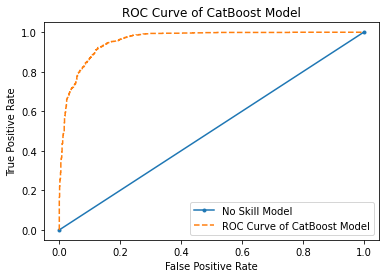

In [149]:
## Confusion Matrix
cm_CTB = confusion_matrix(y_test, predictions_testing_CTB)
print("Confusion Matrix : \n", cm_CTB)

## Classification Report
print(classification_report(y_test, predictions_testing_CTB))

## probability of falling into a particular class from each observation
probs_CTB = best_params_CTB.predict_proba(X_test_new)
probs_CTB = probs_CTB[:,1]

## AUC (Area Under Curve) Score
auc_score_CTB = roc_auc_score(y_test, probs_CTB)
print("CatBoost Model ROC AUC = ",format(auc_score_CTB,"0.2f"))

## no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
ns_auc = roc_auc_score(y_test, ns_probs)
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
plt.plot(ns_fpr, ns_tpr, marker='.', label='No Skill Model')

## ROC Curve
fpr_CTB, tpr_CTB, __CTB = roc_curve(y_test, probs_CTB)
plt.plot(fpr_CTB, tpr_CTB, linestyle='--', label='ROC Curve of CatBoost Model')
plt.title("ROC Curve of CatBoost Model")

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show legend
plt.legend()
# show the plot
plt.show()

# Voting Classifier 

In [150]:
# import library
from sklearn.ensemble import VotingClassifier

In [156]:
# group/ensemble of models
## we'll not include Support Vector Machine as ROC curve from it has 50% area as AUC score

estimator = []
estimator.append(('LR', LogisticRegression()))  # from baseline model
estimator.append(('DTC', DecisionTreeClassifier(max_leaf_nodes=96, random_state=0)))

estimator.append(('RFC', RandomForestClassifier(max_depth=100, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=400, random_state=0)))

estimator.append(('XGB', XGBClassifier(n_estimators= 180, max_depth= 6, learning_rate= 0.1, random_state=0)))


estimator.append(('LGB', lgb.LGBMClassifier(lambda_l1=1, lambda_l2=1, learning_rate=0.01,
               min_data_in_leaf=50, num_boost_round=2000, num_leaves=127,
               objective='binary', random_state=0, reg_alpha=0.5)))

estimator.append(('CTB', cb.CatBoostClassifier(thread_count= 4, learning_rate= 0.03, l2_leaf_reg= 1, iterations= 1000, depth= 7, border_count= 200, random_state=0)))

In [157]:
estimator

[('LR', LogisticRegression()),
 ('DTC', DecisionTreeClassifier(max_leaf_nodes=96, random_state=0)),
 ('RFC',
  RandomForestClassifier(max_depth=100, min_samples_leaf=2, min_samples_split=5,
                         n_estimators=400, random_state=0)),
 ('XGB',
  XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
                colsample_bynode=None, colsample_bytree=None, gamma=None,
                gpu_id=None, importance_type='gain', interaction_constraints=None,
                learning_rate=0.1, max_delta_step=None, max_depth=6,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                n_estimators=180, n_jobs=None, num_parallel_tree=None,
                random_state=0, reg_alpha=None, reg_lambda=None,
                scale_pos_weight=None, subsample=None, tree_method=None,
                validate_parameters=None, verbosity=None)),
 ('LGB',
  LGBMClassifier(lambda_l1=1, lambda_l2=1, learning_rate=0.01,
                 min_da

## ***Soft Voting***

In [226]:
# Voting Classifier with soft voting
vot_soft = VotingClassifier(estimators = estimator, voting = 'soft', verbose=1)
vot_soft.fit(X_train_new, y_train)

y_pred_train_soft = vot_soft.predict(X_train_new)
y_pred_test_soft = vot_soft.predict(X_test_new)

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[Voting] ....................... (1 of 6) Processing LR, total=   1.6s
[Voting] ...................... (2 of 6) Processing DTC, total=   0.7s
[Voting] ...................... (3 of 6) Processing RFC, total=  15.4s


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[01:58:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[Voting] ...................... (4 of 6) Processing XGB, total=   8.5s


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[Voting] ...................... (5 of 6) Processing LGB, total=  30.3s
0:	learn: 0.6720883	total: 76.4ms	remaining: 1m 16s
1:	learn: 0.6514480	total: 91.7ms	remaining: 45.8s
2:	learn: 0.6323347	total: 107ms	remaining: 35.6s
3:	learn: 0.6150474	total: 134ms	remaining: 33.3s
4:	learn: 0.6002256	total: 150ms	remaining: 29.8s
5:	learn: 0.5834109	total: 169ms	remaining: 28s
6:	learn: 0.5696956	total: 188ms	remaining: 26.7s
7:	learn: 0.5565182	total: 205ms	remaining: 25.4s
8:	learn: 0.5452607	total: 222ms	remaining: 24.5s
9:	learn: 0.5347106	total: 239ms	remaining: 23.6s
10:	learn: 0.5224027	total: 256ms	remaining: 23.1s
11:	learn: 0.5110045	total: 273ms	remaining: 22.5s
12:	learn: 0.5017908	total: 287ms	remaining: 21.8s
13:	learn: 0.4931964	total: 303ms	remaining: 21.3s
14:	learn: 0.4858259	total: 317ms	remaining: 20.8s
15:	learn: 0.4783527	total: 332ms	remaining: 20.4s
16:	learn: 0.4696614	total: 351ms	remaining: 20.3s
17:	learn: 0.4629691	total: 367ms	remaining: 20s
18:	learn: 0.4564558	t

163:	learn: 0.2694585	total: 2.79s	remaining: 14.2s
164:	learn: 0.2692540	total: 2.8s	remaining: 14.2s
165:	learn: 0.2688866	total: 2.82s	remaining: 14.2s
166:	learn: 0.2684170	total: 2.83s	remaining: 14.1s
167:	learn: 0.2681025	total: 2.85s	remaining: 14.1s
168:	learn: 0.2675845	total: 2.86s	remaining: 14.1s
169:	learn: 0.2672225	total: 2.87s	remaining: 14s
170:	learn: 0.2668514	total: 2.89s	remaining: 14s
171:	learn: 0.2665855	total: 2.9s	remaining: 14s
172:	learn: 0.2661639	total: 2.91s	remaining: 13.9s
173:	learn: 0.2660962	total: 2.92s	remaining: 13.9s
174:	learn: 0.2657040	total: 2.93s	remaining: 13.8s
175:	learn: 0.2654777	total: 2.95s	remaining: 13.8s
176:	learn: 0.2651119	total: 2.97s	remaining: 13.8s
177:	learn: 0.2647831	total: 2.98s	remaining: 13.8s
178:	learn: 0.2643162	total: 2.99s	remaining: 13.7s
179:	learn: 0.2642358	total: 3.01s	remaining: 13.7s
180:	learn: 0.2639084	total: 3.03s	remaining: 13.7s
181:	learn: 0.2636140	total: 3.04s	remaining: 13.7s
182:	learn: 0.263435

331:	learn: 0.2313095	total: 5.77s	remaining: 11.6s
332:	learn: 0.2310886	total: 5.78s	remaining: 11.6s
333:	learn: 0.2309506	total: 5.8s	remaining: 11.6s
334:	learn: 0.2308128	total: 5.81s	remaining: 11.5s
335:	learn: 0.2305897	total: 5.82s	remaining: 11.5s
336:	learn: 0.2304230	total: 5.84s	remaining: 11.5s
337:	learn: 0.2301561	total: 5.85s	remaining: 11.5s
338:	learn: 0.2298796	total: 5.86s	remaining: 11.4s
339:	learn: 0.2296574	total: 5.88s	remaining: 11.4s
340:	learn: 0.2295525	total: 5.89s	remaining: 11.4s
341:	learn: 0.2293743	total: 5.9s	remaining: 11.4s
342:	learn: 0.2292157	total: 5.91s	remaining: 11.3s
343:	learn: 0.2290030	total: 5.93s	remaining: 11.3s
344:	learn: 0.2287613	total: 5.94s	remaining: 11.3s
345:	learn: 0.2284526	total: 5.96s	remaining: 11.3s
346:	learn: 0.2282173	total: 5.97s	remaining: 11.2s
347:	learn: 0.2280062	total: 5.98s	remaining: 11.2s
348:	learn: 0.2278510	total: 6s	remaining: 11.2s
349:	learn: 0.2275787	total: 6.01s	remaining: 11.2s
350:	learn: 0.227

492:	learn: 0.2027654	total: 9.2s	remaining: 9.46s
493:	learn: 0.2026421	total: 9.21s	remaining: 9.44s
494:	learn: 0.2024581	total: 9.23s	remaining: 9.41s
495:	learn: 0.2023195	total: 9.25s	remaining: 9.39s
496:	learn: 0.2022389	total: 9.26s	remaining: 9.37s
497:	learn: 0.2020520	total: 9.43s	remaining: 9.5s
498:	learn: 0.2019645	total: 9.45s	remaining: 9.49s
499:	learn: 0.2018968	total: 9.46s	remaining: 9.46s
500:	learn: 0.2017390	total: 9.48s	remaining: 9.44s
501:	learn: 0.2016214	total: 9.5s	remaining: 9.42s
502:	learn: 0.2014792	total: 9.51s	remaining: 9.4s
503:	learn: 0.2013689	total: 9.53s	remaining: 9.38s
504:	learn: 0.2012739	total: 9.55s	remaining: 9.36s
505:	learn: 0.2011116	total: 9.56s	remaining: 9.34s
506:	learn: 0.2009881	total: 9.58s	remaining: 9.31s
507:	learn: 0.2008405	total: 9.6s	remaining: 9.29s
508:	learn: 0.2007353	total: 9.61s	remaining: 9.27s
509:	learn: 0.2006093	total: 9.63s	remaining: 9.25s
510:	learn: 0.2004568	total: 9.65s	remaining: 9.23s
511:	learn: 0.200

657:	learn: 0.1824807	total: 12.2s	remaining: 6.32s
658:	learn: 0.1823547	total: 12.2s	remaining: 6.3s
659:	learn: 0.1823021	total: 12.2s	remaining: 6.28s
660:	learn: 0.1822455	total: 12.2s	remaining: 6.26s
661:	learn: 0.1821991	total: 12.2s	remaining: 6.24s
662:	learn: 0.1820687	total: 12.2s	remaining: 6.22s
663:	learn: 0.1819418	total: 12.3s	remaining: 6.2s
664:	learn: 0.1818215	total: 12.3s	remaining: 6.18s
665:	learn: 0.1817439	total: 12.3s	remaining: 6.17s
666:	learn: 0.1816515	total: 12.3s	remaining: 6.14s
667:	learn: 0.1816128	total: 12.3s	remaining: 6.13s
668:	learn: 0.1815114	total: 12.3s	remaining: 6.11s
669:	learn: 0.1813129	total: 12.4s	remaining: 6.08s
670:	learn: 0.1812313	total: 12.4s	remaining: 6.07s
671:	learn: 0.1811557	total: 12.4s	remaining: 6.05s
672:	learn: 0.1810573	total: 12.4s	remaining: 6.03s
673:	learn: 0.1809198	total: 12.4s	remaining: 6.01s
674:	learn: 0.1808331	total: 12.4s	remaining: 5.99s
675:	learn: 0.1807123	total: 12.5s	remaining: 5.97s
676:	learn: 0.

827:	learn: 0.1642745	total: 14.7s	remaining: 3.04s
828:	learn: 0.1641810	total: 14.7s	remaining: 3.03s
829:	learn: 0.1641131	total: 14.7s	remaining: 3.01s
830:	learn: 0.1640146	total: 14.7s	remaining: 2.99s
831:	learn: 0.1639251	total: 14.7s	remaining: 2.97s
832:	learn: 0.1638501	total: 14.7s	remaining: 2.95s
833:	learn: 0.1638171	total: 14.7s	remaining: 2.93s
834:	learn: 0.1637417	total: 14.8s	remaining: 2.91s
835:	learn: 0.1636360	total: 14.8s	remaining: 2.9s
836:	learn: 0.1635529	total: 14.8s	remaining: 2.88s
837:	learn: 0.1635396	total: 14.8s	remaining: 2.86s
838:	learn: 0.1634711	total: 14.8s	remaining: 2.84s
839:	learn: 0.1633808	total: 14.8s	remaining: 2.82s
840:	learn: 0.1632845	total: 14.8s	remaining: 2.8s
841:	learn: 0.1632107	total: 14.8s	remaining: 2.79s
842:	learn: 0.1631196	total: 14.9s	remaining: 2.77s
843:	learn: 0.1630541	total: 14.9s	remaining: 2.75s
844:	learn: 0.1629878	total: 14.9s	remaining: 2.73s
845:	learn: 0.1628720	total: 14.9s	remaining: 2.71s
846:	learn: 0.

986:	learn: 0.1496812	total: 16.8s	remaining: 221ms
987:	learn: 0.1495769	total: 16.8s	remaining: 204ms
988:	learn: 0.1494817	total: 16.8s	remaining: 187ms
989:	learn: 0.1494477	total: 16.8s	remaining: 170ms
990:	learn: 0.1494105	total: 16.8s	remaining: 153ms
991:	learn: 0.1493431	total: 16.8s	remaining: 136ms
992:	learn: 0.1492840	total: 16.9s	remaining: 119ms
993:	learn: 0.1491814	total: 16.9s	remaining: 102ms
994:	learn: 0.1490728	total: 16.9s	remaining: 84.9ms
995:	learn: 0.1489872	total: 16.9s	remaining: 67.9ms
996:	learn: 0.1489004	total: 16.9s	remaining: 50.9ms
997:	learn: 0.1487950	total: 16.9s	remaining: 33.9ms
998:	learn: 0.1487176	total: 16.9s	remaining: 17ms
999:	learn: 0.1486496	total: 17s	remaining: 0us
[Voting] ...................... (6 of 6) Processing CTB, total=  20.9s


In [227]:
# using accuracy_score metric to predict accuracy
training_accuracy_soft = accuracy_score(y_train, y_pred_train_soft)
score=cross_val_score(VotingClassifier(estimators = estimator, voting = 'soft', verbose=1),X_train_new, y_train, cv=5)
training_accuracy_soft_CV=score.mean()
testing_accuracy_soft = accuracy_score(y_test, y_pred_test_soft)

print("Training accuracy after applying Voting(soft) Classifier: ", format(training_accuracy_soft,"0.2f"))
print("Training accuracy of Voting (Soft) Classifier after Cross Validation: ", format(training_accuracy_soft_CV,"0.2f"))
print("Testing accuracy after applying Voting(soft) Classifier: ", format(testing_accuracy_soft,"0.2f"))

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[Voting] ....................... (1 of 6) Processing LR, total=   0.8s
[Voting] ...................... (2 of 6) Processing DTC, total=   0.2s
[Voting] ...................... (3 of 6) Processing RFC, total=   7.7s
[02:00:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[Voting] ...................... (4 of 6) Processing XGB, total=   4.9s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[Voting] ...................... (5 of 6) Processing LGB, total=  16.1s
0:	learn: 0.6710553	total: 41.4ms	remaining: 41.3s
1:	learn: 0.6505959	total: 65.2ms	remaining: 32.5s
2:	learn: 0.6306099	total: 84.4ms	remaining: 28.1s
3:	learn: 0.6149505	total: 99.2ms	remaining: 24.7s
4:	learn: 0.6003040	total: 115ms	remaining: 23s
5:	learn: 0.5842518	total: 133ms	remaining: 22s
6:	learn: 0.5701528	total: 151ms	remaining: 21.4s
7:	learn: 0.5570128	total: 164ms	remaining: 20.3s
8:	learn: 0.5444250	total: 175ms	remaining: 19.3s
9:	learn: 0.5338334	total: 186ms	remaining: 18.4s
10:	learn: 0.5234155	total: 196ms	remaining: 17.7s
11:	learn: 0.5122038	total: 207ms	remaining: 17s
12:	learn: 0.5026138	total: 218ms	remaining: 16.5s
13:	learn: 0.4935636	total: 231ms	remaining: 16.3s
14:	learn: 0.4855920	total: 243ms	remaining: 15.9s
15:	learn: 0.4774759	total: 254ms	remaining: 15.6s
16:	learn: 0.4685793	total: 266ms	remaining: 15.4s
17:	learn: 0.4609476	total: 278ms	remaining: 15.2s
18:	learn: 0.4542893	to

163:	learn: 0.2634588	total: 2s	remaining: 10.2s
164:	learn: 0.2632325	total: 2.01s	remaining: 10.2s
165:	learn: 0.2630739	total: 2.02s	remaining: 10.2s
166:	learn: 0.2627255	total: 2.04s	remaining: 10.2s
167:	learn: 0.2624869	total: 2.05s	remaining: 10.1s
168:	learn: 0.2622943	total: 2.06s	remaining: 10.1s
169:	learn: 0.2621629	total: 2.07s	remaining: 10.1s
170:	learn: 0.2616783	total: 2.08s	remaining: 10.1s
171:	learn: 0.2613137	total: 2.09s	remaining: 10.1s
172:	learn: 0.2606264	total: 2.1s	remaining: 10.1s
173:	learn: 0.2601780	total: 2.12s	remaining: 10s
174:	learn: 0.2599426	total: 2.13s	remaining: 10s
175:	learn: 0.2597635	total: 2.14s	remaining: 10s
176:	learn: 0.2596010	total: 2.15s	remaining: 9.99s
177:	learn: 0.2590740	total: 2.16s	remaining: 9.97s
178:	learn: 0.2588342	total: 2.17s	remaining: 9.97s
179:	learn: 0.2587136	total: 2.18s	remaining: 9.95s
180:	learn: 0.2585996	total: 2.2s	remaining: 9.94s
181:	learn: 0.2581422	total: 2.21s	remaining: 9.93s
182:	learn: 0.2578806	t

327:	learn: 0.2251105	total: 3.94s	remaining: 8.08s
328:	learn: 0.2249914	total: 3.96s	remaining: 8.07s
329:	learn: 0.2248004	total: 3.97s	remaining: 8.05s
330:	learn: 0.2246551	total: 3.98s	remaining: 8.04s
331:	learn: 0.2244150	total: 3.99s	remaining: 8.03s
332:	learn: 0.2241551	total: 4s	remaining: 8.02s
333:	learn: 0.2238331	total: 4.01s	remaining: 8s
334:	learn: 0.2235605	total: 4.03s	remaining: 7.99s
335:	learn: 0.2233864	total: 4.04s	remaining: 7.98s
336:	learn: 0.2230687	total: 4.05s	remaining: 7.97s
337:	learn: 0.2229628	total: 4.06s	remaining: 7.96s
338:	learn: 0.2227600	total: 4.07s	remaining: 7.94s
339:	learn: 0.2224735	total: 4.09s	remaining: 7.94s
340:	learn: 0.2222171	total: 4.1s	remaining: 7.92s
341:	learn: 0.2218716	total: 4.11s	remaining: 7.91s
342:	learn: 0.2217142	total: 4.13s	remaining: 7.9s
343:	learn: 0.2212834	total: 4.14s	remaining: 7.89s
344:	learn: 0.2212067	total: 4.15s	remaining: 7.88s
345:	learn: 0.2208924	total: 4.16s	remaining: 7.87s
346:	learn: 0.220591

499:	learn: 0.1915664	total: 6.19s	remaining: 6.19s
500:	learn: 0.1914666	total: 6.2s	remaining: 6.18s
501:	learn: 0.1913107	total: 6.21s	remaining: 6.17s
502:	learn: 0.1911315	total: 6.23s	remaining: 6.15s
503:	learn: 0.1910527	total: 6.24s	remaining: 6.14s
504:	learn: 0.1909296	total: 6.25s	remaining: 6.13s
505:	learn: 0.1907427	total: 6.26s	remaining: 6.11s
506:	learn: 0.1905618	total: 6.27s	remaining: 6.1s
507:	learn: 0.1904397	total: 6.29s	remaining: 6.09s
508:	learn: 0.1902685	total: 6.3s	remaining: 6.08s
509:	learn: 0.1901442	total: 6.31s	remaining: 6.06s
510:	learn: 0.1899592	total: 6.32s	remaining: 6.05s
511:	learn: 0.1898407	total: 6.33s	remaining: 6.04s
512:	learn: 0.1896412	total: 6.35s	remaining: 6.02s
513:	learn: 0.1894400	total: 6.36s	remaining: 6.01s
514:	learn: 0.1892949	total: 6.37s	remaining: 6s
515:	learn: 0.1890105	total: 6.38s	remaining: 5.99s
516:	learn: 0.1889354	total: 6.39s	remaining: 5.97s
517:	learn: 0.1888051	total: 6.4s	remaining: 5.96s
518:	learn: 0.18862

664:	learn: 0.1689396	total: 8.14s	remaining: 4.1s
665:	learn: 0.1688353	total: 8.15s	remaining: 4.09s
666:	learn: 0.1687444	total: 8.16s	remaining: 4.08s
667:	learn: 0.1686113	total: 8.18s	remaining: 4.06s
668:	learn: 0.1685393	total: 8.19s	remaining: 4.05s
669:	learn: 0.1683586	total: 8.2s	remaining: 4.04s
670:	learn: 0.1682359	total: 8.22s	remaining: 4.03s
671:	learn: 0.1681326	total: 8.23s	remaining: 4.02s
672:	learn: 0.1679776	total: 8.25s	remaining: 4.01s
673:	learn: 0.1677025	total: 8.26s	remaining: 4s
674:	learn: 0.1676141	total: 8.27s	remaining: 3.98s
675:	learn: 0.1675299	total: 8.28s	remaining: 3.97s
676:	learn: 0.1673615	total: 8.29s	remaining: 3.96s
677:	learn: 0.1672192	total: 8.31s	remaining: 3.94s
678:	learn: 0.1671227	total: 8.32s	remaining: 3.93s
679:	learn: 0.1669395	total: 8.33s	remaining: 3.92s
680:	learn: 0.1668582	total: 8.35s	remaining: 3.91s
681:	learn: 0.1667319	total: 8.36s	remaining: 3.9s
682:	learn: 0.1666144	total: 8.38s	remaining: 3.89s
683:	learn: 0.1665

829:	learn: 0.1502966	total: 10.3s	remaining: 2.1s
830:	learn: 0.1502090	total: 10.3s	remaining: 2.09s
831:	learn: 0.1501235	total: 10.3s	remaining: 2.08s
832:	learn: 0.1499622	total: 10.3s	remaining: 2.06s
833:	learn: 0.1499382	total: 10.3s	remaining: 2.05s
834:	learn: 0.1498704	total: 10.3s	remaining: 2.04s
835:	learn: 0.1497487	total: 10.3s	remaining: 2.03s
836:	learn: 0.1496766	total: 10.4s	remaining: 2.02s
837:	learn: 0.1496466	total: 10.4s	remaining: 2s
838:	learn: 0.1495141	total: 10.4s	remaining: 1.99s
839:	learn: 0.1493674	total: 10.4s	remaining: 1.98s
840:	learn: 0.1493134	total: 10.4s	remaining: 1.97s
841:	learn: 0.1492186	total: 10.4s	remaining: 1.95s
842:	learn: 0.1491310	total: 10.4s	remaining: 1.94s
843:	learn: 0.1490068	total: 10.4s	remaining: 1.93s
844:	learn: 0.1488659	total: 10.4s	remaining: 1.92s
845:	learn: 0.1487684	total: 10.5s	remaining: 1.9s
846:	learn: 0.1486975	total: 10.5s	remaining: 1.89s
847:	learn: 0.1486368	total: 10.5s	remaining: 1.88s
848:	learn: 0.148

997:	learn: 0.1356931	total: 12.4s	remaining: 24.8ms
998:	learn: 0.1356448	total: 12.4s	remaining: 12.4ms
999:	learn: 0.1356103	total: 12.4s	remaining: 0us
[Voting] ...................... (6 of 6) Processing CTB, total=  14.3s


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[Voting] ....................... (1 of 6) Processing LR, total=   0.5s
[Voting] ...................... (2 of 6) Processing DTC, total=   0.1s
[Voting] ...................... (3 of 6) Processing RFC, total=   6.4s


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:01:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[Voting] ...................... (4 of 6) Processing XGB, total=   3.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[Voting] ...................... (5 of 6) Processing LGB, total=  13.6s
0:	learn: 0.6718293	total: 14.2ms	remaining: 14.2s
1:	learn: 0.6506916	total: 27.6ms	remaining: 13.8s
2:	learn: 0.6302460	total: 41ms	remaining: 13.6s
3:	learn: 0.6137200	total: 54.3ms	remaining: 13.5s
4:	learn: 0.5990682	total: 67.5ms	remaining: 13.4s
5:	learn: 0.5816296	total: 80.2ms	remaining: 13.3s
6:	learn: 0.5677892	total: 96.7ms	remaining: 13.7s
7:	learn: 0.5541454	total: 113ms	remaining: 14s
8:	learn: 0.5433993	total: 129ms	remaining: 14.2s
9:	learn: 0.5324462	total: 141ms	remaining: 14s
10:	learn: 0.5198107	total: 153ms	remaining: 13.7s
11:	learn: 0.5095400	total: 165ms	remaining: 13.6s
12:	learn: 0.5005001	total: 177ms	remaining: 13.4s
13:	learn: 0.4916522	total: 189ms	remaining: 13.3s
14:	learn: 0.4832125	total: 201ms	remaining: 13.2s
15:	learn: 0.4752355	total: 213ms	remaining: 13.1s
16:	learn: 0.4684353	total: 227ms	remaining: 13.1s
17:	learn: 0.4608468	total: 239ms	remaining: 13s
18:	learn: 0.4541121	t

170:	learn: 0.2605486	total: 2.15s	remaining: 10.4s
171:	learn: 0.2602679	total: 2.16s	remaining: 10.4s
172:	learn: 0.2597725	total: 2.17s	remaining: 10.4s
173:	learn: 0.2591470	total: 2.22s	remaining: 10.5s
174:	learn: 0.2587260	total: 2.23s	remaining: 10.5s
175:	learn: 0.2584263	total: 2.25s	remaining: 10.5s
176:	learn: 0.2581746	total: 2.26s	remaining: 10.5s
177:	learn: 0.2580001	total: 2.28s	remaining: 10.5s
178:	learn: 0.2575050	total: 2.29s	remaining: 10.5s
179:	learn: 0.2571802	total: 2.31s	remaining: 10.5s
180:	learn: 0.2568862	total: 2.32s	remaining: 10.5s
181:	learn: 0.2566542	total: 2.33s	remaining: 10.5s
182:	learn: 0.2564919	total: 2.34s	remaining: 10.5s
183:	learn: 0.2561534	total: 2.35s	remaining: 10.4s
184:	learn: 0.2558055	total: 2.37s	remaining: 10.4s
185:	learn: 0.2554204	total: 2.38s	remaining: 10.4s
186:	learn: 0.2552952	total: 2.39s	remaining: 10.4s
187:	learn: 0.2550547	total: 2.4s	remaining: 10.4s
188:	learn: 0.2548513	total: 2.42s	remaining: 10.4s
189:	learn: 0

337:	learn: 0.2206149	total: 4.27s	remaining: 8.37s
338:	learn: 0.2203685	total: 4.28s	remaining: 8.35s
339:	learn: 0.2203065	total: 4.29s	remaining: 8.34s
340:	learn: 0.2200566	total: 4.31s	remaining: 8.33s
341:	learn: 0.2199182	total: 4.32s	remaining: 8.31s
342:	learn: 0.2197359	total: 4.33s	remaining: 8.29s
343:	learn: 0.2195441	total: 4.34s	remaining: 8.28s
344:	learn: 0.2194063	total: 4.35s	remaining: 8.26s
345:	learn: 0.2191630	total: 4.36s	remaining: 8.25s
346:	learn: 0.2188941	total: 4.38s	remaining: 8.23s
347:	learn: 0.2186605	total: 4.39s	remaining: 8.22s
348:	learn: 0.2184138	total: 4.4s	remaining: 8.2s
349:	learn: 0.2181090	total: 4.41s	remaining: 8.19s
350:	learn: 0.2178430	total: 4.42s	remaining: 8.18s
351:	learn: 0.2177018	total: 4.44s	remaining: 8.17s
352:	learn: 0.2175083	total: 4.46s	remaining: 8.17s
353:	learn: 0.2173252	total: 4.47s	remaining: 8.16s
354:	learn: 0.2171071	total: 4.49s	remaining: 8.15s
355:	learn: 0.2169130	total: 4.5s	remaining: 8.14s
356:	learn: 0.2

506:	learn: 0.1907352	total: 6.75s	remaining: 6.56s
507:	learn: 0.1905905	total: 6.76s	remaining: 6.55s
508:	learn: 0.1905004	total: 6.77s	remaining: 6.53s
509:	learn: 0.1903569	total: 6.79s	remaining: 6.52s
510:	learn: 0.1902332	total: 6.8s	remaining: 6.51s
511:	learn: 0.1900660	total: 6.82s	remaining: 6.5s
512:	learn: 0.1898896	total: 6.83s	remaining: 6.49s
513:	learn: 0.1896698	total: 6.85s	remaining: 6.48s
514:	learn: 0.1895237	total: 6.87s	remaining: 6.47s
515:	learn: 0.1893620	total: 6.89s	remaining: 6.46s
516:	learn: 0.1892144	total: 6.9s	remaining: 6.45s
517:	learn: 0.1890684	total: 6.92s	remaining: 6.44s
518:	learn: 0.1889409	total: 6.93s	remaining: 6.43s
519:	learn: 0.1888657	total: 6.95s	remaining: 6.42s
520:	learn: 0.1887486	total: 6.97s	remaining: 6.41s
521:	learn: 0.1885584	total: 6.99s	remaining: 6.4s
522:	learn: 0.1884131	total: 7s	remaining: 6.39s
523:	learn: 0.1882605	total: 7.02s	remaining: 6.38s
524:	learn: 0.1880983	total: 7.03s	remaining: 6.36s
525:	learn: 0.18791

665:	learn: 0.1691942	total: 8.88s	remaining: 4.46s
666:	learn: 0.1690579	total: 8.9s	remaining: 4.44s
667:	learn: 0.1689096	total: 8.91s	remaining: 4.43s
668:	learn: 0.1688442	total: 8.93s	remaining: 4.42s
669:	learn: 0.1687184	total: 8.94s	remaining: 4.4s
670:	learn: 0.1686139	total: 8.95s	remaining: 4.39s
671:	learn: 0.1684936	total: 8.96s	remaining: 4.38s
672:	learn: 0.1683727	total: 8.98s	remaining: 4.36s
673:	learn: 0.1682690	total: 8.99s	remaining: 4.35s
674:	learn: 0.1682209	total: 9s	remaining: 4.33s
675:	learn: 0.1681330	total: 9.01s	remaining: 4.32s
676:	learn: 0.1680379	total: 9.02s	remaining: 4.3s
677:	learn: 0.1678606	total: 9.04s	remaining: 4.29s
678:	learn: 0.1677330	total: 9.05s	remaining: 4.28s
679:	learn: 0.1676084	total: 9.06s	remaining: 4.26s
680:	learn: 0.1674112	total: 9.08s	remaining: 4.25s
681:	learn: 0.1672770	total: 9.09s	remaining: 4.24s
682:	learn: 0.1671450	total: 9.11s	remaining: 4.23s
683:	learn: 0.1670131	total: 9.12s	remaining: 4.21s
684:	learn: 0.1668

825:	learn: 0.1510102	total: 10.8s	remaining: 2.28s
826:	learn: 0.1509536	total: 10.8s	remaining: 2.27s
827:	learn: 0.1507082	total: 10.9s	remaining: 2.25s
828:	learn: 0.1506386	total: 10.9s	remaining: 2.24s
829:	learn: 0.1505682	total: 10.9s	remaining: 2.23s
830:	learn: 0.1504623	total: 10.9s	remaining: 2.21s
831:	learn: 0.1504196	total: 10.9s	remaining: 2.2s
832:	learn: 0.1502854	total: 10.9s	remaining: 2.19s
833:	learn: 0.1502129	total: 10.9s	remaining: 2.17s
834:	learn: 0.1500866	total: 10.9s	remaining: 2.16s
835:	learn: 0.1500457	total: 10.9s	remaining: 2.15s
836:	learn: 0.1499661	total: 11s	remaining: 2.13s
837:	learn: 0.1498955	total: 11s	remaining: 2.12s
838:	learn: 0.1498264	total: 11s	remaining: 2.11s
839:	learn: 0.1497581	total: 11s	remaining: 2.09s
840:	learn: 0.1497053	total: 11s	remaining: 2.08s
841:	learn: 0.1496593	total: 11s	remaining: 2.07s
842:	learn: 0.1495845	total: 11s	remaining: 2.05s
843:	learn: 0.1494389	total: 11s	remaining: 2.04s
844:	learn: 0.1492749	total: 

992:	learn: 0.1357143	total: 13s	remaining: 91.7ms
993:	learn: 0.1355547	total: 13s	remaining: 78.6ms
994:	learn: 0.1355179	total: 13s	remaining: 65.5ms
995:	learn: 0.1354595	total: 13.1s	remaining: 52.4ms
996:	learn: 0.1354013	total: 13.1s	remaining: 39.3ms
997:	learn: 0.1352898	total: 13.1s	remaining: 26.2ms
998:	learn: 0.1351874	total: 13.1s	remaining: 13.1ms
999:	learn: 0.1351402	total: 13.1s	remaining: 0us
[Voting] ...................... (6 of 6) Processing CTB, total=  14.9s


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[Voting] ....................... (1 of 6) Processing LR, total=   0.3s
[Voting] ...................... (2 of 6) Processing DTC, total=   0.1s
[Voting] ...................... (3 of 6) Processing RFC, total=   5.9s
[02:01:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[Voting] ...................... (4 of 6) Processing XGB, total=   2.8s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[Voting] ...................... (5 of 6) Processing LGB, total=  14.4s
0:	learn: 0.6722329	total: 17.6ms	remaining: 17.6s
1:	learn: 0.6510914	total: 30.7ms	remaining: 15.3s
2:	learn: 0.6333036	total: 43.3ms	remaining: 14.4s
3:	learn: 0.6167548	total: 55.6ms	remaining: 13.8s
4:	learn: 0.6030783	total: 68ms	remaining: 13.5s
5:	learn: 0.5879982	total: 79.7ms	remaining: 13.2s
6:	learn: 0.5745316	total: 92ms	remaining: 13.1s
7:	learn: 0.5608353	total: 104ms	remaining: 12.8s
8:	learn: 0.5488392	total: 115ms	remaining: 12.7s
9:	learn: 0.5368519	total: 128ms	remaining: 12.7s
10:	learn: 0.5279327	total: 140ms	remaining: 12.6s
11:	learn: 0.5192574	total: 151ms	remaining: 12.4s
12:	learn: 0.5094574	total: 163ms	remaining: 12.4s
13:	learn: 0.4978134	total: 176ms	remaining: 12.4s
14:	learn: 0.4900682	total: 187ms	remaining: 12.3s
15:	learn: 0.4814302	total: 200ms	remaining: 12.3s
16:	learn: 0.4723716	total: 211ms	remaining: 12.2s
17:	learn: 0.4657767	total: 224ms	remaining: 12.2s
18:	learn: 0.45837

163:	learn: 0.2681189	total: 2.01s	remaining: 10.2s
164:	learn: 0.2675766	total: 2.02s	remaining: 10.2s
165:	learn: 0.2672705	total: 2.03s	remaining: 10.2s
166:	learn: 0.2671180	total: 2.04s	remaining: 10.2s
167:	learn: 0.2669927	total: 2.06s	remaining: 10.2s
168:	learn: 0.2668682	total: 2.07s	remaining: 10.2s
169:	learn: 0.2666100	total: 2.08s	remaining: 10.2s
170:	learn: 0.2663006	total: 2.09s	remaining: 10.1s
171:	learn: 0.2661109	total: 2.1s	remaining: 10.1s
172:	learn: 0.2658854	total: 2.12s	remaining: 10.1s
173:	learn: 0.2656509	total: 2.13s	remaining: 10.1s
174:	learn: 0.2652827	total: 2.14s	remaining: 10.1s
175:	learn: 0.2649330	total: 2.15s	remaining: 10.1s
176:	learn: 0.2646651	total: 2.16s	remaining: 10.1s
177:	learn: 0.2641432	total: 2.17s	remaining: 10s
178:	learn: 0.2639379	total: 2.19s	remaining: 10s
179:	learn: 0.2635756	total: 2.2s	remaining: 10s
180:	learn: 0.2634065	total: 2.21s	remaining: 10s
181:	learn: 0.2630033	total: 2.22s	remaining: 9.99s
182:	learn: 0.2626084	

324:	learn: 0.2255050	total: 3.94s	remaining: 8.18s
325:	learn: 0.2252536	total: 3.95s	remaining: 8.17s
326:	learn: 0.2250366	total: 3.96s	remaining: 8.15s
327:	learn: 0.2248058	total: 3.97s	remaining: 8.14s
328:	learn: 0.2246242	total: 3.98s	remaining: 8.13s
329:	learn: 0.2243850	total: 4s	remaining: 8.12s
330:	learn: 0.2241993	total: 4.01s	remaining: 8.1s
331:	learn: 0.2240419	total: 4.02s	remaining: 8.09s
332:	learn: 0.2239148	total: 4.03s	remaining: 8.08s
333:	learn: 0.2236523	total: 4.04s	remaining: 8.06s
334:	learn: 0.2234404	total: 4.06s	remaining: 8.05s
335:	learn: 0.2231610	total: 4.07s	remaining: 8.04s
336:	learn: 0.2229057	total: 4.08s	remaining: 8.03s
337:	learn: 0.2225761	total: 4.09s	remaining: 8.02s
338:	learn: 0.2221954	total: 4.11s	remaining: 8s
339:	learn: 0.2218944	total: 4.12s	remaining: 8s
340:	learn: 0.2217276	total: 4.13s	remaining: 7.99s
341:	learn: 0.2215077	total: 4.15s	remaining: 7.98s
342:	learn: 0.2212627	total: 4.16s	remaining: 7.97s
343:	learn: 0.2209692	

487:	learn: 0.1930386	total: 6.03s	remaining: 6.33s
488:	learn: 0.1928724	total: 6.04s	remaining: 6.32s
489:	learn: 0.1927642	total: 6.05s	remaining: 6.3s
490:	learn: 0.1925296	total: 6.07s	remaining: 6.29s
491:	learn: 0.1923500	total: 6.08s	remaining: 6.28s
492:	learn: 0.1921173	total: 6.09s	remaining: 6.27s
493:	learn: 0.1919537	total: 6.11s	remaining: 6.25s
494:	learn: 0.1917512	total: 6.12s	remaining: 6.24s
495:	learn: 0.1915906	total: 6.13s	remaining: 6.23s
496:	learn: 0.1914160	total: 6.14s	remaining: 6.21s
497:	learn: 0.1912437	total: 6.15s	remaining: 6.2s
498:	learn: 0.1910627	total: 6.17s	remaining: 6.19s
499:	learn: 0.1908992	total: 6.18s	remaining: 6.18s
500:	learn: 0.1907225	total: 6.19s	remaining: 6.17s
501:	learn: 0.1905810	total: 6.21s	remaining: 6.16s
502:	learn: 0.1904753	total: 6.22s	remaining: 6.14s
503:	learn: 0.1903715	total: 6.23s	remaining: 6.13s
504:	learn: 0.1902260	total: 6.25s	remaining: 6.12s
505:	learn: 0.1900273	total: 6.26s	remaining: 6.11s
506:	learn: 0.

650:	learn: 0.1703381	total: 8.15s	remaining: 4.37s
651:	learn: 0.1701818	total: 8.17s	remaining: 4.36s
652:	learn: 0.1700616	total: 8.18s	remaining: 4.35s
653:	learn: 0.1699579	total: 8.2s	remaining: 4.34s
654:	learn: 0.1698102	total: 8.22s	remaining: 4.33s
655:	learn: 0.1696714	total: 8.23s	remaining: 4.32s
656:	learn: 0.1695522	total: 8.25s	remaining: 4.31s
657:	learn: 0.1692937	total: 8.27s	remaining: 4.3s
658:	learn: 0.1691041	total: 8.29s	remaining: 4.29s
659:	learn: 0.1689820	total: 8.3s	remaining: 4.28s
660:	learn: 0.1687754	total: 8.32s	remaining: 4.27s
661:	learn: 0.1685638	total: 8.34s	remaining: 4.26s
662:	learn: 0.1684018	total: 8.35s	remaining: 4.25s
663:	learn: 0.1682613	total: 8.37s	remaining: 4.23s
664:	learn: 0.1680891	total: 8.39s	remaining: 4.22s
665:	learn: 0.1680281	total: 8.4s	remaining: 4.21s
666:	learn: 0.1679208	total: 8.42s	remaining: 4.2s
667:	learn: 0.1677084	total: 8.44s	remaining: 4.19s
668:	learn: 0.1676012	total: 8.45s	remaining: 4.18s
669:	learn: 0.167

819:	learn: 0.1500514	total: 10.9s	remaining: 2.39s
820:	learn: 0.1499772	total: 10.9s	remaining: 2.37s
821:	learn: 0.1498388	total: 10.9s	remaining: 2.36s
822:	learn: 0.1498099	total: 10.9s	remaining: 2.35s
823:	learn: 0.1496955	total: 10.9s	remaining: 2.33s
824:	learn: 0.1496215	total: 10.9s	remaining: 2.32s
825:	learn: 0.1495893	total: 11s	remaining: 2.31s
826:	learn: 0.1495208	total: 11s	remaining: 2.3s
827:	learn: 0.1493738	total: 11s	remaining: 2.28s
828:	learn: 0.1492186	total: 11s	remaining: 2.27s
829:	learn: 0.1491151	total: 11s	remaining: 2.26s
830:	learn: 0.1490238	total: 11s	remaining: 2.25s
831:	learn: 0.1489941	total: 11.1s	remaining: 2.23s
832:	learn: 0.1489529	total: 11.1s	remaining: 2.22s
833:	learn: 0.1488535	total: 11.1s	remaining: 2.21s
834:	learn: 0.1487541	total: 11.1s	remaining: 2.2s
835:	learn: 0.1486648	total: 11.1s	remaining: 2.18s
836:	learn: 0.1485597	total: 11.2s	remaining: 2.17s
837:	learn: 0.1484298	total: 11.2s	remaining: 2.16s
838:	learn: 0.1482368	tota

983:	learn: 0.1341308	total: 13.4s	remaining: 219ms
984:	learn: 0.1340674	total: 13.5s	remaining: 205ms
985:	learn: 0.1339952	total: 13.5s	remaining: 191ms
986:	learn: 0.1338468	total: 13.5s	remaining: 178ms
987:	learn: 0.1337103	total: 13.5s	remaining: 164ms
988:	learn: 0.1336223	total: 13.5s	remaining: 150ms
989:	learn: 0.1335269	total: 13.5s	remaining: 136ms
990:	learn: 0.1334517	total: 13.5s	remaining: 123ms
991:	learn: 0.1333735	total: 13.5s	remaining: 109ms
992:	learn: 0.1332492	total: 13.5s	remaining: 95.5ms
993:	learn: 0.1331309	total: 13.6s	remaining: 81.8ms
994:	learn: 0.1330461	total: 13.6s	remaining: 68.2ms
995:	learn: 0.1329669	total: 13.6s	remaining: 54.5ms
996:	learn: 0.1329048	total: 13.6s	remaining: 40.9ms
997:	learn: 0.1327562	total: 13.6s	remaining: 27.3ms
998:	learn: 0.1326724	total: 13.6s	remaining: 13.6ms
999:	learn: 0.1325925	total: 13.6s	remaining: 0us
[Voting] ...................... (6 of 6) Processing CTB, total=  16.8s


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[Voting] ....................... (1 of 6) Processing LR, total=   0.3s
[Voting] ...................... (2 of 6) Processing DTC, total=   0.1s
[Voting] ...................... (3 of 6) Processing RFC, total=   6.5s


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:02:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[Voting] ...................... (4 of 6) Processing XGB, total=   3.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[Voting] ...................... (5 of 6) Processing LGB, total=  13.7s
0:	learn: 0.6723211	total: 14.4ms	remaining: 14.4s
1:	learn: 0.6516287	total: 28.3ms	remaining: 14.1s
2:	learn: 0.6337320	total: 42.1ms	remaining: 14s
3:	learn: 0.6173959	total: 54.3ms	remaining: 13.5s
4:	learn: 0.6027692	total: 65.8ms	remaining: 13.1s
5:	learn: 0.5875055	total: 76.7ms	remaining: 12.7s
6:	learn: 0.5737308	total: 88.9ms	remaining: 12.6s
7:	learn: 0.5623585	total: 101ms	remaining: 12.5s
8:	learn: 0.5516080	total: 113ms	remaining: 12.4s
9:	learn: 0.5393734	total: 125ms	remaining: 12.4s
10:	learn: 0.5272932	total: 138ms	remaining: 12.4s
11:	learn: 0.5163490	total: 149ms	remaining: 12.3s
12:	learn: 0.5070372	total: 162ms	remaining: 12.3s
13:	learn: 0.4983095	total: 174ms	remaining: 12.3s
14:	learn: 0.4895951	total: 187ms	remaining: 12.3s
15:	learn: 0.4816262	total: 198ms	remaining: 12.2s
16:	learn: 0.4728171	total: 211ms	remaining: 12.2s
17:	learn: 0.4655600	total: 224ms	remaining: 12.2s
18:	learn: 0.459

161:	learn: 0.2682843	total: 1.97s	remaining: 10.2s
162:	learn: 0.2679761	total: 1.98s	remaining: 10.2s
163:	learn: 0.2675532	total: 1.99s	remaining: 10.1s
164:	learn: 0.2671456	total: 2s	remaining: 10.1s
165:	learn: 0.2668780	total: 2.02s	remaining: 10.1s
166:	learn: 0.2664527	total: 2.03s	remaining: 10.1s
167:	learn: 0.2662736	total: 2.04s	remaining: 10.1s
168:	learn: 0.2660330	total: 2.05s	remaining: 10.1s
169:	learn: 0.2656822	total: 2.06s	remaining: 10.1s
170:	learn: 0.2651616	total: 2.08s	remaining: 10.1s
171:	learn: 0.2648067	total: 2.09s	remaining: 10.1s
172:	learn: 0.2646254	total: 2.1s	remaining: 10s
173:	learn: 0.2642565	total: 2.11s	remaining: 10s
174:	learn: 0.2638635	total: 2.13s	remaining: 10s
175:	learn: 0.2633585	total: 2.14s	remaining: 10s
176:	learn: 0.2631761	total: 2.15s	remaining: 10s
177:	learn: 0.2629185	total: 2.17s	remaining: 10s
178:	learn: 0.2622531	total: 2.18s	remaining: 10s
179:	learn: 0.2620502	total: 2.19s	remaining: 10s
180:	learn: 0.2619097	total: 2.2

320:	learn: 0.2276159	total: 3.89s	remaining: 8.23s
321:	learn: 0.2274225	total: 3.9s	remaining: 8.22s
322:	learn: 0.2272727	total: 3.92s	remaining: 8.21s
323:	learn: 0.2270721	total: 3.93s	remaining: 8.19s
324:	learn: 0.2268320	total: 3.94s	remaining: 8.18s
325:	learn: 0.2265485	total: 3.95s	remaining: 8.17s
326:	learn: 0.2264648	total: 3.96s	remaining: 8.16s
327:	learn: 0.2263063	total: 3.98s	remaining: 8.15s
328:	learn: 0.2260609	total: 3.99s	remaining: 8.13s
329:	learn: 0.2256594	total: 4s	remaining: 8.12s
330:	learn: 0.2252767	total: 4.01s	remaining: 8.11s
331:	learn: 0.2250702	total: 4.02s	remaining: 8.1s
332:	learn: 0.2249213	total: 4.04s	remaining: 8.09s
333:	learn: 0.2245349	total: 4.05s	remaining: 8.07s
334:	learn: 0.2244080	total: 4.06s	remaining: 8.06s
335:	learn: 0.2241994	total: 4.07s	remaining: 8.05s
336:	learn: 0.2239160	total: 4.09s	remaining: 8.04s
337:	learn: 0.2236820	total: 4.1s	remaining: 8.03s
338:	learn: 0.2234242	total: 4.11s	remaining: 8.02s
339:	learn: 0.2232

482:	learn: 0.1970031	total: 5.83s	remaining: 6.24s
483:	learn: 0.1968071	total: 5.84s	remaining: 6.23s
484:	learn: 0.1966638	total: 5.85s	remaining: 6.21s
485:	learn: 0.1965469	total: 5.86s	remaining: 6.2s
486:	learn: 0.1964204	total: 5.88s	remaining: 6.19s
487:	learn: 0.1963347	total: 5.89s	remaining: 6.18s
488:	learn: 0.1962302	total: 5.9s	remaining: 6.16s
489:	learn: 0.1960912	total: 5.91s	remaining: 6.15s
490:	learn: 0.1959602	total: 5.93s	remaining: 6.14s
491:	learn: 0.1958257	total: 5.94s	remaining: 6.14s
492:	learn: 0.1957330	total: 5.96s	remaining: 6.13s
493:	learn: 0.1956182	total: 5.97s	remaining: 6.11s
494:	learn: 0.1954890	total: 5.98s	remaining: 6.1s
495:	learn: 0.1953712	total: 6s	remaining: 6.09s
496:	learn: 0.1952247	total: 6.01s	remaining: 6.09s
497:	learn: 0.1950279	total: 6.03s	remaining: 6.08s
498:	learn: 0.1949052	total: 6.06s	remaining: 6.08s
499:	learn: 0.1947666	total: 6.07s	remaining: 6.07s
500:	learn: 0.1945669	total: 6.09s	remaining: 6.06s
501:	learn: 0.1944

647:	learn: 0.1736847	total: 8.37s	remaining: 4.55s
648:	learn: 0.1735212	total: 8.39s	remaining: 4.54s
649:	learn: 0.1734693	total: 8.4s	remaining: 4.52s
650:	learn: 0.1733418	total: 8.42s	remaining: 4.51s
651:	learn: 0.1732170	total: 8.43s	remaining: 4.5s
652:	learn: 0.1729858	total: 8.45s	remaining: 4.49s
653:	learn: 0.1728322	total: 8.47s	remaining: 4.48s
654:	learn: 0.1727181	total: 8.49s	remaining: 4.47s
655:	learn: 0.1725896	total: 8.5s	remaining: 4.46s
656:	learn: 0.1724662	total: 8.52s	remaining: 4.45s
657:	learn: 0.1723502	total: 8.53s	remaining: 4.43s
658:	learn: 0.1722067	total: 8.55s	remaining: 4.42s
659:	learn: 0.1720347	total: 8.56s	remaining: 4.41s
660:	learn: 0.1719057	total: 8.58s	remaining: 4.4s
661:	learn: 0.1718290	total: 8.6s	remaining: 4.39s
662:	learn: 0.1717507	total: 8.61s	remaining: 4.38s
663:	learn: 0.1715156	total: 8.63s	remaining: 4.37s
664:	learn: 0.1713645	total: 8.66s	remaining: 4.36s
665:	learn: 0.1712693	total: 8.68s	remaining: 4.35s
666:	learn: 0.171

807:	learn: 0.1536928	total: 10.9s	remaining: 2.59s
808:	learn: 0.1535981	total: 10.9s	remaining: 2.57s
809:	learn: 0.1534397	total: 10.9s	remaining: 2.56s
810:	learn: 0.1532732	total: 10.9s	remaining: 2.55s
811:	learn: 0.1531934	total: 10.9s	remaining: 2.53s
812:	learn: 0.1530530	total: 11s	remaining: 2.52s
813:	learn: 0.1529478	total: 11s	remaining: 2.51s
814:	learn: 0.1529025	total: 11s	remaining: 2.49s
815:	learn: 0.1527200	total: 11s	remaining: 2.48s
816:	learn: 0.1525745	total: 11s	remaining: 2.46s
817:	learn: 0.1524602	total: 11s	remaining: 2.45s
818:	learn: 0.1523534	total: 11s	remaining: 2.44s
819:	learn: 0.1522347	total: 11s	remaining: 2.42s
820:	learn: 0.1521662	total: 11.1s	remaining: 2.41s
821:	learn: 0.1519587	total: 11.1s	remaining: 2.4s
822:	learn: 0.1518787	total: 11.1s	remaining: 2.38s
823:	learn: 0.1516831	total: 11.1s	remaining: 2.37s
824:	learn: 0.1515896	total: 11.1s	remaining: 2.35s
825:	learn: 0.1515133	total: 11.1s	remaining: 2.34s
826:	learn: 0.1513459	total: 

975:	learn: 0.1365150	total: 13s	remaining: 320ms
976:	learn: 0.1364547	total: 13s	remaining: 306ms
977:	learn: 0.1363621	total: 13s	remaining: 293ms
978:	learn: 0.1362678	total: 13s	remaining: 280ms
979:	learn: 0.1361648	total: 13.1s	remaining: 266ms
980:	learn: 0.1360868	total: 13.1s	remaining: 253ms
981:	learn: 0.1359442	total: 13.1s	remaining: 240ms
982:	learn: 0.1358777	total: 13.1s	remaining: 226ms
983:	learn: 0.1357826	total: 13.1s	remaining: 213ms
984:	learn: 0.1357183	total: 13.1s	remaining: 200ms
985:	learn: 0.1356398	total: 13.1s	remaining: 186ms
986:	learn: 0.1355065	total: 13.1s	remaining: 173ms
987:	learn: 0.1353598	total: 13.2s	remaining: 160ms
988:	learn: 0.1352394	total: 13.2s	remaining: 146ms
989:	learn: 0.1351202	total: 13.2s	remaining: 133ms
990:	learn: 0.1350117	total: 13.2s	remaining: 120ms
991:	learn: 0.1348599	total: 13.2s	remaining: 106ms
992:	learn: 0.1347685	total: 13.2s	remaining: 93.2ms
993:	learn: 0.1346500	total: 13.2s	remaining: 79.9ms
994:	learn: 0.1345

C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[Voting] ....................... (1 of 6) Processing LR, total=   0.3s
[Voting] ...................... (2 of 6) Processing DTC, total=   0.1s
[Voting] ...................... (3 of 6) Processing RFC, total=   6.1s


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[02:03:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[Voting] ...................... (4 of 6) Processing XGB, total=   3.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Koyel\AppData\Local\Programs\Python\Python39\lib\site-packages\lightgbm\engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[Voting] ...................... (5 of 6) Processing LGB, total=  13.2s
0:	learn: 0.6740436	total: 12.7ms	remaining: 12.6s
1:	learn: 0.6539769	total: 25.7ms	remaining: 12.8s
2:	learn: 0.6345385	total: 37.5ms	remaining: 12.5s
3:	learn: 0.6173566	total: 49.9ms	remaining: 12.4s
4:	learn: 0.6031220	total: 61.1ms	remaining: 12.2s
5:	learn: 0.5880770	total: 74.4ms	remaining: 12.3s
6:	learn: 0.5739318	total: 85.8ms	remaining: 12.2s
7:	learn: 0.5604747	total: 98.3ms	remaining: 12.2s
8:	learn: 0.5494560	total: 110ms	remaining: 12.1s
9:	learn: 0.5386433	total: 122ms	remaining: 12.1s
10:	learn: 0.5259996	total: 134ms	remaining: 12.1s
11:	learn: 0.5162453	total: 146ms	remaining: 12s
12:	learn: 0.5070651	total: 159ms	remaining: 12s
13:	learn: 0.4979821	total: 171ms	remaining: 12s
14:	learn: 0.4893934	total: 183ms	remaining: 12s
15:	learn: 0.4818102	total: 196ms	remaining: 12.1s
16:	learn: 0.4731240	total: 208ms	remaining: 12s
17:	learn: 0.4657288	total: 223ms	remaining: 12.1s
18:	learn: 0.4597929	to

173:	learn: 0.2640770	total: 2.12s	remaining: 10s
174:	learn: 0.2637680	total: 2.13s	remaining: 10s
175:	learn: 0.2632276	total: 2.14s	remaining: 10s
176:	learn: 0.2629116	total: 2.15s	remaining: 10s
177:	learn: 0.2627428	total: 2.17s	remaining: 10s
178:	learn: 0.2623298	total: 2.18s	remaining: 9.99s
179:	learn: 0.2620663	total: 2.19s	remaining: 9.97s
180:	learn: 0.2617115	total: 2.2s	remaining: 9.95s
181:	learn: 0.2614852	total: 2.21s	remaining: 9.94s
182:	learn: 0.2612679	total: 2.22s	remaining: 9.93s
183:	learn: 0.2609434	total: 2.23s	remaining: 9.91s
184:	learn: 0.2606241	total: 2.25s	remaining: 9.89s
185:	learn: 0.2603074	total: 2.26s	remaining: 9.88s
186:	learn: 0.2600663	total: 2.27s	remaining: 9.87s
187:	learn: 0.2597025	total: 2.28s	remaining: 9.85s
188:	learn: 0.2593419	total: 2.29s	remaining: 9.85s
189:	learn: 0.2591199	total: 2.31s	remaining: 9.83s
190:	learn: 0.2587897	total: 2.32s	remaining: 9.82s
191:	learn: 0.2585534	total: 2.33s	remaining: 9.81s
192:	learn: 0.2583311	t

335:	learn: 0.2253510	total: 4.05s	remaining: 8s
336:	learn: 0.2251810	total: 4.06s	remaining: 7.98s
337:	learn: 0.2248965	total: 4.07s	remaining: 7.97s
338:	learn: 0.2246250	total: 4.08s	remaining: 7.96s
339:	learn: 0.2244439	total: 4.09s	remaining: 7.95s
340:	learn: 0.2241389	total: 4.11s	remaining: 7.94s
341:	learn: 0.2237006	total: 4.12s	remaining: 7.93s
342:	learn: 0.2235159	total: 4.13s	remaining: 7.91s
343:	learn: 0.2233257	total: 4.14s	remaining: 7.9s
344:	learn: 0.2231741	total: 4.16s	remaining: 7.89s
345:	learn: 0.2229885	total: 4.17s	remaining: 7.88s
346:	learn: 0.2226684	total: 4.18s	remaining: 7.87s
347:	learn: 0.2224006	total: 4.19s	remaining: 7.85s
348:	learn: 0.2222857	total: 4.2s	remaining: 7.84s
349:	learn: 0.2219889	total: 4.22s	remaining: 7.83s
350:	learn: 0.2217122	total: 4.23s	remaining: 7.82s
351:	learn: 0.2214656	total: 4.24s	remaining: 7.81s
352:	learn: 0.2211874	total: 4.25s	remaining: 7.8s
353:	learn: 0.2210318	total: 4.26s	remaining: 7.78s
354:	learn: 0.2206

495:	learn: 0.1942740	total: 5.99s	remaining: 6.09s
496:	learn: 0.1941139	total: 6s	remaining: 6.08s
497:	learn: 0.1939497	total: 6.01s	remaining: 6.06s
498:	learn: 0.1936452	total: 6.03s	remaining: 6.05s
499:	learn: 0.1935365	total: 6.04s	remaining: 6.04s
500:	learn: 0.1934301	total: 6.05s	remaining: 6.03s
501:	learn: 0.1931228	total: 6.07s	remaining: 6.02s
502:	learn: 0.1930149	total: 6.08s	remaining: 6s
503:	learn: 0.1928739	total: 6.09s	remaining: 5.99s
504:	learn: 0.1925259	total: 6.1s	remaining: 5.98s
505:	learn: 0.1922999	total: 6.11s	remaining: 5.97s
506:	learn: 0.1920904	total: 6.13s	remaining: 5.96s
507:	learn: 0.1918816	total: 6.14s	remaining: 5.94s
508:	learn: 0.1917954	total: 6.15s	remaining: 5.93s
509:	learn: 0.1916278	total: 6.16s	remaining: 5.92s
510:	learn: 0.1914947	total: 6.17s	remaining: 5.91s
511:	learn: 0.1914488	total: 6.18s	remaining: 5.89s
512:	learn: 0.1911274	total: 6.2s	remaining: 5.88s
513:	learn: 0.1908903	total: 6.21s	remaining: 5.87s
514:	learn: 0.190766

667:	learn: 0.1690163	total: 8.1s	remaining: 4.03s
668:	learn: 0.1688834	total: 8.11s	remaining: 4.01s
669:	learn: 0.1687670	total: 8.12s	remaining: 4s
670:	learn: 0.1686134	total: 8.13s	remaining: 3.99s
671:	learn: 0.1685140	total: 8.15s	remaining: 3.98s
672:	learn: 0.1683462	total: 8.16s	remaining: 3.96s
673:	learn: 0.1680996	total: 8.17s	remaining: 3.95s
674:	learn: 0.1680268	total: 8.18s	remaining: 3.94s
675:	learn: 0.1679422	total: 8.2s	remaining: 3.93s
676:	learn: 0.1678911	total: 8.21s	remaining: 3.92s
677:	learn: 0.1677786	total: 8.22s	remaining: 3.9s
678:	learn: 0.1675653	total: 8.23s	remaining: 3.89s
679:	learn: 0.1674828	total: 8.24s	remaining: 3.88s
680:	learn: 0.1673811	total: 8.26s	remaining: 3.87s
681:	learn: 0.1673473	total: 8.27s	remaining: 3.86s
682:	learn: 0.1672377	total: 8.28s	remaining: 3.84s
683:	learn: 0.1670516	total: 8.29s	remaining: 3.83s
684:	learn: 0.1668905	total: 8.31s	remaining: 3.82s
685:	learn: 0.1667579	total: 8.32s	remaining: 3.81s
686:	learn: 0.1666

828:	learn: 0.1506791	total: 10.1s	remaining: 2.09s
829:	learn: 0.1505771	total: 10.1s	remaining: 2.08s
830:	learn: 0.1504578	total: 10.1s	remaining: 2.06s
831:	learn: 0.1503741	total: 10.2s	remaining: 2.05s
832:	learn: 0.1502698	total: 10.2s	remaining: 2.04s
833:	learn: 0.1501855	total: 10.2s	remaining: 2.03s
834:	learn: 0.1500678	total: 10.2s	remaining: 2.01s
835:	learn: 0.1499236	total: 10.2s	remaining: 2s
836:	learn: 0.1498087	total: 10.2s	remaining: 1.99s
837:	learn: 0.1496738	total: 10.2s	remaining: 1.98s
838:	learn: 0.1495302	total: 10.2s	remaining: 1.97s
839:	learn: 0.1493527	total: 10.3s	remaining: 1.95s
840:	learn: 0.1492631	total: 10.3s	remaining: 1.94s
841:	learn: 0.1491601	total: 10.3s	remaining: 1.93s
842:	learn: 0.1490767	total: 10.3s	remaining: 1.92s
843:	learn: 0.1490011	total: 10.3s	remaining: 1.91s
844:	learn: 0.1489092	total: 10.3s	remaining: 1.89s
845:	learn: 0.1488447	total: 10.3s	remaining: 1.88s
846:	learn: 0.1487388	total: 10.3s	remaining: 1.87s
847:	learn: 0.1

[Voting] ...................... (6 of 6) Processing CTB, total=  14.9s
Training accuracy after applying Voting(soft) Classifier:  0.94
Training accuracy of Voting (Soft) Classifier after Cross Validation:  0.88
Testing accuracy after applying Voting(soft) Classifier:  0.89


Confusion Matrix : 
 [[855 133]
 [ 84 928]]
              precision    recall  f1-score   support

           0       0.91      0.87      0.89       988
           1       0.87      0.92      0.90      1012

    accuracy                           0.89      2000
   macro avg       0.89      0.89      0.89      2000
weighted avg       0.89      0.89      0.89      2000

Voting (Soft) Classifier ROC AUC = %.3f 0.96


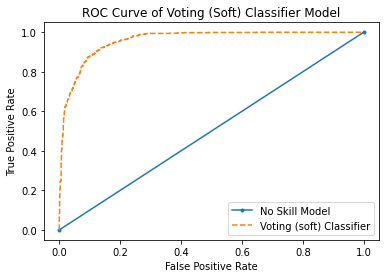

In [161]:
## Confusion Matrix
cm_VOT_soft = confusion_matrix(y_test, y_pred_test_soft )
print("Confusion Matrix : \n", cm_VOT_soft)

## Classification Report
print(classification_report(y_test, y_pred_test_soft))

## probability of falling into a particular class from each observation
probs_VOT_soft = vot_soft.predict_proba(X_test_new_scaled)
probs_VOT_soft = probs_VOT_soft[:,1]

## AUC (Area Under Curve) Score
auc_score_VOT_soft = roc_auc_score(y_test, probs_VOT_soft)
print("Voting (Soft) Classifier ROC AUC = %.3f",format(auc_score_VOT_soft,"0.2f"))

## no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]
ns_auc = roc_auc_score(y_test, ns_probs)
ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
plt.plot(ns_fpr, ns_tpr, marker='.', label='No Skill Model')

## ROC Curve
fpr_VOT_soft, tpr_VOT_soft, __VOT_soft = roc_curve(y_test, probs_VOT_soft)
plt.plot(fpr_VOT_soft, tpr_VOT_soft, linestyle='--', label='Voting (soft) Classifier')
plt.title("ROC Curve of Voting (Soft) Classifier Model")

# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show legend
plt.legend()
# show the plot
plt.show()

In [202]:
combined_result = {'Model_Name':['Logistic (Baseline)','Decision Tree','Random Forest','Support Vector Machine','XgBoost','LightGBM','CatBoost','Voting(Soft)'],
                   'Training_Accuracy':[format(accuracy_score(y_train,predictions_training),"0.2f"), format(accuracy_score(y_train,predictions_training_DTC),"0.2f"), format(accuracy_score(y_train,predictions_training_RFC),"0.2f"), format(accuracy_score(y_train,predictions_training_SVM),"0.2f"), format(accuracy_score(y_train,predictions_training_XGB),"0.2f"),format(accuracy_score(y_train,predictions_training_LGB),"0.2f"),format(accuracy_score(y_train,predictions_training_CTB),"0.2f"), format(training_accuracy_soft,"0.2f")],
                   'Training_Accuracy_from_CV':[format(predictions_training_CV,"0.2f"),format(predictions_training_DTC_CV,"0.2f"),format(predictions_training_RFC_CV,"0.2f"),format(predictions_training_SVM_CV,"0.2f"),format(predictions_training_XGB_CV,"0.2f"),format(predictions_training_LGB_CV,"0.2f"),format(predictions_training_CTB_CV,"0.2f"),format(training_accuracy_soft_CV,"0.2f")],
                   'Testing_Accuracy':[format(accuracy_score(y_test,predictions_testing),"0.2f"), format(accuracy_score(y_test,predictions_testing_DTC),"0.2f"), format(accuracy_score(y_test,predictions_testing_RFC),"0.2f"), format(accuracy_score(y_test,predictions_testing_SVM),"0.2f"), format(accuracy_score(y_test,predictions_testing_XGB),"0.2f"),format(accuracy_score(y_test,predictions_testing_LGB),"0.2f"),format(accuracy_score(y_test,predictions_testing_CTB),"0.2f"), format(testing_accuracy_soft,"0.2f")],
                   'ROC_AUC_Score':[format(auc_score,"0.2f"),format(auc_score_DTC,"0.2f"),format(auc_score_RFC,"0.2f"),format(auc_score_SVM,"0.2f"),format(auc_score_XGB,"0.2f"),format(auc_score_LGB,"0.2f"),format(auc_score_CTB,"0.2f"),format(auc_score_VOT_soft,"0.2f")]
            
                  }

In [203]:
combined_result = pd.DataFrame.from_dict(combined_result)

In [204]:
combined_result

,Model_Name,Training_Accuracy,Training_Accuracy_from_CV,Testing_Accuracy,ROC_AUC_Score
0,Logistic (Baseline),0.82,0.83,0.82,0.88
1,Decision Tree,0.89,0.85,0.86,0.92
2,Random Forest,0.95,0.88,0.89,0.96
3,Support Vector Machine,0.89,0.80,0.86,0.50
4,XgBoost,0.92,0.88,0.89,0.96
5,LightGBM,0.94,0.88,0.89,0.96
6,CatBoost,0.91,0.88,0.90,0.96
7,Voting(Soft),0.94,0.88,0.89,0.96


No overfitting or underfitting issue.

### We will use Soft Voting Classifier as Final Model, as it will give us average probability for a set of features to predict 

# Check Model on Validation Data

In [220]:
X_validation=data_url.copy()
X_validation=X_validation.drop(['url','result'],axis=1)
X_validation_new=X_validation.copy()

X_validation_new = X_validation_new[['UrlLength', 'NumDash', 'NumDots', 'NumUnderscore', 'NumPercent',
       'NumAmpersand', 'NumDashInHostname', 'NumNumericChars', 'IpAddress',
       'NumQueryComponents', 'HostnameLength', 'PathLength', 'QueryLength']]

X_validation_new['NumDots_GrtrEql_4_EDA'] = np.where(X_validation['NumDots']>=4,1,0)
X_validation_new['NumDash_LsEql_1_EDA'] = np.where(X_validation['NumDash']<=1,1,0)
X_validation_new['NumQueryComponents==0_EDA'] = np.where(X_validation['NumQueryComponents']==0,1,0)
X_validation_new['NumNumericChars==0_EDA'] = np.where(X_validation['NumNumericChars']==0,1,0)
X_validation_new['UrlLength_WOE'] = [-0.462714 if i<35 else 0.492540 if 35<=i<60 else 0.085523 if 60<=i<70 else -0.571443 if 70<=i<130 else 0.211513 for i in X_validation['UrlLength']]
X_validation_new['NumDash_WOE'] = [0.506946 if i<2 else -0.216327 if 2<=i<3 else -1.194891 if 3<=i<6 else -3.685051 for i in X_validation['NumDash']]
X_validation_new['NumDots_WOE'] = [-1.319003 if i<2 else -0.019816 if 2<=i<3 else 0.292073 if 3<=i<4 else 1.422297 for i in X_validation['NumDots']]
X_validation_new['NumUnderscore_WOE'] = [0.081354 if i<1 else -0.192783 if 1<=i<2 else -0.869469 for i in X_validation['NumUnderscore']]
X_validation_new['NumAmpersand_WOE'] = [0.114997 if i<1 else -1.146679 for i in X_validation['NumAmpersand']]
X_validation_new['NumDashInHostname_WOE'] = [-0.096186 if i<1 else 1.000892 for i in X_validation['NumDashInHostname']]
X_validation_new['NumNumericChars_WOE'] = [0.707812 if i<2 else -0.494543 if 2<=i<5 else -1.830517 if 5<=i<8 else -3.127076 if 8<=i<9 else -0.777151 if 9<=i<18 else 1.319388 for i in X_validation['NumNumericChars']]
X_validation_new['SubdomainLevel_WOE'] = [0.062771 if i<1 else -0.057979 for i in X_validation['SubdomainLevel']]
X_validation_new['HostnameLength_WOE'] = [-0.705058 if i<11 else -0.120158 if 11<=i<20 else 0.080934 if 20<=i<26 else 0.484893 if 26<=i<30 else 1.202948 for i in X_validation['HostnameLength']]
X_validation_new['PathLength_WOE'] = [-0.873511 if i<8 else -0.203832 if 8<=i<16 else 0.402728 if 16<=i<46 else -0.117753 if 46<=i<60 else -0.833557 for i in X_validation['PathLength']]
X_validation_new['QueryLength_WOE'] = [0.222194 if i<6 else -1.813158 if 6<=i<30 else -0.491447 for i in X_validation['QueryLength']]

x = X_validation.values
predictions=clf.predict(x)
df_validation = pd.DataFrame(clf.decision_function(x), columns = ["ISF_Score"])

## to avoid 'id' mismatch
X_validation_new.reset_index(drop=True,inplace=True)
df_validation.reset_index(drop=True,inplace=True)
X_validation_new=pd.concat([X_validation_new,df_validation],axis=1)
X_validation_new.head()

,UrlLength,NumDash,NumDots,NumUnderscore,NumPercent,NumAmpersand,NumDashInHostname,NumNumericChars,IpAddress,NumQueryComponents,...,NumDots_WOE,NumUnderscore_WOE,NumAmpersand_WOE,NumDashInHostname_WOE,NumNumericChars_WOE,SubdomainLevel_WOE,HostnameLength_WOE,PathLength_WOE,QueryLength_WOE,ISF_Score
0,22,0,2,0,0,0,0,0,0,0,...,-0.019816,0.081354,0.114997,-0.096186,0.707812,-0.057979,-0.120158,-0.873511,0.222194,-0.004410
1,23,0,2,0,0,0,0,0,0,0,...,-0.019816,0.081354,0.114997,-0.096186,0.707812,-0.057979,-0.120158,-0.873511,0.222194,-0.002580
2,24,0,2,0,0,0,0,0,0,0,...,-0.019816,0.081354,0.114997,-0.096186,0.707812,-0.057979,-0.120158,-0.873511,0.222194,-0.002914
3,21,0,2,0,0,0,0,0,0,0,...,-0.019816,0.081354,0.114997,-0.096186,0.707812,-0.057979,-0.120158,-0.873511,0.222194,-0.006296
4,25,0,2,0,0,0,0,0,0,0,...,-0.019816,0.081354,0.114997,-0.096186,0.707812,-0.057979,-0.120158,-0.873511,0.222194,-0.002914


In [229]:
y_pred_validation_soft = vot_soft.predict(X_validation_new)
validation_accuracy_soft = accuracy_score(data_url['result'], y_pred_validation_soft)

Accuracy of Validation set from Voting(soft) Classifier:  0.71


In [230]:
print("Accuracy of Validation set from Voting(soft) Classifier: ", format(validation_accuracy_soft,"0.2f"))

Accuracy of Validation set from Voting(soft) Classifier:  0.71


# Saving Model and Isolation Score Calculating Function as Pickle Files

In [205]:
import pickle

In [206]:
## Save the trained model as pickle string
with open('Phishing_Model.pickle','wb') as f:
    pickle.dump(vot_soft,f)

In [207]:
## Save Isolation Score Calculating function into pickle file
with open('Isolation_Forest_Score.pickle','wb') as file:
    pickle.dump(clf,file)

# Creating requirements.txt

In [ ]:
#pip freeze>requirements.txt